In [58]:
import sys
print(sys.version)

3.8.3 | packaged by conda-forge | (default, Jun  1 2020, 17:21:09) 
[Clang 9.0.1 ]


In [59]:
"""
Created on March 2 2021
@author: Neven Caplar
@contact: ncaplar@princeton.edu

These comments are theoretically the only ones you need to read to run the notebook

1. Specify the directory in which you want to run the analysis below (PSF_DIRECTORY)
2. Name and place the data in DATA_FOLDER. The data is avaliable at https://github.com/nevencaplar/PFS_Work_In_Progress/tree/master/CutsForTigerMay2
3. TESTING_FOLDER will be filled during the run with images from the analysis analysis

4. (OPTIONAL)Next cell contains some extensions that I use that make life much easier when using jupyter notebook 
    Without them this notebook becomes reallllly huge and hard to deal with
    These can be downloaded from https://github.com/ipython-contrib/jupyter_contrib_nbextensions

"""
############################################################
# name your directory where you want to have files!
PSF_DIRECTORY='/Users/nevencaplar/Documents/PFS/'
# place cutouts in this folder - name as you wish
DATA_FOLDER=PSF_DIRECTORY+'TigerAnalysis/CutsForTigerMay2/'
############################################################
    

TESTING_FOLDER=PSF_DIRECTORY+'Testing/'
TESTING_PUPIL_IMAGES_FOLDER=TESTING_FOLDER+'Pupil_Images/'
TESTING_WAVEFRONT_IMAGES_FOLDER=TESTING_FOLDER+'Wavefront_Images/'
TESTING_FINAL_IMAGES_FOLDER=TESTING_FOLDER+'Final_Images/'
import os

for i in [PSF_DIRECTORY,DATA_FOLDER,TESTING_PUPIL_IMAGES_FOLDER,TESTING_WAVEFRONT_IMAGES_FOLDER,TESTING_FINAL_IMAGES_FOLDER]:
    if not os.path.exists(i):
        os.makedirs(i)

In [60]:
%%javascript
try {
  require(['base/js/utils'], function (utils) {
    utils.load_extension('code_prettify/code_prettify');
    utils.load_extension('collapsible_headings/main'); 
    utils.load_extension('codefolding/edit'); 
    utils.load_extension('codefolding/main'); 
    utils.load_extension('execute_time/ExecuteTime');   
    utils.load_extension('toc2/main'); 
  });
}
catch (err) {
  console.log('toc2 load error:', err);
}

<IPython.core.display.Javascript object>

In [61]:
# make notebook nice and wide to fill the entire screen
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [12]:
%load_ext autoreload
%autoreload 2

#import Zernike_Module
#from Zernike_Module import LNP_PFS,LN_PFS_single,create_parInit,downsample_manual_function,Zernike_Analysis,PFSPupilFactory,custom_fftconvolve,stepK,maxK,sky_scale,sky_size,create_x,remove_pupil_parameters_from_all_parameters

import Zernike_Module
import Zernike_Analysis_Module
from Zernike_Module import *
from Residual_1D_module import * 
from Zernike_Analysis_Module import *

# 0.35d or greater

print('Zernike_Module.__version__: '+str(Zernike_Module.__version__))
print('Zernike_Analysis_Module.__version__: '+str(Zernike_Analysis_Module.__version__))

Zernike_Module.__version__: 0.45c
Zernike_Analysis_Module.__version__: 0.26g


In [13]:
import galsim
import numpy as np
np.set_printoptions(suppress=True)
np.seterr(divide='ignore', invalid='ignore')
import pandas as pd
import io
import math
import pickle
import glob
import time

#tqdm is not necesarry, it is the monitor evaluation of the 'for' loops
from tqdm import tqdm

# lsst stack
#import lsst.afw
#from lsst.afw.cameraGeom import PupilFactory
#from lsst.afw.geom import Angle, degrees
#from lsst.afw import geom
#from lsst.afw.geom import Point2D

# astropy
import astropy
import astropy.convolution
from astropy.convolution import Gaussian2DKernel

# scipy and skimage
#from scipy.ndimage import gaussian_filter
import scipy.misc
import skimage.transform

#lmfit
import lmfit

#matplotlib
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
matplotlib.rcParams.update({'font.size': 18})
%config InlineBackend.rc = {}
%matplotlib inline
%config IPython.matplotlib.backend = "retina"

from shutil import copy
from scipy.optimize import curve_fit

from astropy.io import fits

def lin_fit_1D(x, a, b):
    return a * x + b

def lin_fit_1DConstant(x, b):
    return  np.full(len(x),b)

def lin_fit_2D(x,y, a, b,c):
    return a * x + b*y+c



print(np.__version__)
print(skimage.__version__)
print(scipy.__version__)
print(pd.__version__)

1.18.5
0.17.2
1.5.0
1.0.5


# Unit test 

In [7]:
columns=['z4','z5','z6','z7','z8','z9','z10','z11',
          'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
          'radiometricEffect','radiometricExponent','x_ilum','y_ilum',
          'x_fiber','y_fiber','effective_radius_illumination',
          'frd_sigma','frd_lorentz_factor','det_vert','slitHolder_frac_dx',
          'grating_lines','scattering_slope','scattering_amplitude',
          'pixel_effect','fiber_r','flux']  

sci_image_unit=np.ones((20,20))
var_image_unit=np.ones((20,20))
#array([     0.85110826,      0.73047372,     -0.31672873,     -0.00539844, -0.32264156,     -0.04922217,     -0.49565709,      0.18057418,
#            0.79993531,      0.10032969,      0.08769052,      0.25372595,          0.06064503,      0.21049747,   
#           0.45840763,      2.05047984,  0.30893478,     -0.13166649, 
#           -0.06752367,     -0.13093007,            0.89197452, 
#           0.10757197,   0.60969064,      1.06409559,   0.14192374, 
#           109336.61223169,   2.41053199,      0.00379578,
#            0.4673993 ,      1.88555321,      0.99733826])
allparameters_proposal=np.array([7.1,1.09,0.02,-0.1,0.0,0.1,0.02,0.2,
                                 0.7,0.1,0.3,0.0,0.07,0.0,
                                 0.17,0.67,1,1,
                                 0.0,-0.0,0.80,
                                 0.01,0.51,1.06,0.28,
                                 50000,2.5,0.027,
                                 0.37,1.85,1.0])
print('version of the code is: '+str(Zernike_Module.__version__))
model = LN_PFS_single(sci_image_unit,var_image_unit,dithering=1,save=1,verbosity=0,npix=1536)   

res=model(allparameters_proposal,return_Image=True)


print(res[0])

version of the code is: 0.45a
-367.5754132818689


/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:4811: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
/Users/nevencaplar/anaconda2/envs/idp2_pyfftw/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3334: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


In [8]:
pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum.npy')
radiometricEffectArray=np.load(TESTING_PUPIL_IMAGES_FOLDER+'radiometricEffectArray.npy')
optPsf=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf.npy')
ilum_radiometric=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum_radiometric.npy')
wf_full=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_full.npy') 

optPsf_cut_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved.npy')
optPsf_cut_pixel_response_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_pixel_response_convolved.npy')
optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')



res_iapetus=res[1]

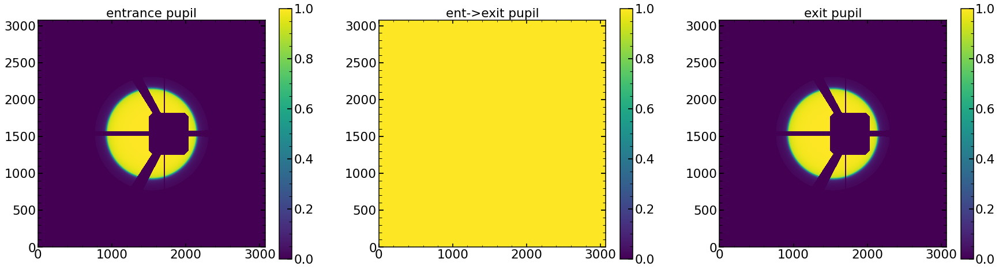

In [9]:
plt.figure(figsize=(30,8))
plt.subplot(131)
plt.imshow(ilum,origin='lower',vmax=1,vmin=0)
plt.title('entrance pupil')
plt.colorbar()
plt.subplot(132)
plt.title('ent->exit pupil')
plt.imshow(radiometricEffectArray,origin='lower',vmax=1,vmin=0)

plt.colorbar()
plt.subplot(133)
plt.title('exit pupil')
plt.imshow(ilum_radiometric,origin='lower',vmax=1,vmin=0)
plt.colorbar()

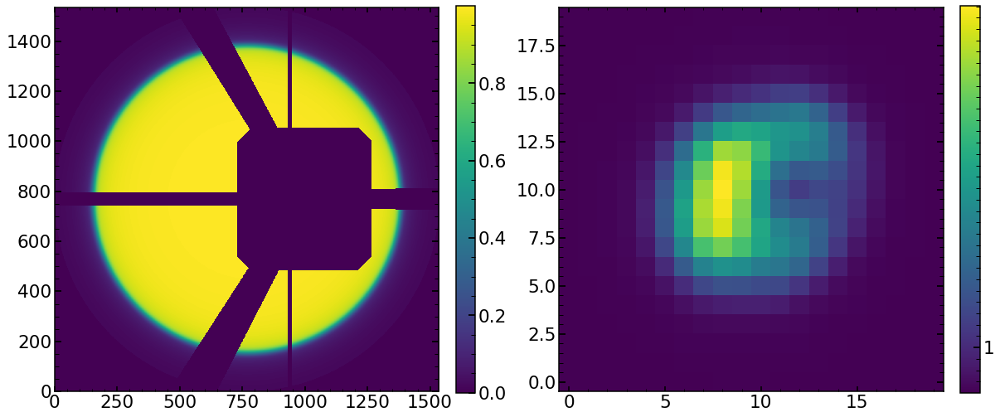

In [10]:
plt.figure(figsize=(20,20))
plt.subplot(121)
plt.imshow(pupililluminated,origin='lower')
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(122)
plt.imshow(res_iapetus,origin='lower')
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10**-2,1,10,10**2,10**3,10**4,10**5])

# Images for Michael/poster

## good recent image 

In [169]:
import Zernike_Module
import Zernike_Analysis_Module
from Zernike_Module import *
from Residual_1D_module import * 
from Zernike_Analysis_Module import *


In [170]:
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/Jan2921/'

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_Jan2921.pkl', 'rb') as f:
    results_of_fit_many_Ar_from_Jan29=pickle.load(f)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Jan2921.pkl', 'rb') as f:
    results_of_fit_many_Ne_from_Jan29=pickle.load(f)    
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Jan2921.pkl', 'rb') as f:
    results_of_fit_many_Kr_from_Jan29=pickle.load(f)    

In [171]:
index_Ar=results_of_fit_many_Ar_from_Jan29['0'].index[np.log10(results_of_fit_many_Ar_from_Jan29['0']['chi2'].values/results_of_fit_many_Ar_from_Jan29['0']['chi2max'].values)==np.min(np.log10(results_of_fit_many_Ar_from_Jan29['0']['chi2'].values/results_of_fit_many_Ar_from_Jan29['0']['chi2max'].values))][0]
results_of_fit_many_Ar_from_Jan29['0'].loc[index_Ar]

z4             0.583624
z5             0.096308
z6             0.091398
z7             0.263171
z8             0.320398
               ...     
z54            0.001800
z55            0.005206
z56           -0.002941
chi2          25.140766
chi2max    26446.005859
Name: 17, Length: 78, dtype: float64

In [172]:
np.log10(results_of_fit_many_Ne_from_Jan29['0']['chi2'].values/results_of_fit_many_Ne_from_Jan29['0']['chi2max'].values)

array([-3.00806192, -2.66874003, -3.06738118, -3.10539325, -3.07116454,
       -2.47254036, -3.31791156, -2.77754443, -2.52807131, -2.89038856,
       -2.72517208, -2.74621489, -2.87233488, -2.55855649, -1.82500239,
       -2.69025609, -2.96441311, -2.70881825, -2.97735303, -2.38059773,
       -2.87933653, -2.93894102, -2.77901462, -2.86100907, -2.77652329,
       -3.11103935, -2.99384834, -2.92132949, -2.8154349 , -2.93036988,
       -2.40417206, -2.78181689, -2.84983238, -2.90295593, -2.37601667,
       -2.11284027, -2.8314205 , -2.86290834, -2.846861  , -2.95046778,
       -2.71094695, -3.07814674, -2.71701931, -2.9773274 , -2.83557419,
       -3.34638737, -2.97153558, -2.85914061, -2.96428887, -2.793518  ])

In [173]:
np.log10(results_of_fit_many_Kr_from_Jan29['0']['chi2'].values/results_of_fit_many_Kr_from_Jan29['0']['chi2max'].values)

array([-2.71640177, -2.6311193 , -2.60856308, -2.39812688, -2.61168323,
       -2.56562577, -2.64008286, -2.31350847, -2.56144452, -2.6611007 ,
       -2.5859382 , -2.31712543, -2.4566981 , -2.67333607, -2.67230274,
       -2.66437244, -2.37495001, -2.57205723, -2.24582693, -2.38324195,
       -2.62279973, -2.41937831, -2.62530361, -2.75398965, -2.49577041,
       -2.25643948, -2.58337808, -2.62238771, -2.34785296, -2.75781324,
       -2.66276193, -2.53174245, -2.2918885 , -2.45378403, -2.81628106])

In [174]:
finalAr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalAr_Feb2020",allow_pickle=True)
finalNe=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalNe_Feb2020",allow_pickle=True)
finalKr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalKr_Feb2020",allow_pickle=True)

In [175]:
date='Jan2920'
#obs=34313
#obs_int=int(obs)
single_number='17'
image_index=int(single_number)
eps=6
arc='Ar'
dataset=6

if arc=='Ar':
    obs=34341+96
    finalArc=finalAr
if arc=='Ne':
    obs=34217+96 
    finalArc=finalNe
if arc=='Kr':
    obs=34561+96
    finalArc=finalKr



list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

finalArc.loc[int(single_number)]

fiber                    63
xc                      463
yc                     1631
wavelength        763.74286
close                     1
lamp                     Ar
xc_effective            463
second_offset             0
second_ratio              0
second2_offset            0
second2_ratio             0
Name: 17, dtype: object

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: 0
self.single_number: 17
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34389
double_sources_positions_ratios for this spot is: [0.0 0.0]


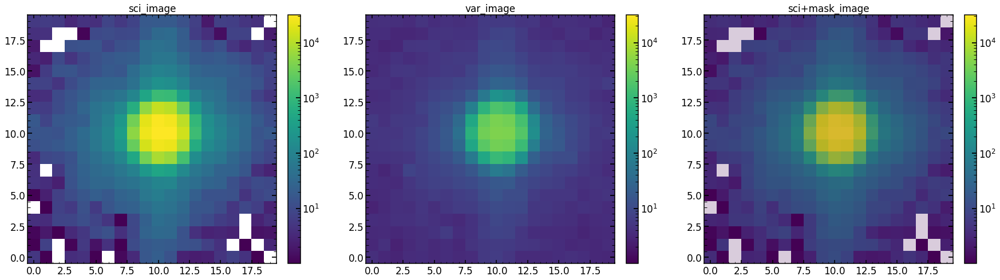

In [176]:
single_analysis=Zernike_Analysis(date=date,obs='0',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)
single_analysis.create_basic_data_image()

In [177]:
double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
columns,columns22,columns22_analysis=single_analysis.return_columns()

chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
#chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
len_of_chains=single_analysis.len_of_chains()

minchain_parametrization,like_min=single_analysis.create_likelihood()

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437176ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437176ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437176ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 4122.876157844915
average chi2 reduced is: 24.2922622090499


In [178]:
index_of_single_image=4

model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,dithering=1,save=1,zmax=56,verbosity=1,\
                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,test_run=False)   

#list_of_minchain=model_multi.create_list_of_allparameters(t1,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_long,zmax=56)


model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],dithering=1,save=1,zmax=22,verbosity=1,\
                      double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)  

res_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True)

Science image shape is: (20, 20)
Top left pixel value of the science image is: 5.3227744
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 3.9924357
Mask image shape is: (20, 20)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.41e
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 22

Entering lnlike_Neven
allparameters [     0.58362374      0.09630755      0.09139815      0.26317125
      0.32039777     -0.03798492     -0.24393043     -0.26068724
     -0.12436885     -0.04368618      0.00261616      0.03377038
     -0.01841272      0.01998359      0.00523577      0.00619805
     -0.01447286      0.03254536      0.01453803      0.66804131
      0.08945204     -0.14769607      0.00216925      0.05676446
      0.03591548      0.1134056       0.08830516      0.
   

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.20524952 -4.70638058] / 8.980556
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 3.79475048 -9.20545244] / 14884.307
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.30524952 -5.15628775] / 85.79798
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.96700114 -4.82548018] / 15.207642
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.11161069 -4.75319032] / 10.235699
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.16416466 -4.72691875] / 9.345625
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.18644688 -4.71577994] / 9.111621
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.19648444 -4.7107622 ] / 9.034089
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.20112906 -4.70844037] / 9.004073
chi2 within shgo optimization routine (chi_2_almost_multi_val

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.998592479001673
Finished with lnlike_Neven
chi_2_almost/d.o.f is 23.298021; chi_2_almost_max_dof is 26474.604 log(improvment) is -3.0555105
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4556363200
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4556363200 is: 5.09263014793396 seconds
 


In [27]:
sci_image=list_of_sci_images[index_of_single_image]
var_image=list_of_var_images[index_of_single_image]
res_iapetus=res_with_Image[1]



size=sci_image.shape[0]
#if size==40:
#    dithering=2
#else:
#    dithering=1
#dithering=1

if size==20:
    x_center=find_centroid_of_flux(res_iapetus)[0]
else:
    x_center=(size/2)

left_limit=np.round(x_center-3.5)+0.5
right_limit=np.round(x_center+3.5)-0.5               


plt.figure(figsize=(14,14))

<Figure size 1008x1008 with 0 Axes>

<Figure size 1008x1008 with 0 Axes>

In [28]:
init_lamda,std_init_lamda,init_removal_lamda,std_init_removal_lamda=residual_1D(sci_image,var_image,res_iapetus)

x_center=find_centroid_of_flux(res_iapetus)[0]  
left_limit=np.int(x_center-3.5)
right_limit=np.int(x_center+3.5) 
multiplicative_factor_to_renormalize_to_50000=np.max(sci_image)/50000
sci_image_smaller=sci_image[:,left_limit:right_limit]/multiplicative_factor_to_renormalize_to_50000
var_image_smaller=var_image[:,left_limit:right_limit]/multiplicative_factor_to_renormalize_to_50000

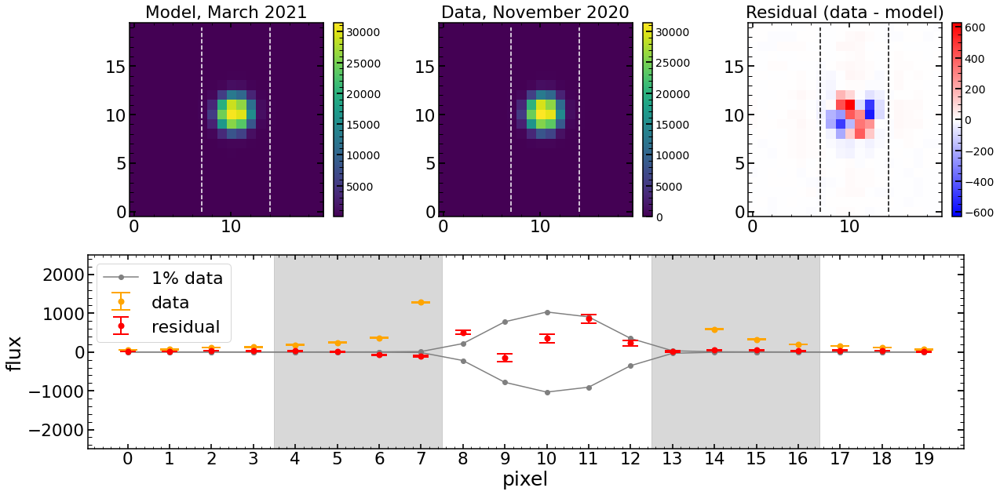

In [29]:
from matplotlib import gridspec
fig=plt.figure(figsize=(20,10))



ax1 = plt.subplot2grid((2, 3), (0, 0))
ax2 = plt.subplot2grid((2, 3), (0, 1))
ax3 = plt.subplot2grid((2, 3), (0, 2))
ax4 = plt.subplot2grid((2, 3), (1, 0), colspan=3)


im1=ax1.imshow(res_iapetus,origin='lower',vmax=np.max(np.abs(sci_image)))
ax1.plot(np.ones(len(sci_image))*(left_limit+1),np.array(range(len(sci_image))),'--',color='white')
ax1.plot(np.ones(len(sci_image))*(right_limit+1),np.array(range(len(sci_image))),'--',color='white')
cb=fig.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04) 
cb.ax.tick_params(labelsize=14)
ax1.set_title('Model, March 2021')
#ax1.grid(False)



im2=ax2.imshow(sci_image,origin='lower',vmax=np.max(np.abs(sci_image)))
ax2.plot(np.ones(len(sci_image))*(left_limit+1),np.array(range(len(sci_image))),'--',color='white')
ax2.plot(np.ones(len(sci_image))*(right_limit+1),np.array(range(len(sci_image))),'--',color='white')
cb=fig.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04) 
cb.ax.tick_params(labelsize=14)
ax2.set_title('Data, November 2020')
ax2.grid(False)


im3=ax3.imshow(sci_image-res_iapetus,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image))/50,vmax=np.max(np.abs(sci_image))/50)
ax3.plot(np.ones(len(sci_image))*(left_limit+1),np.array(range(len(sci_image))),'--',color='black')
ax3.plot(np.ones(len(sci_image))*(right_limit+1),np.array(range(len(sci_image))),'--',color='black')
ax3.set_title('Residual (data - model)')
cb=fig.colorbar(im3, ax=ax3, fraction=0.046, pad=0.04) 
cb.ax.tick_params(labelsize=14)

ax4.errorbar(np.array(range(len(init_lamda))),init_lamda,yerr=std_init_lamda,fmt='o',elinewidth=2,capsize=12,markeredgewidth=2,label='data',color='orange')
ax4.plot(np.array(range(len(init_lamda))),init_lamda*0.01,color='gray',label='1% data',marker='o')
ax4.plot(np.array(range(len(init_lamda))),-init_lamda*0.01,color='gray',marker='o')    
plt.errorbar(np.array(range(len(init_removal_lamda))),init_removal_lamda,yerr=std_init_removal_lamda,color='red',fmt='o',elinewidth=2,capsize=10,markeredgewidth=2,label='residual')

ax4.set_ylim(-2500,2500)
ax4.set_ylabel('flux',size=25)
ax4.set_xlabel('pixel',size=25)
ax4.set_xticks(range(20))
position_of_max_flux=np.where(init_lamda==np.max(init_lamda))[0][0]
difference_from_max=range(20)-position_of_max_flux
pixels_to_test=np.array(range(20))[(np.abs(difference_from_max)>2)&(np.abs(difference_from_max)<=6)]
plt.axvspan(pixels_to_test[0]-0.5, pixels_to_test[3]+0.5, alpha=0.3, color='grey')
plt.axvspan(pixels_to_test[4]-0.5, pixels_to_test[7]+0.5, alpha=0.3, color='grey')
plt.legend(loc=2, fontsize=22)

## good recent in defocus 

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 17
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0.0 0.0]


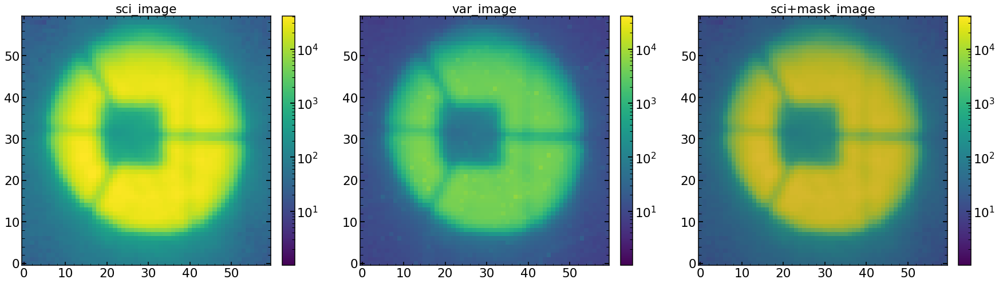

In [21]:
single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)
sci_image,var_image,mask_image=single_analysis.create_basic_data_image(return_Images=True)

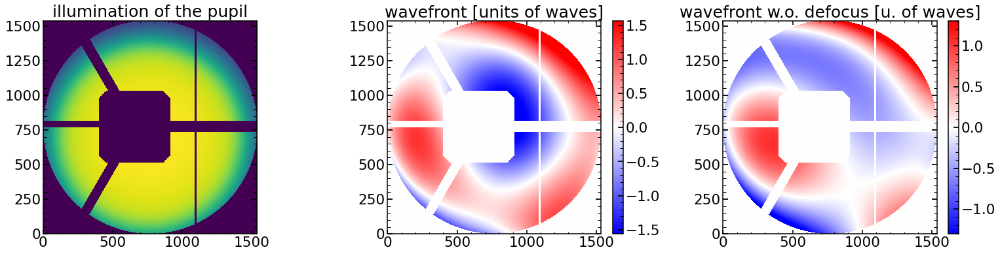

In [22]:
ilum_zoom,wavefront_zoom,wavefront_0_zoom  = single_analysis.illumination_wavefront_plot(return_Images=True)

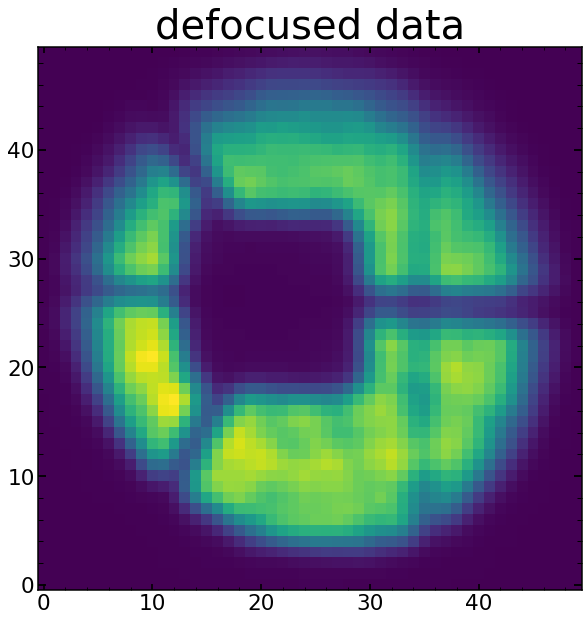

In [23]:
plt.figure(figsize=(10,10))
plt.title('defocused data',fontsize=40)
plt.imshow(sci_image[5:55,5:55],origin='lower',vmin=1,vmax=np.max(sci_image))

([], <a list of 0 Text major ticklabel objects>)

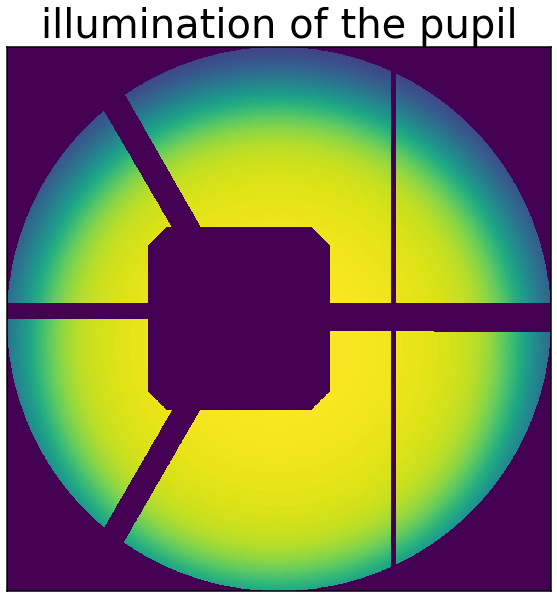

In [24]:
plt.figure(figsize=(10,10))
plt.imshow(ilum_zoom,origin='lower',vmax=1,vmin=0)
plt.title('illumination of the pupil',fontsize=40)
plt.xticks([])
plt.yticks([])

([], <a list of 0 Text major ticklabel objects>)

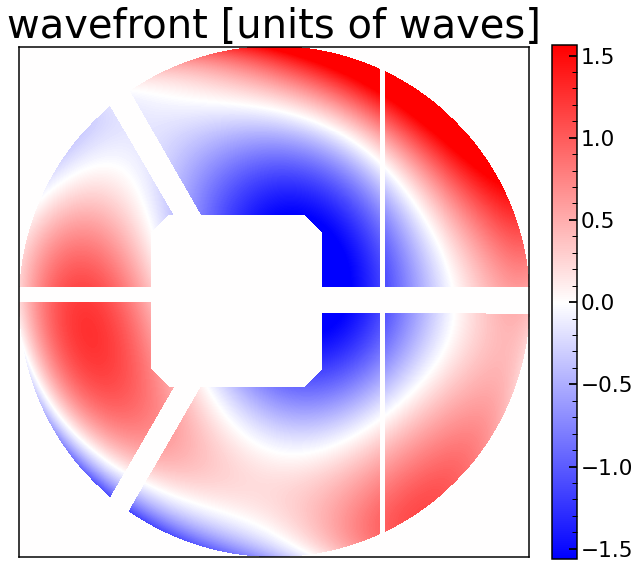

In [25]:
plt.figure(figsize=(10,10))
plt.imshow(wavefront_zoom,origin='lower',cmap=plt.get_cmap('bwr'),vmax=np.max(np.abs(wavefront_zoom))*0.75,vmin=-np.max(np.abs(wavefront_zoom))*0.75)

plt.colorbar(fraction=0.046, pad=0.04)
plt.title('wavefront [units of waves]',fontsize=40)
plt.xticks([])
plt.yticks([])

In [ ]:
,return_Images=False

## Mar 06

In [12]:
import Zernike_Module_v028
import Zernike_Analysis_Module_022b
from Zernike_Module_v028 import *
from Residual_1D_module import * 
from Zernike_Analysis_Module_022b import *


In [13]:
sci_image_old =np.load('/Users/nevencaplar/Documents/PFS/ReducedData/Data_Aug_14/Stamps_cleaned/sci2140017HgAr_Stacked.npy')
mask_image_old =np.load('/Users/nevencaplar/Documents/PFS/ReducedData/Data_Aug_14/Stamps_cleaned/mask2140017HgAr_Stacked.npy')
var_image_old =np.load('/Users/nevencaplar/Documents/PFS/ReducedData/Data_Aug_14/Stamps_cleaned/var2140017HgAr_Stacked.npy')

In [14]:
with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Apr15_Focus/' + 'results_of_fit_many_direct_HgAr_from_Apr15.pkl', 'rb') as f:
    results_of_fit_many_direct_HgAr_from_Apr1520=pickle.load(f)

NameError: name 'pickle' is not defined

In [15]:
results_of_fit_many_direct_HgAr_from_Apr1520.loc[17]

NameError: name 'results_of_fit_many_direct_HgAr_from_Apr1520' is not defined

In [131]:
minchain=results_of_fit_many_direct_HgAr_from_Apr1520.loc[17].values[:-2]
minchain

array([    0.46899423,     0.04517438,     0.05840604,     0.31828815,
           0.35576521,    -0.01927996,    -0.27101619,    -0.23279941,
          -0.1362587 ,    -0.03562265,     0.01158498,     0.0240104 ,
          -0.01938301,     0.02229256,    -0.00209219,    -0.00587332,
          -0.0242157 ,     0.03498719,     0.0278716 ,     0.67830432,
           0.08879704,    -0.15143947,     0.0098843 ,     0.05526952,
           0.04301217,     0.0000172 ,     0.0000172 ,     0.97608598,
           0.94835579,     0.0045966 ,    -0.07158372,     0.92811379,
           0.07822675,     0.73715088,     1.00114411,     0.5091121 ,
       52199.86717144,     2.19374285,     0.00179639,     0.35000173,
           1.82131383,     0.99829198])

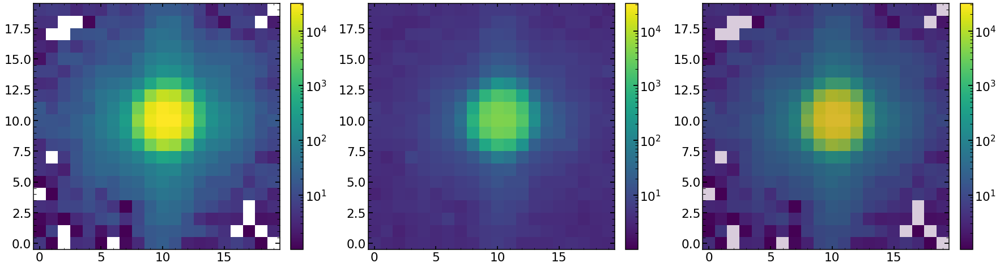

In [132]:
plt.figure(figsize=(30,8))
plt.subplot(131)
plt.imshow(sci_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(132)
plt.imshow(var_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(133)
plt.imshow(sci_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.imshow(mask_image,origin='lower',vmin=0,vmax=np.max(mask_image),alpha=0.2)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
#cbar.set_ticks([10,10**2,10**3,10**4,10**5])

In [133]:
model = LN_PFS_single(sci_image,var_image,mask_image=mask_image,dithering=1,save=1,zmax=22,verbosity=1,\
                      double_sources=None,double_sources_positions_ratios=[0,0],npix=1536,simulation_00=0)   
#minchain_new=np.copy(minchain)   
#minchain_new[0]=10
#minchain_new[1]=5

model(minchain)

npix_value:1536
Science image shape is: (20, 20)
Top left pixel value of the science image is: 5.3227744
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 3.9924357
Mask image shape is: (20, 20)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 22

Entering lnlike_Neven
allparameters [    0.46899423     0.04517438     0.05840604     0.31828815
     0.35576521    -0.01927996    -0.27101619    -0.23279941
    -0.1362587     -0.03562265     0.01158498     0.0240104
    -0.01938301     0.02229256    -0.00209219    -0.00587332
    -0.0242157      0.03498719     0.0278716      0.67830432
     0.08879704    -0.15143947     0.0098843      0.05526952
     0.04301217     0.0000172      0.0000172      0.97608598
     0.94835579     0.0045966     -0.07158372     0.92811379
     0.07822675     0.73715088     1.00114411  

-4633.744183951676

In [134]:
pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum.npy')
r_ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'r_ilum.npy')
radiometricEffectArray=np.load(TESTING_PUPIL_IMAGES_FOLDER+'radiometricEffectArray.npy')
ilum_radiometric=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum_radiometric.npy')

wf=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf.npy') 
wf_full=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_full.npy') 
u_manual=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'u_manual.npy')
wf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_grid.npy')   
expwf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'expwf_grid.npy')      

optPsf=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf.npy')
optPsf_cut=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut.npy')
optPsf_cut_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_downsampled.npy')
scattered_light=np.load(TESTING_FINAL_IMAGES_FOLDER+'scattered_light.npy')
optPsf_cut_downsampled_scattered=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_downsampled_scattered.npy')
optPsf_cut_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved.npy')
optPsf_cut_pixel_response_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_pixel_response_convolved.npy')
optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
res_iapetus=optPsf_cut_fiber_convolved_downsampled


#optPsf_cut_grating_convolved_simulation_cut=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved_simulation_cut.npy')
#res_iapetus=optPsf_cut_grating_convolved_simulation_cut

In [135]:
minchain

array([    0.46899423,     0.04517438,     0.05840604,     0.31828815,
           0.35576521,    -0.01927996,    -0.27101619,    -0.23279941,
          -0.1362587 ,    -0.03562265,     0.01158498,     0.0240104 ,
          -0.01938301,     0.02229256,    -0.00209219,    -0.00587332,
          -0.0242157 ,     0.03498719,     0.0278716 ,     0.67830432,
           0.08879704,    -0.15143947,     0.0098843 ,     0.05526952,
           0.04301217,     0.0000172 ,     0.0000172 ,     0.97608598,
           0.94835579,     0.0045966 ,    -0.07158372,     0.92811379,
           0.07822675,     0.73715088,     1.00114411,     0.5091121 ,
       52199.86717144,     2.19374285,     0.00179639,     0.35000173,
           1.82131383,     0.99829198])

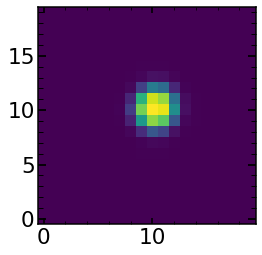

In [136]:
plt.imshow(res_iapetus)

In [137]:
init_lamda,std_init_lamda,init_removal_lamda,std_init_removal_lamda=residual_1D(sci_image,var_image,res_iapetus)

x_center=find_centroid_of_flux(res_iapetus)[0]  
left_limit=np.int(x_center-3.5)
right_limit=np.int(x_center+3.5) 
multiplicative_factor_to_renormalize_to_50000=np.max(sci_image)/50000
sci_image_smaller=sci_image[:,left_limit:right_limit]/multiplicative_factor_to_renormalize_to_50000
var_image_smaller=var_image[:,left_limit:right_limit]/multiplicative_factor_to_renormalize_to_50000

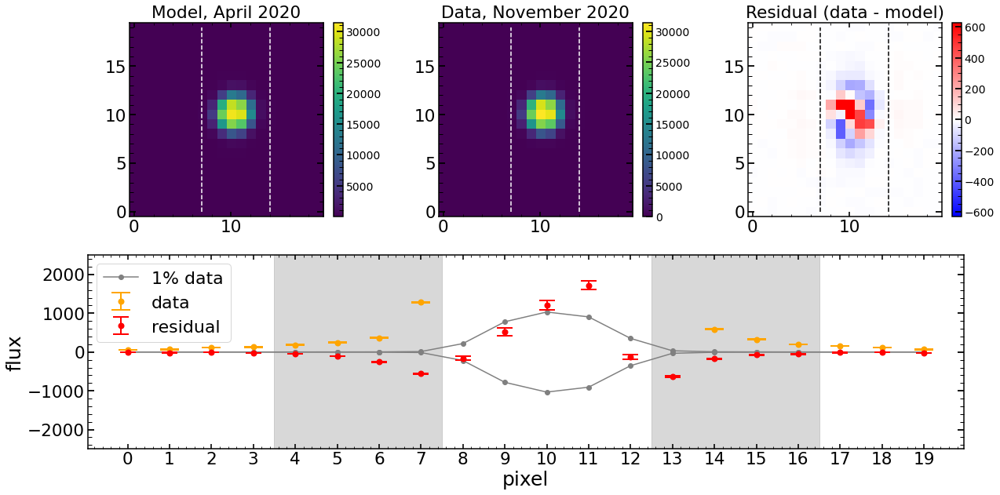

In [138]:


from matplotlib import gridspec
fig=plt.figure(figsize=(20,10))



ax1 = plt.subplot2grid((2, 3), (0, 0))
ax2 = plt.subplot2grid((2, 3), (0, 1))
ax3 = plt.subplot2grid((2, 3), (0, 2))
ax4 = plt.subplot2grid((2, 3), (1, 0), colspan=3)


im1=ax1.imshow(res_iapetus,origin='lower',vmax=np.max(np.abs(sci_image)))
ax1.plot(np.ones(len(sci_image))*(left_limit+1),np.array(range(len(sci_image))),'--',color='white')
ax1.plot(np.ones(len(sci_image))*(right_limit+1),np.array(range(len(sci_image))),'--',color='white')
cb=fig.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04) 
cb.ax.tick_params(labelsize=14)
ax1.set_title('Model, April 2020')
#ax1.grid(False)



im2=ax2.imshow(sci_image,origin='lower',vmax=np.max(np.abs(sci_image)))
ax2.plot(np.ones(len(sci_image))*(left_limit+1),np.array(range(len(sci_image))),'--',color='white')
ax2.plot(np.ones(len(sci_image))*(right_limit+1),np.array(range(len(sci_image))),'--',color='white')
cb=fig.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04) 
cb.ax.tick_params(labelsize=14)
ax2.set_title('Data, November 2020')
ax2.grid(False)


im3=ax3.imshow(sci_image-res_iapetus,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image))/50,vmax=np.max(np.abs(sci_image))/50)
ax3.plot(np.ones(len(sci_image))*(left_limit+1),np.array(range(len(sci_image))),'--',color='black')
ax3.plot(np.ones(len(sci_image))*(right_limit+1),np.array(range(len(sci_image))),'--',color='black')
ax3.set_title('Residual (data - model)')
cb=fig.colorbar(im3, ax=ax3, fraction=0.046, pad=0.04) 
cb.ax.tick_params(labelsize=14)

ax4.errorbar(np.array(range(len(init_lamda))),init_lamda,yerr=std_init_lamda,fmt='o',elinewidth=2,capsize=12,markeredgewidth=2,label='data',color='orange')
ax4.plot(np.array(range(len(init_lamda))),init_lamda*0.01,color='gray',label='1% data',marker='o')
ax4.plot(np.array(range(len(init_lamda))),-init_lamda*0.01,color='gray',marker='o')    
plt.errorbar(np.array(range(len(init_removal_lamda))),init_removal_lamda,yerr=std_init_removal_lamda,color='red',fmt='o',elinewidth=2,capsize=10,markeredgewidth=2,label='residual')

ax4.set_ylim(-2500,2500)
ax4.set_ylabel('flux',size=25)
ax4.set_xlabel('pixel',size=25)
ax4.set_xticks(range(20))
position_of_max_flux=np.where(init_lamda==np.max(init_lamda))[0][0]
difference_from_max=range(20)-position_of_max_flux
pixels_to_test=np.array(range(20))[(np.abs(difference_from_max)>2)&(np.abs(difference_from_max)<=6)]
plt.axvspan(pixels_to_test[0]-0.5, pixels_to_test[3]+0.5, alpha=0.3, color='grey')
plt.axvspan(pixels_to_test[4]-0.5, pixels_to_test[7]+0.5, alpha=0.3, color='grey')
plt.legend(loc=2, fontsize=22)

# poor results in red part of the detector - initial

In [ ]:
################################
Likelihoods returned per individual images are: [-86573.0390625  -43154.76953125 -14508.265625    -6258.16503906
  -2567.50537109  -6046.69189453 -40179.984375   -62832.9609375
 -85816.03125   ]
Mean likelihood is -38659.712565104164
################################
Renormalized likelihoods returned per individual images are: [-1436.03061805  -907.25693449  -409.26378577 -2604.44751977
 -2567.50537109 -3167.99729147 -1339.69326885 -1586.52086481
 -1676.59361709]
Renormalization factors are: [60.28634625 47.56620522 35.44966872  2.40287623  1.          1.90867963
 29.99192823 39.60424494 51.18475364]
Mean renormalized likelihood is -1743.9232523790238
array_of_psf_positions_output: [[ -9.28515283  -9.76126956]
 [ -5.30354758  -2.30427199]
 [ -1.56061473 -12.83151944]
 [  1.2281891   -3.08969462]
 [ -3.53079547  -4.77720202]
 [  0.31123736   3.12647859]
 [  3.13017795  -3.56910715]
 [  7.28607041   4.12405647]
 [  2.37247796  -6.59694915]]
    
    
################################
Likelihoods returned per individual images are: [-101865.796875    -48690.83984375  -15585.49609375   -6253.45898438
   -2575.41796875   -5282.85986328  -38641.69921875  -60384.0703125
  -83345.046875  ]
Mean likelihood is -40291.63178168403
################################
Renormalized likelihoods returned per individual images are: [-1689.69929701 -1023.64356418  -439.65138903 -2602.48901079
 -2575.41796875 -2767.80858526 -1288.40329695 -1524.6868208
 -1628.31782794]
Renormalization factors are: [60.28634625 47.56620522 35.44966872  2.40287623  1.          1.90867963
 29.99192823 39.60424494 51.18475364]
Mean renormalized likelihood is -1726.6797511906932
array_of_psf_positions_output: [[-10.66927255  -9.70450184]
 [ -6.53838697  -2.20832579]
 [ -2.6444103  -12.7382704 ]
 [  0.99999226  -2.98600595]
 [ -3.53090569  -4.78929412]
 [  0.70474709   2.88182048]
 [  4.11774419  -3.82597835]
 [  8.45946962   3.85244548]
 [  3.74328533  -6.88898143]]

In [181]:
from schwimmbad import MultiPool
#import mpi4py
from functools import partial

In [183]:
def f(x,y):
    return x+y

In [225]:
from multiprocessing import Pool
pool=Pool(4)

def f(x,y):
    return x*y

In [228]:
# random values
array_x=np.array([1.23,234.43])
array_y=np.arange(0,3,1)

In [229]:
out1=map(partial(f,array_x),array_y)
out2=np.array(list(out1))

out2

array([[  0.  ,   0.  ],
       [  1.23, 234.43],
       [  2.46, 468.86]])

In [230]:
out1=pool.map(partial(f,array_x),array_y)
out2=np.array(list(out1))

KeyboardInterrupt: 

In [219]:
out1=map(partial(f,array_x),array_y)
out2=np.array(list(out1))

out2

array([[ 7.65,  7.65,  7.65,  7.65,  7.65,  7.65,  7.65,  7.65,  7.65,
         7.65],
       [ 8.65,  8.65,  8.65,  8.65,  8.65,  8.65,  8.65,  8.65,  8.65,
         8.65],
       [ 9.65,  9.65,  9.65,  9.65,  9.65,  9.65,  9.65,  9.65,  9.65,
         9.65],
       [10.65, 10.65, 10.65, 10.65, 10.65, 10.65, 10.65, 10.65, 10.65,
        10.65],
       [11.65, 11.65, 11.65, 11.65, 11.65, 11.65, 11.65, 11.65, 11.65,
        11.65],
       [12.65, 12.65, 12.65, 12.65, 12.65, 12.65, 12.65, 12.65, 12.65,
        12.65],
       [13.65, 13.65, 13.65, 13.65, 13.65, 13.65, 13.65, 13.65, 13.65,
        13.65],
       [14.65, 14.65, 14.65, 14.65, 14.65, 14.65, 14.65, 14.65, 14.65,
        14.65],
       [15.65, 15.65, 15.65, 15.65, 15.65, 15.65, 15.65, 15.65, 15.65,
        15.65],
       [16.65, 16.65, 16.65, 16.65, 16.65, 16.65, 16.65, 16.65, 16.65,
        16.65]])

# Testing 0.41 

In [7]:
date='Jan2920'
#obs=34313
#obs_int=int(obs)
single_number='11'
image_index=int(single_number)
eps=6
arc='Ar'
dataset=6

if arc=='Ar':
    obs=34341+96
    finalArc=finalAr
if arc=='Ne':
    obs=34217+96 
    finalArc=finalNe
if arc=='Kr':
    obs=34561+96
    finalArc=finalKr



list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

finalArc.loc[int(single_number)]


NameError: name 'finalAr' is not defined

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 11
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]


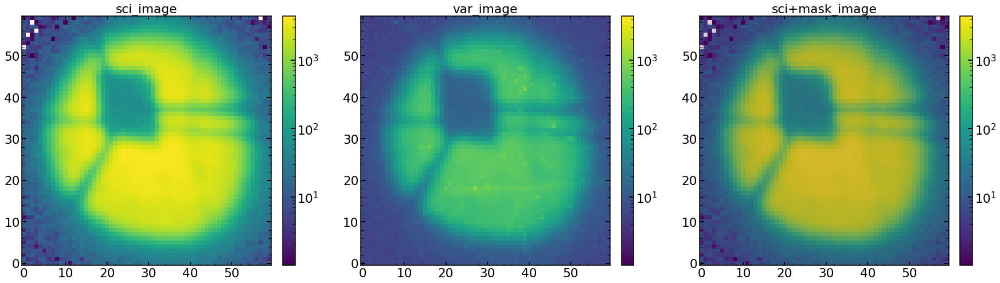

In [242]:
single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)
single_analysis.create_basic_data_image()

In [243]:
double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
columns,columns22,columns22_analysis=single_analysis.return_columns()

chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
#chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
len_of_chains=single_analysis.len_of_chains()

minchain_parametrization,like_min=single_analysis.create_likelihood()

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437116ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437116ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437116ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 1726.404694340507
average chi2 reduced is: 6.912630005411592


In [244]:
model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,dithering=1,save=1,zmax=56,verbosity=1,\
                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,test_run=False)   

#list_of_minchain=model_multi.create_list_of_allparameters(t1,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
#list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=['m4','p4'],zmax=56)

#list_of_minchain_changed=np.copy(list_of_minchain)
#for i in range(9):
#    list_of_minchain_changed[i][35]=-0.8

res_multi=model_multi(list_of_minchain,return_Images=True)


mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

#model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],dithering=1,save=1,zmax=22,verbosity=1,\
#                      double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)  

#res_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True)

################################
analyzing image 1 out of 9
 
Science image shape is: (60, 60)
Top left pixel value of the science image is: 11.366353
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 6.2264752
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.41
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [   31.56312038    -2.88096594    -1.47991177    -0.28865244
     0.66206552    -0.48654684    -0.59783443     0.81060786
     0.05343278     0.19891624    -0.10302568    -0.02961167
     0.00181775     0.07589772     0.07340874    -0.04220434
    -0.082495      -0.01774715     0.14683251     0.70255835
     0.10599709    -0.21711041     0.27352715     0.0627802
     0.10376147     0.09

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.59186547  -9.23590242] / 74.43178
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.0034285   -9.74900811] / 75.18915
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.41499153 -9.44114469] / 79.41119
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.0034285   -9.23590242] / 75.91934
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.0034285   -9.64638697] / 75.18089
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.59186547  -9.64638697] / 73.64686
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.88608395  -9.85162924] / 73.85212
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.18030244  -9.23590242] / 75.397156
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.29764698  -9.54376583] / 74.18396
chi2 within shgo optimization routine (chi_2_al

We are fitting for only one source
One source fitting result is [-10.66927255  -9.70450184]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 1.039468765258789
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9963348306337698
Finished with lnlike_Neven
chi_2_almost/d.o.f is 129.77779; chi_2_almost_max_dof is 15660.25 log(improvment) is -2.0815983
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4490204608
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4490204608 is: 12.119972944259644 seconds
 
##############

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.76534189 -2.17218773] / 65.969955
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.50513643 -2.20879763] / 65.7405
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.50513643 -2.30642405] / 65.78191
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.5701878  -2.18744185] / 65.74258
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.48345265 -2.15083195] / 65.76273
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.56476685 -2.22176364] / 65.739716
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.49971549 -2.24311942] / 65.74742
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.55256972 -2.20136125] / 65.73709
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.61220014 -2.21432725] / 65.76024
chi2 within shgo optimization routine (chi_2_almost_multi_value

Time to apodize the pupil: 0.14586687088012695
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.3182368278503418
Time for pupil and illumination calculation is 0.3246736526489258

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, 23.680604680844993, -2.388548017975702, -1.2456888713881011, -0.3023022002718412, 0.5985389748658869, -0.4759012944381177, -0.5933313464055954, 0.7438932736161812, 0.044790320862015724, 0.19980665672430448, -0.0890053438301967, -0.019152196432930247, 0.010564935647408222, 0.0668292011739714, 0.06305157737780874, -0.03976485735341798, -0.07167567674824891, -0.01026971346915292, 0.11939570806324319, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, -2.388548017975702, -1.2456888713881011, -0.3023022002718412

chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.64440497 -12.73826511] / 62.23587
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.64441074 -12.73826824] / 62.23585
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.64440689 -12.73826615] / 62.23585
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.64440978 -12.73826772] / 62.23585
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.64440881 -12.7382672 ] / 62.23586
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.64441052 -12.73826932] / 62.235855
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.64441201 -12.73827252] / 62.23586
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.64440961 -12.73826853] / 62.235855
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.64441121 -12.73827119] / 62.23585
chi2 within shgo optimization routine (chi_2

Finished with _getOptPsf_naturalResolution
 
 
Entering optPsf_postprocessing
optPsf.shape: (3072, 3072)
oversampling_original: 35.374287997579025
size_of_central_cut: 990
optPsf_cut.shape(991, 991)
oversampling:9.0
optPsf_cut.shape[0]991
size_of_optPsf_cut_downsampled: 252.0
optPsf_cut_downsampled.shape: (253, 253)
size_of_optPsf_cut_in_Microns: 421.6666666666667
postprocessing parameters:
['grating_lines', 'scattering_slope', 'scattering_amplitude', 'pixel_effect', 'fiber_r']
[25718.097651645247, 2.3157202948525044, 0.007171277681464721, 0.4893968824173391, 1.8421537702381563]
type(pointsx): <class 'numpy.float32'>
optPsf_cut_downsampled_scattered.shape:(253, 253)
simulation_00 parameter:None
are we invoking double sources (1 or True if yes): False
double source position/ratio is:[0 0]
Time for postprocessing up to single_Psf_position protocol is 0.11432480812072754
offset_initial_and_sci: [ 0.05911438 -0.30135926]
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.988902199570035
Finished with lnlike_Neven
chi_2_almost/d.o.f is 87.637184; chi_2_almost_max_dof is 6205.055 log(improvment) is -1.8500572
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4490204608
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4490204608 is: 8.883414030075073 seconds
 
################################
analyzing image 5 out of 9
 
Science image shape is: (20, 20)
Top left pixel value of the science image is: -1.7947999
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 3.0357723
Mask image shape is: (20, 20)
Sum of mask ima

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.25889272 -4.34022857] / 14.548615
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.2588927  -4.34022858] / 14.548618
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.2588927  -4.33549428] / 14.5591545
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.2588927  -4.33788856] / 14.553802
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.2588927  -4.33907191] / 14.551174
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.2588927  -4.33965683] / 14.54988
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.2588927  -4.33994595] / 14.549242
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.2588927  -4.34008887] / 14.548925
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.2588927  -4.34015952] / 14.54877
chi2 within shgo optimization routine (chi_2_almost_mult

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9935987503343457
Finished with lnlike_Neven
chi_2_almost/d.o.f is 40.211834; chi_2_almost_max_dof is 2835.6274 log(improvment) is -1.8482953
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4490204608
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4490204608 is: 9.105855941772461 seconds
 
################################
analyzing image 6 out of 9
 
Science image shape is: (20, 20)
Top left pixel value of the science image is: 1.330365
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 3.4698658
Mask image shape is: (20, 20)
Sum of mask ima

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-0.15960794  3.75373008] / 31.199614
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.04478088 3.41309155] / 28.62127
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.13774974 3.25814777] / 27.801722
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.18123176 3.18567976] / 27.504288
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.20186907 3.15128521] / 27.3823
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.21173215 3.1348472 ] / 27.328354
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.21646159 3.12696502] / 27.30349
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.21873302 3.12317941] / 27.291782
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.21873303 3.12317941] / 27.291782
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.21873

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9851461959459248
Finished with lnlike_Neven
chi_2_almost/d.o.f is 85.40188; chi_2_almost_max_dof is 4191.829 log(improvment) is -1.6909362
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4490204608
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4490204608 is: 7.6507182121276855 seconds
 
################################
analyzing image 7 out of 9
 
Science image shape is: (50, 50)
Top left pixel value of the science image is: 5.400126
Variance image shape is: (50, 50)
Top left pixel value of the variance image is: 4.6791987
Mask image shape is: (50, 50)
Sum of mask imag

chi2 within shgo optimization routine (chi_2_almost_multi_values): [1.01730479 5.01429015] / 379.81146
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 3.82980479 -2.86070985] / 36.18595
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 3.82980481 -2.86070985] / 36.185944
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 3.82980479 -2.86070986] / 36.185947
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 12.82980477 -20.86070984] / 1912.2986
chi2 within shgo optimization routine (chi_2_almost_multi_values): [  7.56867774 -10.33845576] / 260.59036
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 5.59573554 -6.39257134] / 67.26576
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 4.6978509  -4.59680206] / 35.73941
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 4.26404599 -3.72919225] / 32.236332
chi2 within shgo optimization routine (chi_2_almost_mult

We are fitting for only one source
One source fitting result is [ 4.11774419 -3.82597835]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.6146252155303955
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9994290150896142
Finished with lnlike_Neven
chi_2_almost/d.o.f is 63.487057; chi_2_almost_max_dof is 11929.502 log(improvment) is -2.2739372
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4490204608
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4490204608 is: 9.683540344238281 seconds
 
###############

chi2 within shgo optimization routine (chi_2_almost_multi_values): [8.69075274 3.67242783] / 35.428047
chi2 within shgo optimization routine (chi_2_almost_multi_values): [8.91945676 3.74443622] / 35.889957
chi2 within shgo optimization routine (chi_2_almost_multi_values): [8.2333447  3.81644461] / 35.330143
chi2 within shgo optimization routine (chi_2_almost_multi_values): [8.00464068 3.96046138] / 35.87797
chi2 within shgo optimization routine (chi_2_almost_multi_values): [8.69075274 3.81644461] / 35.329937
chi2 within shgo optimization routine (chi_2_almost_multi_values): [8.91945676 3.888453  ] / 35.876785
chi2 within shgo optimization routine (chi_2_almost_multi_values): [8.2333447  3.96046138] / 35.354816
chi2 within shgo optimization routine (chi_2_almost_multi_values): [8.34769671 3.888453  ] / 35.193306
chi2 within shgo optimization routine (chi_2_almost_multi_values): [8.80510475 3.888453  ] / 35.56173
chi2 within shgo optimization routine (chi_2_almost_multi_values): [8.37628

Time to apodize the pupil: 0.14453387260437012
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.31746602058410645
Time for pupil and illumination calculation is 0.3228590488433838

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, -31.497005217904274, 1.058377409406387, 0.3938714213454353, -0.39785053203295295, 0.15385319198203085, -0.4013824743245392, -0.5618097462457253, 0.27689116632300725, -0.01570688471914472, 0.20603958954962512, 0.0091369984224281, 0.05406414782615562, 0.07179520919398118, 0.0033495863851810484, -0.009448544415223324, -0.022688484366883477, 0.004059564761825535, 0.04207233355752953, -0.07266188235666081, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, 1.058377409406387, 0.3938714213454353, -0.3978505320329

chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 4.33295829 -7.27166117] / 53.651093
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 4.33295829 -7.27166115] / 53.651093
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 4.5496062  -7.27166115] / 54.83324
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 4.33295829 -7.63524421] / 55.371136
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 4.5496062 -6.9080781] / 54.237484
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 4.33295829 -6.9080781 ] / 53.04059
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 4.22463433 -6.72628657] / 52.70512
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 4.00798641 -7.08986962] / 52.09269
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 3.73717652 -7.18076539] / 52.03886
chi2 within shgo optimization routine (chi_2_almost_multi_valu

We are fitting for only one source
One source fitting result is [ 3.74328533 -6.88898143]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.9348690509796143
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9977813985598092
Finished with lnlike_Neven
chi_2_almost/d.o.f is 97.456985; chi_2_almost_max_dof is 14060.782 log(improvment) is -2.1591966
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4490204608
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4490204608 is: 13.267203092575073 seconds
 
##############

In [246]:
array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result
quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)




list_of_var_sums=[]
for i in range(9):
    var_image_masked=list_of_var_images[i]
    sci_image=list_of_sci_images[i]
    

    mean_value_of_background=np.mean([np.median(sci_image),np.median(sci_image),\
                      np.median(sci_image),np.median(sci_image)])*3
            
    #flux_mask=sci_image>(mean_value_of_background)
    #var_image_masked=var_image[flux_mask]
    
    var_image_masked_without_nan = var_image_masked.ravel()[var_image_masked.ravel()>quantile_08_focus]
    print(var_image_masked_without_nan.shape)
    var_sum=-(1/2)*(np.sum(np.log(2*np.pi*var_image_masked_without_nan)))
    list_of_var_sums.append(var_sum)
    
array_of_var_sum=np.array(list_of_var_sums)
max_of_array_of_var_sum=np.max(array_of_var_sum)
print(array_of_var_sum)
renormalization_of_var_sum=array_of_var_sum/max_of_array_of_var_sum

renormalization_of_var_sum

array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result

quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)
quantile_08_focus

(2167,)
(1717,)
(1279,)
(92,)
(39,)
(74,)
(1072,)
(1405,)
(1805,)
[-7342.97558594 -5793.64160156 -4317.82763672  -292.67425537
  -121.80163574  -232.4803009  -3653.06591797 -4823.86181641
 -6234.38671875]


16.822856903076207

-1718.3758898492897
array_of_single_res: [-101093.0234375   -48532.5         -15557.74804688   -6305.91699219
   -2576.58276367   -5170.67382812  -38501.94921875  -60096.5703125
  -82827.8125    ]
renormalization factors: [60.28634625 47.56620522 35.44966872  2.40287623  1.          1.90867963
 29.99192823 39.60424494 51.18475364]


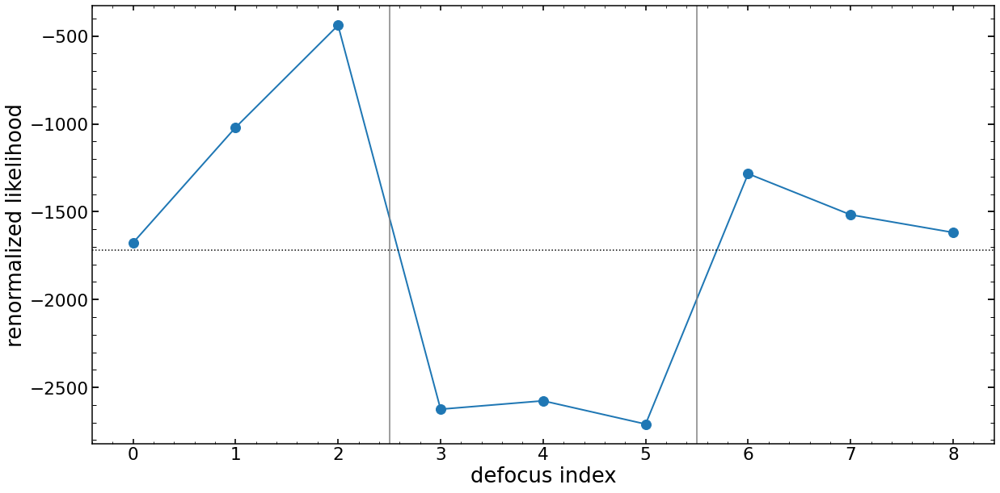

In [247]:
# shows the reported likelihood for each image, after division by the renormalization factor
# smaller absolute values is better
# dotted lien shows the mean reported value

plt.figure(figsize=(20,10))
array_of_single_res=np.array(list_of_single_res)

mean_res_of_multi_same_spot=np.mean(array_of_single_res/renormalization_of_var_sum)
print(mean_res_of_multi_same_spot)
print('array_of_single_res: '+str(array_of_single_res))
print('renormalization factors: '+str(renormalization_of_var_sum))
plt.plot(array_of_single_res/renormalization_of_var_sum,marker='o',lw=2,ms=12)
plt.xlabel('defocus index')
plt.ylabel('renormalized likelihood')
plt.axhline(mean_res_of_multi_same_spot,color='black',ls=":")
plt.axvline(2.5,color='gray')

plt.axvline(5.5,color='gray')

## Testing 0.41 via script 

In [251]:
finalAr_Feb2020_dataset=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalAr_Feb2020",allow_pickle=True)
finalNe_Feb2020_dataset=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalNe_Feb2020",allow_pickle=True)
finalKr_Feb2020_dataset=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalKr_Feb2020",allow_pickle=True)

finalAr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalAr_Feb2020",allow_pickle=True)
finalNe=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalNe_Feb2020",allow_pickle=True)
finalKr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalKr_Feb2020",allow_pickle=True)

def remove(string): 
    return string.replace(" ", "")

In [252]:
date='Mar06'

list_of_Ar_to_analyze=[2,11,17]

for single_spot in list_of_Ar_to_analyze:
    if str(finalAr_Feb2020_dataset.loc[single_spot]['close'])=='0' or str(finalAr_Feb2020_dataset.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T_Ar_1_'+str(single_spot)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 19:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, m35, m3, p3, p35, p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -obs 34341 34347 34353 34383 34389 34395 34425 34431 34437 -spot "+str(single_spot)+\
               " -nsteps 36 -eps 6 -dataset 6 -arc Ar -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalAr_Feb2020_dataset.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Jan0821 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type defocus \n")
    file.close()    
  



file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/'+date+'ScriptToSubmitScriptsTiger_Ar_1_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in list_of_Ar_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/T_Ar_1_'+str(single_spot)+date+'.sh \n')

file.close()

# Mar 06 2021

In [7]:
import glob

finalAr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalAr_Feb2020",allow_pickle=True)
finalNe=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalNe_Feb2020",allow_pickle=True)
finalKr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalKr_Feb2020",allow_pickle=True)

def remove(string): 
    return string.replace(" ", "")

## which are avaliable 

In [8]:

date='Mar0621'

ResultsFromTiger_FOLDER='/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/'


Emcee3_HgAr=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*HgArSwarm1.npy', recursive=True)

Emcee3_Ar=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*ArSwarm1.npy', recursive=True)
Emcee3_Ne=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*NeSwarm1.npy', recursive=True)
Emcee3_Kr=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*KrSwarm1.npy', recursive=True)


In [9]:
analyzed_Neon_images=[]
for i in range(len(Emcee3_Ne)):
    single_string=Emcee3_Ne[i][len(ResultsFromTiger_FOLDER)+30:len(Emcee3_Ne[i])-13]
    analyzed_Neon_images.append([int(single_string[:5]),int(single_string[5:]),'Ne'])
   
analyzed_Neon_images=np.array(analyzed_Neon_images)
###########
analyzed_Ar_images=[]
for i in range(len(Emcee3_Ar)):
    single_string=Emcee3_Ar[i][len(ResultsFromTiger_FOLDER)+30:len(Emcee3_Ar[i])-13]
    analyzed_Ar_images.append([int(single_string[:5]),int(single_string[5:]),'Ar'])
 

analyzed_Ar_images=np.array(analyzed_Ar_images)
###########
analyzed_Kr_images=[]
for i in range(len(Emcee3_Kr)):
    single_string=Emcee3_Kr[i][len(ResultsFromTiger_FOLDER)+30:len(Emcee3_Kr[i])-13]
    analyzed_Kr_images.append([int(single_string[:5]),int(single_string[5:]),'Kr'])
    
analyzed_Kr_images=np.array(analyzed_Kr_images)

In [10]:
print(analyzed_Ar_images)
print(analyzed_Neon_images)
print(analyzed_Kr_images)

[['34437' '23' 'Ar']
 ['34437' '2' 'Ar']]
[]
[]


In [11]:
if len(analyzed_Ar_images)>0:
    arranged_by_defocus_Ar=analyzed_Ar_images[analyzed_Ar_images[:,0].argsort()]
    arranged_by_spot_number_Ar=analyzed_Ar_images[analyzed_Ar_images[:,1].argsort()]
else:
    arranged_by_defocus_Ar=[]
    arranged_by_spot_number_Ar=[]

if len(analyzed_Neon_images)>0:
    arranged_by_defocus_Ne=analyzed_Neon_images[analyzed_Neon_images[:,0].argsort()]
    arranged_by_spot_number_Ne=analyzed_Neon_images[analyzed_Neon_images[:,1].argsort()]
else:
    arranged_by_defocus_Ne=[]
    arranged_by_spot_number_Ne=[]

if len(analyzed_Kr_images)>0:
    arranged_by_defocus_Kr=analyzed_Kr_images[analyzed_Kr_images[:,0].argsort()]
    arranged_by_spot_number_Kr=analyzed_Kr_images[analyzed_Kr_images[:,1].argsort()]
else:
    arranged_by_defocus_Kr=[]
    arranged_by_spot_number_Kr=[]
    
print('analyzed_Ar_images:'+str(len(analyzed_Ar_images))+' / '+'analyzed_Ne_images:'+str(len(analyzed_Neon_images))+' / '+'analyzed_Kr_images:'+str(len(analyzed_Kr_images)))

analyzed_Ar_images:2 / analyzed_Ne_images:0 / analyzed_Kr_images:0


## single image analysis 

In [334]:
date='Jan2920'
#obs=34313
#obs_int=int(obs)
single_number='2'
image_index=int(single_number)
eps=6
arc='Ar'
dataset=6

if arc=='Ar':
    obs=34341+96
    finalArc=finalAr
if arc=='Ne':
    obs=34217+96 
    finalArc=finalNe
if arc=='Kr':
    obs=34561+96
    finalArc=finalKr



list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

finalArc.loc[int(single_number)]

fiber                    2
xc                      70
yc                     992
wavelength        706.8989
close                    0
lamp                    Ar
xc_effective            70
second_offset      -39.597
second_ratio        0.0143
second2_offset           0
second2_ratio            0
Name: 2, dtype: object

In [248]:
finalNe[finalNe['fiber']==650]

,fiber,xc,yc,wavelength,close,lamp,xc_effective,second_offset,second_ratio,second2_offset,second2_ratio
81,650,4013,348,650.84186,0,Ne,4082,30.12,0.406,0,0
82,650,4013,379,653.4774,-1,Ne,4082,0,0,0,0
83,650,4012,455,660.0668,1,Ne,4081,0,0,0,0
84,650,4011,547,668.01764,0,Ne,4080,44.24,0.67,-29.97,0.003
85,650,4011,592,671.9268,-1,Ne,4080,0,0,0,0
86,650,4008,835,693.13116,1,Ne,4077,0,0,0,0
87,650,4007,1116,717.59015,1,Ne,4076,0,0,0,0
88,650,4006,1198,724.72437,1,Ne,4075,0,0,0,0
89,650,4005,1421,744.1276,0,Ne,4074,38.57,0.012,57.44,0.162


STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 119
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]


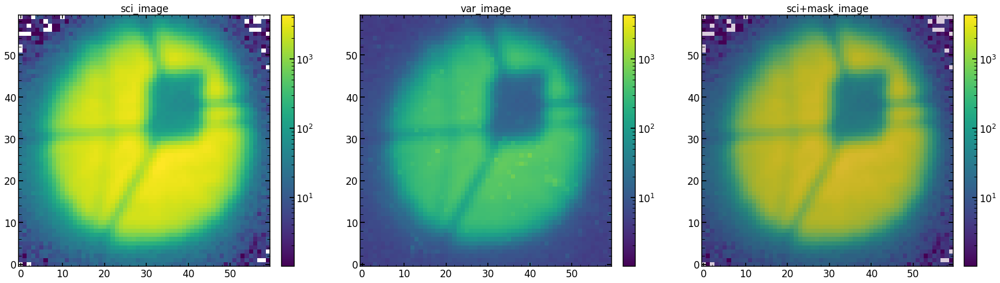

In [249]:
single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)
single_analysis.create_basic_data_image()

In [250]:
double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
columns,columns22,columns22_analysis=single_analysis.return_columns()


chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
#chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
len_of_chains=single_analysis.len_of_chains()

minchain_parametrization,like_min=single_analysis.create_likelihood()

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371196ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371196ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371196ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 1981.5236214123559
average chi2 reduced is: 8.862727017505014


### chain analysis 

In [918]:
minchain_parametrization

array([   -7.8825157 ,     0.03305758,     0.49241792,    -0.91129426,
           0.2342229 ,    -0.54302017,    -0.01364976,    -0.34325149,
          -0.06352654,     0.40795935,     0.01064555,    -0.44396466,
           0.00450309,    -0.57982209,    -0.06671459,     0.54374951,
          -0.00864246,     0.01886295,     0.00089042,     0.20247791,
           0.01402033,    -0.04694434,     0.01045948,     0.01222624,
           0.00874718,     0.03680648,    -0.00906852,     0.03962365,
          -0.01035716,     0.0319801 ,     0.00243948,    -0.03244641,
           0.01081932,    -0.03921772,     0.00747744,     0.01216259,
          -0.0274368 ,     0.03708531,     0.70255835,     0.10599709,
          -0.21711041,     0.27352715,     0.0627802 ,     0.10376147,
           0.09375901,     0.07524247,     0.        ,     0.61296491,
          -0.03620577,    -0.01351665,     0.89335116,     0.02591337,
           0.73920926,     1.04663307,     0.59825735, 25718.09765165,
      

In [919]:
gbest_filename='/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/'+date+'/chain'+date+'_Single_P_'+str(obs)+str(single_number)+str(dataset)+arc+'res_gbests_position.npy'
gbests_positions=np.load(gbest_filename)
print(gbest_filename)
print(gbests_positions.shape)
gbests_positions[0]

/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437116Arres_gbests_position.npy
(36, 129)


array([   -7.95137629,     0.07165237,     0.49164347,    -0.86077517,
           0.23048569,    -0.5045606 ,    -0.00103646,    -0.34871417,
          -0.06873405,     0.41356734,     0.01359331,    -0.44217477,
          -0.01649036,    -0.56975692,    -0.07573984,     0.55973222,
          -0.00824109,     0.02117111,    -0.00285157,     0.21307765,
           0.02258292,    -0.04505458,     0.00389182,     0.02773998,
           0.0129494 ,     0.04280962,    -0.0174756 ,     0.0455309 ,
          -0.00287843,     0.03550744,    -0.00052473,    -0.03300849,
           0.00549046,    -0.02717566,     0.00586427,     0.02386434,
          -0.03056621,     0.03898892,     0.70594866,     0.11041735,
          -0.21079921,     0.27340093,     0.06163019,     0.1029416 ,
           0.1       ,     0.1       ,     0.1       ,     1.        ,
          -0.02848173,    -0.01330549,     0.88540022,     0.02771489,
           0.7217169 ,     1.04756229,     0.60587698, 27402.65354784,
      

Text(0, 0.5, 'par_1')

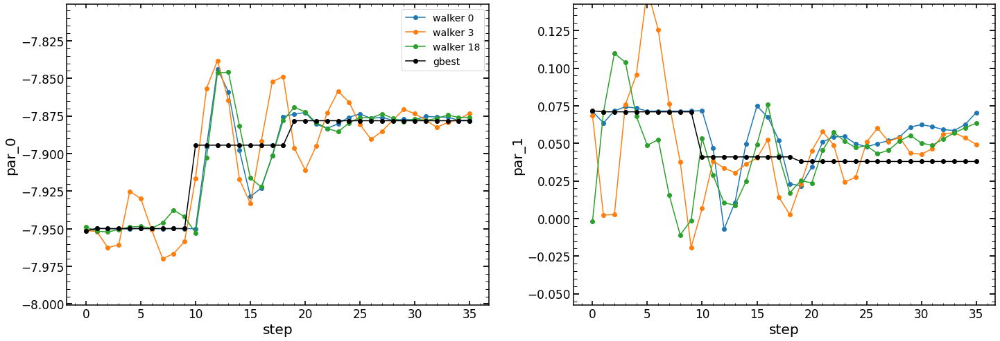

In [413]:
# wavefront paramter
plt.figure(figsize=(24,8))
i=0*2
plt.subplot(121)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('par_'+str((i)))
mean_one_walker=np.mean(chain0_swarm_1[:,18][:,i])
plt.ylim(mean_one_walker-0.1,mean_one_walker+0.1)
plt.legend()

plt.subplot(122)
#  paramter 2 (z5)

mean_one_what=np.mean(chain0_swarm_1[:,:,i+1][:,2])
plt.plot(chain0_swarm_1[:,:,i+1][:,0],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,3],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,18],marker='o')
plt.plot(gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.ylim(mean_one_what-0.1,mean_one_what+0.1)
plt.xlabel('step')
plt.ylabel('par_'+str((i+1)))

Text(0.5, 1.0, 'par_46 / wide_43')

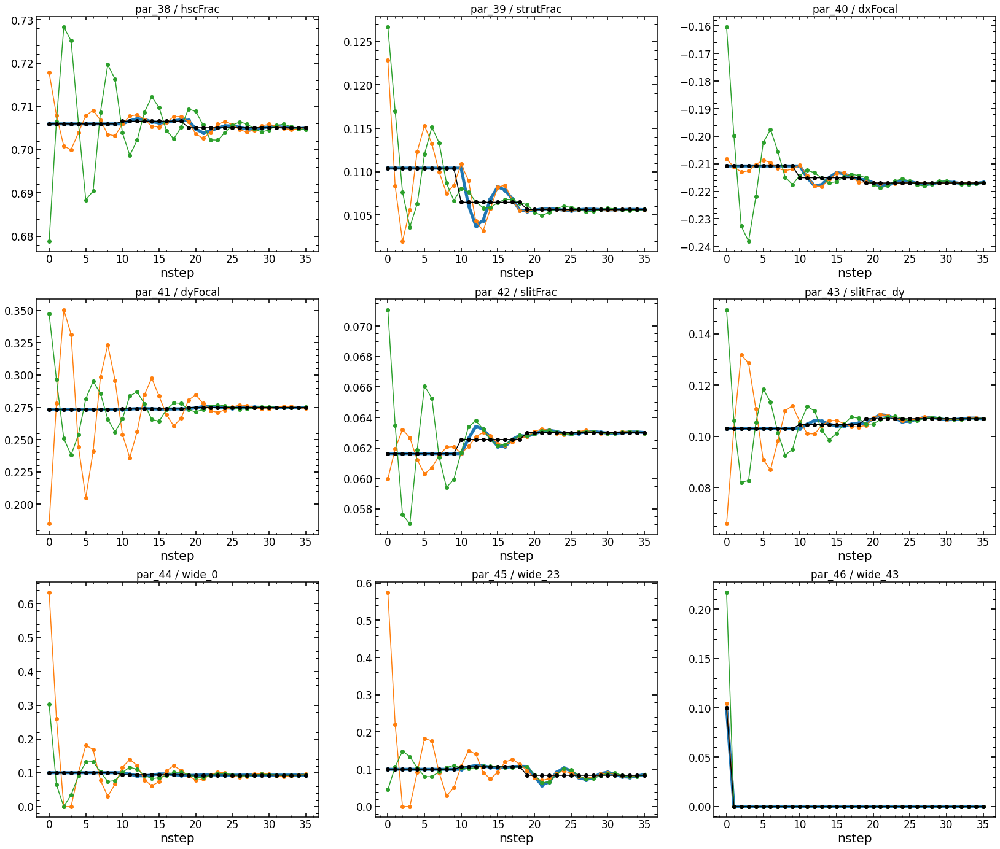

In [414]:
# pupil paramters
plt.figure(figsize=(28,24))
i=19*2
plt.subplot(331)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i))+' / '+columns22[19])

plt.subplot(332)
plt.plot(chain0_swarm_1[:,:,i+1][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+1))+' / '+columns22[20])

plt.subplot(333)
plt.plot(chain0_swarm_1[:,:,i+2][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+2][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+2][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+2],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+2))+' / '+columns22[21])



plt.subplot(334)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+3],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+3],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+3],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+3))+' / '+columns22[19+3])

plt.subplot(335)
plt.plot(chain0_swarm_1[:,:,i+4][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+4][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+4][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+4],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+4))+' / '+columns22[19+4])

plt.subplot(336)
plt.plot(chain0_swarm_1[:,:,i+5][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+5][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+5][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+5],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+5))+' / '+columns22[19+5])


plt.subplot(337)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+6],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+6],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+6],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+6],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+6))+' / '+columns22[19+6])

plt.subplot(338)
plt.plot(chain0_swarm_1[:,:,i+7][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+7][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+7][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+7],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+7))+' / '+columns22[19+7])

plt.subplot(339)
plt.plot(chain0_swarm_1[:,:,i+8][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+8][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+8][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+8],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+8))+' / '+columns22[19+8])

Text(0.5, 1.0, 'par_58 / pixel_effect')

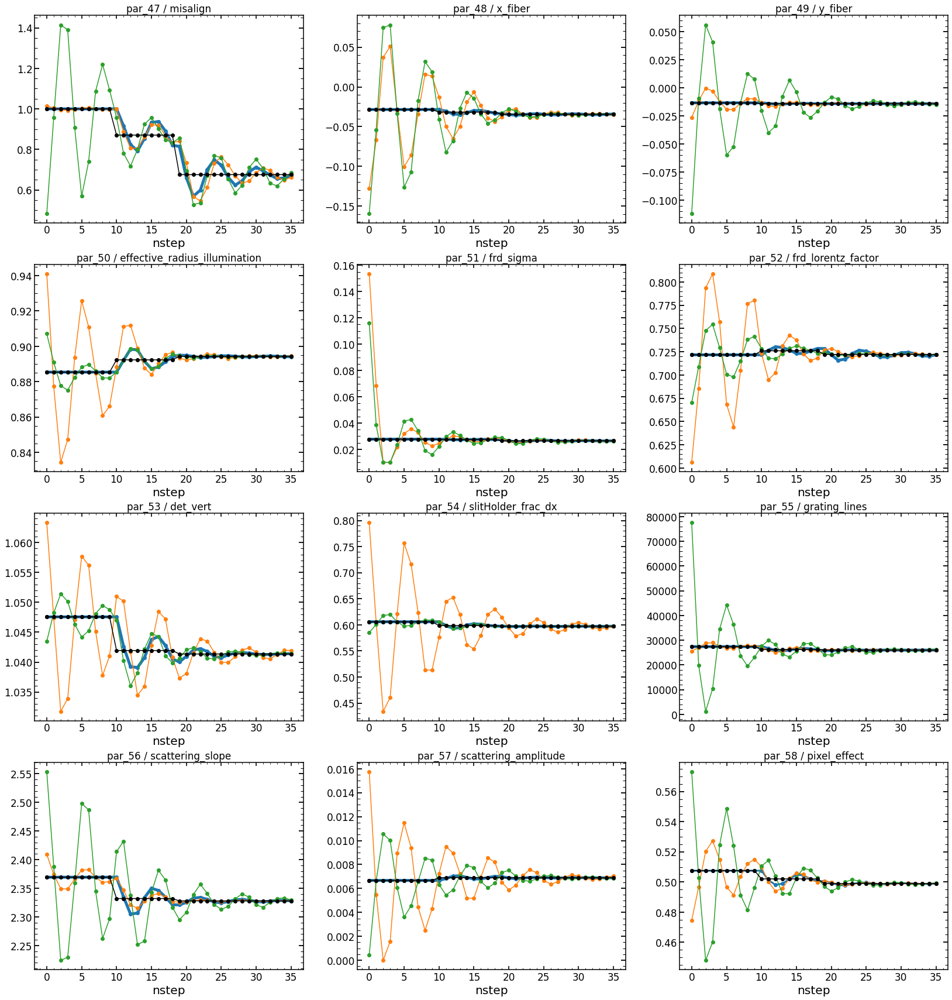

In [415]:
# pupil paramters
plt.figure(figsize=(28,30))
i=19*2
plt.subplot(431)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+9],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+9],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+9],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+9],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+9))+' / '+columns22[19+9])

plt.subplot(432)
plt.plot(chain0_swarm_1[:,:,i+10][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+10][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+10][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+10],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+10))+' / '+columns22[19+10])

plt.subplot(433)
plt.plot(chain0_swarm_1[:,:,i+11][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+11][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+11][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+11],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+11))+' / '+columns22[19+11])



plt.subplot(434)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+12],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+12],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+12],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+12],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+12))+' / '+columns22[19+12])

plt.subplot(435)
plt.plot(chain0_swarm_1[:,:,i+13][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+13][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+13][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+13],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+13))+' / '+columns22[19+13])

plt.subplot(436)
plt.plot(chain0_swarm_1[:,:,i+14][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+14][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+14][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+14],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+14))+' / '+columns22[19+14])


plt.subplot(437)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+15],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+15],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+15],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+15],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+15))+' / '+columns22[19+15])

plt.subplot(438)
plt.plot(chain0_swarm_1[:,:,i+16][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+16][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+16][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+16],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+16))+' / '+columns22[19+16])

plt.subplot(439)
plt.plot(chain0_swarm_1[:,:,i+17][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+17][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+17][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+17],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+17))+' / '+columns22[19+17])


plt.subplot(4,3,10)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+18],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+18],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+18],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+18))+' / '+columns22[19+18])

plt.subplot(4,3,11)
plt.plot(chain0_swarm_1[:,:,i+19][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+19][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+19][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+19],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+19))+' / '+columns22[19+19])

plt.subplot(4,3,12)
plt.plot(chain0_swarm_1[:,:,i+20][:,0],lw=3,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+20][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+20][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+20],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+20))+' / '+columns22[19+20])

Text(0, 0.5, 'std. devation of a single parameter 38')

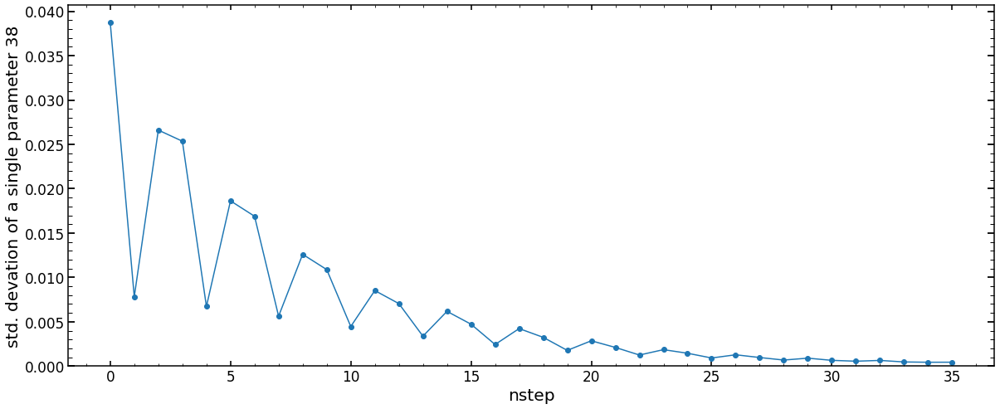

In [416]:
list_of_std=[]
i=19*2+0
for j in range(len(chain0_swarm_1)):
    list_of_std.append(np.std(chain0_swarm_1[:,:,i][j]))

plt.figure(figsize=(20,8))
plt.plot(list_of_std,marker='o')
plt.ylim(0)
plt.xlabel('nstep')
plt.ylabel('std. devation of a single parameter '+str(i))

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437116ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 1726.404694340507
average chi2 reduced is: 6.912630005411592
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437116ArSwarm1.npy
(36, 480, 129)


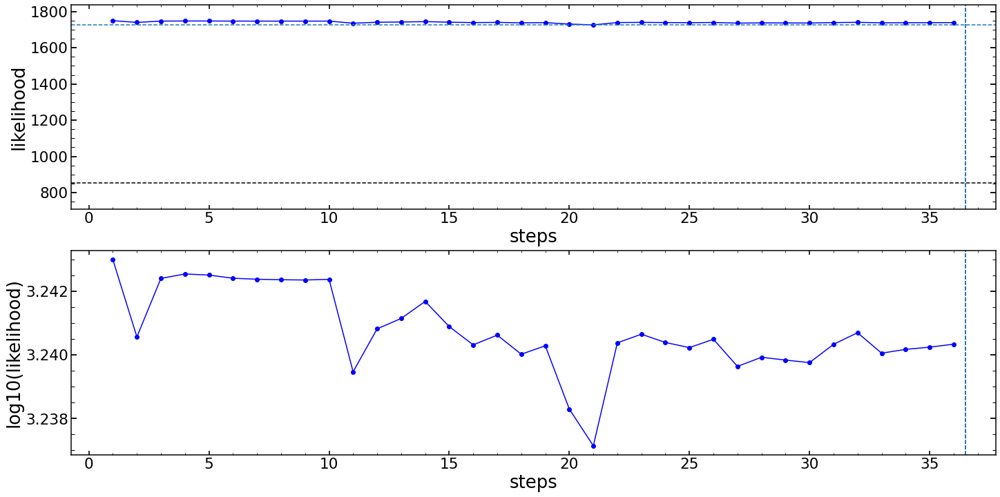

In [417]:
single_analysis.create_fitting_evolution_plot()

### image analysis 

In [300]:
model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,dithering=1,save=1,zmax=56,verbosity=1,\
                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,test_run=False)   


minchain_parametrization_test=np.copy(minchain_parametrization)

minchain_parametrization_test[19*2+0]=0.1

# wide_0
minchain_parametrization_test[19*2+6]=0.8

# wide_23
minchain_parametrization_test[19*2+7]=0.8

# wide_43
minchain_parametrization_test[19*2+8]=0.8

list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
#list_of_minchain=model_multi.create_list_of_allparameters(gbests_positions[-1],list_of_defocuses=list_of_defocuses_input_long,zmax=56)



res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)


mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

#model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],dithering=1,save=1,zmax=22,verbosity=1,\
#                      double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)  

#res_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True)

################################
analyzing image 1 out of 9
 
Science image shape is: (60, 60)
Top left pixel value of the science image is: -1.2420654
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 4.1640754
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.44a
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [   29.74273227     2.31221901    -1.82351203     0.20205529
    -0.84529032    -0.36049509    -0.36582658     0.46670238
     0.10112426    -0.23414431    -0.0098286     -0.0643177
     0.0022484     -0.04609765     0.00288289    -0.01337049
    -0.0353203     -0.00136168     0.13788407     0.72547713
     0.08910374     0.23045141     0.24154012     0.06149683
     0.03917138     0.

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.63436116 -20.77057644] / 113.64322
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.63436118 -20.77057644] / 113.64321
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.63436116 -20.77057646] / 113.64323
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-25.38436116   1.72942356] / 1950.3518
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-21.64065844 -10.74958553] / 392.0857
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-20.07727441 -15.96086562] / 146.25945
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-19.34854151 -18.38997529] / 106.578835
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.9930505  -19.57494532] / 104.37042
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.81582019 -20.16571302] / 107.500206
chi2 within shgo optimization routin

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-19.46395275 -19.38456833] / 103.32839
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-19.46374464 -19.38445445] / 103.328384
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-19.46366193 -19.38447845] / 103.328415
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-19.46388005 -19.38454586] / 103.3284
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-19.46380734 -19.38452339] / 103.3284
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-19.4638487  -19.38451139] / 103.3284
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-19.46370328 -19.38446645] / 103.328384
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-19.46364058 -19.3843975 ] / 103.3284
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-19.46376565 -19.38449192] / 103.32839
chi2 within shgo optimization routine 

creating wf_full_fake_0
Time for wavefront and wavefront/pupil combining is 0.0004711151123046875
type(expwf_grid)<class 'numpy.complex64'>
Time for FFT is 0.31939268112182617
type(img_apod)<class 'numpy.float32'>
Finished with _getOptPsf_naturalResolution
 
 
Entering optPsf_postprocessing
optPsf.shape: (3072, 3072)
oversampling_original: 35.374287997579025
size_of_central_cut: 2476
optPsf_cut.shape(2477, 2477)
oversampling:9.0
optPsf_cut.shape[0]2477
size_of_optPsf_cut_downsampled: 630.0
optPsf_cut_downsampled.shape: (631, 631)
size_of_optPsf_cut_in_Microns: 1051.6666666666667
postprocessing parameters:
['grating_lines', 'scattering_slope', 'scattering_amplitude', 'pixel_effect', 'fiber_r']
[31491.319103780606, 2.5338778284167627, 0.020340693333323338, 0.3983322828870916, 1.9159880266231033]
type(pointsx): <class 'numpy.float32'>
optPsf_cut_downsampled_scattered.shape:(631, 631)
simulation_00 parameter:None
are we invoking double sources (1 or True if yes): False
double source positi

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.6867707  -10.50460484] / 91.86258
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.68704056 -10.50489701] / 91.86257
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.68722573 -10.50471357] / 91.862564
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.68714105 -10.50423796] / 91.86257
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.68706568 -10.50473224] / 91.86259
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.6870908  -10.50456748] / 91.862595
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.68699821 -10.5046592 ] / 91.86259
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.68686329 -10.50451312] / 91.862564
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.68682094 -10.50427532] / 91.86258
chi2 within shgo optimization routine (chi_

creating wf_full_fake_0
Time for wavefront and wavefront/pupil combining is 0.00046825408935546875
type(expwf_grid)<class 'numpy.complex64'>
Time for FFT is 0.32968783378601074
type(img_apod)<class 'numpy.float32'>
Finished with _getOptPsf_naturalResolution
 
 
Entering optPsf_postprocessing
optPsf.shape: (3072, 3072)
oversampling_original: 35.374287997579025
size_of_central_cut: 1980
optPsf_cut.shape(1981, 1981)
oversampling:9.0
optPsf_cut.shape[0]1981
size_of_optPsf_cut_downsampled: 504.0
optPsf_cut_downsampled.shape: (505, 505)
size_of_optPsf_cut_in_Microns: 841.6666666666667
postprocessing parameters:
['grating_lines', 'scattering_slope', 'scattering_amplitude', 'pixel_effect', 'fiber_r']
[31491.319103780606, 2.5338778284167627, 0.020340693333323338, 0.3983322828870916, 1.9159880266231033]
type(pointsx): <class 'numpy.float32'>
optPsf_cut_downsampled_scattered.shape:(505, 505)
simulation_00 parameter:None
are we invoking double sources (1 or True if yes): False
double source positi

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.3380564  -10.39442838] / 81.25874
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.33869061 -10.39870933] / 81.2587
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.34060192 -10.40125531] / 81.25876
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.33829315 -10.39732085] / 81.25871
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.33906274 -10.39863233] / 81.258705
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.33847921 -10.39728235] / 81.25868
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.33885133 -10.39720535] / 81.25871
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.33900989 -10.39827559] / 81.258705
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.33895704 -10.39791884] / 81.25869
chi2 within shgo optimization routine (chi_2_

Time for postprocessing pupil after _get_Pupil 0.295421838760376
Time for pupil and illumination calculation is 0.301314115524292

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, 3.4598971232636786, 0.5666567064970605, -0.6000072430124905, -0.04293122573406439, -0.697173841393982, -0.35943723317198495, -0.2372225169352881, 0.45068729312712197, 0.01806217954540002, -0.19164531428485063, 0.011519013574246232, -0.013431376765617151, -0.03827412952503249, 0.00568052495167047, 0.0034599309186156995, -0.02254937335485067, -0.026762989493265388, 0.03569131847498579, 0.02937124947104165, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, 0.5666567064970605, -0.6000072430124905, -0.04293122573406439, -0.697173841393982, -0.35943723317198495, -0.2372225169352881, 0, 0.01806217954540002, -0.1916

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.86833357 -1.61455487] / 38.677723
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.86842856 -1.61455487] / 38.67712
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.86847491 -1.61455487] / 38.676823
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.86849751 -1.61455487] / 38.676693
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.86850857 -1.61455487] / 38.676613
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.86851394 -1.61455487] / 38.676594
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.86851659 -1.61455487] / 38.67657
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.86851659 -1.61455487] / 38.67657
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.31194242 -1.61455487] / 37.671642
chi2 within shgo optimization routine (chi_2_almost_multi_

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.98
Finished with lnlike_Neven
chi_2_almost/d.o.f is 7.5338717; chi_2_almost_max_dof is 63.81823 log(improvment) is -0.92792654
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4588561856
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4588561856 is: 5.287858009338379 seconds
 
################################
analyzing image 5 out of 9
 
Science image shape is: (20, 20)
Top left pixel value of the science image is: -1.2332155
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 2.7660823
Mask image shape is: (20, 20)
Sum of mask image is: 0
Dit

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.61652961 -2.18919245] / 14.374517
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.74946633 -2.35366546] / 14.679914
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.93074367 -2.31396508] / 15.063031
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.47755032 -2.05024112] / 14.358193
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.45338001 -2.15232781] / 14.350049
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.35972005 -2.18493884] / 14.459836
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.31440071 -2.01337648] / 14.521358
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.54099739 -2.14523846] / 14.33123
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.51682708 -2.24732515] / 14.386275
chi2 within shgo optimization routine (chi_2_almost_mult

Time to apodize the pupil: 0.14677095413208008
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.3070230484008789
Time for pupil and illumination calculation is 0.3131899833679199

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, -4.049484347535929, 0.06792462088346449, -0.25043444713164, -0.11292737294444732, -0.6548548482520183, -0.35913498734078564, -0.20047849803083698, 0.44611155393528146, -0.005669844182075884, -0.17950274298818616, 0.017618331338024963, 0.0011075732971812012, -0.049851994867565246, 0.02047428780834984, 0.0036247990377624418, -0.025171911375423062, -0.02431804436636651, 0.04627788901397233, -0.001632412773823002, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, 0.06792462088346449, -0.25043444713164, -0.1129

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9936209341981748
Finished with lnlike_Neven
chi_2_almost/d.o.f is 6.0057626; chi_2_almost_max_dof is 54.04161 log(improvment) is -0.95416015
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4588561856
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4588561856 is: 4.784574031829834 seconds
 
################################
analyzing image 7 out of 9
 
Science image shape is: (50, 50)
Top left pixel value of the science image is: 7.8886113
Variance image shape is: (50, 50)
Top left pixel value of the variance image is: 4.6383033
Mask image shape is: (50, 50)
Sum of mask im

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.42717423   8.05450257] / 38.654835
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.556715     7.85467556] / 38.932693
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.4136804    8.14520274] / 38.650414
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.34531166   8.15748718] / 38.672558
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.38286949   8.12866992] / 38.6509
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.36937566   8.21937009] / 38.69729
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.41272459   8.09571945] / 38.645218
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.4435355    8.11225227] / 38.647564
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.44257969   8.06276898] / 38.65274
chi2 within shgo optimization routine (ch

Time for postprocessing pupil after _get_Pupil 0.2889268398284912
Time for pupil and illumination calculation is 0.295482873916626

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, -26.577628759934747, -1.4282716359573233, 0.7982839405109118, -0.3229158145755961, -0.5278978688261274, -0.35822824984718776, -0.0902464413174836, 0.4323843363597599, -0.0768659153645036, -0.1430750290981927, 0.03591628462936116, 0.04472442348557626, -0.08458559089516353, 0.06485557637838796, 0.004119403395202667, -0.033039525437140234, -0.016983208985669886, 0.07803760063093194, -0.09464339950841696, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, -1.4282716359573233, 0.7982839405109118, -0.3229158145755961, -0.5278978688261274, -0.35822824984718776, -0.0902464413174836, 0, -0.0768659153645036, -0.143075

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.09894372   8.32936336] / 45.199783
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.09181179   8.32981882] / 45.199715
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.09656641   8.32951518] / 45.199722
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.09300045   8.32974291] / 45.1997
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.09459481   8.3334979 ] / 45.199734
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.09369264   8.3292166 ] / 45.199696
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.09170681   8.32741501] / 45.19975
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.09416642   8.33051212] / 45.199696
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.09485861   8.32998582] / 45.199696
chi2 within shgo optimization routine (c

Time to apodize the pupil: 0.1307389736175537
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.28481221199035645
Time for pupil and illumination calculation is 0.29082274436950684

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, -30.332319495334552, -1.6776376787641216, 0.9730703384513372, -0.35791388818078756, -0.5067383722551456, -0.3580771269315881, -0.07187443186525805, 0.43009646676383967, -0.08873192722824155, -0.13700374344986044, 0.03896594351125053, 0.05199389851697543, -0.09037452356642992, 0.07225245780672764, 0.004201837454776038, -0.03435079444742643, -0.015760736422220444, 0.08333088590042521, -0.11014523063084927, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, -1.6776376787641216, 0.9730703384513372, -0.35791388

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-16.96307248   7.99695224] / 67.81551
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-16.98283951   7.98257584] / 67.8181
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-16.96275048   8.004543  ] / 67.81551
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-16.95000179   8.00400626] / 67.81661
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-16.96936633   7.9991183 ] / 67.81518
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-16.96968833   7.99152755] / 67.816025
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-16.96448494   8.00128914] / 67.81523
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-16.97077879   8.0034552 ] / 67.81538
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-16.96885221   8.00182946] / 67.815216
chi2 within shgo optimization routine (chi_2_

In [287]:
list_of_var_images_via_model=[]
for index_of_single_image in range(len(list_of_sci_images)):
    single_var_image_via_model=create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])
    
    list_of_var_images_via_model.append(single_var_image_via_model)

In [288]:
array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result
quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)




list_of_var_sums=[]
for i in range(9):
    var_image_masked=list_of_var_images[i]
    sci_image=list_of_sci_images[i]
    

    mean_value_of_background=np.mean([np.median(sci_image),np.median(sci_image),\
                      np.median(sci_image),np.median(sci_image)])*3
            
    #flux_mask=sci_image>(mean_value_of_background)
    #var_image_masked=var_image[flux_mask]
    
    var_image_masked_without_nan = var_image_masked.ravel()[var_image_masked.ravel()>quantile_08_focus]
    print('number of pixels considering in image '+str(i)+': '+str(var_image_masked_without_nan.shape[0]))
    var_sum=-(1/2)*(np.sum(np.log(2*np.pi*var_image_masked_without_nan)))
    list_of_var_sums.append(var_sum)
    
array_of_var_sum=np.array(list_of_var_sums)
max_of_array_of_var_sum=np.max(array_of_var_sum)
print(array_of_var_sum)
renormalization_of_var_sum=array_of_var_sum/max_of_array_of_var_sum

renormalization_of_var_sum

array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result

quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)
'model pixels with a flux larger than?: '+str(quantile_08_focus)

number of pixels considering in image 0: 2148
number of pixels considering in image 1: 1699
number of pixels considering in image 2: 1297
number of pixels considering in image 3: 95
number of pixels considering in image 4: 40
number of pixels considering in image 5: 75
number of pixels considering in image 6: 1067
number of pixels considering in image 7: 1403
number of pixels considering in image 8: 1801
[-7280.07128906 -5743.08642578 -4374.61181641  -300.61663818
  -123.89323425  -234.15167236 -3633.33886719 -4806.38867188
 -6195.32226562]


'model pixels with a flux larger than?: 16.203581237792992'

mean reported value:-417.2957704978512
array_of_single_res: [-17893.9765625  -11455.06445312  -5923.68847656  -1294.18017578
   -929.47454834  -1083.22631836  -9437.546875   -13834.03808594
 -16094.45898438]
renormalization factors: [58.76084625 46.35512553 35.30952955  2.42641691  1.          1.88994721
 29.32637031 38.79460167 50.00533163]


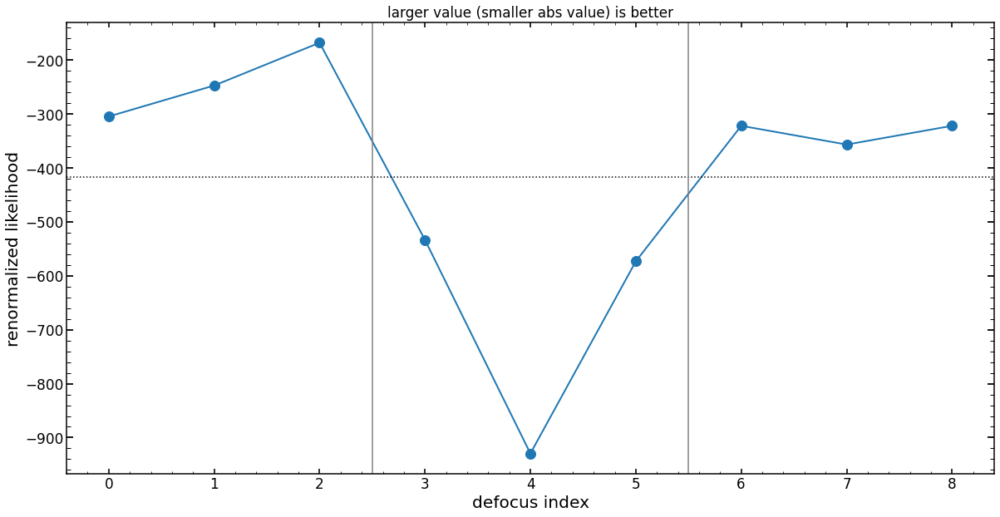

In [301]:
# shows the reported likelihood for each image, after division by the renormalization factor
# smaller absolute values is better
# dotted lien shows the mean reported value

plt.figure(figsize=(20,10))
array_of_single_res=np.array(list_of_single_res)

mean_res_of_multi_same_spot=np.mean(array_of_single_res/renormalization_of_var_sum)
print('mean reported value:'+str(mean_res_of_multi_same_spot))
print('array_of_single_res: '+str(array_of_single_res))
print('renormalization factors: '+str(renormalization_of_var_sum))
plt.plot(array_of_single_res/renormalization_of_var_sum,marker='o',lw=2,ms=12)
plt.xlabel('defocus index')
plt.ylabel('renormalized likelihood')
plt.axhline(mean_res_of_multi_same_spot,color='black',ls=":")
plt.axvline(2.5,color='gray')
plt.title('larger value (smaller abs value) is better')
plt.axvline(5.5,color='gray')

In [302]:
minchain=list_of_minchain[4]

print('minchain.shape '+str(minchain.shape))

    
dfz11 = pd.DataFrame(np.array([np.array([minchain])[0][0:8]]),columns=columns22[0:8])
print(dfz11)
print('##############################################')
dfz22 = pd.DataFrame(np.array([np.array([minchain])[0][8:19]]),columns=columns22[8:19])
print(dfz22)

print('')
#dfglobal = pd.DataFrame(np.array([np.array([minchain])[0][19:len(columns)]]),columns=columns[19:])
print('##############################################')
dfglobal1 = pd.DataFrame(np.array([np.array([minchain])[0][19:19+6]]),columns=columns22[19:19+6])
print(dfglobal1)
print('##############################################')
dfglobal2 = pd.DataFrame(np.array([np.array([minchain])[0][25:25+4]]),columns=columns22[25:25+4])
print(dfglobal2)
print('##############################################')
dfglobal3 = pd.DataFrame(np.array([np.array([minchain])[0][29:29+5]]),columns=columns22[29:29+5])
print(dfglobal3)
print('##############################################')
dfglobal4 = pd.DataFrame(np.array([np.array([minchain])[0][34:41]]),columns=columns22[34:41])
print(dfglobal4)

minchain.shape (76,)
         z4        z5        z6        z7        z8        z9       z10  \
0 -0.294794  0.317291 -0.425221 -0.077929 -0.676014 -0.359286 -0.218851   

        z11  
0  0.448399  
##############################################
        z12       z13       z14       z15       z16       z17       z18  \
0  0.006196 -0.185574  0.014569 -0.006162 -0.044063  0.013077  0.003542   

        z19       z20       z21       z22  
0 -0.023861 -0.025541  0.040985  0.013869  

##############################################
    hscFrac  strutFrac   dxFocal  dyFocal  slitFrac  slitFrac_dy
0  0.725477   0.089104  0.230451  0.24154  0.061497     0.039171
##############################################
     wide_0   wide_23  wide_43  misalign
0  0.078229  0.107669      0.0  1.415279
##############################################
    x_fiber   y_fiber  effective_radius_illumination  frd_sigma  \
0  0.003031 -0.069748                       0.943632   0.020626   

   frd_lorentz_factor  
0

(-2.8, -1.5)

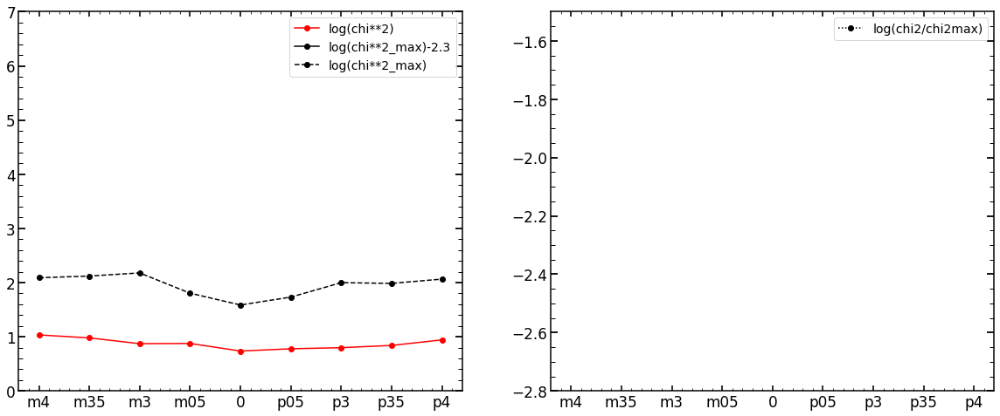

In [303]:
chi_results_array=np.array(res_multi[4])

plt.figure(figsize=(20,8))

plt.subplot(121)

plt.plot(np.log10(chi_results_array[:,2]),color='red',label='log(chi**2)',marker='o')
plt.plot(np.log10(chi_results_array[:,3])-2.3,color='black',label='log(chi**2_max)-2.3',marker='o')
plt.plot(np.log10(chi_results_array[:,3]),color='black',label='log(chi**2_max)',marker='o',ls='--')
plt.ylim(0,7)
plt.xticks(np.arange(0,len(list_of_defocuses_input_long),1),list_of_defocuses_input_long)
plt.legend()
plt.subplot(122)

plt.plot(np.log10(chi_results_array[:,2]/chi_results_array[:,3]),color='black',label='log(chi2/chi2max)',marker='o',ls=':')
plt.legend()
plt.xticks(np.arange(0,len(list_of_defocuses_input_long),1),list_of_defocuses_input_long)
plt.ylim(-2.8,-1.5)

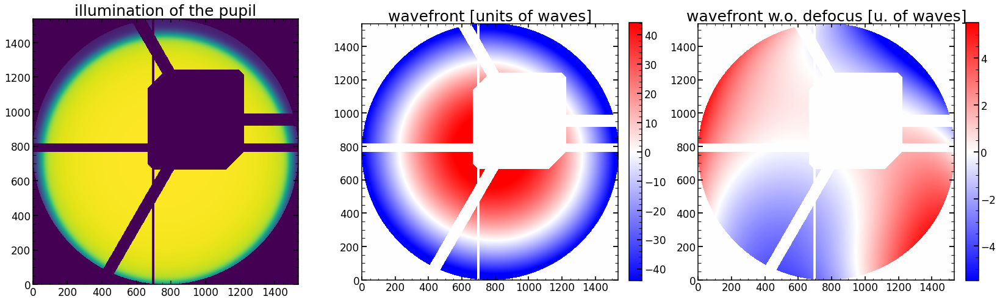

In [304]:
single_analysis.illumination_wavefront_plot()

Science image shape is: (60, 60)
Top left pixel value of the science image is: 1.0201311
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 4.29175
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.44a
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
chi**2 max reduced is: 6308.0635
chi**2 reduced is: 67.78379 for log improvment: -1.9687701
---------------------
chi**2 reduced within mask area is: 67.78379
---------------------
chi**2 max reduced within flux mask area is: 14805.327
chi**2 reduced within flux mask area is: 124.66955 for log improvment: -2.0746577
---------------------
Abs of residual divided by total flux is: 0.077401906
Abs of residual divided by largest value of a flux in the image is: 0.20341961


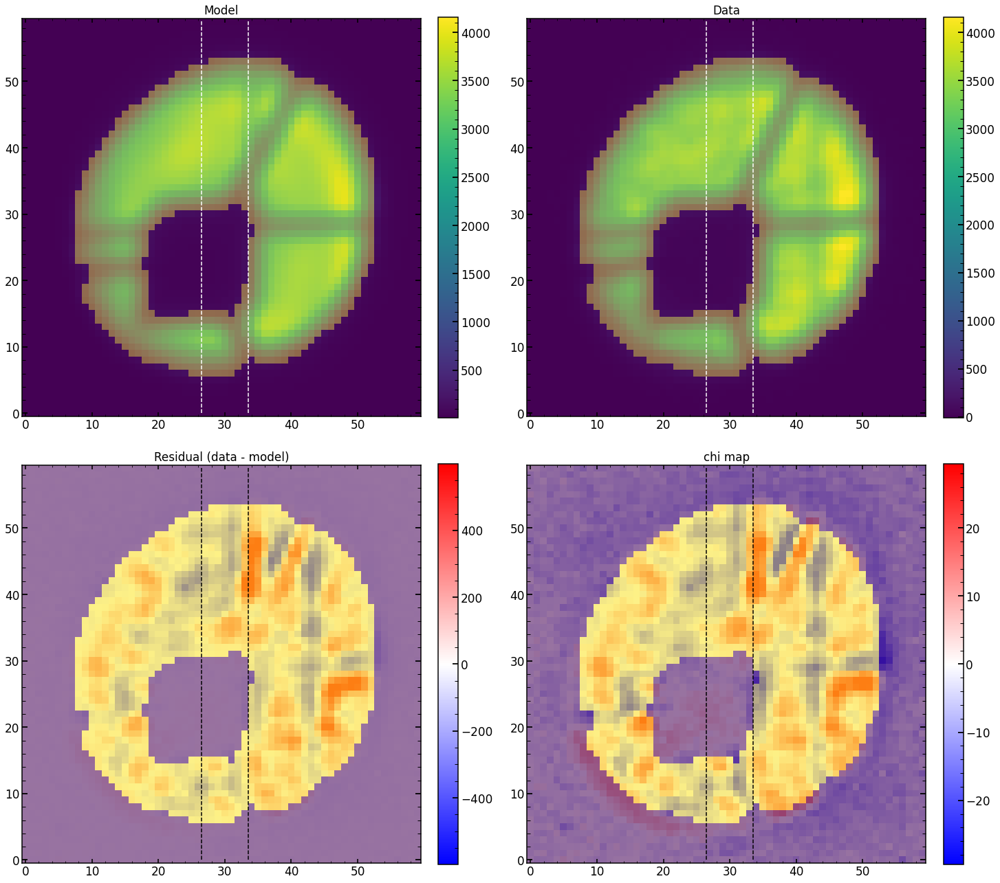

In [305]:
index_of_single_image=8

#
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=True,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=False)

# I can move to use custom_var within the analysis
#single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
#                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=custom_var,\
#                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=False)

array_of_sci_image=np.array(list_of_sci_images)
array_of_single_model_image=np.array(list_of_single_model_image)
array_of_var_images=np.array(list_of_var_images)
array_of_mask_images=np.array(list_of_mask_images)

np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_sci_image'+'_'+str(single_number),array_of_sci_image)
np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_single_model_image'+'_'+str(single_number),array_of_sci_image)
np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_var_images'+'_'+str(single_number),array_of_sci_image)
np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_mask_images'+'_'+str(single_number),array_of_sci_image)

Science image shape is: (60, 60)
Top left pixel value of the science image is: 1.0201311
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 4.29175
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.44a
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
fraction of chi2 due to 1% of pixels: 0.092375
chi**2 max reduced is: 6308.0635
chi**2 reduced is: 67.78379 for log improvment: -1.9687701
---------------------
chi**2 reduced within mask area is: 67.78379
---------------------
chi**2 max reduced within flux mask area is: 14805.327
chi**2 reduced within flux mask area is: 124.66955 for log improvment: -2.0746577
---------------------
Abs of residual divided by total flux is: 0.077401906
Abs of residual divided by largest value of a fl

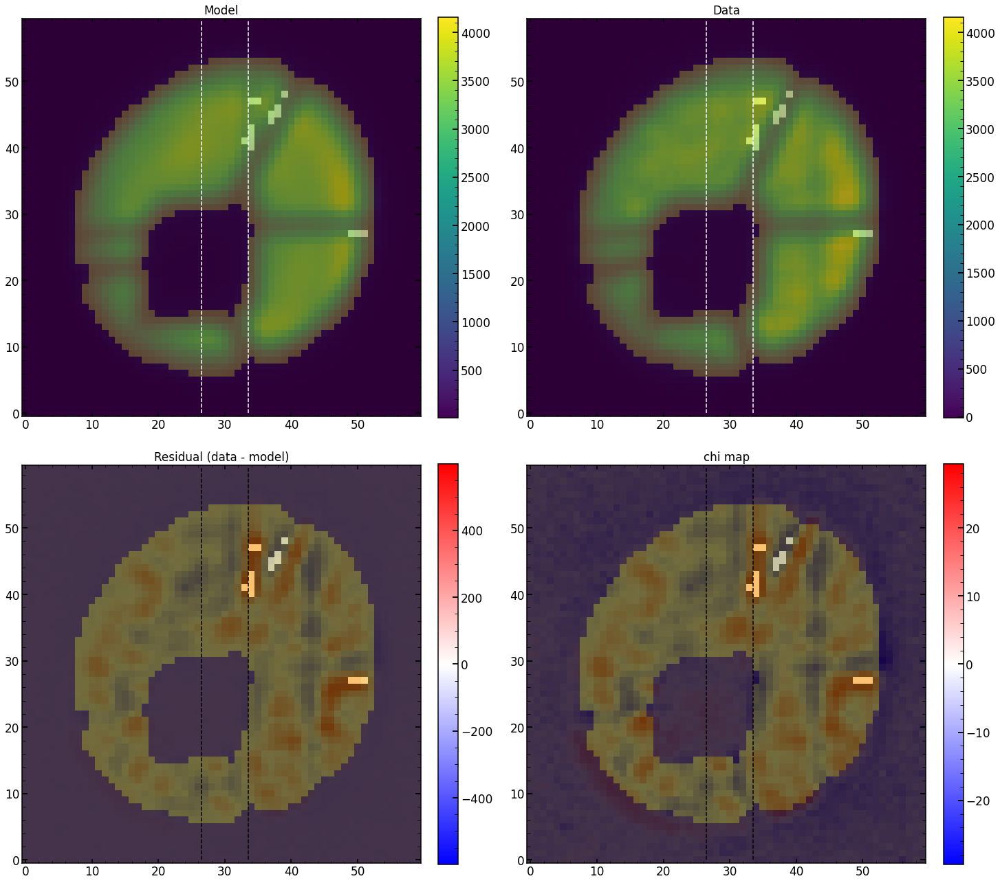

In [306]:

model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=True,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

Science image shape is: (60, 60)
Top left pixel value of the science image is: 1.0201311
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 4.29175
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.44a
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
chi**2 max reduced is: 6308.0635
chi**2 reduced is: 67.78379 for log improvment: -1.9687701
---------------------
chi**2 reduced within mask area is: 67.78379
---------------------
chi**2 max reduced within flux mask area is: 14805.327
chi**2 reduced within flux mask area is: 124.66955 for log improvment: -2.0746577
---------------------
Abs of residual divided by total flux is: 0.077401906
Abs of residual divided by largest value of a flux in the image is: 0.20341961


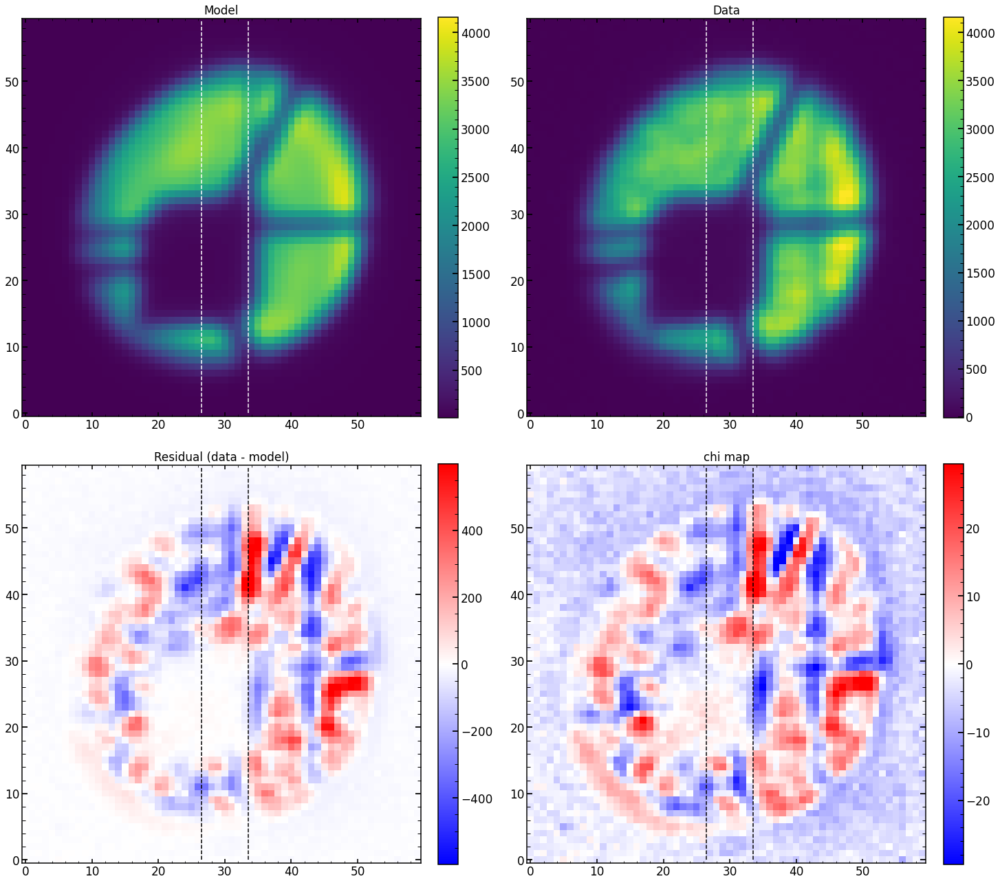

In [307]:
#
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=False)

chi**2 max reduced is: 6308.0635
chi**2 reduced is: 67.78379
Abs of residual divided by total flux is: 0.077401906
Abs of residual divided by largest value of a flux in the image is: 0.20341961


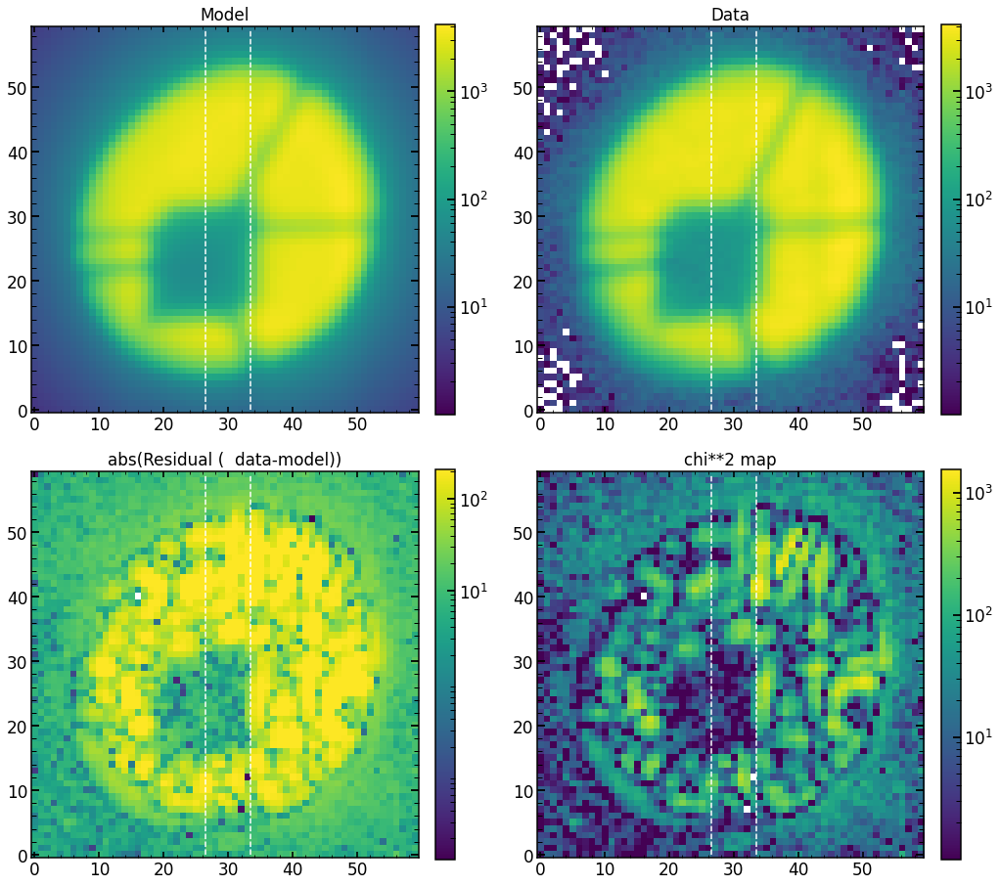

In [308]:
single_analysis.create_basic_comparison_plot_log(custom_model_image=list_of_single_model_image[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                                show_flux_mask=False)

109.10449
chi**2 reduced is: 109.10449
Abs of residual divided by total flux is: 0.09662823
Abs of residual divided by largest value of a flux in the image is: 0.20047155


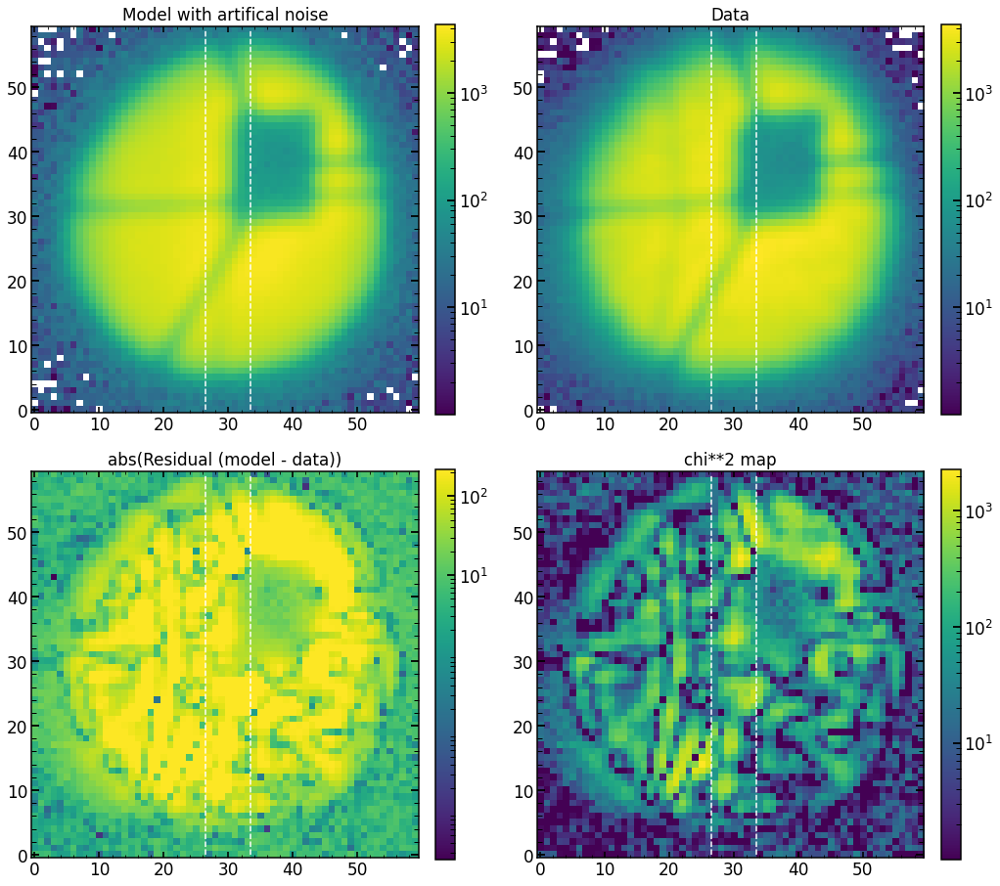

In [177]:
single_analysis.create_basic_comparison_plot_log_artifical(custom_model_image=list_of_single_model_image[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image])

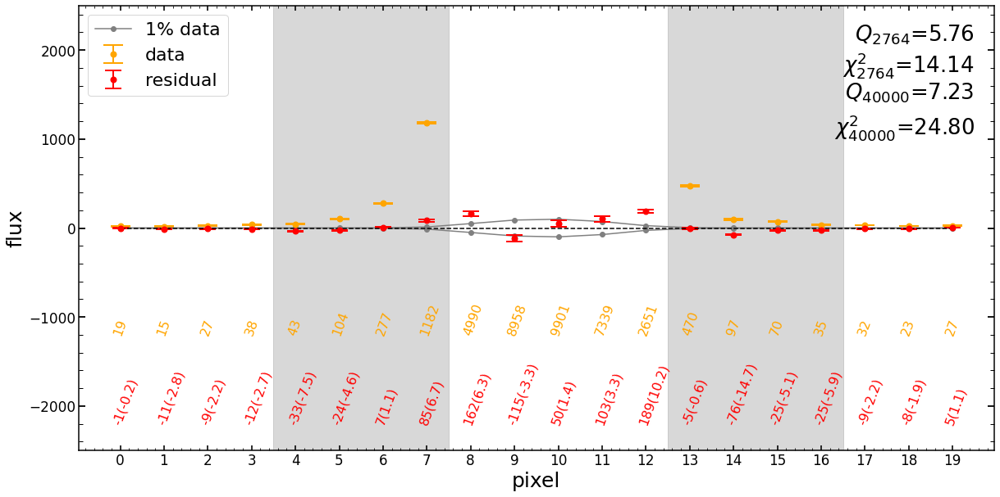

In [178]:
index_of_single_image=4
plot_1D_residual(sci_image=list_of_sci_images[index_of_single_image],var_image=list_of_var_images[index_of_single_image],model_image=list_of_single_model_image[index_of_single_image])

In [ ]:
res_iapetus=list_of_single_model_image[index_of_single_image]
sci_image=list_of_sci_images[index_of_single_image]
var_image=list_of_var_images[index_of_single_image]

chi2_image=(sci_image-res_iapetus)**2/((1)*var_image)

mask_most_impactful_pixels=np.zeros(sci_image.shape)
mask_most_impactful_pixels[chi2_image>(np.quantile(chi2_image.ravel(),0.99))]=1

In [ ]:
plt.figure(figsize=(20,10))
plt.imshow(chi2_image)


In [131]:
        mean_value_of_background=np.mean([np.median(sci_image),np.median(sci_image),\
                              np.median(sci_image),np.median(sci_image)])*3
            
        flux_mask=sci_image>(mean_value_of_background)
chi2_image>(np.quantile(chi2_image[flux_mask].ravel(),0.99))

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [134]:
np.sum(chi2_image[flux_mask].ravel()[chi2_image[flux_mask].ravel()>np.quantile(chi2_image[flux_mask].ravel(),0.99)])

12321.467

In [135]:
np.sum(chi2_image[flux_mask].ravel())

102803.06

In [103]:
camY_Max=0.02
camX_value_for_f_multiplier, camY_value_for_f_multiplier= (-0.015080353984103227, 0.01899902572893377)
(np.abs(camX_value_for_f_multiplier)*100/3)*(np.abs(camY_value_for_f_multiplier)/camY_Max)+1

1.477520055575677

# PIPE2D - 694

In [9]:
import Zernike_Module
import Zernike_Analysis_Module
from Zernike_Module import *
from Residual_1D_module import * 
from Zernike_Analysis_Module import *


In [10]:
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/Jan2921/'

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_Jan2921.pkl', 'rb') as f:
    results_of_fit_many_Ar_from_Jan29=pickle.load(f)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Jan2921.pkl', 'rb') as f:
    results_of_fit_many_Ne_from_Jan29=pickle.load(f)    
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Jan2921.pkl', 'rb') as f:
    results_of_fit_many_Kr_from_Jan29=pickle.load(f)    

In [11]:
index_Ar=results_of_fit_many_Ar_from_Jan29['0'].index[np.log10(results_of_fit_many_Ar_from_Jan29['0']['chi2'].values/results_of_fit_many_Ar_from_Jan29['0']['chi2max'].values)==np.min(np.log10(results_of_fit_many_Ar_from_Jan29['0']['chi2'].values/results_of_fit_many_Ar_from_Jan29['0']['chi2max'].values))][0]
results_of_fit_many_Ar_from_Jan29['0'].loc[index_Ar]

z4             0.583624
z5             0.096308
z6             0.091398
z7             0.263171
z8             0.320398
               ...     
z54            0.001800
z55            0.005206
z56           -0.002941
chi2          25.140766
chi2max    26446.005859
Name: 17, Length: 78, dtype: float64

In [12]:
np.log10(results_of_fit_many_Ne_from_Jan29['0']['chi2'].values/results_of_fit_many_Ne_from_Jan29['0']['chi2max'].values)

array([-3.00806192, -2.66874003, -3.06738118, -3.10539325, -3.07116454,
       -2.47254036, -3.31791156, -2.77754443, -2.52807131, -2.89038856,
       -2.72517208, -2.74621489, -2.87233488, -2.55855649, -1.82500239,
       -2.69025609, -2.96441311, -2.70881825, -2.97735303, -2.38059773,
       -2.87933653, -2.93894102, -2.77901462, -2.86100907, -2.77652329,
       -3.11103935, -2.99384834, -2.92132949, -2.8154349 , -2.93036988,
       -2.40417206, -2.78181689, -2.84983238, -2.90295593, -2.37601667,
       -2.11284027, -2.8314205 , -2.86290834, -2.846861  , -2.95046778,
       -2.71094695, -3.07814674, -2.71701931, -2.9773274 , -2.83557419,
       -3.34638737, -2.97153558, -2.85914061, -2.96428887, -2.793518  ])

In [13]:
np.log10(results_of_fit_many_Kr_from_Jan29['0']['chi2'].values/results_of_fit_many_Kr_from_Jan29['0']['chi2max'].values)

array([-2.71640177, -2.6311193 , -2.60856308, -2.39812688, -2.61168323,
       -2.56562577, -2.64008286, -2.31350847, -2.56144452, -2.6611007 ,
       -2.5859382 , -2.31712543, -2.4566981 , -2.67333607, -2.67230274,
       -2.66437244, -2.37495001, -2.57205723, -2.24582693, -2.38324195,
       -2.62279973, -2.41937831, -2.62530361, -2.75398965, -2.49577041,
       -2.25643948, -2.58337808, -2.62238771, -2.34785296, -2.75781324,
       -2.66276193, -2.53174245, -2.2918885 , -2.45378403, -2.81628106])

In [14]:
finalAr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalAr_Feb2020",allow_pickle=True)
finalNe=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalNe_Feb2020",allow_pickle=True)
finalKr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalKr_Feb2020",allow_pickle=True)

In [15]:
date='Jan2920'
#obs=34313
#obs_int=int(obs)
single_number='17'
image_index=int(single_number)
eps=6
arc='Ar'
dataset=6

if arc=='Ar':
    obs=34341+96
    finalArc=finalAr
if arc=='Ne':
    obs=34217+96 
    finalArc=finalNe
if arc=='Kr':
    obs=34561+96
    finalArc=finalKr



list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

finalArc.loc[int(single_number)]

fiber                    63
xc                      463
yc                     1631
wavelength        763.74286
close                     1
lamp                     Ar
xc_effective            463
second_offset             0
second_ratio              0
second2_offset            0
second2_ratio             0
Name: 17, dtype: object

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 17
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0.0 0.0]


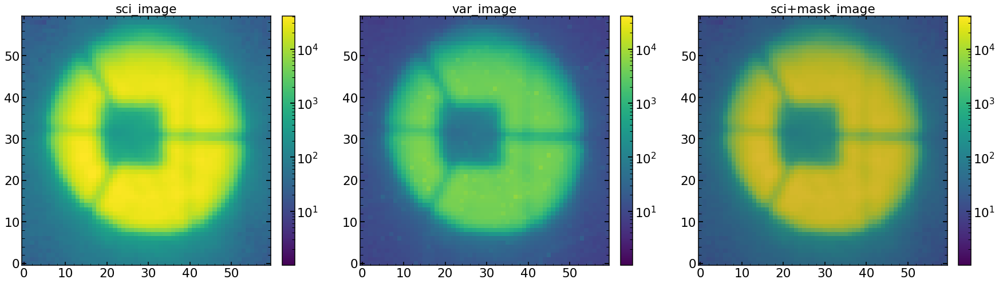

In [17]:
single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)
single_analysis.create_basic_data_image()

117
1


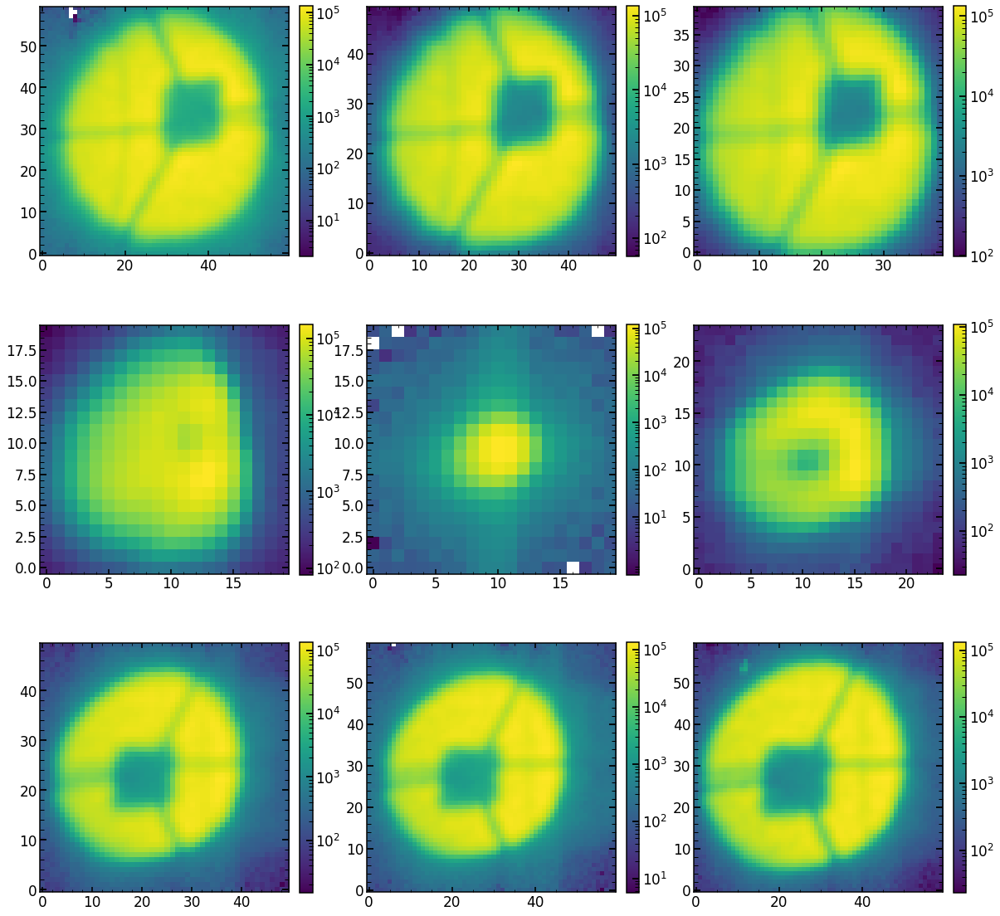

In [18]:
matplotlib.rcParams.update({'font.size': 14})

#image_index=87

image_index=117

print(image_index)
print(finalAr.loc[image_index]['close'])

run_1=19238+6
run_2=19238+12
run_3=19238+18
run_4=19238+54-12
run_5=19238+54
run_6=19238+54+12
run_7=19238+54+36
run_8=19238+54+42
run_9=19238+54+48


sci_1_LAM=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/sci"+str(run_1)+str(image_index)+'HgAr_Stacked.npy')
sci_2_LAM=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/sci"+str(run_2)+str(image_index)+'HgAr_Stacked.npy')
sci_3_LAM=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/sci"+str(run_3)+str(image_index)+'HgAr_Stacked.npy')
sci_4_LAM=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/sci"+str(run_4)+str(image_index)+'HgAr_Stacked.npy')
sci_5_LAM=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/sci"+str(run_5)+str(image_index)+'HgAr_Stacked.npy')
sci_6_LAM=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/sci"+str(run_6)+str(image_index)+'HgAr_Stacked.npy')
sci_7_LAM=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/sci"+str(run_7)+str(image_index)+'HgAr_Stacked.npy')
sci_8_LAM=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/sci"+str(run_8)+str(image_index)+'HgAr_Stacked.npy')
sci_9_LAM=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/sci"+str(run_9)+str(image_index)+'HgAr_Stacked.npy')

plt.figure(figsize=(20,20))
plt.subplot(331)
plt.imshow(sci_1_LAM,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(332)
plt.imshow(sci_2_LAM,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(333)
plt.imshow(sci_3_LAM,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(334)
plt.imshow(sci_4_LAM,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(335)
plt.imshow(sci_5_LAM,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(336)
plt.imshow(sci_6_LAM,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(337)
plt.imshow(sci_7_LAM,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(338)
plt.imshow(sci_8_LAM,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(339)
plt.imshow(sci_9_LAM,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

1


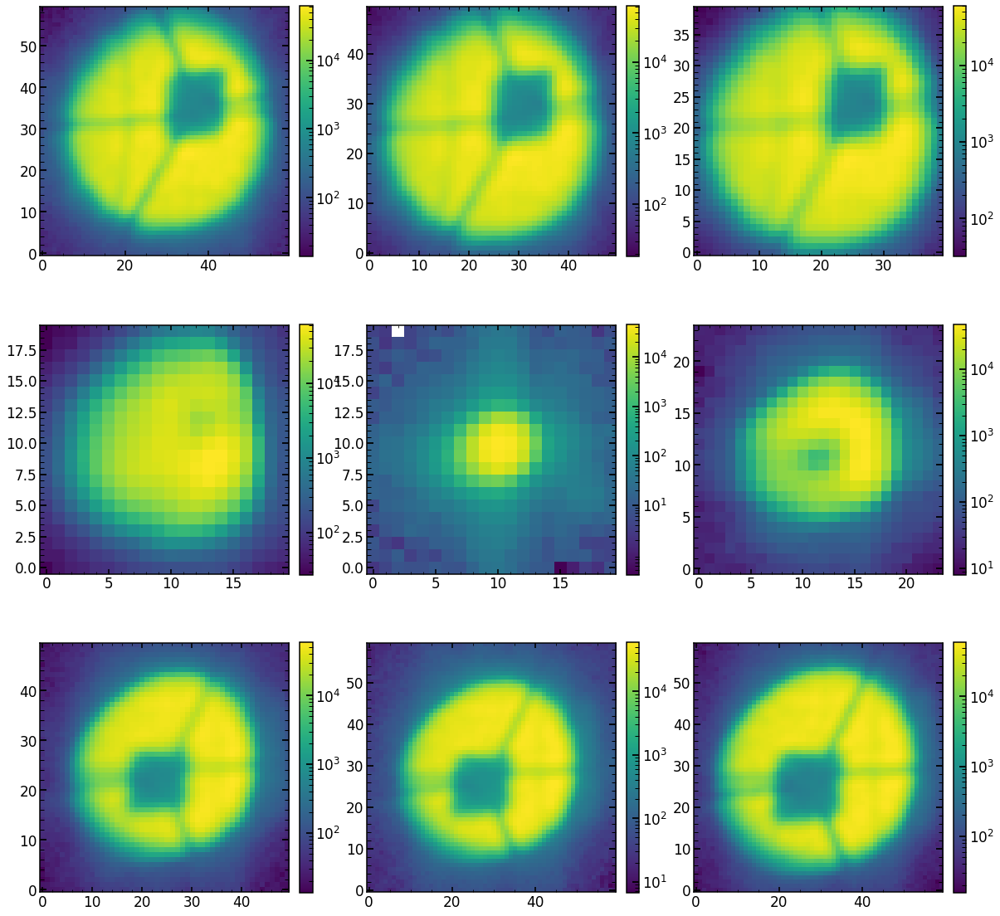

In [20]:
matplotlib.rcParams.update({'font.size': 14})



print(finalAr.loc[image_index]['close'])

run_1=34341+0
run_2=34341+6
run_3=34341+12
run_4=34341+48-12
run_5=34341+48
run_6=34341+48+12
run_7=34341+48+36
run_8=34341+48+42
run_9=34341+48+48


sci_1=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci"+str(run_1)+str(image_index)+'Ar_Stacked.npy')
sci_2=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci"+str(run_2)+str(image_index)+'Ar_Stacked.npy')
sci_3=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci"+str(run_3)+str(image_index)+'Ar_Stacked.npy')
sci_4=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci"+str(run_4)+str(image_index)+'Ar_Stacked.npy')
sci_5=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci"+str(run_5)+str(image_index)+'Ar_Stacked.npy')
sci_6=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci"+str(run_6)+str(image_index)+'Ar_Stacked.npy')
sci_7=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci"+str(run_7)+str(image_index)+'Ar_Stacked.npy')
sci_8=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci"+str(run_8)+str(image_index)+'Ar_Stacked.npy')
sci_9=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci"+str(run_9)+str(image_index)+'Ar_Stacked.npy')

plt.figure(figsize=(20,20))
plt.subplot(331)
plt.imshow(sci_1,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(332)
plt.imshow(sci_2,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(333)
plt.imshow(sci_3,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(334)
plt.imshow(sci_4,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(335)
plt.imshow(sci_5,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(336)
plt.imshow(sci_6,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(337)
plt.imshow(sci_7,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(338)
plt.imshow(sci_8,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(339)
plt.imshow(sci_9,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

In [72]:

image_index=117

print(image_index)
print(finalAr.loc[image_index])

run_1=21346+6
run_9=21346+54+48


sci_1_LAM=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Aug_14/Stamps_cleaned/sci"+str(run_1)+str(image_index)+'HgAr_Stacked.npy')
sci_9_LAM=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Aug_14/Stamps_cleaned/sci"+str(run_9)+str(image_index)+'HgAr_Stacked.npy')


run_1=34341+0
run_9=34341+48+48
sci_1=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci"+str(run_1)+str(image_index)+'Ar_Stacked.npy')
sci_9=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci"+str(run_9)+str(image_index)+'Ar_Stacked.npy')

117
fiber                  650
xc                    4008
yc                    3393
wavelength        912.5693
close                    1
lamp                    Ar
xc_effective          4077
second_offset            0
second_ratio             0
second2_offset           0
second2_ratio            0
Name: 117, dtype: object


Text(0.5, 1.0, 'Subaru data, defocus=4 mm, fiber=650, vw=912.569 nm')

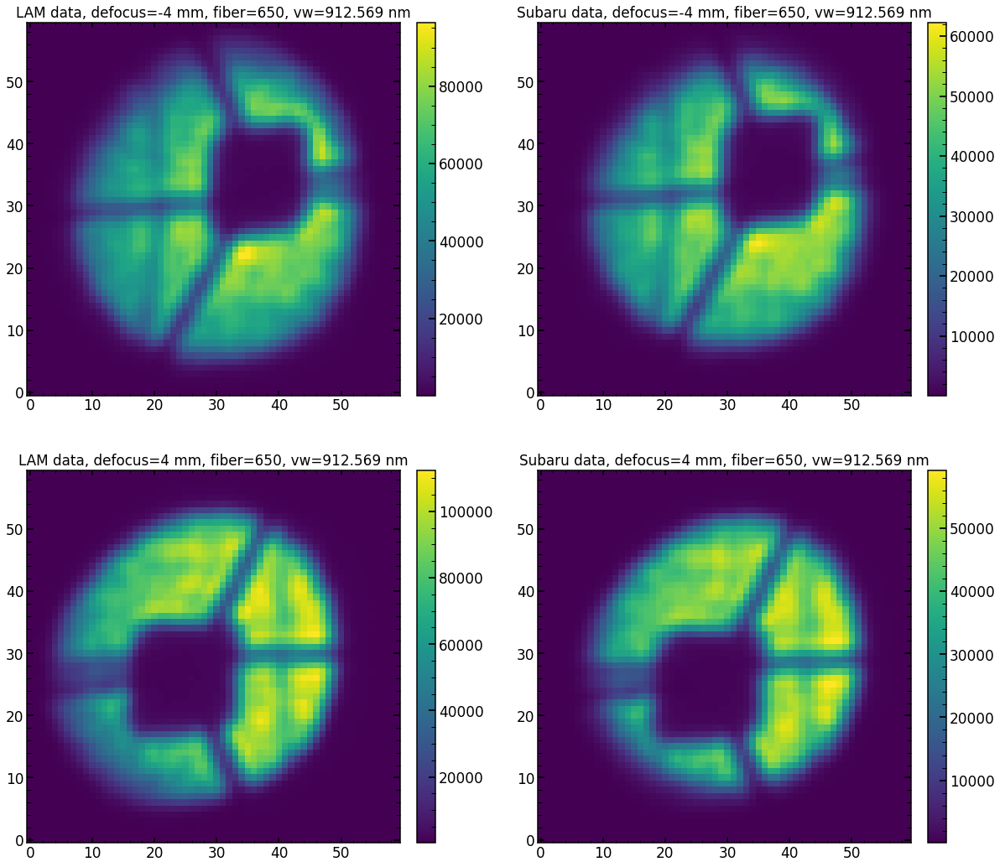

In [74]:

plt.figure(figsize=(20,18))
plt.subplot(221)

plt.imshow(sci_1_LAM,vmax=np.max(sci_1_LAM),vmin=np.max(sci_1_LAM)/1000)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('LAM data, defocus=-4 mm, fiber=650, vw=912.569 nm')

plt.subplot(222)

plt.imshow(sci_1,vmax=np.max(sci_1),vmin=np.max(sci_1)/1000)

cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Subaru data, defocus=-4 mm, fiber=650, vw=912.569 nm')


plt.subplot(223)
plt.imshow(sci_9_LAM,vmax=np.max(sci_9_LAM),vmin=np.max(sci_9_LAM)/1000)

cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('LAM data, defocus=4 mm, fiber=650, vw=912.569 nm')


plt.subplot(224)

plt.imshow(sci_9,vmax=np.max(sci_9),vmin=np.max(sci_9)/1000)

cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Subaru data, defocus=4 mm, fiber=650, vw=912.569 nm')

56
fiber                  339
xc                    1610
yc                    2635
wavelength        852.4029
close                    1
lamp                    Ar
xc_effective          1610
second_offset            0
second_ratio             0
second2_offset           0
second2_ratio            0
Name: 56, dtype: object
exposure_defocus_1_LAM: -4.0
exposure_defocus_9_LAM: 4.0


Text(0.5, 1.0, 'Subaru data, defocus=4 mm, fiber=339, vw=852.40 nm')

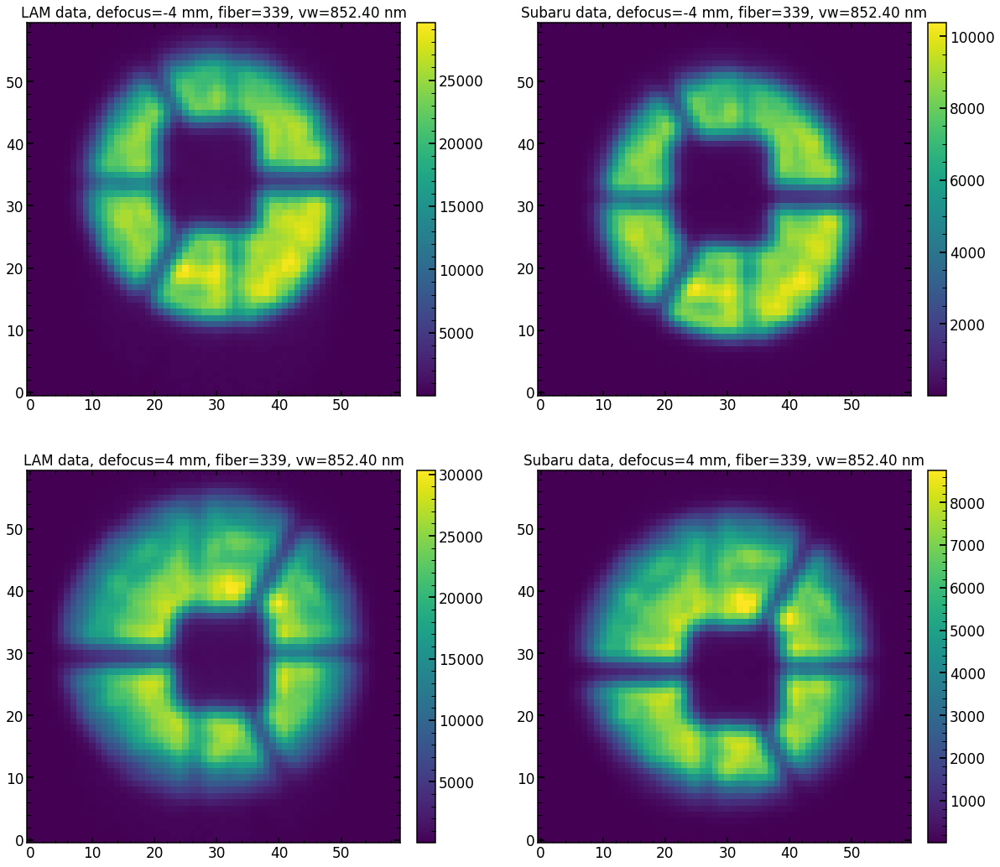

In [87]:

image_index=56

print(image_index)
print(finalAr.loc[image_index])

run_1=21346+6
run_9=21346+54+48


sci_1_LAM=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/sci"+str(run_1)+str(image_index)+'HgAr_Stacked.npy')
sci_9_LAM=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/sci"+str(run_9)+str(image_index)+'HgAr_Stacked.npy')

sci_1_LAM_raw=fits.open('/Volumes/Saturn_USA/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-07-26/v00'+str(run_1)+'/calExp-LA0'+str(run_1)+'r1.fits')
exposure_defocus_1_LAM=np.round(sci_1_LAM_raw[0].header['W_ENFCAX'],2)
print('exposure_defocus_1_LAM: '+str(exposure_defocus_1_LAM))
sci_9_LAM_raw=fits.open('/Volumes/Saturn_USA/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-07-26/v00'+str(run_9)+'/calExp-LA0'+str(run_9)+'r1.fits')
exposure_defocus_9_LAM=np.round(sci_9_LAM_raw[0].header['W_ENFCAX'],2)
print('exposure_defocus_9_LAM: '+str(exposure_defocus_9_LAM))

run_1=34341+0
run_9=34341+48+48
sci_1=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci"+str(run_1)+str(image_index)+'Ar_Stacked.npy')
sci_9=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci"+str(run_9)+str(image_index)+'Ar_Stacked.npy')


plt.figure(figsize=(20,18))
plt.subplot(221)

plt.imshow(sci_1_LAM,vmax=np.max(sci_1_LAM),vmin=np.max(sci_1_LAM)/1000)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('LAM data, defocus=-4 mm, fiber=339, vw=852.40 nm')

plt.subplot(222)

plt.imshow(sci_1,vmax=np.max(sci_1),vmin=np.max(sci_1)/1000)

cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Subaru data, defocus=-4 mm, fiber=339, vw=852.40 nm')


plt.subplot(223)
plt.imshow(sci_9_LAM,vmax=np.max(sci_9_LAM),vmin=np.max(sci_9_LAM)/1000)

cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('LAM data, defocus=4 mm, fiber=339, vw=852.40 nm')


plt.subplot(224)

plt.imshow(sci_9,vmax=np.max(sci_9),vmin=np.max(sci_9)/1000)

cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Subaru data, defocus=4 mm, fiber=339, vw=852.40 nm')

dx,dy0 3
center of sci_1_LAM_renormalized: (30.44656816730876, 31.4951159745555)
center of sci_1_LAM_renormalized moved: (30.44467047522903, 28.52897860023394)
center of sci_1: (30.56181699118944, 28.861129325904763)
(29.208646050629316, 31.803799520001462)
(29.20912009545198, 28.840988874622944)
(29.740706525102713, 29.79638225826512)


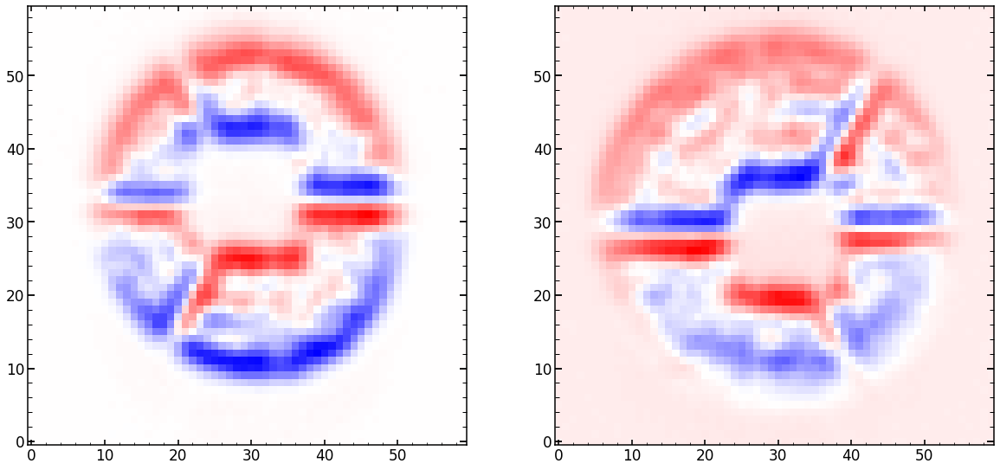

In [88]:
plt.figure(figsize=(20,10))

plt.subplot(121)
sci_1_LAM_renormalized=sci_1_LAM*np.sum(sci_1)/np.sum(sci_1_LAM)

dx,dy=np.array(find_centroid_of_flux(sci_1_LAM_renormalized))-np.array(find_centroid_of_flux(sci_1))
dx=int(np.round(dx))
dy=int(np.round(dy))

print('dx,dy'+str(dx)+' '+str(dy))
sci_1_LAM_renormalized_moved=np.zeros((60,60))
sci_1_LAM_renormalized_moved[0:60-dy,0:60-dx]=sci_1_LAM_renormalized[dy:60,dx:60]



print('center of sci_1_LAM_renormalized: '+str(find_centroid_of_flux(sci_1_LAM_renormalized)))
print('center of sci_1_LAM_renormalized moved: '+str(find_centroid_of_flux(sci_1_LAM_renormalized_moved)))

print('center of sci_1: '+str(find_centroid_of_flux(sci_1)))

plt.imshow(sci_1_LAM_renormalized-sci_1,cmap='bwr')


plt.subplot(122)
sci_9_LAM_renormalized=sci_9_LAM*np.sum(sci_9)/np.sum(sci_9_LAM)

sci_9_LAM_renormalized_moved=np.zeros((60,60))
sci_9_LAM_renormalized_moved[0:60-dy,0:60-dx]=sci_9_LAM_renormalized[dy:60,dx:60]

print(find_centroid_of_flux(sci_9_LAM_renormalized))
print(find_centroid_of_flux(sci_9_LAM_renormalized_moved))

print(find_centroid_of_flux(sci_9))

plt.imshow(sci_9_LAM_renormalized-sci_9,cmap='bwr')

Text(0.5, 1.0, 'cut along the middle of the image vertically, moved to roughly match, defocus=4mm, fiber=339, vw=852.40 nm')

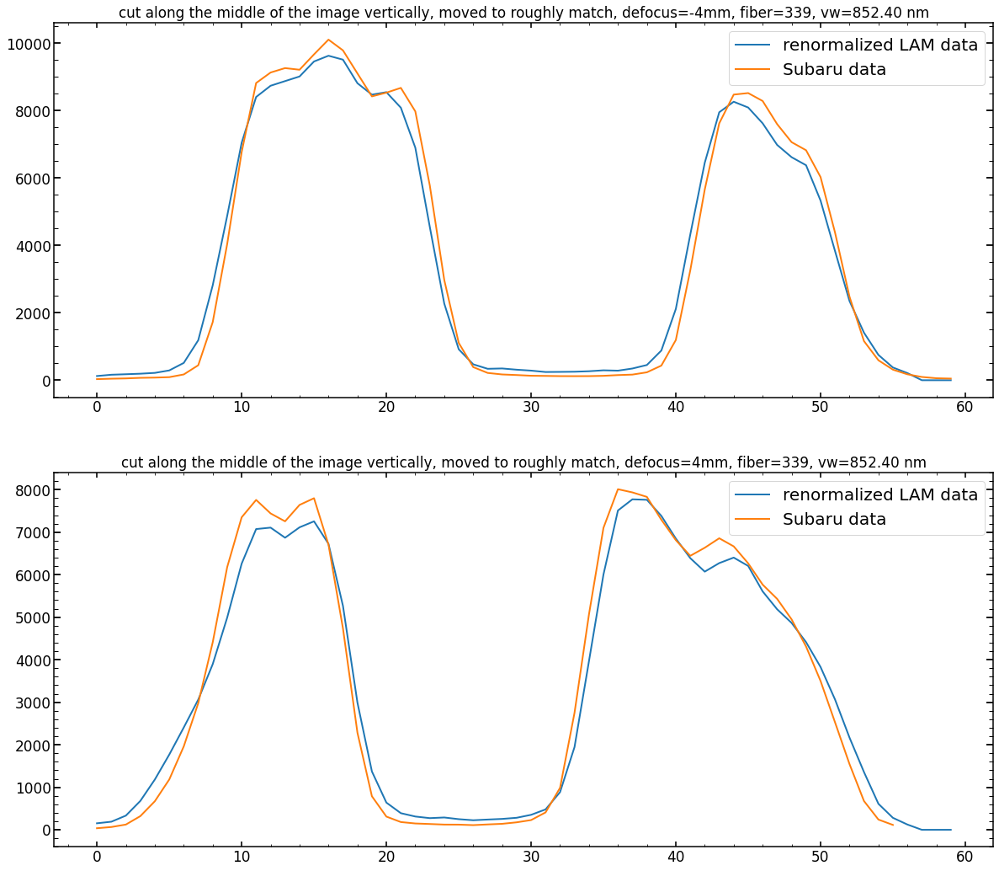

In [90]:
plt.figure(figsize=(20,18))

plt.subplot(211)
plt.plot(sci_1_LAM_renormalized_moved[:,30],lw=2,label='renormalized LAM data')
plt.plot(sci_1[:,30][0:60],lw=2, label='Subaru data')
plt.legend(fontsize=20)

plt.title('cut along the middle of the image vertically, moved to roughly match, defocus=-4mm, fiber=339, vw=852.40 nm')

plt.subplot(212)
plt.plot(sci_9_LAM_renormalized_moved[:,30],lw=2,label='renormalized LAM data')
plt.plot(sci_9[:,30][1:57],lw=2, label='Subaru data')
plt.legend(fontsize=20)

plt.title('cut along the middle of the image vertically, moved to roughly match, defocus=4mm, fiber=339, vw=852.40 nm')

# PIPE2D-757 (poor solution in red)

## case 11

fraction of chi2 due to 1% of pixels: 0.09996654
chi**2 max reduced is: 6603.958
chi**2 reduced is: 73.14743 for log improvment: -1.9556053
---------------------
chi**2 reduced within mask area is: 73.14743
---------------------
chi**2 max reduced within flux mask area is: 15632.917
chi**2 reduced within flux mask area is: 130.88095 for log improvment: -2.0771635
---------------------
Abs of residual divided by total flux is: 0.07597186
Abs of residual divided by largest value of a flux in the image is: 0.16996196


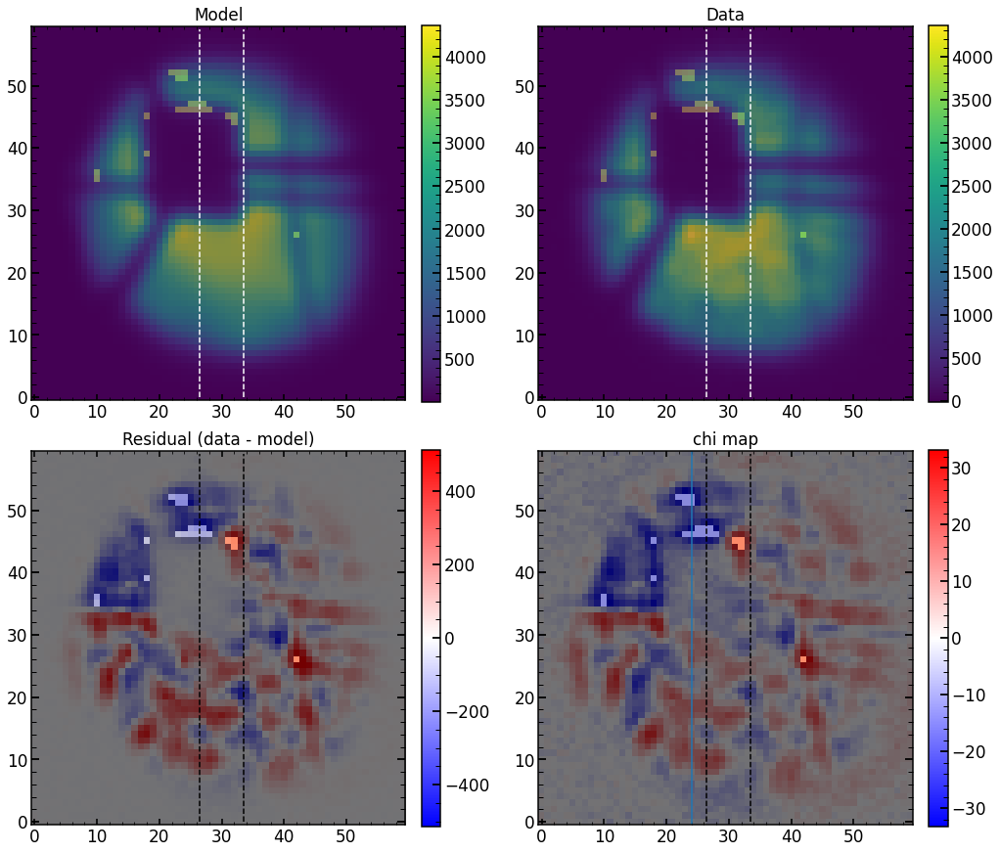

In [244]:
single_number=11
array_of_sci_image=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_sci_image'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_single_model_image=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_single_model_image'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_var_images=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_var_images'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_mask_images=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_mask_images'+'_'+str(single_number)+'.npy',allow_pickle=True)


index_of_single_image=0


single_analysis.create_basic_comparison_plot(custom_model_image=array_of_single_model_image[index_of_single_image],custom_mask=array_of_mask_images[index_of_single_image],\
                                             custom_sci_image=array_of_sci_image[index_of_single_image],custom_var_image=array_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

plt.axvline(24)


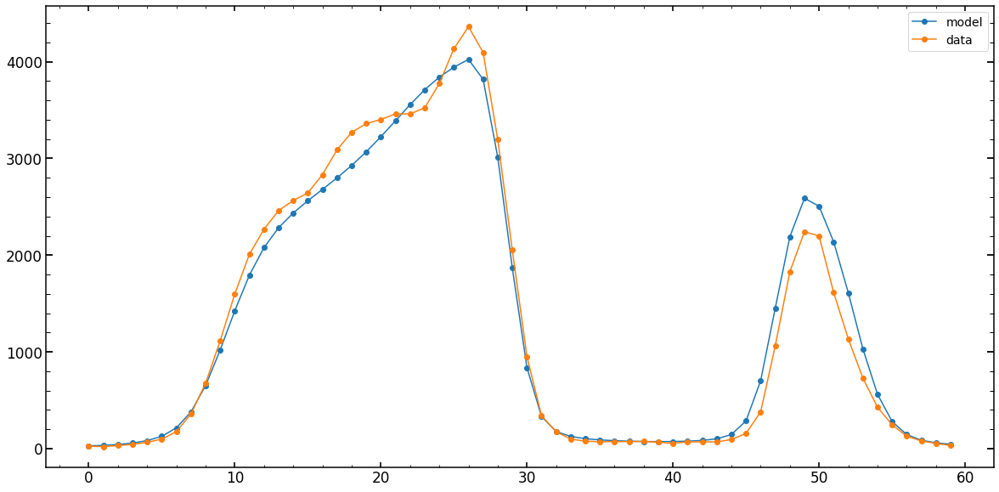

In [245]:
plt.figure(figsize=(20,10))
plt.plot(array_of_single_model_image[index_of_single_image][:,24],label='model',marker='o')
plt.plot(array_of_sci_image[index_of_single_image][:,24],label='data',marker='o')
plt.legend()

fraction of chi2 due to 1% of pixels: 0.1256252
chi**2 max reduced is: 6020.837
chi**2 reduced is: 51.582695 for log improvment: -2.0671527
---------------------
chi**2 reduced within mask area is: 51.58269
---------------------
chi**2 max reduced within flux mask area is: 14081.09
chi**2 reduced within flux mask area is: 98.14617 for log improvment: -2.1567628
---------------------
Abs of residual divided by total flux is: 0.06738955
Abs of residual divided by largest value of a flux in the image is: 0.21983501


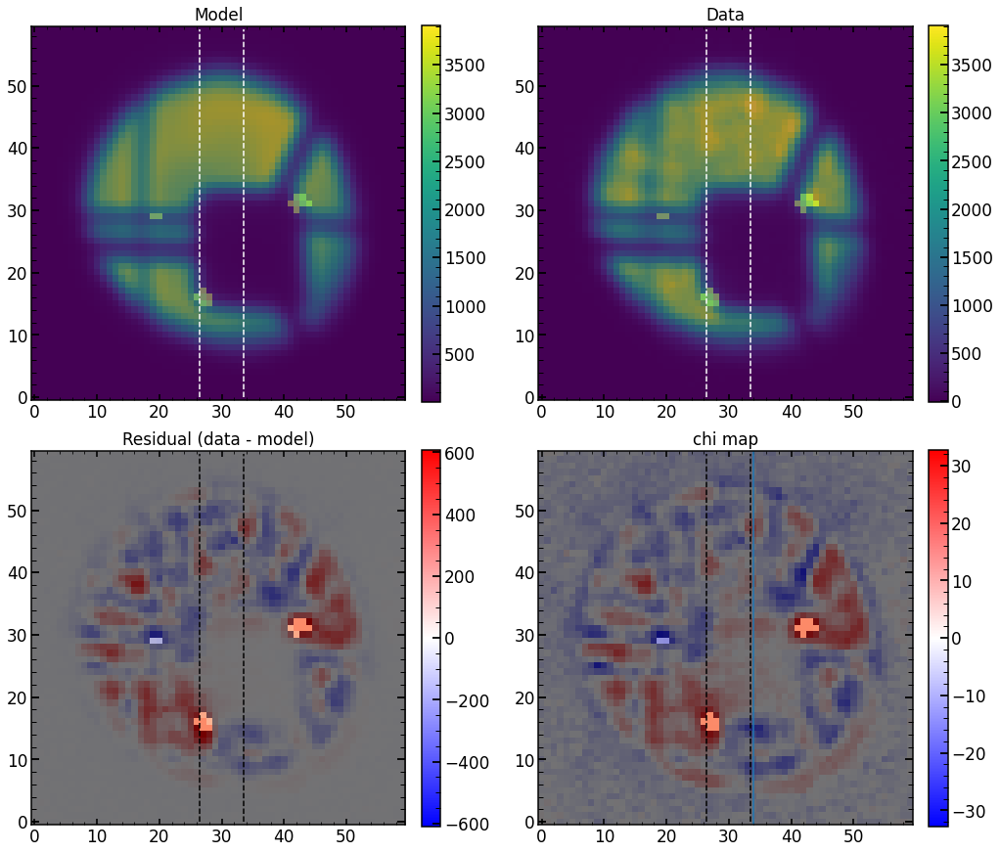

In [246]:
index_of_single_image=8


single_analysis.create_basic_comparison_plot(custom_model_image=array_of_single_model_image[index_of_single_image],custom_mask=array_of_mask_images[index_of_single_image],\
                                             custom_sci_image=array_of_sci_image[index_of_single_image],custom_var_image=array_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

plt.axvline(34)


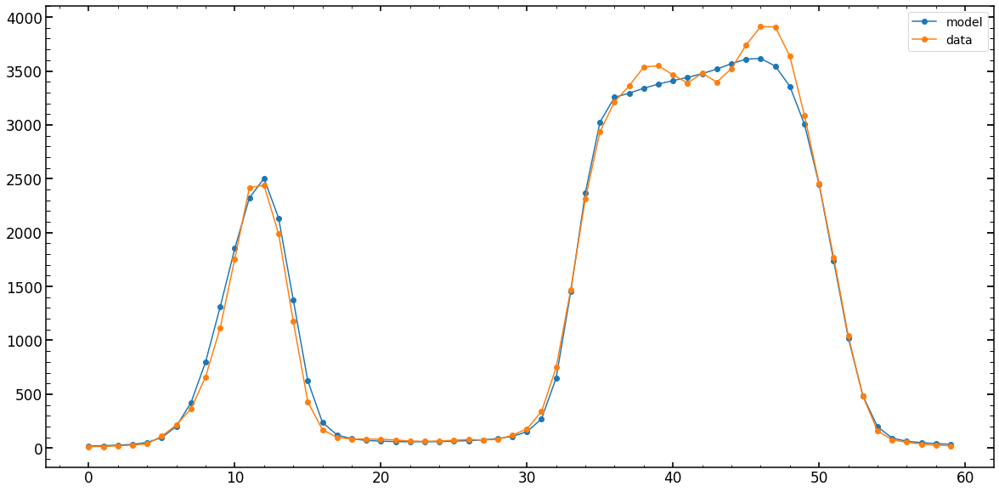

In [247]:
plt.figure(figsize=(20,10))
plt.plot(array_of_single_model_image[index_of_single_image][:,34],label='model',marker='o')
plt.plot(array_of_sci_image[index_of_single_image][:,34],label='data',marker='o')
plt.legend()

## case 119

In [ ]:
plt.plot(np.sum(array_of_single_model_image[index_of_single_image][:,20])
plt.plot(array_of_sci_image[index_of_single_image][:,20])

fraction of chi2 due to 1% of pixels: 0.08359174
chi**2 max reduced is: 6743.2295
chi**2 reduced is: 102.259796 for log improvment: -1.819163
---------------------
chi**2 reduced within mask area is: 102.2598
---------------------
chi**2 max reduced within flux mask area is: 15616.658
chi**2 reduced within flux mask area is: 189.66788 for log improvment: -1.9155943
---------------------
Abs of residual divided by total flux is: 0.09431785
Abs of residual divided by largest value of a flux in the image is: 0.19989352


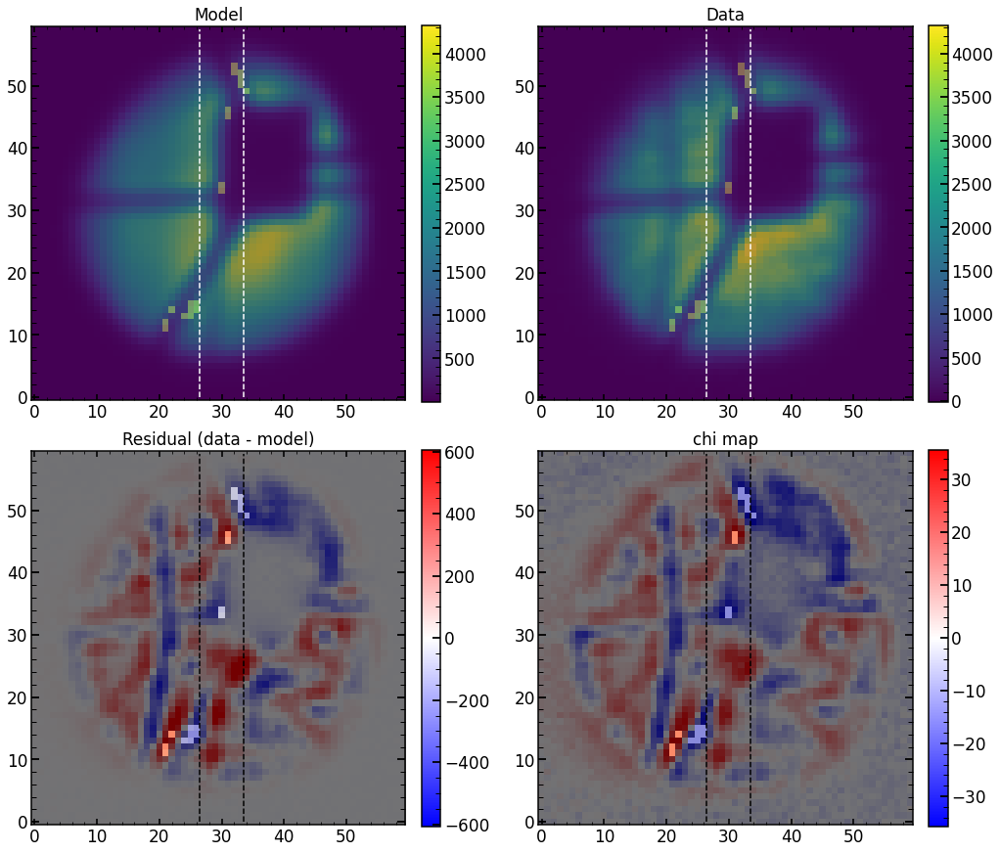

In [158]:
single_number=119
array_of_sci_image=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_sci_image'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_single_model_image=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_single_model_image'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_var_images=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_var_images'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_mask_images=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_mask_images'+'_'+str(single_number)+'.npy',allow_pickle=True)


index_of_single_image=0

single_analysis.create_basic_comparison_plot(custom_model_image=array_of_single_model_image[index_of_single_image],custom_mask=array_of_mask_images[index_of_single_image],\
                                             custom_sci_image=array_of_sci_image[index_of_single_image],custom_var_image=array_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

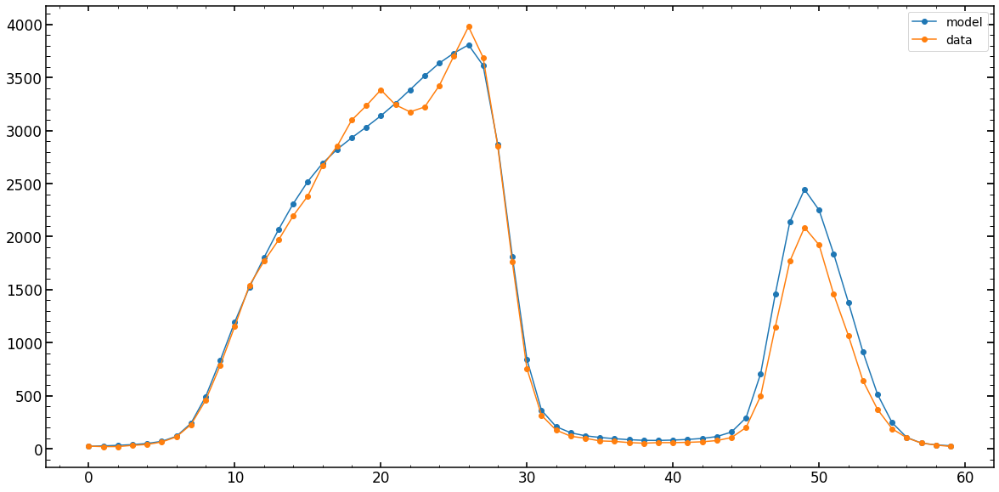

In [160]:
plt.figure(figsize=(20,10))
plt.plot(array_of_single_model_image[index_of_single_image][:,40],label='model',marker='o')
plt.plot(array_of_sci_image[index_of_single_image][:,40],label='data',marker='o')
plt.legend()

fraction of chi2 due to 1% of pixels: 0.0955636
chi**2 max reduced is: 6287.7456
chi**2 reduced is: 74.199356 for log improvment: -1.9280949
---------------------
chi**2 reduced within mask area is: 74.199356
---------------------
chi**2 max reduced within flux mask area is: 14762.162
chi**2 reduced within flux mask area is: 140.29703 for log improvment: -2.0221014
---------------------
Abs of residual divided by total flux is: 0.08079599
Abs of residual divided by largest value of a flux in the image is: 0.20157935


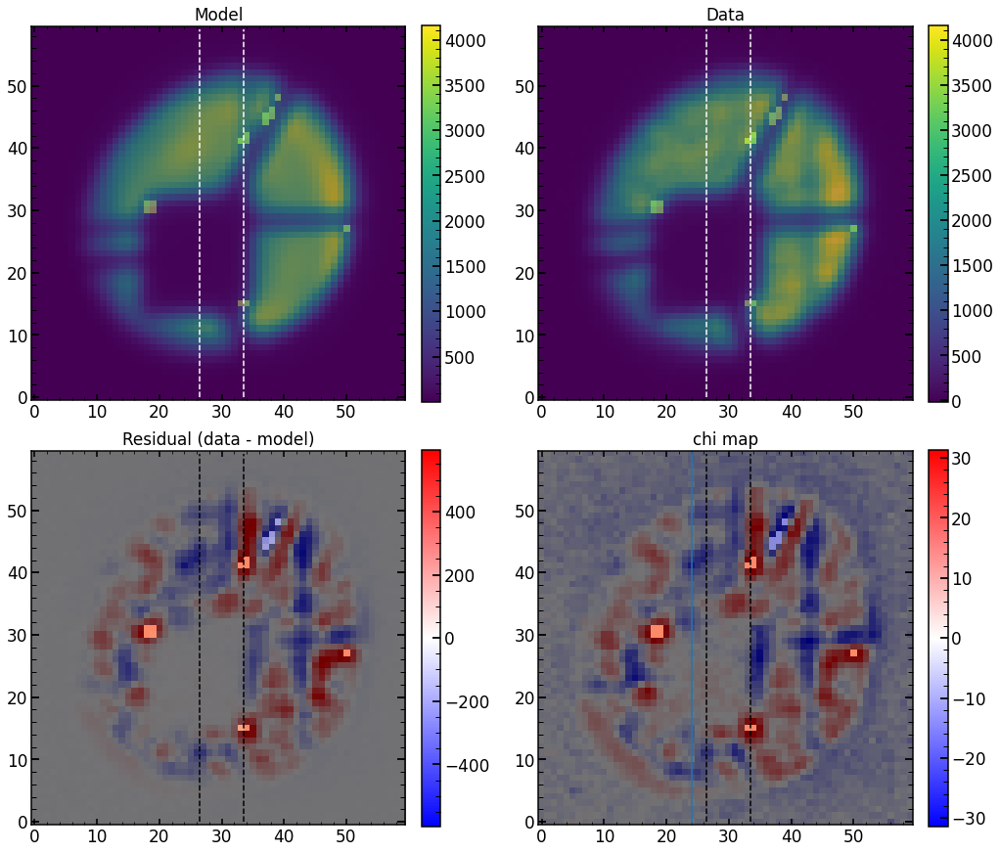

In [162]:
index_of_single_image=8


single_analysis.create_basic_comparison_plot(custom_model_image=array_of_single_model_image[index_of_single_image],custom_mask=array_of_mask_images[index_of_single_image],\
                                             custom_sci_image=array_of_sci_image[index_of_single_image],custom_var_image=array_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

plt.axvline(24)


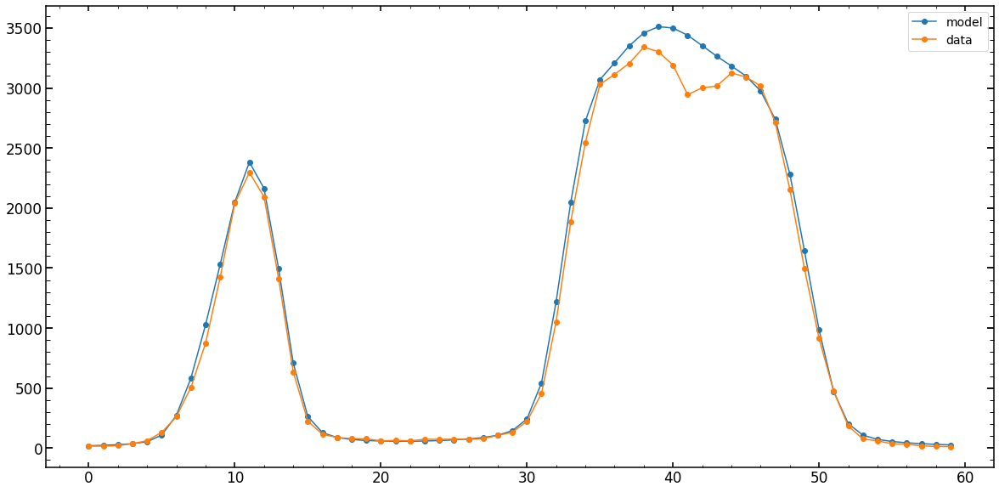

In [163]:
plt.figure(figsize=(20,10))
plt.plot(array_of_single_model_image[index_of_single_image][:,24],label='model',marker='o')
plt.plot(array_of_sci_image[index_of_single_image][:,24],label='data',marker='o')
plt.legend()

## case 59

fraction of chi2 due to 1% of pixels: 0.078222334
chi**2 max reduced is: 7316.2314
chi**2 reduced is: 38.20243 for log improvment: -2.2821965
---------------------
chi**2 reduced within mask area is: 38.20243
---------------------
chi**2 max reduced within flux mask area is: 17118.367
chi**2 reduced within flux mask area is: 74.79241 for log improvment: -2.3596048
---------------------
Abs of residual divided by total flux is: 0.056437343
Abs of residual divided by largest value of a flux in the image is: 0.13395004


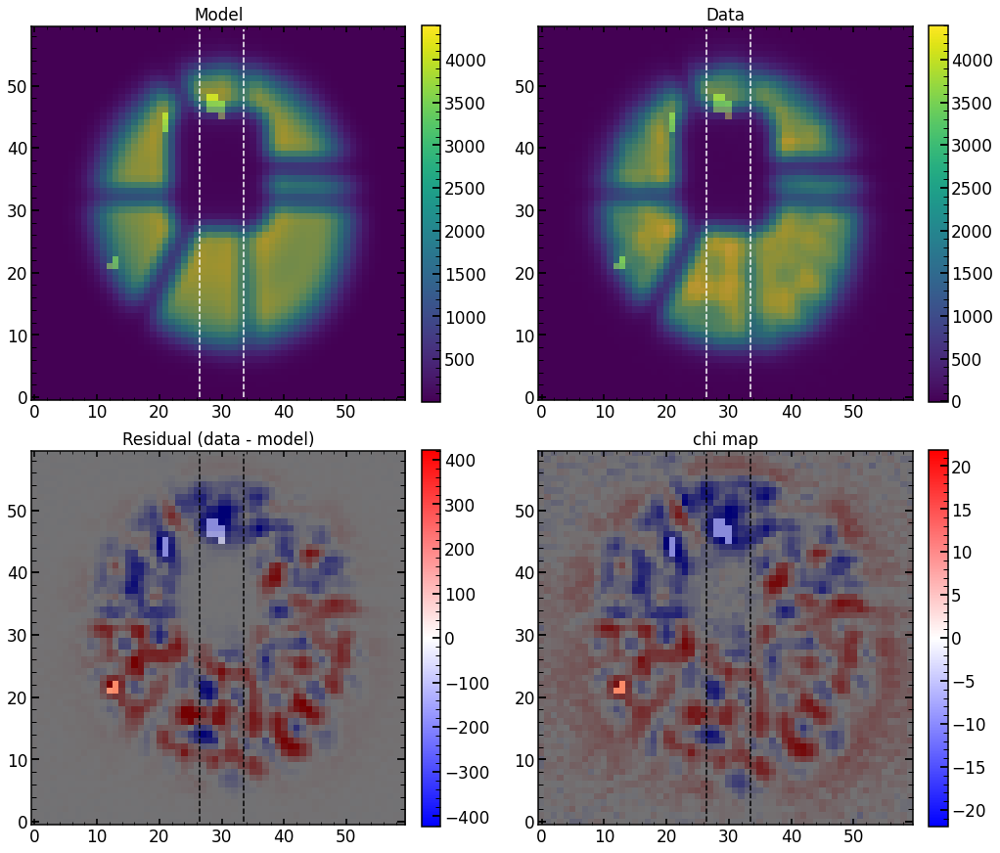

In [127]:
single_number=59
array_of_sci_image=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_sci_image'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_single_model_image=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_single_model_image'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_var_images=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_var_images'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_mask_images=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_mask_images'+'_'+str(single_number)+'.npy',allow_pickle=True)


index_of_single_image=0


single_analysis.create_basic_comparison_plot(custom_model_image=array_of_single_model_image[index_of_single_image],custom_mask=array_of_mask_images[index_of_single_image],\
                                             custom_sci_image=array_of_sci_image[index_of_single_image],custom_var_image=array_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

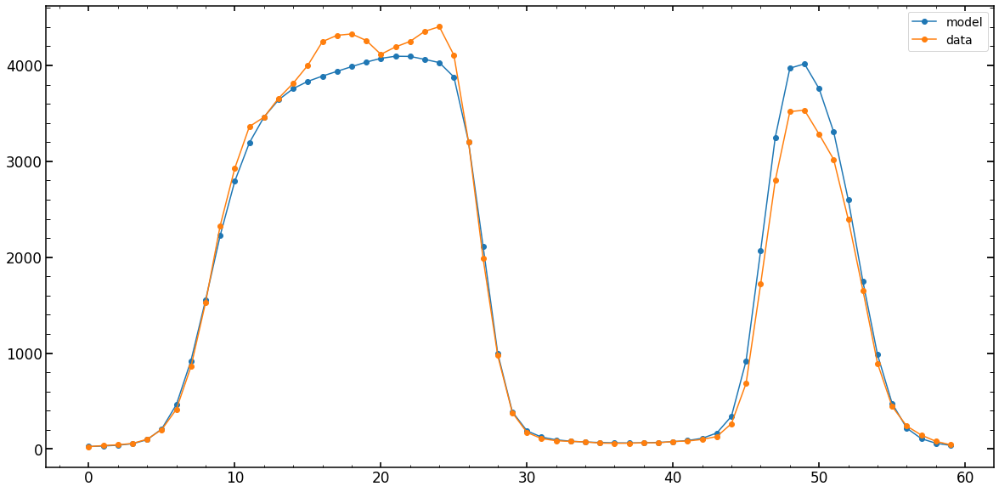

In [128]:
plt.figure(figsize=(20,10))
plt.plot(array_of_single_model_image[index_of_single_image][:,30],label='model',marker='o')
plt.plot(array_of_sci_image[index_of_single_image][:,30],label='data',marker='o')
plt.legend()

fraction of chi2 due to 1% of pixels: 0.07379115
chi**2 max reduced is: 6758.381
chi**2 reduced is: 36.996033 for log improvment: -2.2616875
---------------------
chi**2 reduced within mask area is: 36.996033
---------------------
chi**2 max reduced within flux mask area is: 15612.855
chi**2 reduced within flux mask area is: 68.94316 for log improvment: -2.3549912
---------------------
Abs of residual divided by total flux is: 0.056759097
Abs of residual divided by largest value of a flux in the image is: 0.12810427


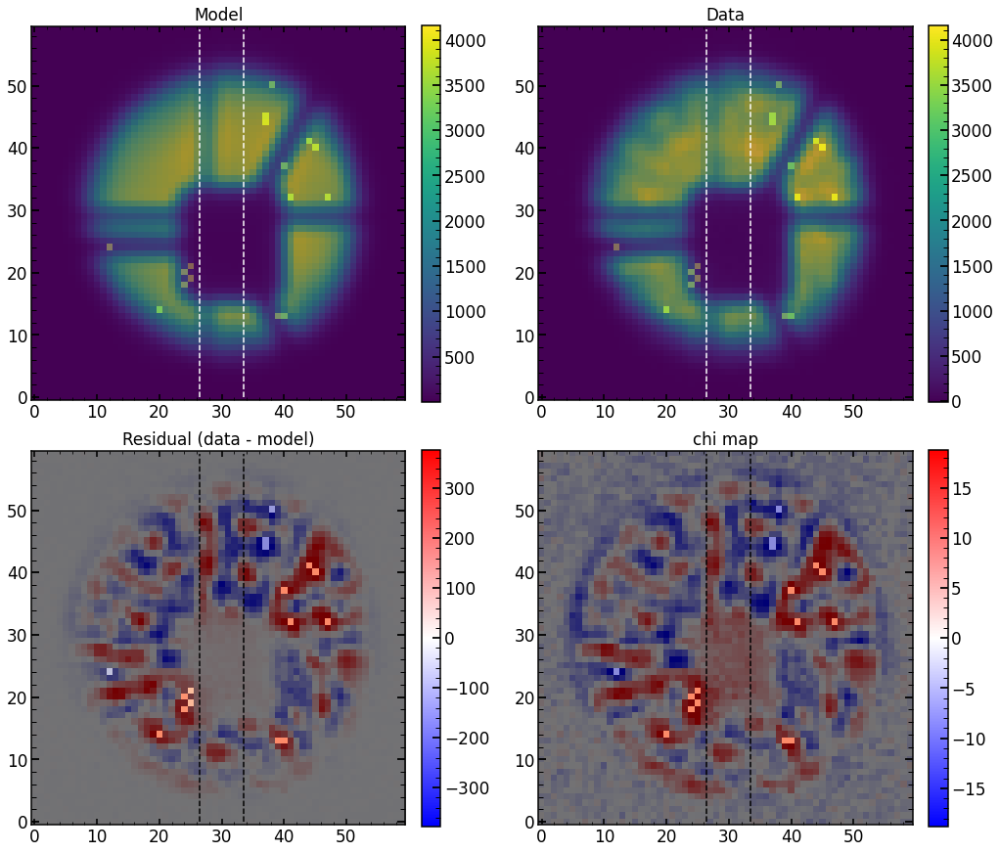

In [129]:

index_of_single_image=8


single_analysis.create_basic_comparison_plot(custom_model_image=array_of_single_model_image[index_of_single_image],custom_mask=array_of_mask_images[index_of_single_image],\
                                             custom_sci_image=array_of_sci_image[index_of_single_image],custom_var_image=array_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

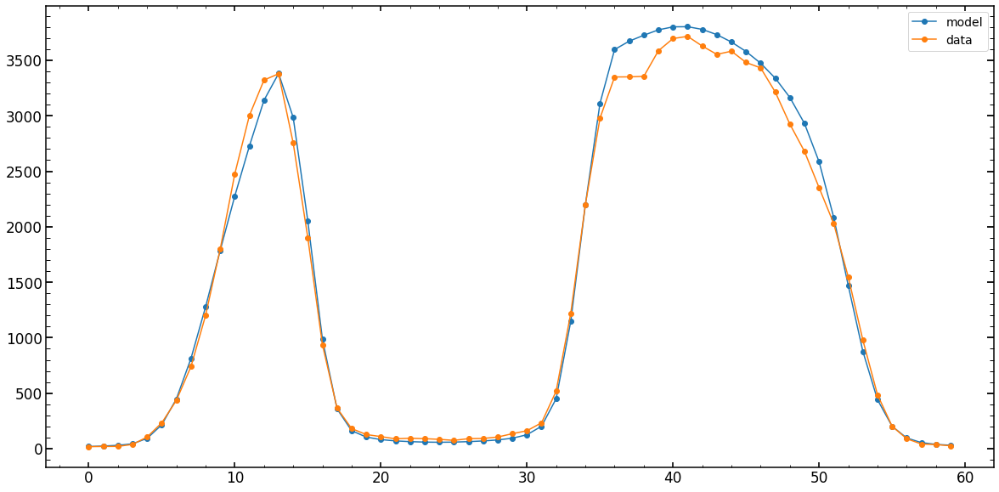

In [130]:
plt.figure(figsize=(20,10))
plt.plot(array_of_single_model_image[index_of_single_image][:,30],label='model',marker='o')
plt.plot(array_of_sci_image[index_of_single_image][:,30],label='data',marker='o')
plt.legend()

## case 43

fraction of chi2 due to 1% of pixels: 0.08718203
chi**2 max reduced is: 29222.805
chi**2 reduced is: 116.452866 for log improvment: -2.3995717
---------------------
chi**2 reduced within mask area is: 116.45287
---------------------
chi**2 max reduced within flux mask area is: 68034.69
chi**2 reduced within flux mask area is: 212.29907 for log improvment: -2.5057824
---------------------
Abs of residual divided by total flux is: 0.046037745
Abs of residual divided by largest value of a flux in the image is: 0.124611005


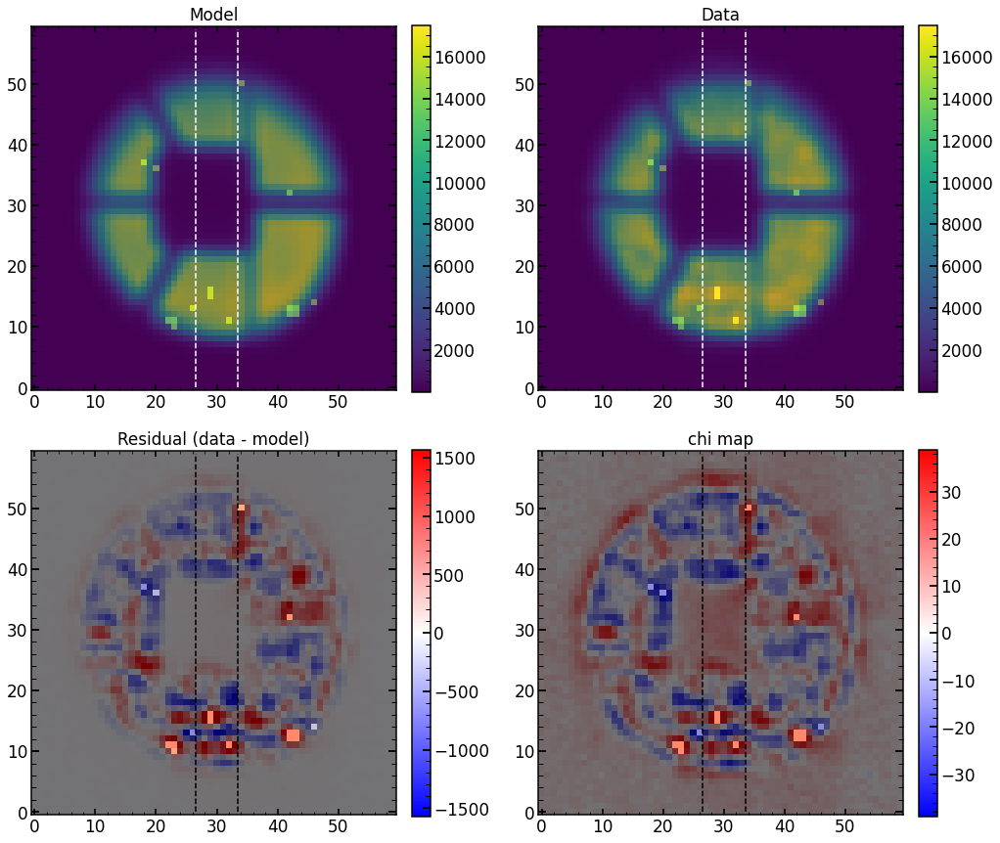

In [136]:
single_number=43
array_of_sci_image=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_sci_image'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_single_model_image=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_single_model_image'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_var_images=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_var_images'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_mask_images=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_mask_images'+'_'+str(single_number)+'.npy',allow_pickle=True)


index_of_single_image=0


single_analysis.create_basic_comparison_plot(custom_model_image=array_of_single_model_image[index_of_single_image],custom_mask=array_of_mask_images[index_of_single_image],\
                                             custom_sci_image=array_of_sci_image[index_of_single_image],custom_var_image=array_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

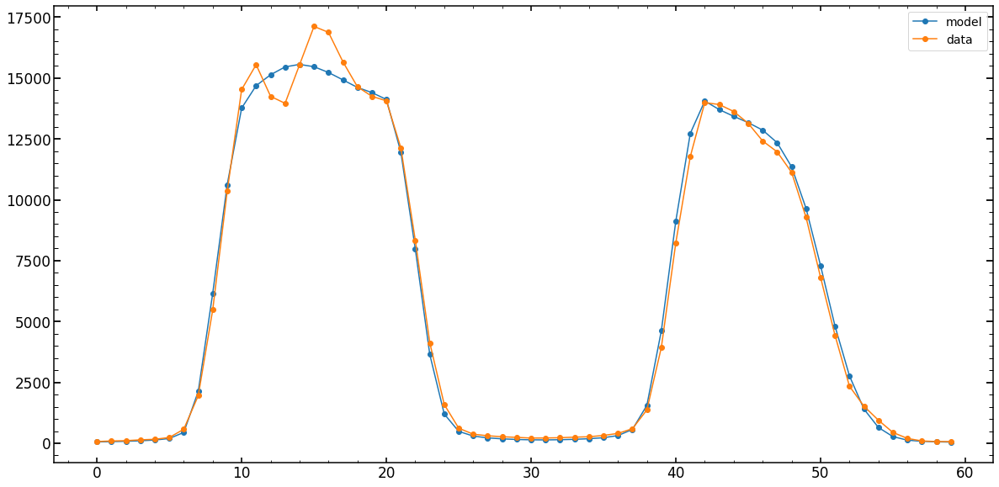

In [137]:
plt.figure(figsize=(20,10))
plt.plot(array_of_single_model_image[index_of_single_image][:,30],label='model',marker='o')
plt.plot(array_of_sci_image[index_of_single_image][:,30],label='data',marker='o')
plt.legend()

fraction of chi2 due to 1% of pixels: 0.094841465
chi**2 max reduced is: 27580.082
chi**2 reduced is: 127.52926 for log improvment: -2.3349857
---------------------
chi**2 reduced within mask area is: 127.52926
---------------------
chi**2 max reduced within flux mask area is: 62629.996
chi**2 reduced within flux mask area is: 231.99959 for log improvment: -2.4312952
---------------------
Abs of residual divided by total flux is: 0.051001765
Abs of residual divided by largest value of a flux in the image is: 0.12437045


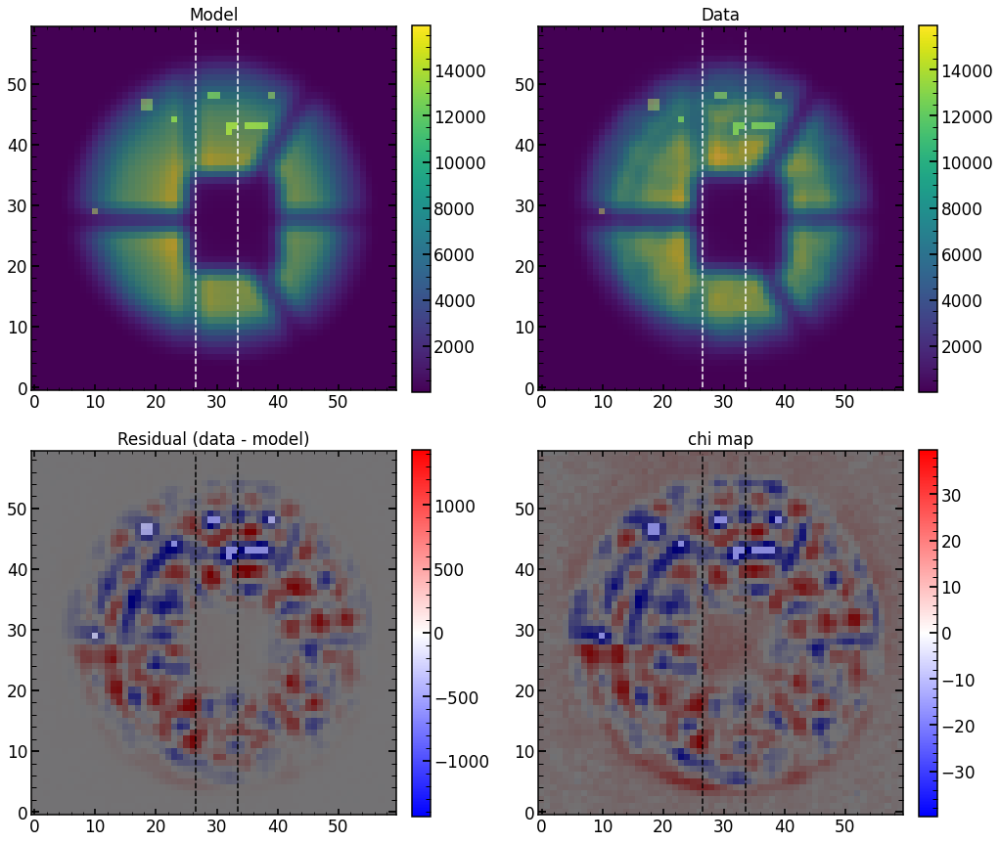

In [138]:

index_of_single_image=8


single_analysis.create_basic_comparison_plot(custom_model_image=array_of_single_model_image[index_of_single_image],custom_mask=array_of_mask_images[index_of_single_image],\
                                             custom_sci_image=array_of_sci_image[index_of_single_image],custom_var_image=array_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

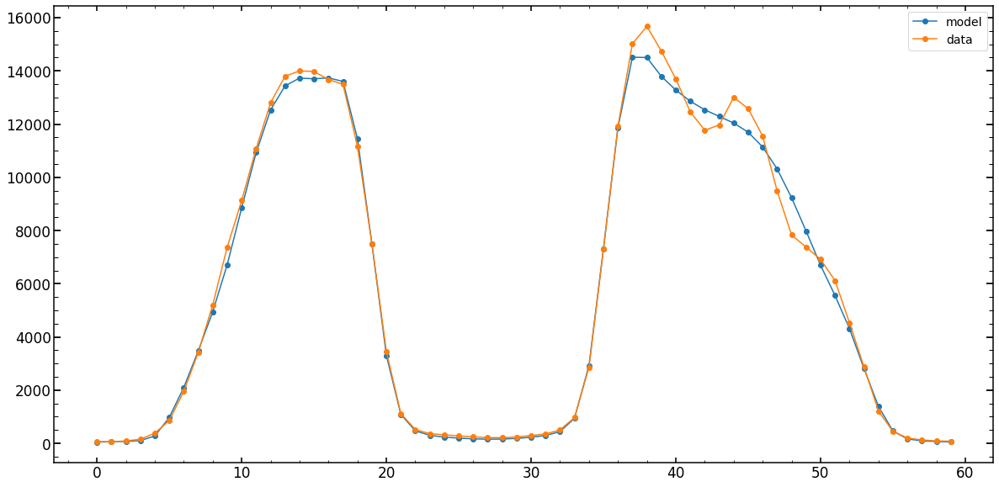

In [139]:
plt.figure(figsize=(20,10))
plt.plot(array_of_single_model_image[index_of_single_image][:,30],label='model',marker='o')
plt.plot(array_of_sci_image[index_of_single_image][:,30],label='data',marker='o')
plt.legend()

## case 37

fraction of chi2 due to 1% of pixels: 0.0916063
chi**2 max reduced is: 10912.398
chi**2 reduced is: 44.962395 for log improvment: -2.3850708
---------------------
chi**2 reduced within mask area is: 44.962395
---------------------
chi**2 max reduced within flux mask area is: 25111.957
chi**2 reduced within flux mask area is: 92.310715 for log improvment: -2.4346285
---------------------
Abs of residual divided by total flux is: 0.04808247
Abs of residual divided by largest value of a flux in the image is: 0.12888472


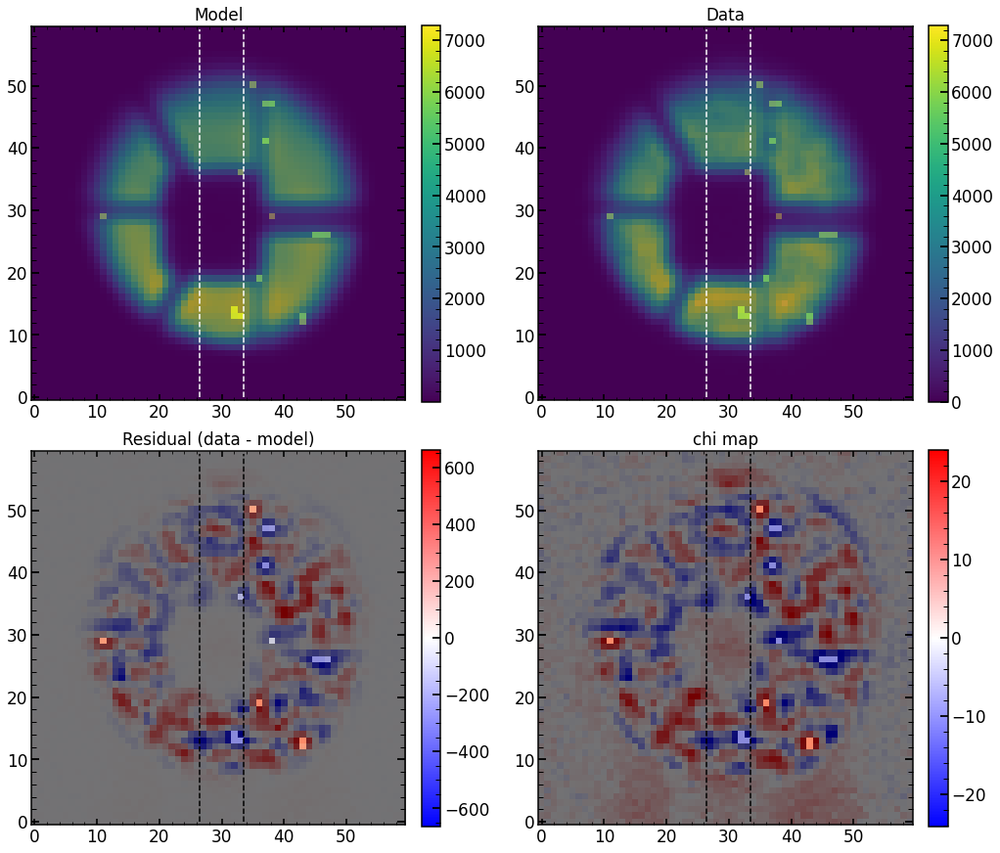

In [141]:
single_number=37
array_of_sci_image=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_sci_image'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_single_model_image=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_single_model_image'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_var_images=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_var_images'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_mask_images=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_mask_images'+'_'+str(single_number)+'.npy',allow_pickle=True)


index_of_single_image=0


single_analysis.create_basic_comparison_plot(custom_model_image=array_of_single_model_image[index_of_single_image],custom_mask=array_of_mask_images[index_of_single_image],\
                                             custom_sci_image=array_of_sci_image[index_of_single_image],custom_var_image=array_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

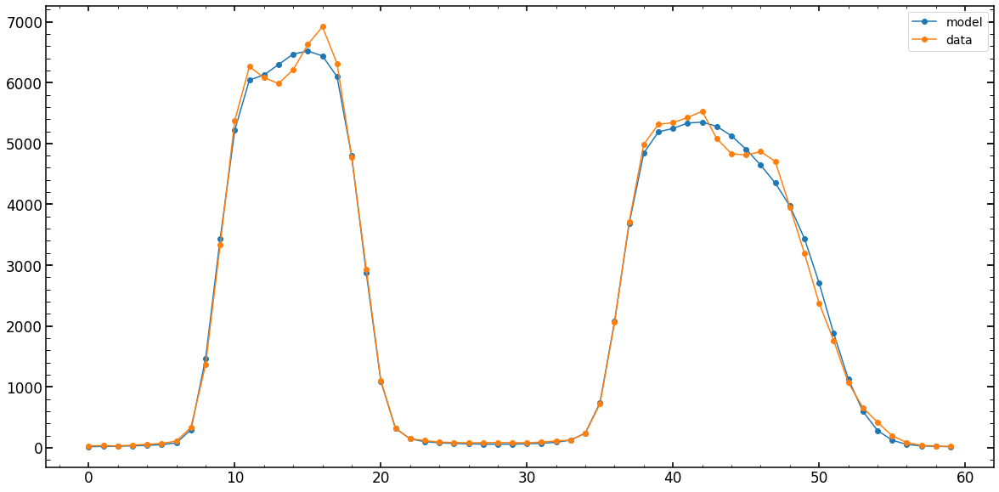

In [142]:
plt.figure(figsize=(20,10))
plt.plot(array_of_single_model_image[index_of_single_image][:,30],label='model',marker='o')
plt.plot(array_of_sci_image[index_of_single_image][:,30],label='data',marker='o')
plt.legend()

fraction of chi2 due to 1% of pixels: 0.10009286
chi**2 max reduced is: 10214.906
chi**2 reduced is: 48.51637 for log improvment: -2.3233461
---------------------
chi**2 reduced within mask area is: 48.51637
---------------------
chi**2 max reduced within flux mask area is: 22922.643
chi**2 reduced within flux mask area is: 91.510056 for log improvment: -2.3987958
---------------------
Abs of residual divided by total flux is: 0.05045962
Abs of residual divided by largest value of a flux in the image is: 0.12114981


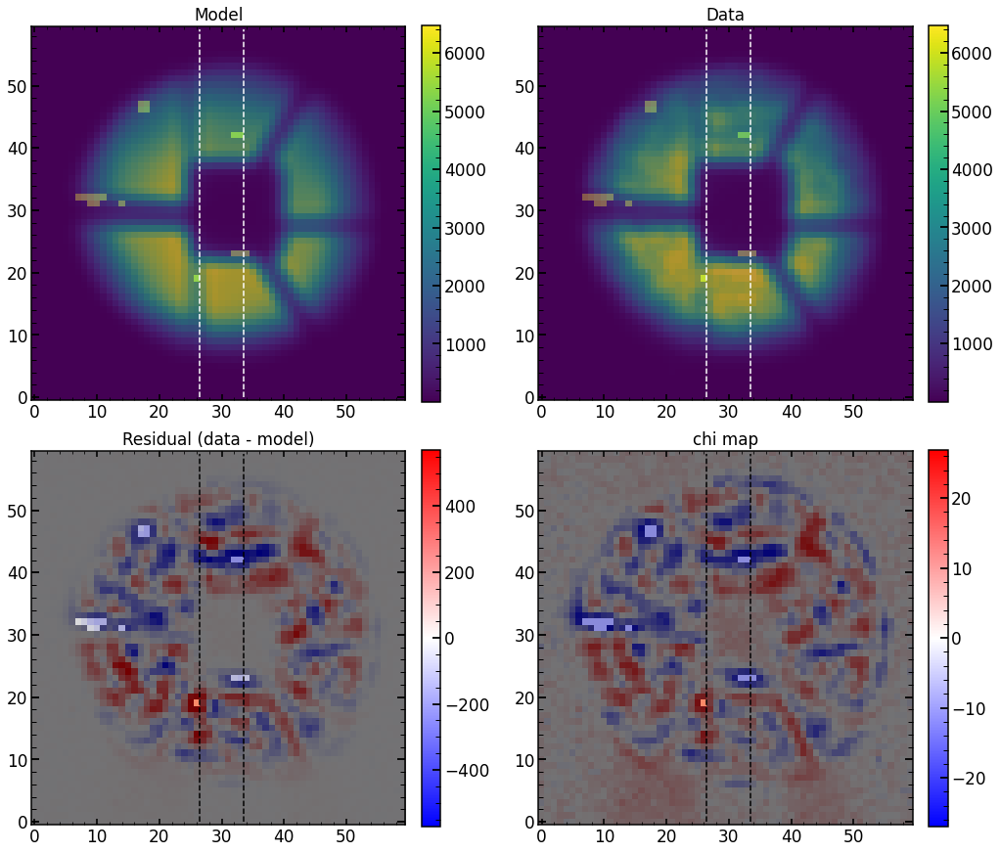

In [143]:

index_of_single_image=8


single_analysis.create_basic_comparison_plot(custom_model_image=array_of_single_model_image[index_of_single_image],custom_mask=array_of_mask_images[index_of_single_image],\
                                             custom_sci_image=array_of_sci_image[index_of_single_image],custom_var_image=array_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

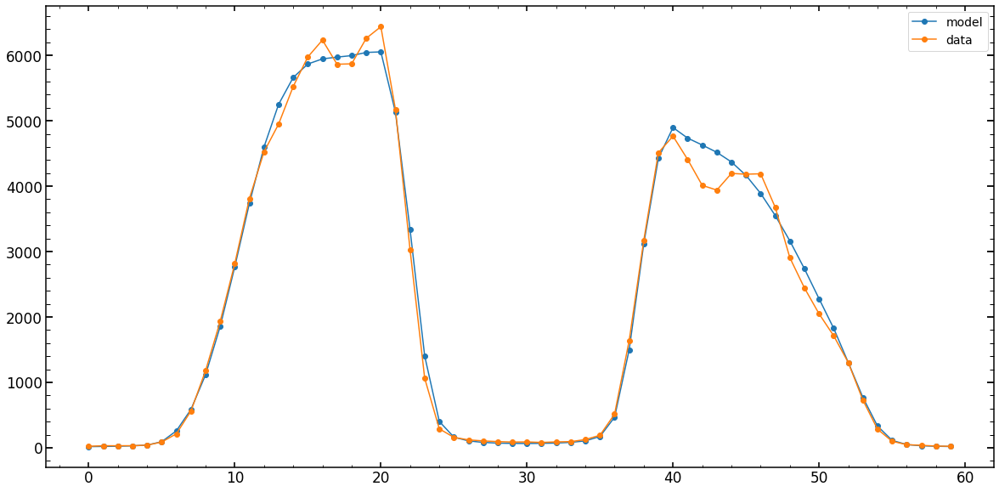

In [145]:
plt.figure(figsize=(20,10))
plt.plot(array_of_single_model_image[index_of_single_image][:,32],label='model',marker='o')
plt.plot(array_of_sci_image[index_of_single_image][:,32],label='data',marker='o')
plt.legend()

## more overview 

In [29]:
date='Jan2920'
#obs=34313
#obs_int=int(obs)
single_number='6'
image_index=int(single_number)
eps=6
arc='Ar'
dataset=6

if arc=='Ar':
    obs=34341+96
    finalArc=finalAr
if arc=='Ne':
    obs=34217+96 
    finalArc=finalNe
if arc=='Kr':
    obs=34561+96
    finalArc=finalKr



list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

finalArc.loc[int(single_number)]

fiber                    2
xc                      73
yc                    2009
wavelength        795.0522
close                    1
lamp                    Ar
xc_effective            73
second_offset            0
second_ratio             0
second2_offset           0
second2_ratio            0
Name: 6, dtype: object

In [70]:
date='Jan2920'
#obs=34313
#obs_int=int(obs)
single_number='6'
image_index=int(single_number)
eps=6
arc='Ar'
dataset=6

if arc=='Ar':
    obs=34341+96
    finalArc=finalAr
if arc=='Ne':
    obs=34217+96 
    finalArc=finalNe
if arc=='Kr':
    obs=34561+96
    finalArc=finalKr



list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

finalArc.loc[int(single_number)]



for single_number in tqdm(range(120)):
    single_number=str(single_number)
    try:


        single_analysis=Zernike_Analysis(date=date,obs='p4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                         list_of_defocuses=list_of_defocuses_input_long)

        double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
        list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
        index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
        columns,columns22,columns22_analysis=single_analysis.return_columns()


        chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
        #chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
        len_of_chains=single_analysis.len_of_chains()

        minchain_parametrization,like_min=single_analysis.create_likelihood()


        array_of_sci_image=np.array(list_of_sci_images)
        array_of_var_images=np.array(list_of_var_images)
        array_of_mask_images=np.array(list_of_mask_images)

        res_multi=np.load('/Users/nevencaplar/Documents/PFS/Images/Jan2921/Res_multi/res_multi_'+single_number+'_Ar.npy',allow_pickle=True)
        mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                        list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

        array_of_single_model_image=np.array(list_of_single_model_image)

        single_analysis.create_basic_comparison_plot(custom_model_image=array_of_single_model_image[index_of_single_image],custom_mask=array_of_mask_images[index_of_single_image],\
                                                     custom_sci_image=array_of_sci_image[index_of_single_image],custom_var_image=array_of_var_images[index_of_single_image],\
                                                     show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True,
                                                      save=single_number+'_Ar_p4')
        
    except:
        pass

  0%|                                                                                               | 0/120 [00:00<?, ?it/s]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 0
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 1
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443716ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/T

  2%|█▍                                                                                     | 2/120 [00:02<02:34,  1.31s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 2
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-39.597 0.0143]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443726ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443726ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443726ArSwarm1.npy
(36, 480, 129)
minima

  2%|██▏                                                                                    | 3/120 [00:04<03:06,  1.59s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 3
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443736ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443736ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443736ArSwarm1.npy
(36, 480, 129)
minimal likelihoo

  3%|██▉                                                                                    | 4/120 [00:07<03:26,  1.78s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 4
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-13.14 0.011]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443746ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443746ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443746ArSwarm1.npy
(36, 480, 129)
minimal 

  4%|███▋                                                                                   | 5/120 [00:09<03:33,  1.86s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 5
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443756ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443756ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443756ArSwarm1.npy
(36, 480, 129)
minimal likel

  5%|████▎                                                                                  | 6/120 [00:11<03:44,  1.97s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 6
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443766ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443766ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443766ArSwarm1.npy
(36, 480, 129)
minimal likelihoo

  6%|█████                                                                                  | 7/120 [00:13<03:40,  1.95s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 7
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443776ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443776ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443776ArSwarm1.npy
(36, 480, 129)
minimal likel

  7%|█████▊                                                                                 | 8/120 [00:15<03:40,  1.97s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 8
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443786ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443786ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443786ArSwarm1.npy
(36, 480, 129)
minimal likelihoo

  8%|██████▌                                                                                | 9/120 [00:17<03:35,  1.94s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 9
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443796ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443796ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443796ArSwarm1.npy
(36, 480, 129)
minimal likelihoo

  8%|███████▏                                                                              | 10/120 [00:19<03:34,  1.95s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 10
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-35.264 0.0124]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437106ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437106ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437106ArSwarm1.npy
(36, 480, 129)
mi

  9%|███████▉                                                                              | 11/120 [00:21<03:34,  1.96s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 11
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437116ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437116ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437116ArSwarm1.npy
(36, 480, 129)
minimal likel

 10%|████████▌                                                                             | 12/120 [00:23<03:34,  1.99s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 12
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 13
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437136ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PF

 12%|██████████                                                                            | 14/120 [00:25<03:01,  1.71s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 14
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-39.597 0.0143]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437146ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437146ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437146ArSwarm1.npy
(36, 480, 129)
mi

 12%|██████████▊                                                                           | 15/120 [00:27<03:03,  1.75s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 15
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437156ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437156ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437156ArSwarm1.npy
(36, 480, 129)
minimal likel

 13%|███████████▍                                                                          | 16/120 [00:29<03:14,  1.87s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 16
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-13.14 0.011]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437166ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437166ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437166ArSwarm1.npy
(36, 480, 129)
mini

 14%|████████████▏                                                                         | 17/120 [00:31<03:18,  1.93s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 17
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437176ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437176ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437176ArSwarm1.npy
(36, 480, 129)
minimal l

 15%|████████████▉                                                                         | 18/120 [00:33<03:17,  1.94s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 18
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437186ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437186ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437186ArSwarm1.npy
(36, 480, 129)
minimal likel

 16%|█████████████▌                                                                        | 19/120 [00:35<03:18,  1.96s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 19
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437196ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437196ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437196ArSwarm1.npy
(36, 480, 129)
minimal l

 17%|██████████████▎                                                                       | 20/120 [00:37<03:15,  1.95s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 20
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437206ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437206ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437206ArSwarm1.npy
(36, 480, 129)
minimal likel

 18%|███████████████                                                                       | 21/120 [00:39<03:16,  1.99s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 21
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437216ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437216ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437216ArSwarm1.npy
(36, 480, 129)
minimal likel

 18%|███████████████▊                                                                      | 22/120 [00:41<03:15,  2.00s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 22
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-35.264 0.0124]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437226ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437226ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437226ArSwarm1.npy
(36, 480, 129)
mi

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 12718.525
chi**2 reduced is: 79.41167 for log improvment: -2.2045524
---------------------
chi**2 reduced within mask area is: 79.41167
---------------------
chi**2 max reduced within flux mask area is: 29355.914
chi**2 reduced within flux mask area is: 119.085205 for log improvment: -2.3918378
---------------------
Abs of residual divided by total flux is: 0.055105995
Abs of residual divided by largest value of a flux in the image is: 0.16505425


 19%|████████████████▍                                                                     | 23/120 [00:43<03:12,  1.98s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 23
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437236ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437236ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437236ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 5293.614
chi**2 reduced is: 44.137383 for log improvment: -2.0789456
---------------------
chi**2 reduced within mask area is: 44.137383
---------------------
chi**2 max reduced within flux mask area is: 12348.491
chi**2 reduced within flux mask area is: 67.47015 for log improvment: -2.2625022
---------------------
Abs of residual divided by total flux is: 0.064638935
Abs of residual divided by largest value of a flux in the image is: 0.19396242


 20%|█████████████████▏                                                                    | 24/120 [00:45<03:11,  2.00s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 24
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 25
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437256ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PF

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 5657.215
chi**2 reduced is: 32.113747 for log improvment: -2.2459116
---------------------
chi**2 reduced within mask area is: 32.113743
---------------------
chi**2 max reduced within flux mask area is: 12806.039
chi**2 reduced within flux mask area is: 60.84106 for log improvment: -2.323218
---------------------
Abs of residual divided by total flux is: 0.057218064
Abs of residual divided by largest value of a flux in the image is: 0.13022943


 22%|██████████████████▋                                                                   | 26/120 [00:47<02:40,  1.71s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 26
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-39.597 0.0143]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437266ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437266ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437266ArSwarm1.npy
(36, 480, 129)
mi

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 2352.6274
chi**2 reduced is: 16.758924 for log improvment: -2.147307
---------------------
chi**2 reduced within mask area is: 16.758924
---------------------
chi**2 max reduced within flux mask area is: 5378.806
chi**2 reduced within flux mask area is: 27.466743 for log improvment: -2.2918787
---------------------
Abs of residual divided by total flux is: 0.064194426
Abs of residual divided by largest value of a flux in the image is: 0.12808949


 22%|███████████████████▎                                                                  | 27/120 [00:49<02:45,  1.78s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 27
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437276ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437276ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437276ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 1703.7793
chi**2 reduced is: 11.3950815 for log improvment: -2.174696
---------------------
chi**2 reduced within mask area is: 11.395082
---------------------
chi**2 max reduced within flux mask area is: 3915.9658
chi**2 reduced within flux mask area is: 18.851934 for log improvment: -2.317483
---------------------
Abs of residual divided by total flux is: 0.064521745
Abs of residual divided by largest value of a flux in the image is: 0.13577998


 23%|████████████████████                                                                  | 28/120 [00:51<02:51,  1.86s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 28
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-13.14 0.011]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437286ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437286ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437286ArSwarm1.npy
(36, 480, 129)
mini

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 5492.9077
chi**2 reduced is: 39.938736 for log improvment: -2.138408
---------------------
chi**2 reduced within mask area is: 39.938736
---------------------
chi**2 max reduced within flux mask area is: 12626.008
chi**2 reduced within flux mask area is: 53.343147 for log improvment: -2.3741875
---------------------
Abs of residual divided by total flux is: 0.06034107
Abs of residual divided by largest value of a flux in the image is: 0.13050653


 24%|████████████████████▊                                                                 | 29/120 [00:53<02:52,  1.89s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 29
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437296ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437296ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437296ArSwarm1.npy
(36, 480, 129)
minimal l

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 39730.664
chi**2 reduced is: 161.81381 for log improvment: -2.3901103
---------------------
chi**2 reduced within mask area is: 161.8138
---------------------
chi**2 max reduced within flux mask area is: 88479.69
chi**2 reduced within flux mask area is: 332.3308 for log improvment: -2.425273
---------------------
Abs of residual divided by total flux is: 0.048895776
Abs of residual divided by largest value of a flux in the image is: 0.12704366


 25%|█████████████████████▌                                                                | 30/120 [00:55<02:53,  1.93s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 30
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437306ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437306ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437306ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 11190.361
chi**2 reduced is: 47.41243 for log improvment: -2.372952
---------------------
chi**2 reduced within mask area is: 47.41243
---------------------
chi**2 max reduced within flux mask area is: 25123.523
chi**2 reduced within flux mask area is: 92.20037 for log improvment: -2.4353478
---------------------
Abs of residual divided by total flux is: 0.05053261
Abs of residual divided by largest value of a flux in the image is: 0.15661888


 26%|██████████████████████▏                                                               | 31/120 [00:57<02:54,  1.96s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 31
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437316ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437316ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437316ArSwarm1.npy
(36, 480, 129)
minimal l

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 15107.421
chi**2 reduced is: 64.80988 for log improvment: -2.3675492
---------------------
chi**2 reduced within mask area is: 64.809875
---------------------
chi**2 max reduced within flux mask area is: 34193.71
chi**2 reduced within flux mask area is: 135.18767 for log improvment: -2.4030092
---------------------
Abs of residual divided by total flux is: 0.05152683
Abs of residual divided by largest value of a flux in the image is: 0.16432652


 27%|██████████████████████▉                                                               | 32/120 [00:59<02:51,  1.94s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 32
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437326ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437326ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437326ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 8814.679
chi**2 reduced is: 38.941013 for log improvment: -2.3547993
---------------------
chi**2 reduced within mask area is: 38.941017
---------------------
chi**2 max reduced within flux mask area is: 19890.047
chi**2 reduced within flux mask area is: 78.82866 for log improvment: -2.4019518
---------------------
Abs of residual divided by total flux is: 0.05148073
Abs of residual divided by largest value of a flux in the image is: 0.15588401


 28%|███████████████████████▋                                                              | 33/120 [01:01<02:51,  1.97s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 33
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437336ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437336ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437336ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 54878.367
chi**2 reduced is: 281.92407 for log improvment: -2.289269
---------------------
chi**2 reduced within mask area is: 281.92407
---------------------
chi**2 max reduced within flux mask area is: 122802.664
chi**2 reduced within flux mask area is: 547.9886 for log improvment: -2.3504362
---------------------
Abs of residual divided by total flux is: 0.053999238
Abs of residual divided by largest value of a flux in the image is: 0.16625267


 28%|████████████████████████▎                                                             | 34/120 [01:03<02:47,  1.95s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 34
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-35.264 0.0124]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437346ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437346ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437346ArSwarm1.npy
(36, 480, 129)
mi

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 9129.228
chi**2 reduced is: 59.13517 for log improvment: -2.1885881
---------------------
chi**2 reduced within mask area is: 59.13517
---------------------
chi**2 max reduced within flux mask area is: 20855.088
chi**2 reduced within flux mask area is: 87.827194 for log improvment: -2.375583
---------------------
Abs of residual divided by total flux is: 0.05637973
Abs of residual divided by largest value of a flux in the image is: 0.15915115


 29%|█████████████████████████                                                             | 35/120 [01:05<02:47,  1.97s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 35
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437356ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437356ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437356ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 3930.4756
chi**2 reduced is: 24.32087 for log improvment: -2.208466
---------------------
chi**2 reduced within mask area is: 24.32087
---------------------
chi**2 max reduced within flux mask area is: 9035.586
chi**2 reduced within flux mask area is: 44.077904 for log improvment: -2.3117354
---------------------
Abs of residual divided by total flux is: 0.058210906
Abs of residual divided by largest value of a flux in the image is: 0.16011214


 30%|█████████████████████████▊                                                            | 36/120 [01:07<02:47,  2.00s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 36
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 37
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437376ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PF

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 10214.906
chi**2 reduced is: 48.51637 for log improvment: -2.3233461
---------------------
chi**2 reduced within mask area is: 48.51637
---------------------
chi**2 max reduced within flux mask area is: 22922.643
chi**2 reduced within flux mask area is: 91.510056 for log improvment: -2.3987958
---------------------
Abs of residual divided by total flux is: 0.05045962
Abs of residual divided by largest value of a flux in the image is: 0.12114981


 32%|███████████████████████████▏                                                          | 38/120 [01:09<02:18,  1.69s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 38
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-39.597 0.0143]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437386ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437386ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437386ArSwarm1.npy
(36, 480, 129)
mi

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 4183.367
chi**2 reduced is: 24.487732 for log improvment: -2.2325773
---------------------
chi**2 reduced within mask area is: 24.487734
---------------------
chi**2 max reduced within flux mask area is: 9499.459
chi**2 reduced within flux mask area is: 38.522533 for log improvment: -2.391984
---------------------
Abs of residual divided by total flux is: 0.055480354
Abs of residual divided by largest value of a flux in the image is: 0.15307653


 32%|███████████████████████████▉                                                          | 39/120 [01:11<02:25,  1.80s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 39
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437396ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437396ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437396ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 3070.3403
chi**2 reduced is: 16.585442 for log improvment: -2.2674594
---------------------
chi**2 reduced within mask area is: 16.58544
---------------------
chi**2 max reduced within flux mask area is: 7040.2363
chi**2 reduced within flux mask area is: 29.655687 for log improvment: -2.3754792
---------------------
Abs of residual divided by total flux is: 0.056237765
Abs of residual divided by largest value of a flux in the image is: 0.13865243


 33%|████████████████████████████▋                                                         | 40/120 [01:13<02:28,  1.85s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 40
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-13.14 0.011]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437406ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437406ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437406ArSwarm1.npy
(36, 480, 129)
mini

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 9771.086
chi**2 reduced is: 88.21679 for log improvment: -2.0443916
---------------------
chi**2 reduced within mask area is: 88.21679
---------------------
chi**2 max reduced within flux mask area is: 22470.016
chi**2 reduced within flux mask area is: 96.47784 for log improvment: -2.3671758
---------------------
Abs of residual divided by total flux is: 0.061672978
Abs of residual divided by largest value of a flux in the image is: 0.13692386


 34%|█████████████████████████████▍                                                        | 41/120 [01:15<02:29,  1.90s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 41
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437416ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437416ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437416ArSwarm1.npy
(36, 480, 129)
minimal l

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 71253.05
chi**2 reduced is: 302.00406 for log improvment: -2.3727906
---------------------
chi**2 reduced within mask area is: 302.00406
---------------------
chi**2 max reduced within flux mask area is: 158906.38
chi**2 reduced within flux mask area is: 559.4503 for log improvment: -2.4533799
---------------------
Abs of residual divided by total flux is: 0.04868933
Abs of residual divided by largest value of a flux in the image is: 0.112228975


 35%|██████████████████████████████                                                        | 42/120 [01:17<02:33,  1.97s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 42
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437426ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437426ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437426ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 20270.25
chi**2 reduced is: 82.91977 for log improvment: -2.388201
---------------------
chi**2 reduced within mask area is: 82.91978
---------------------
chi**2 max reduced within flux mask area is: 45516.984
chi**2 reduced within flux mask area is: 161.70451 for log improvment: -2.4494514
---------------------
Abs of residual divided by total flux is: 0.048226044
Abs of residual divided by largest value of a flux in the image is: 0.11646936


 36%|██████████████████████████████▊                                                       | 43/120 [01:19<02:30,  1.96s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 43
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437436ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437436ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437436ArSwarm1.npy
(36, 480, 129)
minimal l

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 27580.082
chi**2 reduced is: 127.52926 for log improvment: -2.3349857
---------------------
chi**2 reduced within mask area is: 127.52926
---------------------
chi**2 max reduced within flux mask area is: 62629.996
chi**2 reduced within flux mask area is: 231.99959 for log improvment: -2.4312952
---------------------
Abs of residual divided by total flux is: 0.051001765
Abs of residual divided by largest value of a flux in the image is: 0.12437045


 37%|███████████████████████████████▌                                                      | 44/120 [01:21<02:31,  1.99s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 44
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437446ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437446ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437446ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 16418.566
chi**2 reduced is: 69.881 for log improvment: -2.3709762
---------------------
chi**2 reduced within mask area is: 69.881
---------------------
chi**2 max reduced within flux mask area is: 37243.156
chi**2 reduced within flux mask area is: 127.26003 for log improvment: -2.4663544
---------------------
Abs of residual divided by total flux is: 0.049621154
Abs of residual divided by largest value of a flux in the image is: 0.11917718


 38%|████████████████████████████████▎                                                     | 45/120 [01:23<02:30,  2.01s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 45
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 46
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-35.264 0.0124]


 39%|█████████████████████████████████▋                                                    | 47/120 [01:23<01:45,  1.45s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437466ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437466ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437466ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 2036.6927872652345
average chi2 reduced is: 9.227315181363249
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 47
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzi

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 7612.6924
chi**2 reduced is: 41.230553 for log improvment: -2.266319
---------------------
chi**2 reduced within mask area is: 41.230556
---------------------
chi**2 max reduced within flux mask area is: 17628.031
chi**2 reduced within flux mask area is: 75.17968 for log improvment: -2.3701034
---------------------
Abs of residual divided by total flux is: 0.05485003
Abs of residual divided by largest value of a flux in the image is: 0.13972719


 40%|██████████████████████████████████▍                                                   | 48/120 [01:25<01:56,  1.62s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 48
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 49
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437496ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PF

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 9068.379
chi**2 reduced is: 40.806923 for log improvment: -2.3467958
---------------------
chi**2 reduced within mask area is: 40.806923
---------------------
chi**2 max reduced within flux mask area is: 20518.426
chi**2 reduced within flux mask area is: 76.290764 for log improvment: -2.429672
---------------------
Abs of residual divided by total flux is: 0.05036641
Abs of residual divided by largest value of a flux in the image is: 0.11371852


 42%|███████████████████████████████████▊                                                  | 50/120 [01:27<01:40,  1.44s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 50
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-39.597 0.0143]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437506ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437506ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437506ArSwarm1.npy
(36, 480, 129)
mi

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 3685.0278
chi**2 reduced is: 19.978584 for log improvment: -2.265876
---------------------
chi**2 reduced within mask area is: 19.978584
---------------------
chi**2 max reduced within flux mask area is: 8420.166
chi**2 reduced within flux mask area is: 31.030222 for log improvment: -2.4335358
---------------------
Abs of residual divided by total flux is: 0.054271076
Abs of residual divided by largest value of a flux in the image is: 0.12328091


 42%|████████████████████████████████████▌                                                 | 51/120 [01:29<01:48,  1.58s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 51
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437516ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437516ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437516ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 2702.9255
chi**2 reduced is: 14.766467 for log improvment: -2.2625575
---------------------
chi**2 reduced within mask area is: 14.766467
---------------------
chi**2 max reduced within flux mask area is: 6219.4253
chi**2 reduced within flux mask area is: 25.681774 for log improvment: -2.3841252
---------------------
Abs of residual divided by total flux is: 0.05690195
Abs of residual divided by largest value of a flux in the image is: 0.15976545


 43%|█████████████████████████████████████▎                                                | 52/120 [01:31<01:58,  1.75s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 52
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-13.14 0.011]


 44%|█████████████████████████████████████▉                                                | 53/120 [01:32<01:27,  1.31s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437526ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437526ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437526ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 794.7738791318318
average chi2 reduced is: 0.8418211683257899
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 53
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzi

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 63132.848
chi**2 reduced is: 259.23557 for log improvment: -2.386561
---------------------
chi**2 reduced within mask area is: 259.23557
---------------------
chi**2 max reduced within flux mask area is: 142664.56
chi**2 reduced within flux mask area is: 506.48816 for log improvment: -2.4497468
---------------------
Abs of residual divided by total flux is: 0.048413955
Abs of residual divided by largest value of a flux in the image is: 0.13529666


 45%|██████████████████████████████████████▋                                               | 54/120 [01:34<01:41,  1.55s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 54
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437546ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437546ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437546ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 18024.066
chi**2 reduced is: 71.7543 for log improvment: -2.4000049
---------------------
chi**2 reduced within mask area is: 71.7543
---------------------
chi**2 max reduced within flux mask area is: 40823.297
chi**2 reduced within flux mask area is: 137.93628 for log improvment: -2.4712296
---------------------
Abs of residual divided by total flux is: 0.04719111
Abs of residual divided by largest value of a flux in the image is: 0.17824979


 46%|███████████████████████████████████████▍                                              | 55/120 [01:36<01:47,  1.65s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 55
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437556ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437556ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437556ArSwarm1.npy
(36, 480, 129)
minimal l

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 24097.695
chi**2 reduced is: 93.70279 for log improvment: -2.410223
---------------------
chi**2 reduced within mask area is: 93.7028
---------------------
chi**2 max reduced within flux mask area is: 54842.22
chi**2 reduced within flux mask area is: 181.84013 for log improvment: -2.4794252
---------------------
Abs of residual divided by total flux is: 0.046938993
Abs of residual divided by largest value of a flux in the image is: 0.17764358


 47%|████████████████████████████████████████▏                                             | 56/120 [01:38<01:52,  1.76s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 56
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437566ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437566ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437566ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 14325.56
chi**2 reduced is: 58.13388 for log improvment: -2.3916821
---------------------
chi**2 reduced within mask area is: 58.13388
---------------------
chi**2 max reduced within flux mask area is: 32663.414
chi**2 reduced within flux mask area is: 112.78443 for log improvment: -2.4618125
---------------------
Abs of residual divided by total flux is: 0.04896056
Abs of residual divided by largest value of a flux in the image is: 0.14870119


 48%|████████████████████████████████████████▊                                             | 57/120 [01:40<01:57,  1.87s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 57
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437576ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437576ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437576ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 89802.26
chi**2 reduced is: 435.53976 for log improvment: -2.3142595
---------------------
chi**2 reduced within mask area is: 435.5398
---------------------
chi**2 max reduced within flux mask area is: 202907.23
chi**2 reduced within flux mask area is: 822.25653 for log improvment: -2.39229
---------------------
Abs of residual divided by total flux is: 0.052469287
Abs of residual divided by largest value of a flux in the image is: 0.17135374


 48%|█████████████████████████████████████████▌                                            | 58/120 [01:42<01:57,  1.90s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 58
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-35.264 0.0124]


 49%|██████████████████████████████████████████▎                                           | 59/120 [01:42<01:26,  1.41s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437586ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437586ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437586ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 1758.1848953314327
average chi2 reduced is: 7.455736132940206
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 59
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzi

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 6758.381
chi**2 reduced is: 36.996033 for log improvment: -2.2616875
---------------------
chi**2 reduced within mask area is: 36.996033
---------------------
chi**2 max reduced within flux mask area is: 15612.855
chi**2 reduced within flux mask area is: 68.94316 for log improvment: -2.3549912
---------------------
Abs of residual divided by total flux is: 0.056759097
Abs of residual divided by largest value of a flux in the image is: 0.12810427


 50%|███████████████████████████████████████████                                           | 60/120 [01:44<01:36,  1.61s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 60
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 61
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437616ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PF

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 7985.498
chi**2 reduced is: 33.814045 for log improvment: -2.373205
---------------------
chi**2 reduced within mask area is: 33.81404
---------------------
chi**2 max reduced within flux mask area is: 18004.328
chi**2 reduced within flux mask area is: 62.87486 for log improvment: -2.4569
---------------------
Abs of residual divided by total flux is: 0.050551936
Abs of residual divided by largest value of a flux in the image is: 0.12075678


 52%|████████████████████████████████████████████▍                                         | 62/120 [01:46<01:21,  1.41s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 62
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-39.597 0.0143]


 52%|█████████████████████████████████████████████▏                                        | 63/120 [01:46<01:01,  1.07s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437626ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437626ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437626ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 446.86423078844047
average chi2 reduced is: -1.3488767262496677
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 63
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analy

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 2339.5522
chi**2 reduced is: 11.0700245 for log improvment: -2.324984
---------------------
chi**2 reduced within mask area is: 11.0700245
---------------------
chi**2 max reduced within flux mask area is: 5428.5967
chi**2 reduced within flux mask area is: 18.790874 for log improvment: -2.4607406
---------------------
Abs of residual divided by total flux is: 0.05458989
Abs of residual divided by largest value of a flux in the image is: 0.13641144


 53%|█████████████████████████████████████████████▊                                        | 64/120 [01:48<01:17,  1.38s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 64
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-13.14 0.011]


 54%|██████████████████████████████████████████████▌                                       | 65/120 [01:49<00:57,  1.05s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437646ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437646ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437646ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 703.2110687934387
average chi2 reduced is: 0.1872617263863199
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 65
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzi

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 55578.508
chi**2 reduced is: 196.06822 for log improvment: -2.4524996
---------------------
chi**2 reduced within mask area is: 196.06822
---------------------
chi**2 max reduced within flux mask area is: 126867.18
chi**2 reduced within flux mask area is: 379.16434 for log improvment: -2.5245218
---------------------
Abs of residual divided by total flux is: 0.044959318
Abs of residual divided by largest value of a flux in the image is: 0.12917696


 55%|███████████████████████████████████████████████▎                                      | 66/120 [01:51<01:11,  1.33s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 66
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437666ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437666ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437666ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 15793.936
chi**2 reduced is: 68.68364 for log improvment: -2.361637
---------------------
chi**2 reduced within mask area is: 68.68363
---------------------
chi**2 max reduced within flux mask area is: 36227.758
chi**2 reduced within flux mask area is: 131.33162 for log improvment: -2.4406722
---------------------
Abs of residual divided by total flux is: 0.05075137
Abs of residual divided by largest value of a flux in the image is: 0.1345887


 56%|████████████████████████████████████████████████                                      | 67/120 [01:53<01:19,  1.50s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 67
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437676ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437676ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437676ArSwarm1.npy
(36, 480, 129)
minimal l

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 21094.91
chi**2 reduced is: 81.89316 for log improvment: -2.4109302
---------------------
chi**2 reduced within mask area is: 81.89316
---------------------
chi**2 max reduced within flux mask area is: 48423.445
chi**2 reduced within flux mask area is: 163.65797 for log improvment: -2.4711185
---------------------
Abs of residual divided by total flux is: 0.0490925
Abs of residual divided by largest value of a flux in the image is: 0.15917635


 57%|████████████████████████████████████████████████▋                                     | 68/120 [01:55<01:26,  1.66s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 68
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437686ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437686ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437686ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 12667.038
chi**2 reduced is: 47.22032 for log improvment: -2.4285462
---------------------
chi**2 reduced within mask area is: 47.22032
---------------------
chi**2 max reduced within flux mask area is: 29162.129
chi**2 reduced within flux mask area is: 86.12194 for log improvment: -2.5297055
---------------------
Abs of residual divided by total flux is: 0.04718724
Abs of residual divided by largest value of a flux in the image is: 0.12318752


 57%|█████████████████████████████████████████████████▍                                    | 69/120 [01:56<01:28,  1.73s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 69
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437696ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437696ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437696ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 78353.19
chi**2 reduced is: 323.7094 for log improvment: -2.3839014
---------------------
chi**2 reduced within mask area is: 323.70944
---------------------
chi**2 max reduced within flux mask area is: 175746.77
chi**2 reduced within flux mask area is: 623.12305 for log improvment: -2.4503136
---------------------
Abs of residual divided by total flux is: 0.048148643
Abs of residual divided by largest value of a flux in the image is: 0.11807722


 58%|██████████████████████████████████████████████████▏                                   | 70/120 [01:59<01:30,  1.82s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 70
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-35.264 0.0124]


 59%|██████████████████████████████████████████████████▉                                   | 71/120 [01:59<01:06,  1.36s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437706ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437706ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437706ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 1417.525931870643
average chi2 reduced is: 5.086345115300744
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 71
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzin

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 5910.601
chi**2 reduced is: 30.748123 for log improvment: -2.283813
---------------------
chi**2 reduced within mask area is: 30.748125
---------------------
chi**2 max reduced within flux mask area is: 13493.221
chi**2 reduced within flux mask area is: 54.06295 for log improvment: -2.3972158
---------------------
Abs of residual divided by total flux is: 0.054604582
Abs of residual divided by largest value of a flux in the image is: 0.14810954


 60%|███████████████████████████████████████████████████▌                                  | 72/120 [02:01<01:15,  1.58s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 72
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 73
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437736ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PF

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 9923.452
chi**2 reduced is: 43.300766 for log improvment: -2.3601673
---------------------
chi**2 reduced within mask area is: 43.300762
---------------------
chi**2 max reduced within flux mask area is: 22581.54
chi**2 reduced within flux mask area is: 81.33235 for log improvment: -2.4434903
---------------------
Abs of residual divided by total flux is: 0.051177632
Abs of residual divided by largest value of a flux in the image is: 0.13967185


 62%|█████████████████████████████████████████████████████                                 | 74/120 [02:03<01:03,  1.39s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 74
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-39.597 0.0143]


 62%|█████████████████████████████████████████████████████▊                                | 75/120 [02:03<00:47,  1.06s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437746ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437746ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437746ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 518.7628942989279
average chi2 reduced is: -0.7929453292809083
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 75
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyz

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 2924.459
chi**2 reduced is: 16.809893 for log improvment: -2.2404807
---------------------
chi**2 reduced within mask area is: 16.809895
---------------------
chi**2 max reduced within flux mask area is: 6738.829
chi**2 reduced within flux mask area is: 29.97415 for log improvment: -2.3518376
---------------------
Abs of residual divided by total flux is: 0.059908126
Abs of residual divided by largest value of a flux in the image is: 0.13057551


 63%|██████████████████████████████████████████████████████▍                               | 76/120 [02:05<01:00,  1.37s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 76
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-13.14 0.011]
Swarm1 or likechainSwarm1 not found
Path searched for chain was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437766ArSwarm1.npy
Path searched for likechain was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/likechainJan2920_Single_P_34437766ArSwarm1.npy
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 77
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3',

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 68066.58
chi**2 reduced is: 325.67603 for log improvment: -2.3201482
---------------------
chi**2 reduced within mask area is: 325.67606
---------------------
chi**2 max reduced within flux mask area is: 153803.62
chi**2 reduced within flux mask area is: 645.6774 for log improvment: -2.376951
---------------------
Abs of residual divided by total flux is: 0.05380576
Abs of residual divided by largest value of a flux in the image is: 0.13167003


 65%|███████████████████████████████████████████████████████▉                              | 78/120 [02:07<00:52,  1.26s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 78
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437786ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437786ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437786ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 19381.828
chi**2 reduced is: 96.12648 for log improvment: -2.3045516
---------------------
chi**2 reduced within mask area is: 96.12647
---------------------
chi**2 max reduced within flux mask area is: 43458.547
chi**2 reduced within flux mask area is: 175.51205 for log improvment: -2.3937683
---------------------
Abs of residual divided by total flux is: 0.05361643
Abs of residual divided by largest value of a flux in the image is: 0.13585532


 66%|████████████████████████████████████████████████████████▌                             | 79/120 [02:09<01:01,  1.50s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 79
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437796ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437796ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437796ArSwarm1.npy
(36, 480, 129)
minimal l

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 26088.562
chi**2 reduced is: 131.49524 for log improvment: -2.2975402
---------------------
chi**2 reduced within mask area is: 131.49522
---------------------
chi**2 max reduced within flux mask area is: 59046.223
chi**2 reduced within flux mask area is: 239.6503 for log improvment: -2.3916142
---------------------
Abs of residual divided by total flux is: 0.05425348
Abs of residual divided by largest value of a flux in the image is: 0.1273513


 67%|█████████████████████████████████████████████████████████▎                            | 80/120 [02:11<01:06,  1.66s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 80
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437806ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437806ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437806ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 15373.518
chi**2 reduced is: 70.4814 for log improvment: -2.3386989
---------------------
chi**2 reduced within mask area is: 70.48141
---------------------
chi**2 max reduced within flux mask area is: 35031.445
chi**2 reduced within flux mask area is: 137.28262 for log improvment: -2.4068425
---------------------
Abs of residual divided by total flux is: 0.05223552
Abs of residual divided by largest value of a flux in the image is: 0.13419211


 68%|██████████████████████████████████████████████████████████                            | 81/120 [02:13<01:08,  1.76s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 81
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437816ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437816ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437816ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 96211.84
chi**2 reduced is: 551.4381 for log improvment: -2.2417316
---------------------
chi**2 reduced within mask area is: 551.43805
---------------------
chi**2 max reduced within flux mask area is: 216477.69
chi**2 reduced within flux mask area is: 1062.9614 for log improvment: -2.3088956
---------------------
Abs of residual divided by total flux is: 0.056441892
Abs of residual divided by largest value of a flux in the image is: 0.18087272


 68%|██████████████████████████████████████████████████████████▊                           | 82/120 [02:15<01:10,  1.85s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 82
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-35.264 0.0124]


 69%|███████████████████████████████████████████████████████████▍                          | 83/120 [02:16<00:51,  1.38s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437826ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437826ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437826ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 1906.5020336074413
average chi2 reduced is: 8.723904027095587
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 83
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzi

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 7236.994
chi**2 reduced is: 44.359398 for log improvment: -2.2125726
---------------------
chi**2 reduced within mask area is: 44.3594
---------------------
chi**2 max reduced within flux mask area is: 16506.898
chi**2 reduced within flux mask area is: 78.715195 for log improvment: -2.3216069
---------------------
Abs of residual divided by total flux is: 0.058201164
Abs of residual divided by largest value of a flux in the image is: 0.13972051


 70%|████████████████████████████████████████████████████████████▏                         | 84/120 [02:18<00:56,  1.56s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 84
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 85
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437856ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PF

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 6476.5664
chi**2 reduced is: 33.816822 for log improvment: -2.282212
---------------------
chi**2 reduced within mask area is: 33.816822
---------------------
chi**2 max reduced within flux mask area is: 14866.483
chi**2 reduced within flux mask area is: 67.86343 for log improvment: -2.3405724
---------------------
Abs of residual divided by total flux is: 0.05531091
Abs of residual divided by largest value of a flux in the image is: 0.12343814


 72%|█████████████████████████████████████████████████████████████▋                        | 86/120 [02:20<00:47,  1.40s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 86
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-39.597 0.0143]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437866ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437866ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437866ArSwarm1.npy
(36, 480, 129)
mi

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 2610.2158
chi**2 reduced is: 16.88368 for log improvment: -2.1892092
---------------------
chi**2 reduced within mask area is: 16.88368
---------------------
chi**2 max reduced within flux mask area is: 6023.5386
chi**2 reduced within flux mask area is: 30.150507 for log improvment: -2.3005571
---------------------
Abs of residual divided by total flux is: 0.061131757
Abs of residual divided by largest value of a flux in the image is: 0.14668109


 72%|██████████████████████████████████████████████████████████████▎                       | 87/120 [02:22<00:52,  1.60s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 87
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437876ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437876ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437876ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 1881.4634
chi**2 reduced is: 11.926213 for log improvment: -2.1979933
---------------------
chi**2 reduced within mask area is: 11.926213
---------------------
chi**2 max reduced within flux mask area is: 4358.5747
chi**2 reduced within flux mask area is: 22.435997 for log improvment: -2.2883992
---------------------
Abs of residual divided by total flux is: 0.063716374
Abs of residual divided by largest value of a flux in the image is: 0.15836412


 73%|███████████████████████████████████████████████████████████████                       | 88/120 [02:24<00:54,  1.69s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 88
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-13.14 0.011]


 74%|███████████████████████████████████████████████████████████████▊                      | 89/120 [02:24<00:39,  1.28s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437886ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437886ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437886ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 814.138990694786
average chi2 reduced is: 0.9047823140905956
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 89
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzin

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 44417.03
chi**2 reduced is: 284.50824 for log improvment: -2.1934547
---------------------
chi**2 reduced within mask area is: 284.50827
---------------------
chi**2 max reduced within flux mask area is: 100636.92
chi**2 reduced within flux mask area is: 593.5158 for log improvment: -2.229325
---------------------
Abs of residual divided by total flux is: 0.062469404
Abs of residual divided by largest value of a flux in the image is: 0.21736348


 75%|████████████████████████████████████████████████████████████████▌                     | 90/120 [02:26<00:44,  1.49s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 90
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437906ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437906ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437906ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 12580.766
chi**2 reduced is: 66.48854 for log improvment: -2.2769604
---------------------
chi**2 reduced within mask area is: 66.48854
---------------------
chi**2 max reduced within flux mask area is: 28605.57
chi**2 reduced within flux mask area is: 136.79562 for log improvment: -2.3203783
---------------------
Abs of residual divided by total flux is: 0.05528212
Abs of residual divided by largest value of a flux in the image is: 0.14752986


 76%|█████████████████████████████████████████████████████████████████▏                    | 91/120 [02:28<00:48,  1.66s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 91
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437916ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437916ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437916ArSwarm1.npy
(36, 480, 129)
minimal l

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 17056.281
chi**2 reduced is: 94.70466 for log improvment: -2.255513
---------------------
chi**2 reduced within mask area is: 94.70466
---------------------
chi**2 max reduced within flux mask area is: 38909.83
chi**2 reduced within flux mask area is: 189.13707 for log improvment: -2.3132827
---------------------
Abs of residual divided by total flux is: 0.05755247
Abs of residual divided by largest value of a flux in the image is: 0.12183064


 77%|█████████████████████████████████████████████████████████████████▉                    | 92/120 [02:30<00:48,  1.72s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 92
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437926ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437926ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437926ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 10024.037
chi**2 reduced is: 56.9004 for log improvment: -2.2459273
---------------------
chi**2 reduced within mask area is: 56.9004
---------------------
chi**2 max reduced within flux mask area is: 23065.37
chi**2 reduced within flux mask area is: 113.89425 for log improvment: -2.3064587
---------------------
Abs of residual divided by total flux is: 0.058187775
Abs of residual divided by largest value of a flux in the image is: 0.13571835


 78%|██████████████████████████████████████████████████████████████████▋                   | 93/120 [02:32<00:49,  1.82s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 93
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437936ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437936ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437936ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 61947.766
chi**2 reduced is: 398.9251 for log improvment: -2.1911342
---------------------
chi**2 reduced within mask area is: 398.92514
---------------------
chi**2 max reduced within flux mask area is: 140186.95
chi**2 reduced within flux mask area is: 824.05225 for log improvment: -2.230753
---------------------
Abs of residual divided by total flux is: 0.0610624
Abs of residual divided by largest value of a flux in the image is: 0.2322543


 78%|███████████████████████████████████████████████████████████████████▎                  | 94/120 [02:34<00:48,  1.85s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 94
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-35.264 0.0124]


 79%|████████████████████████████████████████████████████████████████████                  | 95/120 [02:34<00:34,  1.38s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437946ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437946ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437946ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 1568.9068691324262
average chi2 reduced is: 5.9911582814313915
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 95
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyz

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 4615.895
chi**2 reduced is: 33.068478 for log improvment: -2.1448417
---------------------
chi**2 reduced within mask area is: 33.068478
---------------------
chi**2 max reduced within flux mask area is: 10773.27
chi**2 reduced within flux mask area is: 68.377815 for log improvment: -2.1974323
---------------------
Abs of residual divided by total flux is: 0.06513485
Abs of residual divided by largest value of a flux in the image is: 0.13958423


 80%|████████████████████████████████████████████████████████████████████▊                 | 96/120 [02:36<00:38,  1.58s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 96
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 97
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437976ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PF

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 9611.693
chi**2 reduced is: 67.31269 for log improvment: -2.154703
---------------------
chi**2 reduced within mask area is: 67.31269
---------------------
chi**2 max reduced within flux mask area is: 22324.297
chi**2 reduced within flux mask area is: 141.51895 for log improvment: -2.1979632
---------------------
Abs of residual divided by total flux is: 0.063683115
Abs of residual divided by largest value of a flux in the image is: 0.1809255


 82%|██████████████████████████████████████████████████████████████████████▏               | 98/120 [02:38<00:31,  1.42s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 98
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-39.597 0.0143]


 82%|██████████████████████████████████████████████████████████████████████▉               | 99/120 [02:38<00:22,  1.07s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437986ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437986ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437986ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 781.9853734290757
average chi2 reduced is: 0.8630672213913014
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 99
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzi

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 2882.977
chi**2 reduced is: 21.985655 for log improvment: -2.1177018
---------------------
chi**2 reduced within mask area is: 21.985655
---------------------
chi**2 max reduced within flux mask area is: 6702.1333
chi**2 reduced within flux mask area is: 43.90298 for log improvment: -2.1837192
---------------------
Abs of residual divided by total flux is: 0.06794167
Abs of residual divided by largest value of a flux in the image is: 0.17639714


 83%|██████████████████████████████████████████████████████████████████████▊              | 100/120 [02:40<00:26,  1.32s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 100
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-13.14 0.011]


 84%|███████████████████████████████████████████████████████████████████████▌             | 101/120 [02:41<00:19,  1.01s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371006ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371006ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371006ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 1401.7806010670458
average chi2 reduced is: 5.087423935666996
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 101
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
ana

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 67098.125
chi**2 reduced is: 534.6848 for log improvment: -2.0986125
---------------------
chi**2 reduced within mask area is: 534.6848
---------------------
chi**2 max reduced within flux mask area is: 153105.44
chi**2 reduced within flux mask area is: 1110.6605 for log improvment: -2.1394093
---------------------
Abs of residual divided by total flux is: 0.06738169
Abs of residual divided by largest value of a flux in the image is: 0.22938916


 85%|████████████████████████████████████████████████████████████████████████▎            | 102/120 [02:43<00:23,  1.32s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 102
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371026ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371026ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371026ArSwarm1.npy
(36, 480, 129)
minimal l

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 18975.098
chi**2 reduced is: 130.54626 for log improvment: -2.1624196
---------------------
chi**2 reduced within mask area is: 130.54626
---------------------
chi**2 max reduced within flux mask area is: 43175.07
chi**2 reduced within flux mask area is: 271.5971 for log improvment: -2.201308
---------------------
Abs of residual divided by total flux is: 0.064191915
Abs of residual divided by largest value of a flux in the image is: 0.1943316


 86%|████████████████████████████████████████████████████████████████████████▉            | 103/120 [02:45<00:25,  1.48s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 103
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371036ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371036ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371036ArSwarm1.npy
(36, 480, 129)
minim

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 25164.61
chi**2 reduced is: 183.98888 for log improvment: -2.1359987
---------------------
chi**2 reduced within mask area is: 183.98889
---------------------
chi**2 max reduced within flux mask area is: 57482.266
chi**2 reduced within flux mask area is: 385.8219 for log improvment: -2.173147
---------------------
Abs of residual divided by total flux is: 0.06644462
Abs of residual divided by largest value of a flux in the image is: 0.21441537


 87%|█████████████████████████████████████████████████████████████████████████▋           | 104/120 [02:47<00:26,  1.64s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 104
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371046ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371046ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371046ArSwarm1.npy
(36, 480, 129)
minimal l

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 15063.423
chi**2 reduced is: 115.162445 for log improvment: -2.1166127
---------------------
chi**2 reduced within mask area is: 115.162445
---------------------
chi**2 max reduced within flux mask area is: 34561.477
chi**2 reduced within flux mask area is: 236.28725 for log improvment: -2.165152
---------------------
Abs of residual divided by total flux is: 0.066517025
Abs of residual divided by largest value of a flux in the image is: 0.20400387


 88%|██████████████████████████████████████████████████████████████████████████▍          | 105/120 [02:49<00:26,  1.79s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 105
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 or likechainSwarm1 not found
Path searched for chain was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371056ArSwarm1.npy
Path searched for likechain was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/likechainJan2920_Single_P_344371056ArSwarm1.npy
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 106
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35

 89%|███████████████████████████████████████████████████████████████████████████▊         | 107/120 [02:49<00:16,  1.30s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371066ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371066ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371066ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 2679.9657605408484
average chi2 reduced is: 13.915660695971562
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 107
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
an

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 9654.3
chi**2 reduced is: 67.53005 for log improvment: -2.1552236
---------------------
chi**2 reduced within mask area is: 67.53005
---------------------
chi**2 max reduced within flux mask area is: 22852.775
chi**2 reduced within flux mask area is: 145.38931 for log improvment: -2.1964064
---------------------
Abs of residual divided by total flux is: 0.062312197
Abs of residual divided by largest value of a flux in the image is: 0.17193353


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 110/120 [02:51<00:11,  1.11s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 110
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-39.597 0.0143]


 92%|██████████████████████████████████████████████████████████████████████████████▋      | 111/120 [02:51<00:07,  1.16it/s]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371106ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371106ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371106ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 812.9913153524875
average chi2 reduced is: 1.0487562558155192
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 111
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
ana

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 2883.3613
chi**2 reduced is: 20.990185 for log improvment: -2.1378827
---------------------
chi**2 reduced within mask area is: 20.990185
---------------------
chi**2 max reduced within flux mask area is: 6814.7744
chi**2 reduced within flux mask area is: 42.209663 for log improvment: -2.2080395
---------------------
Abs of residual divided by total flux is: 0.064978816
Abs of residual divided by largest value of a flux in the image is: 0.14568783


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 112/120 [02:54<00:10,  1.30s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 112
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-13.14 0.011]


 94%|████████████████████████████████████████████████████████████████████████████████     | 113/120 [02:54<00:06,  1.01it/s]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371126ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371126ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371126ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 1431.5717382477933
average chi2 reduced is: 5.253712014651074
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 113
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
ana

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 67269.2
chi**2 reduced is: 462.63843 for log improvment: -2.1625745
---------------------
chi**2 reduced within mask area is: 462.63843
---------------------
chi**2 max reduced within flux mask area is: 154991.44
chi**2 reduced within flux mask area is: 920.1199 for log improvment: -2.2264633
---------------------
Abs of residual divided by total flux is: 0.058686923
Abs of residual divided by largest value of a flux in the image is: 0.15661724


 95%|████████████████████████████████████████████████████████████████████████████████▊    | 114/120 [02:56<00:07,  1.23s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 114
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371146ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371146ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371146ArSwarm1.npy
(36, 480, 129)
minimal l

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 18996.254
chi**2 reduced is: 122.04874 for log improvment: -2.1921346
---------------------
chi**2 reduced within mask area is: 122.048744
---------------------
chi**2 max reduced within flux mask area is: 43771.133
chi**2 reduced within flux mask area is: 254.94054 for log improvment: -2.2347488
---------------------
Abs of residual divided by total flux is: 0.060591877
Abs of residual divided by largest value of a flux in the image is: 0.1654992


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 115/120 [02:58<00:07,  1.54s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 115
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371156ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371156ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371156ArSwarm1.npy
(36, 480, 129)
minim

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 25718.955
chi**2 reduced is: 182.12122 for log improvment: -2.1498928
---------------------
chi**2 reduced within mask area is: 182.12123
---------------------
chi**2 max reduced within flux mask area is: 59277.09
chi**2 reduced within flux mask area is: 393.3431 for log improvment: -2.1781154
---------------------
Abs of residual divided by total flux is: 0.06510248
Abs of residual divided by largest value of a flux in the image is: 0.16410252


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 116/120 [03:00<00:06,  1.71s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 116
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371166ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371166ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371166ArSwarm1.npy
(36, 480, 129)
minimal l

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 14976.658
chi**2 reduced is: 125.29675 for log improvment: -2.077475
---------------------
chi**2 reduced within mask area is: 125.296745
---------------------
chi**2 max reduced within flux mask area is: 34747.71
chi**2 reduced within flux mask area is: 254.27245 for log improvment: -2.1356268
---------------------
Abs of residual divided by total flux is: 0.06936935
Abs of residual divided by largest value of a flux in the image is: 0.18131748


 98%|██████████████████████████████████████████████████████████████████████████████████▉  | 117/120 [03:02<00:05,  1.81s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 117
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 or likechainSwarm1 not found
Path searched for chain was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371176ArSwarm1.npy
Path searched for likechain was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/likechainJan2920_Single_P_344371176ArSwarm1.npy
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 118
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35

 99%|████████████████████████████████████████████████████████████████████████████████████▎| 119/120 [03:02<00:01,  1.31s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371186ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371186ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371186ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 3333.8139014826647
average chi2 reduced is: 18.531568738408215
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 119
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
an

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 6287.7456
chi**2 reduced is: 74.199356 for log improvment: -1.9280949
---------------------
chi**2 reduced within mask area is: 74.199356
---------------------
chi**2 max reduced within flux mask area is: 14762.162
chi**2 reduced within flux mask area is: 140.29703 for log improvment: -2.0221014
---------------------
Abs of residual divided by total flux is: 0.08079599
Abs of residual divided by largest value of a flux in the image is: 0.20157935


100%|█████████████████████████████████████████████████████████████████████████████████████| 120/120 [03:05<00:00,  1.55s/it]


<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

In [61]:
t

In [146]:
finalAr_selection=finalAr[(finalAr['xc']<4410) & (finalAr['yc']>0) & (finalAr['lamp']=='Ar')]
finalAr_selection=finalAr_selection.sort_values(['wavelength','fiber'],ascending=[False,True])

In [145]:
finalAr_selection[85:]

,fiber,xc,yc,wavelength,close,lamp,xc_effective,second_offset,second_ratio,second2_offset,second2_ratio
63,401,1992,1187,727.47876,1,Ar,1992,0,0,0,0
75,464,2440,1190,727.47876,1,Ar,2509,0,0,0,0
87,525,2828,1195,727.47876,1,Ar,2897,0,0,0,0
99,587,3624,1214,727.47876,1,Ar,3693,0,0,0,0
111,650,4003,1229,727.47876,1,Ar,4072,0,0,0,0
2,2,70,992,706.8989,0,Ar,70,-39.597,0.0143,0,0
14,63,461,977,706.8989,0,Ar,461,-39.597,0.0143,0,0
26,192,845,968,706.8989,0,Ar,845,-39.597,0.0143,0,0
38,255,1223,960,706.8989,0,Ar,1223,-39.597,0.0143,0,0
50,339,1610,955,706.8989,0,Ar,1610,-39.597,0.0143,0,0


In [79]:
camX=0.015
camY=0.019
camY_Max=0.02

(camX*100-1)*(camY/camY_Max)+1

1.475

In [88]:
camX=0.015
camY=-0.01
camY_Max=0.02

(camX*100/3)*(np.abs(camY)/camY_Max)+1

1.25

In [82]:
camX=0.015
camY=0.019
camY_Max=0.02

(camX*100-1)*(camY/camY_Max)+1

1.475

In [81]:
np.sign(camX)

1.0

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 11
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 23
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
STAMPS_FOLDER: /Users/nevencaplar/

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 9
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 21
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
STAMPS_FOLDER: /Users/nevencaplar/D

<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0.0 0.0]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 19
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0.0 0.0]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 31
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='

<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 102
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 114
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 100
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [-13.14 0.011]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 112
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [-13.14 0.011]
STAMPS_FOLDER:

<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [-39.597 0.0143]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 110
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [-39.597 0.0143]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 1
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.Buffere

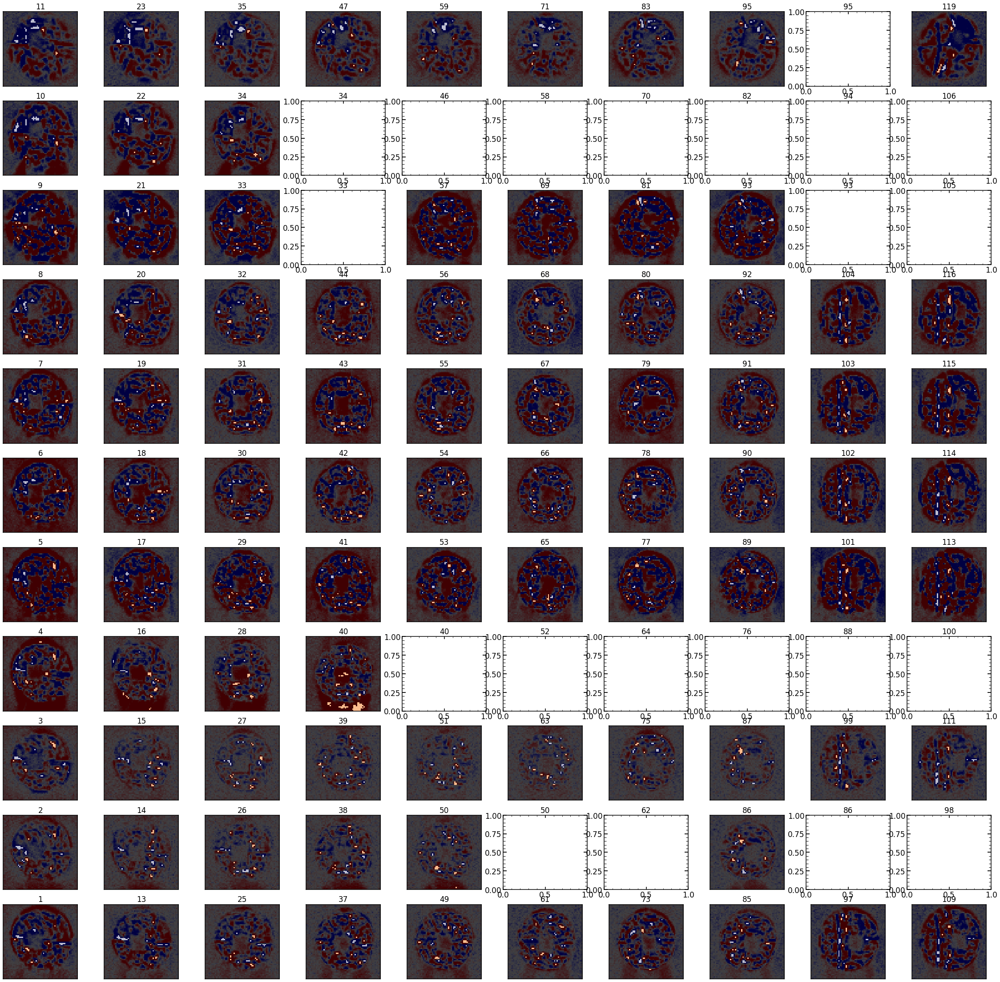

In [150]:
plt.figure(figsize=(40,40))

plt.tick_params(
axis='both',          # changes apply to the x-axis
which='both',      # both major and minor ticks are affected
bottom='off',
left='off',
right='off',
top='off',         # ticks along the top edge are off
labelbottom='off',
labelleft='off') 

for i in range(1,111):

    plt.subplot(11,10,i)
    plt.title(single_number)


    try:
        single_number=str(finalAr_selection.index.values[i-1])

        single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                         list_of_defocuses=list_of_defocuses_input_long)

        double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
        list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
        index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
        res_multi=np.load('/Users/nevencaplar/Documents/PFS/Images/Jan2921/Res_multi/res_multi_'+single_number+'_Ar.npy',allow_pickle=True)
        mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                        list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi




        sci_image=list_of_sci_images[index_of_single_image]
        res_iapetus=list_of_single_model_image[index_of_single_image]
        var_image=list_of_var_images[index_of_single_image]

        mean_value_of_background=np.mean([np.median(sci_image),np.median(sci_image),\
                              np.median(sci_image),np.median(sci_image)])*3

        flux_mask=sci_image>(mean_value_of_background)

        chi2_image=(sci_image-res_iapetus)**2/((1)*var_image)
        mask_most_impactful_pixels=np.zeros(sci_image.shape)
        mask_most_impactful_pixels[chi2_image>(np.quantile(chi2_image[flux_mask].ravel(),0.98))]=1



        plt.imshow((sci_image-res_iapetus)/np.sqrt(var_image),origin='lower',cmap='bwr',vmin=-10,vmax=10)
        
        #plt.imshow(sci_image-res_iapetus,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image))/20,vmax=np.max(np.abs(sci_image))/20)
        plt.imshow(mask_most_impactful_pixels,alpha=0.75,cmap='magma') 
        plt.title(single_number)
        plt.xticks([])
        plt.yticks([])
    except:
        pass


In [ ]:
plt.figure

In [7]:
from datetime import datetime

In [8]:
# datetime object containing current date and time
now = datetime.now()
 
print("now =", now)

# dd/mm/YY H:M:S
dt_string = now.strftime("%d/%m/%Y %H:%M:%S")
print("date and time =", dt_string)	

now = 2021-04-08 14:02:01.902945
date and time = 08/04/2021 14:02:01


# Testing FRD code 

In [220]:
from FRDSolverClass import FRDsolver


In [179]:
# run Section 2.1 first (image = 17)

In [192]:
columns=np.array(['z4','z5','z6','z7','z8','z9','z10','z11',
                          'z12','z13','z14','z15','z16','z17','z18','z19','z20','z21','z22', 
              'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
              'wide_0','wide_23','wide_43','misalign',
              'x_fiber','y_fiber','effective_ilum_radius','frd_sigma','frd_lorentz_factor','det_vert','slitHolder_frac_dx',
              'grating_lines','scattering_slope','scattering_amplitude',
              'pixel_effect','fiber_r','flux']  )

In [211]:
model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],dithering=1,save=1,zmax=56,verbosity=0,\
                      double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,explicit_psf_position=[0,0])  


minchain_original=np.copy(list_of_minchain[index_of_single_image])
frd_sigma_orignal=minchain_original[:len(columns)][columns=='frd_sigma'][0]

res_with_Image=model(minchain_original,return_Image=True)

sci_image_original=list_of_sci_images[index_of_single_image]
var_image_original=list_of_var_images[index_of_single_image]
res_iapetus_original=res_with_Image[1]


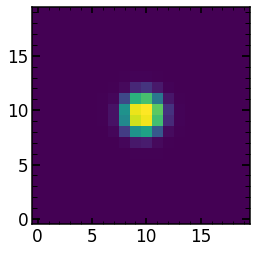

In [212]:
plt.imshow(res_iapetus)

In [238]:
list_of_frd_sigma=[]
for i in np.arange(0.01,0.2,0.015):
    list_of_frd_sigma.append(i)
    
list_of_frd_sigma_test_images=[]    
for i in tqdm(list_of_frd_sigma):    
    minchain_frd_sigma_test=np.copy(minchain_original)   
    minchain_frd_sigma_test[32]=i
    
    res_with_Image=model(minchain_frd_sigma_test,return_Image=True)
    
    res_iapetus_sigma_test=res_with_Image[1]
    
    list_of_frd_sigma_test_images.append(res_iapetus_sigma_test)

100%|███████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:58<00:00,  4.50s/it]


In [239]:
def addnoise(image):
    var_image=image+40 #40 accounts for read noise, but keep in mind that the input images must be scaled properly too...
    artificial_noise_data=np.zeros((var_image.shape[0],var_image.shape[1]))
    for i in range(len(artificial_noise_data)):
        for j in range(len(artificial_noise_data)):
            artificial_noise_data[i][j]=np.random.normal(0,np.sqrt(var_image[i][j]))
    return image+artificial_noise_data

In [240]:
res_iapetus_original_with_noise=addnoise(res_iapetus_original)

In [241]:
knownFRDlist=np.array(list_of_frd_sigma)
imagetosolve=res_iapetus_original_with_noise
imagelist=np.array(list_of_frd_sigma_test_images)

In [242]:
testFRD = FRDsolver(knownFRDlist, imagelist, imagetosolve)

Minimum FRD is 0.07 and within range 0.04 to 0.17500000000000002


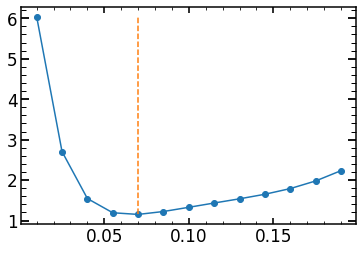

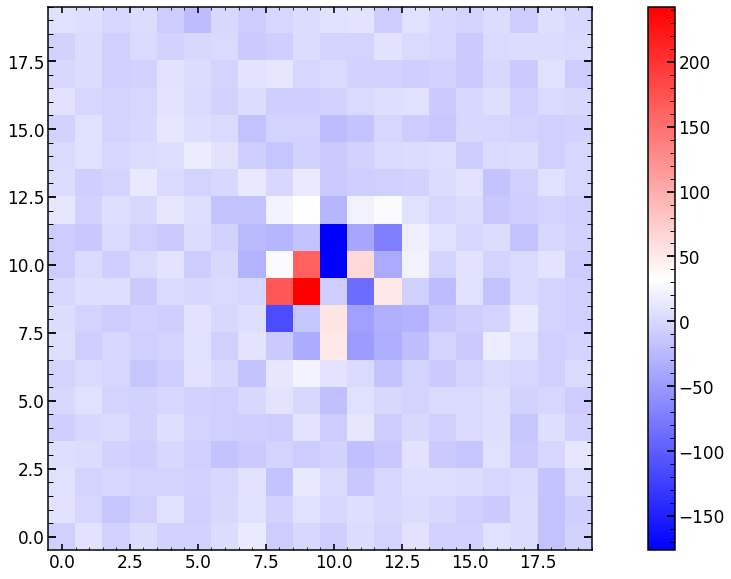

In [243]:
(residuallist, minFRD,uncertaintyrange) = testFRD.find_FRD_compare_positions(knownFRDlist, imagelist, imagetosolve)

plt.plot(knownFRDlist,residuallist,marker='o')
plt.plot([minFRD,minFRD],[np.min(residuallist),np.max(residuallist)],'--')
plt.show()

plt.figure(figsize=(20,10))
plt.imshow(imagetosolve - imagelist[knownFRDlist == minFRD][0],cmap='bwr')
plt.colorbar()
plt.show()

In [237]:
uncertaintyrange

0.10000000000000002

In [248]:
print(f"{np.sin(np.pi/4)=}")

np.sin(np.pi/4)=0.7071067811865475


# Argon, very quick

In [307]:
date='Jan2920'
#obs=34313
#obs_int=int(obs)
single_number='111'
image_index=int(single_number)
eps=6
arc='Ar'
dataset=6

if arc=='Ar':
    obs=34341+96
    finalArc=finalAr
if arc=='Ne':
    obs=34217+96 
    finalArc=finalNe
if arc=='Kr':
    obs=34561+96
    finalArc=finalKr



list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

finalArc.loc[int(single_number)]

fiber                   650
xc                     4003
yc                     1229
wavelength        727.47876
close                     1
lamp                     Ar
xc_effective           4072
second_offset             0
second_ratio              0
second2_offset            0
second2_ratio             0
Name: 111, dtype: object

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: 0
self.single_number: 111
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34389
double_sources_positions_ratios for this spot is: [0 0]


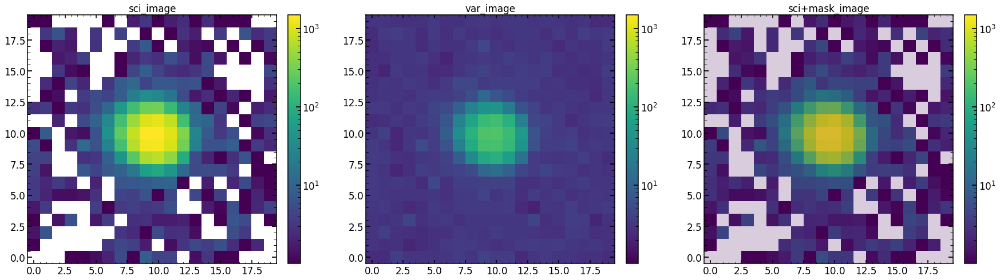

In [308]:
single_analysis=Zernike_Analysis(date=date,obs='0',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)
single_analysis.create_basic_data_image()

In [309]:
double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
columns,columns22,columns22_analysis=single_analysis.return_columns()

chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
#chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
len_of_chains=single_analysis.len_of_chains()

minchain_parametrization,like_min=single_analysis.create_likelihood()

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371116ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371116ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371116ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 601.7060024741852
average chi2 reduced is: -0.29793566514654307


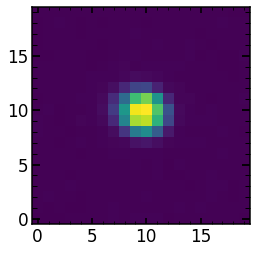

In [310]:
sci_image=list_of_sci_images[4]
plt.imshow(sci_image)

(0.0, 5000.0)

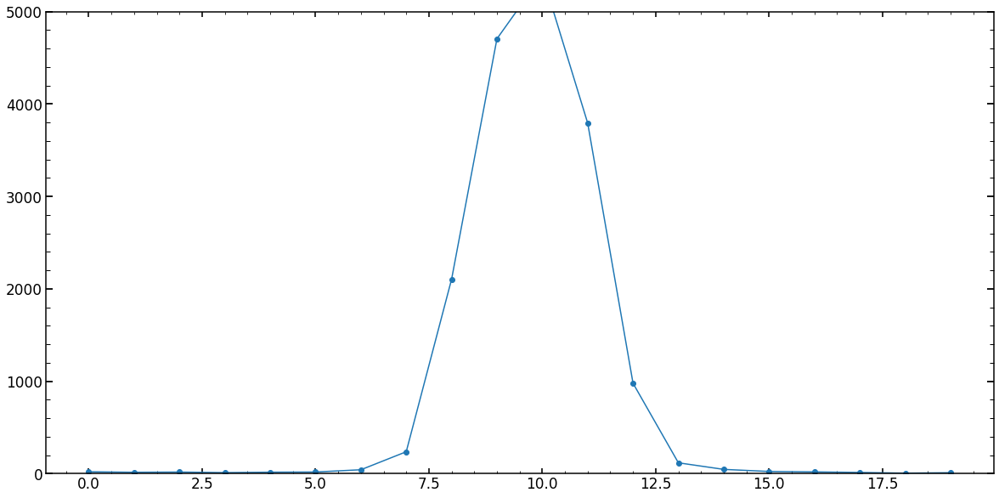

In [311]:
plt.figure(figsize=(20,10))
lsf=np.sum(sci_image[:,7:13],axis=1)
plt.plot(lsf,marker='o')
plt.ylim(0,5000)

In [312]:
model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,dithering=1,save=1,zmax=56,verbosity=1,\
                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,test_run=False)   


list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
#list_of_minchain=model_multi.create_list_of_allparameters(gbests_positions[-1],list_of_defocuses=list_of_defocuses_input_long,zmax=56)



res_multi=model_multi(list_of_minchain,return_Images=True)


mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

#model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],dithering=1,save=1,zmax=22,verbosity=1,\
#                      double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)  

#res_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True)

################################
analyzing image 1 out of 9
 
Science image shape is: (60, 60)
Top left pixel value of the science image is: 5.539916
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 5.061163
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.41e
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [   30.85344867     0.45734526    -0.52660807     0.50962551
    -0.9468852      0.15834789    -0.4658427      0.19889832
    -0.0420762      0.13884542     0.01321628     0.1078342
     0.09325274     0.20336678     0.03429303     0.04475992
    -0.05322591     0.03223796     0.1093409      0.667269
     0.0817359      0.16460768    -0.02428313     0.05664528
     0.02776882     0.1    

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-27.07077333 -10.3121426 ] / 34.447372
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-27.07077335 -10.3121426 ] / 34.447372
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-27.07077333 -10.31214261] / 34.447372
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-27.07077333 -10.3121426 ] / 34.447372
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-28.424312  -10.3121426] / 28.549477
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-27.07077333 -10.82774973] / 35.00583
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-28.424312    -9.79653547] / 29.360443
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-29.77785067  -9.79653547] / 32.2343
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-29.10108133  -9.92543725] / 29.36313
chi2 within shgo optimization routine (chi_

We are fitting for only one source
One source fitting result is [-28.70298419 -10.43789425]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.8776650428771973
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9923503506242002
Finished with lnlike_Neven
chi_2_almost/d.o.f is 54.524532; chi_2_almost_max_dof is 6991.782 log(improvment) is -2.107996
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4556363200
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4556363200 is: 9.111047267913818 seconds
 
###############

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-36.70715589  -2.66696078] / 142.47636
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-27.70715589  15.33303922] / 1008.1201
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-23.20715589 -11.66696078] / 506.3087
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-32.20715589   6.33303922] / 226.3572
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-29.39465589  -1.54196078] / 31.078506
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-29.3946559   -1.54196078] / 31.0785
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-29.39465589  -1.5419608 ] / 31.0785
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-38.39465589 -19.54196078] / 1078.6621
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-33.48170055  -9.7160501 ] / 219.01062
chi2 within shgo optimization routine (chi_

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-30.73343739  -1.57063697] / 25.605675
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-30.73331769  -1.57053901] / 25.605673
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-30.73273776  -1.57099   ] / 25.60568
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-30.7333004   -1.57040916] / 25.605677
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-30.73311286  -1.57060278] / 25.605673
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-30.73340282  -1.57037728] / 25.605675
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-30.73302773  -1.57076451] / 25.605679
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-30.73330905  -1.57047409] / 25.605675
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-30.73321527  -1.57057089] / 25.605675
chi2 within shgo optimization routine 

creating wf_full_fake_0
Time for wavefront and wavefront/pupil combining is 0.0005922317504882812
type(expwf_grid)<class 'numpy.complex64'>
Time for FFT is 0.4121260643005371
type(img_apod)<class 'numpy.float32'>
Finished with _getOptPsf_naturalResolution
 
 
Entering optPsf_postprocessing
optPsf.shape: (3072, 3072)
oversampling_original: 35.374287997579025
size_of_central_cut: 1980
optPsf_cut.shape(1981, 1981)
oversampling:9.0
optPsf_cut.shape[0]1981
size_of_optPsf_cut_downsampled: 504.0
optPsf_cut_downsampled.shape: (505, 505)
size_of_optPsf_cut_in_Microns: 841.6666666666667
postprocessing parameters:
['grating_lines', 'scattering_slope', 'scattering_amplitude', 'pixel_effect', 'fiber_r']
[88727.59630932864, 2.2143796117400574, 0.0024644148912532264, 0.38325514242593006, 1.8057147899410229]
type(pointsx): <class 'numpy.float32'>
optPsf_cut_downsampled_scattered.shape:(505, 505)
simulation_00 parameter:None
are we invoking double sources (1 or True if yes): False
double source positio

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-33.18135648 -10.44008733] / 22.159264
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-33.15648756 -10.61976184] / 22.21542
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-33.31191831 -10.51894448] / 22.238943
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-33.24042017 -10.52443453] / 22.175014
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-33.26528909 -10.34476002] / 22.275898
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-33.18368794 -10.55101139] / 22.164557
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-33.12462426 -10.46666419] / 22.158941
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-33.0667263  -10.43777901] / 22.200108
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-33.1222928  -10.35574013] / 22.219229
chi2 within shgo optimization routine 

Time to apodize the pupil: 0.2915668487548828
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.6554408073425293
Time for pupil and illumination calculation is 0.6639378070831299

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, 4.34781351390343, -0.35887444824367354, -0.248685957934914, 0.43260518937030074, -1.0419617443388947, 0.13054545784261024, -0.36366051022858814, -0.04280526477259451, -0.15590270853783805, 0.09798861298886026, 0.014229781367881795, 0.028756652299861515, -0.04932068105637284, 0.07325735367982969, -0.018893964161872424, 0.02170519796866855, -0.02155610495132118, 0.009234565132697152, 0.006570075331227807, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, -0.35887444824367354, -0.248685957934914, 0.43260518937

We are fitting for only one source
One source fitting result is [-9.22944619 -1.54289546]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.2776148319244385
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.995425478992994
Finished with lnlike_Neven
chi_2_almost/d.o.f is 6.1949806; chi_2_almost_max_dof is 3424.3958 log(improvment) is -2.742544
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4556363200
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4556363200 is: 7.201497793197632 seconds
 
#################

We are fitting for only one source
One source fitting result is [-2.98133385 -1.42762462]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.25249505043029785
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9904936132458567
Finished with lnlike_Neven
chi_2_almost/d.o.f is 4.889926; chi_2_almost_max_dof is 1711.1586 log(improvment) is -2.543988
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4556363200
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4556363200 is: 7.370510816574097 seconds
 
################

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.48304759  7.69688351] / 2.8508806
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.48304759  7.6972697 ] / 2.8511126
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.48304759  7.69746649] / 2.8512316
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.48304759  7.69756678] / 2.8512914
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.48304759  7.69761788] / 2.8513227
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.48304759  7.69764392] / 2.8513381
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.48304759  7.69765719] / 2.8513467
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.48304759  7.69766396] / 2.8513508
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.48304759  7.69766741] / 2.8513532
chi2 within shgo optimization routine (chi_2_almost_mul

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9992844187369281
Finished with lnlike_Neven
chi_2_almost/d.o.f is 3.385803; chi_2_almost_max_dof is 2214.2134 log(improvment) is -2.8155577
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4556363200
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4556363200 is: 6.0205748081207275 seconds
 
################################
analyzing image 7 out of 9
 
Science image shape is: (50, 50)
Top left pixel value of the science image is: 3.072083
Variance image shape is: (50, 50)
Top left pixel value of the variance image is: 4.0011964
Mask image shape is: (50, 50)
Sum of mask ima

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-19.17000451   3.03770184] / 60.89838
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.21668095   5.89767252] / 17.581171
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.83660709   7.03789411] / 11.699055
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.6613106    7.56378357] / 11.121195
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.57521138   7.82208123] / 11.323457
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.53163793   7.95280157] / 11.547715
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.50925248   8.01995793] / 11.695438
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.49766157   8.05473066] / 11.7812605
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.49163368   8.07281432] / 11.828187
chi2 within shgo optimization routine

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9958981101626647
Finished with lnlike_Neven
chi_2_almost/d.o.f is 21.26662; chi_2_almost_max_dof is 5694.293 log(improvment) is -2.4277413
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4556363200
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4556363200 is: 6.949966907501221 seconds
 
################################
analyzing image 8 out of 9
 
Science image shape is: (60, 60)
Top left pixel value of the science image is: 1.0669432
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 3.9889638
Mask image shape is: (60, 60)
Sum of mask imag

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.34007561  17.23680449] / 13.696274
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.80007201  18.09864472] / 17.414223
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.34007561  16.37496427] / 13.659485
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.61007741  15.51312404] / 16.089472
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.88007921  16.37496427] / 13.5359535
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-12.42008281  15.94404416] / 15.380833
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.88007921  15.51312404] / 16.11755
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.47507651  16.80588438] / 13.222387
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-12.01508011  16.80588438] / 13.402522
chi2 within shgo optimization routine

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9940972344654534
Finished with lnlike_Neven
chi_2_almost/d.o.f is 28.612812; chi_2_almost_max_dof is 5771.3247 log(improvment) is -2.304715
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4556363200
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4556363200 is: 8.170408248901367 seconds
 
################################
analyzing image 9 out of 9
 
Science image shape is: (60, 60)
Top left pixel value of the science image is: 1.1692705
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 4.311477
Mask image shape is: (60, 60)
Sum of mask imag

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.1649122    8.18475885] / 25.364605
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.82315781   8.18475885] / 23.142488
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.1649122    8.59399679] / 27.023026
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.82315781   7.77552091] / 22.114027
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-14.15228062   7.36628296] / 21.257668
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-14.81052623   7.36628296] / 21.539934
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-15.13964903   6.54780708] / 23.523455
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-14.15228062   7.77552091] / 21.624895
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-14.81052623   6.95704502] / 21.804619
chi2 within shgo optimization routine

We are fitting for only one source
One source fitting result is [-14.37563523   7.34045496]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 1.3757996559143066
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9928003200534306
Finished with lnlike_Neven
chi_2_almost/d.o.f is 41.752296; chi_2_almost_max_dof is 6822.184 log(improvment) is -2.213243
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4556363200
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4556363200 is: 8.481223106384277 seconds
 
###############

In [313]:
list_of_var_images_via_model=[]
for index_of_single_image in range(len(list_of_sci_images)):
    single_var_image_via_model=create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])
    
    list_of_var_images_via_model.append(single_var_image_via_model)

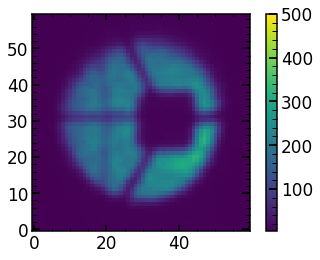

In [314]:
plt.imshow(list_of_var_images_via_model[0],vmax=500)
plt.colorbar()

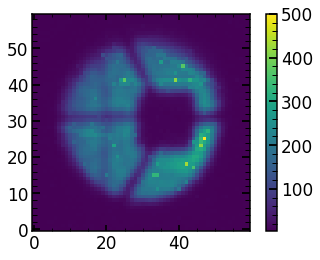

In [315]:
plt.imshow(list_of_var_images[0],vmax=500)
plt.colorbar()

In [316]:
array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result
quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)




list_of_var_sums=[]
for i in range(9):
    var_image_masked=list_of_var_images[i]
    sci_image=list_of_sci_images[i]
    

    mean_value_of_background=np.mean([np.median(sci_image),np.median(sci_image),\
                      np.median(sci_image),np.median(sci_image)])*3
            
    #flux_mask=sci_image>(mean_value_of_background)
    #var_image_masked=var_image[flux_mask]
    
    var_image_masked_without_nan = var_image_masked.ravel()[var_image_masked.ravel()>quantile_08_focus]
    print('number of pixels considering in image '+str(i)+': '+str(var_image_masked_without_nan.shape[0]))
    var_sum=-(1/2)*(np.sum(np.log(2*np.pi*var_image_masked_without_nan)))
    list_of_var_sums.append(var_sum)
    
array_of_var_sum=np.array(list_of_var_sums)
max_of_array_of_var_sum=np.max(array_of_var_sum)
print(array_of_var_sum)
renormalization_of_var_sum=array_of_var_sum/max_of_array_of_var_sum

renormalization_of_var_sum

array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result

quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)
'model pixels with a flux larger than?: '+str(quantile_08_focus)

number of pixels considering in image 0: 2304
number of pixels considering in image 1: 1732
number of pixels considering in image 2: 1242
number of pixels considering in image 3: 100
number of pixels considering in image 4: 40
number of pixels considering in image 5: 71
number of pixels considering in image 6: 1171
number of pixels considering in image 7: 1597
number of pixels considering in image 8: 2198
[-6634.08300781 -5042.66015625 -3687.96826172  -280.73995972
  -106.93131256  -191.23396301 -3401.40551758 -4627.16601562
 -6252.35058594]


'model pixels with a flux larger than?: 6.144405937194825'

mean reported value:-600.5364785545372
array_of_single_res: [-50707.1875     -31062.65234375 -13336.48925781  -1071.09716797
   -827.86456299   -849.02362061 -16184.13964844 -27510.1484375
 -40170.15234375]
renormalization factors: [62.04060204 47.15793752 34.48913301  2.6254233   1.          1.78838133
 31.8092562  43.27232038 58.47071766]


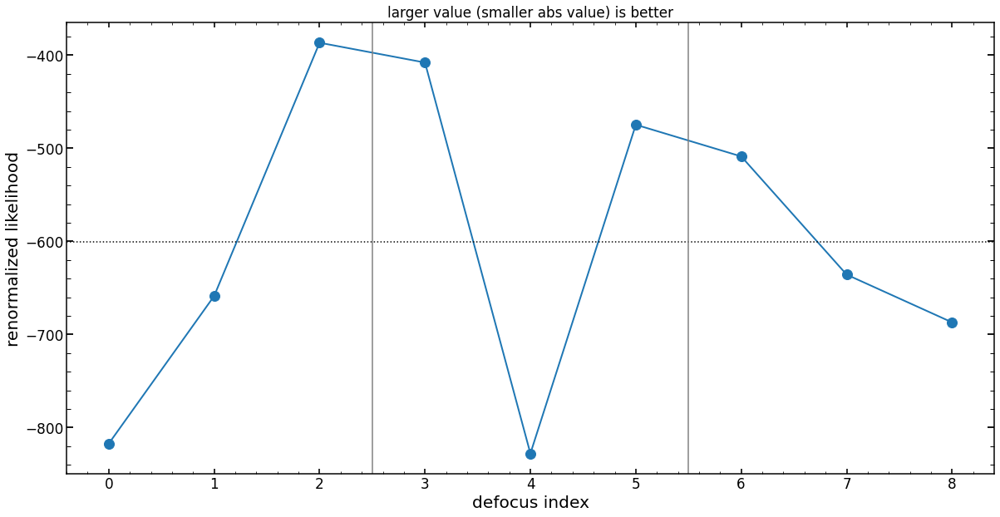

In [317]:
# shows the reported likelihood for each image, after division by the renormalization factor
# smaller absolute values is better
# dotted lien shows the mean reported value

plt.figure(figsize=(20,10))
array_of_single_res=np.array(list_of_single_res)

mean_res_of_multi_same_spot=np.mean(array_of_single_res/renormalization_of_var_sum)
print('mean reported value:'+str(mean_res_of_multi_same_spot))
print('array_of_single_res: '+str(array_of_single_res))
print('renormalization factors: '+str(renormalization_of_var_sum))
plt.plot(array_of_single_res/renormalization_of_var_sum,marker='o',lw=2,ms=12)
plt.xlabel('defocus index')
plt.ylabel('renormalized likelihood')
plt.axhline(mean_res_of_multi_same_spot,color='black',ls=":")
plt.axvline(2.5,color='gray')
plt.title('larger value (smaller abs value) is better')
plt.axvline(5.5,color='gray')

In [318]:
"""
-1380.846598202445
array_of_single_res: [-84607.3046875  -41977.2734375  -16216.77636719  -5851.328125
  -2012.60107422  -3942.59765625 -27768.34375    -44224.47265625
 -60664.78125   ]
renormalization factors: [59.84005376 46.86738    34.71011492  2.42838506  1.          1.89298036
 30.3651004  40.85605092 52.79647879]
 """

'\n-1380.846598202445\narray_of_single_res: [-84607.3046875  -41977.2734375  -16216.77636719  -5851.328125\n  -2012.60107422  -3942.59765625 -27768.34375    -44224.47265625\n -60664.78125   ]\nrenormalization factors: [59.84005376 46.86738    34.71011492  2.42838506  1.          1.89298036\n 30.3651004  40.85605092 52.79647879]\n '

In [319]:
minchain=list_of_minchain[4]

print('minchain.shape '+str(minchain.shape))

    
dfz11 = pd.DataFrame(np.array([np.array([minchain])[0][0:8]]),columns=columns22[0:8])
print(dfz11)
print('##############################################')
dfz22 = pd.DataFrame(np.array([np.array([minchain])[0][8:19]]),columns=columns22[8:19])
print(dfz22)

print('')
#dfglobal = pd.DataFrame(np.array([np.array([minchain])[0][19:len(columns)]]),columns=columns[19:])
print('##############################################')
dfglobal1 = pd.DataFrame(np.array([np.array([minchain])[0][19:19+6]]),columns=columns22[19:19+6])
print(dfglobal1)
print('##############################################')
dfglobal2 = pd.DataFrame(np.array([np.array([minchain])[0][25:25+4]]),columns=columns22[25:25+4])
print(dfglobal2)
print('##############################################')
dfglobal3 = pd.DataFrame(np.array([np.array([minchain])[0][29:29+5]]),columns=columns22[29:29+5])
print(dfglobal3)
print('##############################################')
dfglobal4 = pd.DataFrame(np.array([np.array([minchain])[0][34:41]]),columns=columns22[34:41])
print(dfglobal4)

minchain.shape (76,)
         z4        z5        z6        z7        z8        z9       z10  \
0  0.561294 -0.475477 -0.208983  0.421602 -1.055544  0.126574 -0.349063   

        z11  
0 -0.077334  
##############################################
        z12       z13       z14      z15       z16      z17       z18  \
0 -0.172164  0.092152  0.014375  0.01746 -0.069688  0.05467 -0.026492   

        z19       z20       z21       z22  
0  0.018412 -0.017032  0.005948 -0.008111  

##############################################
    hscFrac  strutFrac   dxFocal   dyFocal  slitFrac  slitFrac_dy
0  0.667269   0.081736  0.164608 -0.024283  0.056645     0.027769
##############################################
   wide_0  wide_23  wide_43  misalign
0     0.1      0.1      0.1       1.0
##############################################
    x_fiber   y_fiber  effective_radius_illumination  frd_sigma  \
0 -0.061825 -0.066514                        0.90065   0.025772   

   frd_lorentz_factor  
0        

(-2.8, -1.5)

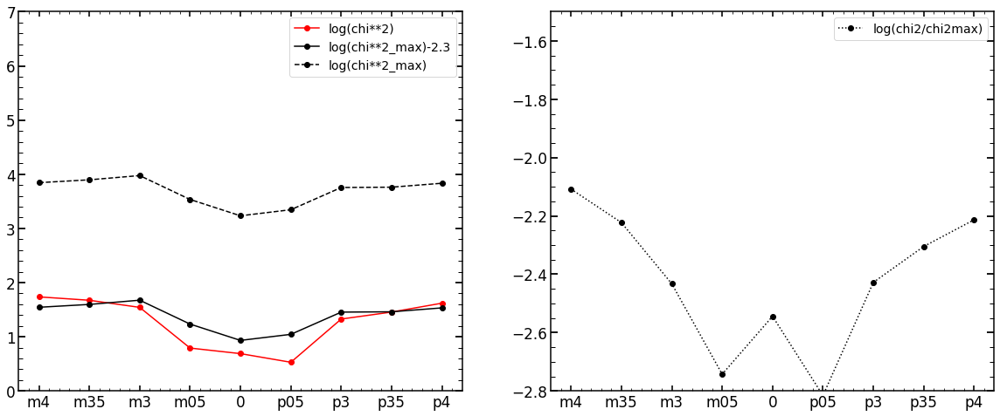

In [320]:
chi_results_array=np.array(res_multi[4])

plt.figure(figsize=(20,8))

plt.subplot(121)

plt.plot(np.log10(chi_results_array[:,2]),color='red',label='log(chi**2)',marker='o')
plt.plot(np.log10(chi_results_array[:,3])-2.3,color='black',label='log(chi**2_max)-2.3',marker='o')
plt.plot(np.log10(chi_results_array[:,3]),color='black',label='log(chi**2_max)',marker='o',ls='--')
plt.ylim(0,7)
plt.xticks(np.arange(0,len(list_of_defocuses_input_long),1),list_of_defocuses_input_long)
plt.legend()
plt.subplot(122)

plt.plot(np.log10(chi_results_array[:,2]/chi_results_array[:,3]),color='black',label='log(chi2/chi2max)',marker='o',ls=':')
plt.legend()
plt.xticks(np.arange(0,len(list_of_defocuses_input_long),1),list_of_defocuses_input_long)
plt.ylim(-2.8,-1.5)

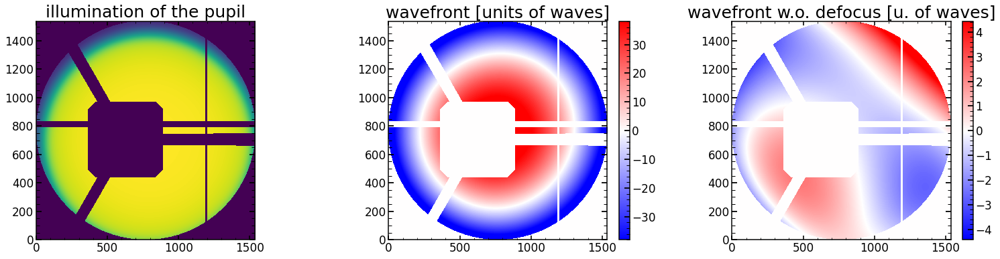

In [291]:
single_analysis.illumination_wavefront_plot()

In [337]:
minchain[:len(columns22)][np.array(columns22)=='frd_sigma']

array([0.02577162])

In [338]:
minchain[:len(columns22)][np.array(columns22)=='hscFrac']

array([0.667269])

Science image shape is: (20, 20)
Top left pixel value of the science image is: -3.3105633
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 2.4913008
Mask image shape is: (20, 20)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.41e
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [    0.56129421    -0.47547726    -0.2089828      0.42160229
    -1.05554411     0.12657368    -0.34906305    -0.07733435
    -0.17216364     0.09215193     0.01437457     0.01745986
    -0.06968831     0.05467029    -0.02649211     0.01841167
    -0.01703185     0.00594837    -0.00811147     0.667269
     0.0817359      0.16460768    -0.02428313     0.05664528
     0.02776882     0.1            0.1            0.1
     1.            -0.06182505 

time misalign 0.04771089553833008
Time for cutting out the square is 0.007195711135864258
Time for cutting out the square is 0.019453048706054688
Finished with getPupil
Finished with _get_Pupil
Requested pupil size is (pupil.size) [m]: 0.1395327
One pixel has size of (pupil.scale) [m]: 9.08416015625e-05
Requested pupil has so many pixels (pupil_plane_im): (1536, 1536)
Time for _get_Pupil function is 0.6002953052520752
lower_limit_of_ilum: 768
higher_limit_of_ilum: 2304
Size after padding zeros to 2x size and extra padding to get size suitable for FFT: (3072, 3072)
size_of_ilum_in_units_of_radius: 2.0
radiometric parameters are: 
x_ilum,y_ilum,radiometricEffect,radiometricExponent[1, 1, 0, 0.25]
skiping ``radiometric effect'' 
Time to apodize the pupil: 0.13716721534729004
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.3000812530517578
Time for pupil and illumination calculation is 0.9014220237731934

Starting creation of wavefron

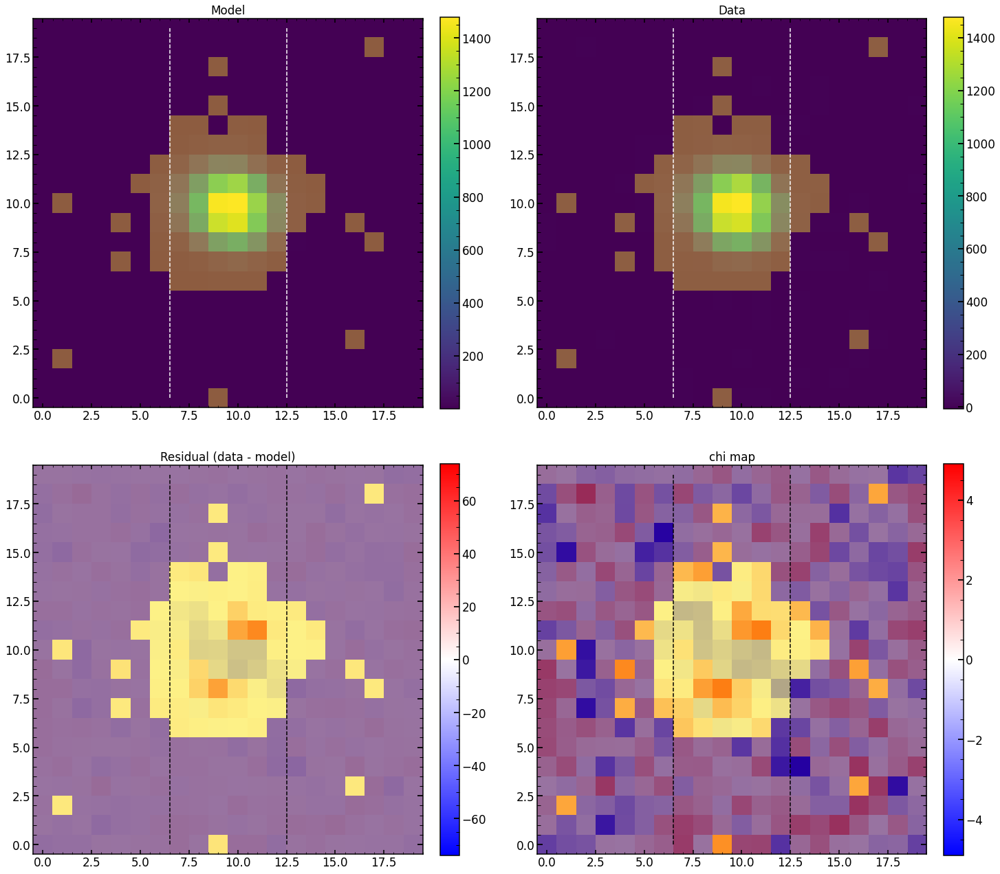

In [342]:
index_of_single_image=4

#
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,explicit_psf_position=[0,0])

custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])


minchain_test=np.copy(minchain)
minchain_test[:len(columns22)][np.array(columns22)=='frd_sigma']=0.25


res=model_single_image(minchain,return_Image=True)
res_test=model_single_image(minchain_test,return_Image=True)


matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=True,use_max_chi_scaling=True,use_max_flux_scaling=False,show_impact_pixels_mask=False)


In [347]:
find_centroid_of_flux(res[1][5:15,5:15])

(4.303984671326256, 4.633060672974152)

In [346]:
find_centroid_of_flux(res_test[1][5:15,5:15])

(4.247870566365345, 4.678789436337698)

In [368]:
np.log10(2)

0.3010299956639812

In [518]:
pupil_illuminated0=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/Test/pupil_illuminated0.03323651947473037_1_0.npy')

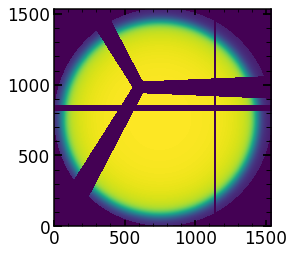

In [519]:
plt.imshow(pupil_illuminated0)

In [524]:
pupil_illuminated0=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/Test/pupil_illuminated-0.015080353984103227_0.01899902572893377_0.8.npy')

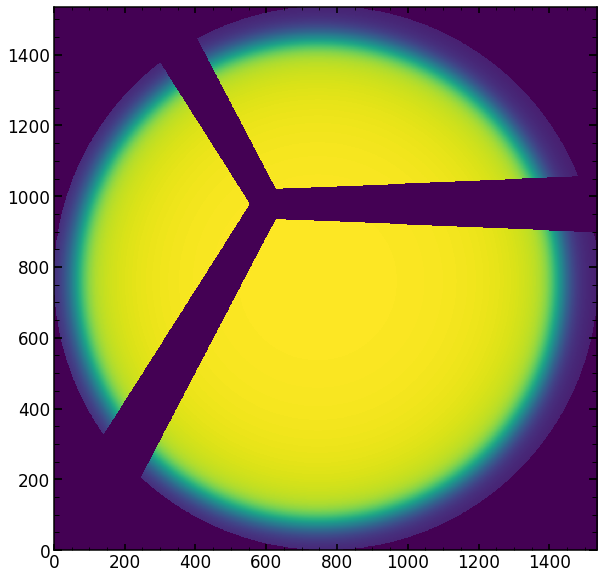

In [527]:
plt.figure(figsize=(20,10))
plt.imshow(pupil_illuminated0)

# PIPE2D-806 (misaligment)

In [146]:
finalAr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalAr_Feb2020",allow_pickle=True)
finalNe=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalNe_Feb2020",allow_pickle=True)
finalKr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalKr_Feb2020",allow_pickle=True)

In [112]:
date='Jan2920'
#obs=34313
#obs_int=int(obs)
single_number='23'
image_index=int(single_number)
eps=6
arc='Ar'
dataset=6

if arc=='Ar':
    obs=34341+96
    finalArc=finalAr
if arc=='Ne':
    obs=34217+96 
    finalArc=finalNe
if arc=='Kr':
    obs=34561+96
    finalArc=finalKr



list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

finalArc.loc[int(single_number)]

fiber                   63
xc                     453
yc                    4020
wavelength        966.0642
close                    1
lamp                    Ar
xc_effective           453
second_offset            0
second_ratio             0
second2_offset           0
second2_ratio            0
Name: 23, dtype: object

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: 0
self.single_number: 55
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34389
double_sources_positions_ratios for this spot is: [0.0 0.0]


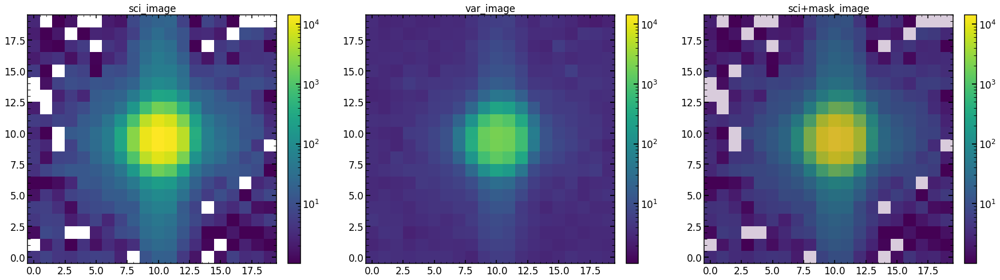

In [148]:
single_analysis=Zernike_Analysis(date=date,obs='0',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)
single_analysis.create_basic_data_image()

In [149]:
double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
columns,columns22,columns22_analysis=single_analysis.return_columns()

chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
#chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
len_of_chains=single_analysis.len_of_chains()

minchain_parametrization,like_min=single_analysis.create_likelihood()

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437556ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437556ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437556ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 1864.056093556975
average chi2 reduced is: 8.14733062907503


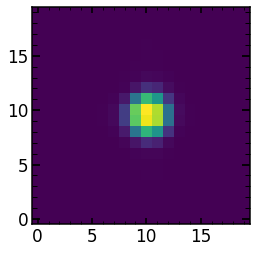

In [150]:
sci_image=list_of_sci_images[4]
plt.imshow(sci_image)

(0.0, 5000.0)

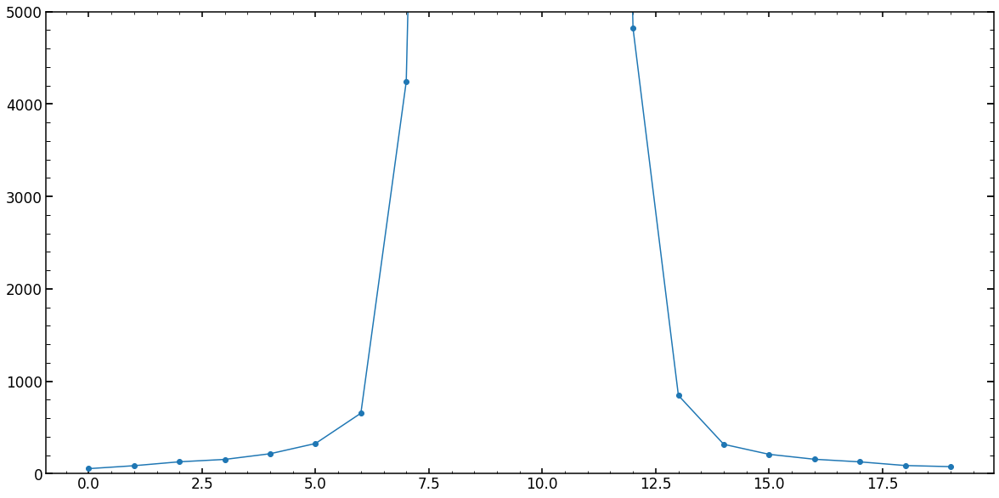

In [151]:
plt.figure(figsize=(20,10))
lsf=np.sum(sci_image[:,7:13],axis=1)
plt.plot(lsf,marker='o')
plt.ylim(0,5000)

In [152]:
## misalign =1

In [153]:
np.arange(len(columns22))[np.array(columns22)=='misalign']

array([28])

In [154]:
np.array(columns22)

array(['z4', 'z5', 'z6', 'z7', 'z8', 'z9', 'z10', 'z11', 'z12', 'z13',
       'z14', 'z15', 'z16', 'z17', 'z18', 'z19', 'z20', 'z21', 'z22',
       'hscFrac', 'strutFrac', 'dxFocal', 'dyFocal', 'slitFrac',
       'slitFrac_dy', 'wide_0', 'wide_23', 'wide_43', 'misalign',
       'x_fiber', 'y_fiber', 'effective_radius_illumination', 'frd_sigma',
       'frd_lorentz_factor', 'det_vert', 'slitHolder_frac_dx',
       'grating_lines', 'scattering_slope', 'scattering_amplitude',
       'pixel_effect', 'fiber_r', 'flux'], dtype='<U29')

In [155]:
list_of_minchain[0][28]

1.5421105679665812

In [156]:
minchain_parametrization[19*2+9]

0.972932585277637

In [157]:
model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,dithering=1,save=1,zmax=56,verbosity=1,\
                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,test_run=False)   


list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
#list_of_minchain=model_multi.create_list_of_allparameters(gbests_positions[-1],list_of_defocuses=list_of_defocuses_input_long,zmax=56)



res_multi=model_multi(list_of_minchain,return_Images=True)


mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

#model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],dithering=1,save=1,zmax=22,verbosity=1,\
#                      double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)  

#res_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True)

################################
analyzing image 1 out of 9
 
Science image shape is: (60, 60)
Top left pixel value of the science image is: 12.536561
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 6.191195
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.44a
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [   30.30223892    -0.61160012    -0.9770476      0.10358854
    -0.04169479    -0.12428084    -0.31517076    -0.56109884
    -0.03910824     0.01240352     0.01239223     0.04277858
     0.00236015     0.05830061     0.00001259    -0.01078809
    -0.01705461     0.02488918     0.01618792     0.65080197
     0.07483151    -0.01997029     0.04103995     0.06206498
     0.00733229     0.1

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.34772409 -6.59639381] / 102.17831
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.35439357 -6.59639381] / 102.215706
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.35439358 -6.59639381] / 102.21571
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.35439357 -6.59639383] / 102.215706
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.34764829 -6.59639381] / 102.17788
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.35098358 -6.59639381] / 102.196335
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.35266944 -6.59639381] / 102.20586
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.35352178 -6.59639381] / 102.21071
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.35395274 -6.59639381] / 102.21316
chi2 within shgo optimization routine (chi_2_almost_

We are fitting for only one source
One source fitting result is [-1.22178317 -7.27534658]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 1.1350479125976562
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9944826744211841
Finished with lnlike_Neven
chi_2_almost/d.o.f is 184.77145; chi_2_almost_max_dof is 61107.62 log(improvment) is -2.5194604
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4512699840
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4512699840 is: 7.7635579109191895 seconds
 
###############

chi2 within shgo optimization routine (chi_2_almost_multi_values): [3.888945   1.88138744] / 84.213
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.10572341  1.88669953] / 2771.988
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.40707377 1.88344376] / 468.70605
chi2 within shgo optimization routine (chi_2_almost_multi_values): [2.31738482 1.88231556] / 169.35408
chi2 within shgo optimization routine (chi_2_almost_multi_values): [3.14262662 1.88182818] / 107.093315
chi2 within shgo optimization routine (chi_2_almost_multi_values): [3.52662686 1.8816014 ] / 91.3324
chi2 within shgo optimization routine (chi_2_almost_multi_values): [3.71119477 1.8814924 ] / 86.765236
chi2 within shgo optimization routine (chi_2_almost_multi_values): [3.80129814 1.88143918] / 85.24511
chi2 within shgo optimization routine (chi_2_almost_multi_values): [3.8456195  1.88141301] / 84.66815
chi2 within shgo optimization routine (chi_2_almost_multi_values): [3.8675021 

We are fitting for only one source
One source fitting result is [4.07081479 1.4933961 ]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.7013790607452393
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9952462119347639
Finished with lnlike_Neven
chi_2_almost/d.o.f is 146.53122; chi_2_almost_max_dof is 66239.34 log(improvment) is -2.655186
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4512699840
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4512699840 is: 5.8083930015563965 seconds
 
##################

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.97615789 -7.58203874] / 72.358116
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.97584961 -7.5784319 ] / 72.35877
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.97524105 -7.58345825] / 72.358086
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.97666903 -7.58397012] / 72.358185
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.97521469 -7.58213768] / 72.35806
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.97429785 -7.58355719] / 72.35816
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.97569288 -7.58241835] / 72.35806
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.97566653 -7.58109778] / 72.35816
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.97534742 -7.58286813] / 72.35807
chi2 within shgo optimization routine (chi_2_almost_multi_val

Time to apodize the pupil: 0.16440510749816895
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.44742798805236816
Time for pupil and illumination calculation is 0.4587850570678711

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, 3.635643893778162, -0.2952407681547257, -0.3894092446333737, 0.16577286938165253, -0.024097314176757874, -0.11223303411049455, -0.31157855213491337, -0.45580147244872793, -0.03675981599322112, 0.005107790132537341, 0.008729558787027709, 0.03271700690552819, -0.022365624968265486, 0.04600249706038548, 0.003175933441446158, -0.0029377967308977593, -0.017704763892938024, 0.023021369570257, 0.00785300553669097, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, -0.2952407681547257, -0.3894092446333737, 0.16577

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.69371178  0.83099561] / 25.856604
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.69371842  0.83099515] / 25.856602
We are fitting for only one source
One source fitting result is [-1.69371205  0.83099169]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.2823598384857178
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9956890231304287
Finished with lnlike_Neven
chi_2_almost/d.o.f is 82.192635; chi_2_almost_max_dof is 29350.236 log(improvment) is -2.5527787
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4512699840
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.68828917  0.80050567] / 7.160915
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.68828916  0.80050568] / 7.160919
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.5342784   0.15994154] / 62.843086
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.24506247  0.554481  ] / 16.317574
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.49203756  0.69157104] / 9.422342
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.59676086  0.74970047] / 7.861382
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.64461577  0.7762636 ] / 7.417931
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.66722779  0.788815  ] / 7.2672668
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.67808092  0.79483932] / 7.2083735
chi2 within shgo optimization routine (chi_2_almost_multi_va

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9971542153176265
Finished with lnlike_Neven
chi_2_almost/d.o.f is 18.348995; chi_2_almost_max_dof is 10387.387 log(improvment) is -2.752894
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4512699840
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4512699840 is: 4.062254905700684 seconds
 
################################
analyzing image 6 out of 9
 
Science image shape is: (20, 20)
Top left pixel value of the science image is: 4.9133725
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 3.6352098
Mask image shape is: (20, 20)
Sum of mask ima

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-0.69005572  9.75781412] / 5.375559
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-0.65618796  9.75781412] / 5.3693166
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-0.6286704   9.81804754] / 5.522865
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-0.66888837  9.87828096] / 5.744878
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-0.67523857  9.6975807 ] / 5.333917
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-0.64137081  9.6975807 ] / 5.3440285
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-0.66042143  9.63734728] / 5.403037
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-0.65724632  9.72769741] / 5.3392973
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-0.69111409  9.72769741] / 5.345485
chi2 within shgo optimization routine (chi_2_almost_multi_val

Time to apodize the pupil: 0.1862189769744873
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.3789818286895752
Time for pupil and illumination calculation is 0.386613130569458

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, -23.030951134687623, 0.021118587207447526, 0.19822911552068817, 0.22795719783804985, -0.006499837341342667, -0.10018523271579109, -0.30798634184433393, -0.35050410041022684, -0.03441139071365405, -0.0021879394769615083, 0.005066884861878156, 0.022655433910359242, -0.047091399104706715, 0.03370438026218886, 0.006339275813364683, 0.004912492259300131, -0.018354921878484195, 0.021153563032547645, -0.00048191132306348635, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, 0.021118587207447526, 0.19822911552068817

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.11648548   8.76144526] / 53.576576
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.12049431   8.7661802 ] / 53.576324
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.11722502   8.76847842] / 53.57649
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.11990076   8.76470918] / 53.576313
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.11692984   8.76427998] / 53.57635
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.11960319   8.76570514] / 53.576283
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.11722581   8.76674695] / 53.57635
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.11923203   8.76521863] / 53.576283
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.12131183   8.76517278] / 53.576355
chi2 within shgo optimization routine (c

lower_limit_of_ilum: 768
higher_limit_of_ilum: 2304
Size after padding zeros to 2x size and extra padding to get size suitable for FFT: (3072, 3072)
size_of_ilum_in_units_of_radius: 2.0
radiometric parameters are: 
x_ilum,y_ilum,radiometricEffect,radiometricExponent[1, 1, 0, 0.25]
skiping ``radiometric effect'' 
Time to apodize the pupil: 0.14258694648742676
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.3210330009460449
Time for pupil and illumination calculation is 0.32822227478027344

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, -26.840464710182736, 0.06631278083061515, 0.2821774526855541, 0.2368406733318209, -0.003985912079140497, -0.09846411823083345, -0.3074731689456798, -0.33546161869044094, -0.034075901388001616, -0.0032301865640327722, 0.004543645729713934, 0.021218066339620822, -0.05062365255276975, 0.03194750643387506, 0.006791181866495901, 0.006033962115042686, -0.0184478015907050

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.42667471  16.48057486] / 327.23624
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.34936996 17.51922723] / 132.53381
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-7.39927979 17.99427232] / 88.69554
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.94487897 18.22147272] / 77.58875
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.72299433 18.33241505] / 74.46439
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.61355918 18.38713262] / 73.478905
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.55931888 18.41425277] / 73.12646
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.53236978 18.42772732] / 72.98487
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.51896401 18.4344302 ] / 72.92273
chi2 within shgo optimization routine (chi_2_almost_multi_v

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.9596226  17.68968357] / 61.93434
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.95962068 17.6896794 ] / 61.934345
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.9596224 17.6896877] / 61.93435
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.95962111 17.68968148] / 61.93434
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.95962197 17.68968563] / 61.93435
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.95962132 17.68968252] / 61.93433
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.95961921 17.68968247] / 61.934326
We are fitting for only one source
One source fitting result is [-5.95962048 17.68968353]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 1.1762590408325195
Sucesfully created optPsf_cut_fiber_convolved_downsampled
F

simulation_00 parameter:None
are we invoking double sources (1 or True if yes): False
double source position/ratio is:[0.0 0.0]
Time for postprocessing up to single_Psf_position protocol is 0.8470151424407959
offset_initial_and_sci: [-1.1767676   1.03468417]
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-19.59090839  -8.6878425 ] / 6496.197
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.59090839   9.3121575 ] / 117.723976
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.09090839  0.3121575 ] / 1274.4242
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-15.09090839  18.3121575 ] / 2093.9316
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-12.84090839   4.8121575 ] / 379.8302
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.84090839 22.8121575 ] / 4067.9614
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.34090839 -4.1878425 ] / 2564.995


chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.96096025  8.19764106] / 93.30943
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.95796259  8.19468981] / 93.30925
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.95866505  8.19281745] / 93.309326
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.9586242   8.19566167] / 93.30925
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.95727375  8.1956141 ] / 93.30927
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.95880322  8.19495656] / 93.30925
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.95778357  8.19539492] / 93.30925
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.95854831  8.19506615] / 93.309265
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.9582934   8.19517574] / 93.30925
chi2 within shgo optimization routine (chi_2_almost_multi_valu

In [158]:
minchain_parametrization_different_misaligment=np.copy(minchain_parametrization)
minchain_parametrization_different_misaligment[19*2+9]=10

In [159]:

list_of_minchain_different_misaligment=model_multi.create_list_of_allparameters(minchain_parametrization_different_misaligment,list_of_defocuses=list_of_defocuses_input_long,zmax=56)

res_multi_different_misaligment=model_multi(list_of_minchain_different_misaligment,return_Images=True)


mean_res_of_multi_same_spot_different_misaligment,list_of_single_res_different_misaligment,list_of_single_model_image_different_misaligment,\
                list_of_single_allparameters_different_misaligment,list_of_single_chi_results_different_misaligment,array_of_psf_positions_output_different_misaligment=res_multi_different_misaligment


################################
analyzing image 1 out of 9
 
Science image shape is: (60, 60)
Top left pixel value of the science image is: 12.536561
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 6.191195
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.44a
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [   30.30223892    -0.61160012    -0.9770476      0.10358854
    -0.04169479    -0.12428084    -0.31517076    -0.56109884
    -0.03910824     0.01240352     0.01239223     0.04277858
     0.00236015     0.05830061     0.00001259    -0.01078809
    -0.01705461     0.02488918     0.01618792     0.65080197
     0.07483151    -0.01997029     0.04103995     0.06206498
     0.00733229     0.1

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.3764239  -6.56718749] / 103.38484
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.37642392 -6.56718749] / 103.38484
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.3764239  -6.56718751] / 103.38487
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.3764239  11.43281032] / 10063.1875
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.3764239   0.51843846] / 1431.7023
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.3764239  -3.32147524] / 416.1576
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.3764239  -5.01726036] / 195.98396
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.3764239  -5.81419033] / 135.81726
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.3764239  -6.19844389] / 116.37276
chi2 within shgo optimization routine (chi_2_almost_mul

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.22746465 -7.25754288] / 93.60854
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.228754  -7.2567963] / 93.608505
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.22827331 -7.25546847] / 93.60856
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.22849175 -7.25714892] / 93.60851
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.22834612 -7.25602862] / 93.60852
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.22845534 -7.25686885] / 93.608505
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.22838253 -7.2563087 ] / 93.60852
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.22843714 -7.25672881] / 93.60852
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.22841894 -7.25658877] / 93.60851
chi2 within shgo optimization routine (chi_2_almost_multi_values

Time to apodize the pupil: 0.1475372314453125
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.3212149143218994
Time for pupil and illumination calculation is 0.3280642032623291

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, 26.492725346748834, -0.5664059298937314, -0.8930992676225695, 0.11247201641902627, -0.0391808657499709, -0.12255972102024038, -0.31465758952683853, -0.5460563627674431, -0.038772751947135746, 0.011361272654964928, 0.011868993580013039, 0.0413412123299587, -0.0011721042798872906, 0.05654374003026828, 0.00046449712265885044, -0.009666615865353093, -0.017147485619612733, 0.024622346602579306, 0.014997219987909073, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, -0.5664059298937314, -0.8930992676225695, 0.112

chi2 within shgo optimization routine (chi_2_almost_multi_values): [4.06433213 1.49602015] / 79.648796
chi2 within shgo optimization routine (chi_2_almost_multi_values): [4.04270024 1.48771394] / 79.670715
chi2 within shgo optimization routine (chi_2_almost_multi_values): [4.06868597 1.50772111] / 79.64591
chi2 within shgo optimization routine (chi_2_almost_multi_values): [4.06006982 1.51778491] / 79.64991
chi2 within shgo optimization routine (chi_2_almost_multi_values): [4.06326655 1.50146134] / 79.64661
chi2 within shgo optimization routine (chi_2_almost_multi_values): [4.07623653 1.5030985 ] / 79.64901
chi2 within shgo optimization routine (chi_2_almost_multi_values): [4.06084612 1.50533759] / 79.646454
chi2 within shgo optimization routine (chi_2_almost_multi_values): [4.06626554 1.51159736] / 79.646324
chi2 within shgo optimization routine (chi_2_almost_multi_values): [4.07410538 1.51398088] / 79.64903
chi2 within shgo optimization routine (chi_2_almost_multi_values): [4.06416094

Time to apodize the pupil: 0.15127015113830566
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.31859803199768066
Time for pupil and illumination calculation is 0.32772397994995117

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, 22.68321177125372, -0.5212117362705637, -0.8091509304577036, 0.1213554919127973, -0.03666694048776874, -0.12083860653528274, -0.3141444166281844, -0.5310138810476572, -0.03843726262148331, 0.010319025567893663, 0.011345754447848817, 0.039903844759220285, -0.004704357727950324, 0.054786866201954484, 0.0009164031757900684, -0.008545146009610538, -0.017240365331833613, 0.024355517097192254, 0.01380651757937272, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, -0.5212117362705637, -0.8091509304577036, 0.121

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.97883644 -7.57343853] / 72.53168
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.97882416 -7.57346206] / 72.53167
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.97885222 -7.57345779] / 72.531685
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.97884038 -7.57344334] / 72.53168
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.97884433 -7.57344816] / 72.53169
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.97885047 -7.57343639] / 72.53167
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.97887064 -7.57342249] / 72.53167
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.97886406 -7.57342891] / 72.531685
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.97885748 -7.57343532] / 72.53168
chi2 within shgo optimization routine (chi_2_almost_multi_valu

creating wf_full_fake_0
Time for wavefront and wavefront/pupil combining is 0.0005497932434082031
type(expwf_grid)<class 'numpy.complex64'>
Time for FFT is 0.4138617515563965
type(img_apod)<class 'numpy.float32'>
Finished with _getOptPsf_naturalResolution
 
 
Entering optPsf_postprocessing
optPsf.shape: (3072, 3072)
oversampling_original: 35.374287997579025
size_of_central_cut: 990
optPsf_cut.shape(991, 991)
oversampling:9.0
optPsf_cut.shape[0]991
size_of_optPsf_cut_downsampled: 252.0
optPsf_cut_downsampled.shape: (253, 253)
size_of_optPsf_cut_in_Microns: 421.6666666666667
postprocessing parameters:
['grating_lines', 'scattering_slope', 'scattering_amplitude', 'pixel_effect', 'fiber_r']
[27247.575198827635, 2.3461396610687326, 0.002164779017480196, 0.32353272489206364, 1.8165093931707572]
type(pointsx): <class 'numpy.float32'>
optPsf_cut_downsampled_scattered.shape:(253, 253)
simulation_00 parameter:None
are we invoking double sources (1 or True if yes): False
double source position/ra

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.72478595  0.83029019] / 25.89636
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.72481473  0.83023493] / 25.896448
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.72482922  0.83020713] / 25.896507
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.72483652  0.83019311] / 25.896519
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.72483652  0.83019311] / 25.896519
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.81107834  0.83019311] / 26.464766
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.72483652  0.87170277] / 25.93457
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.63859469  0.87170277] / 26.073946
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.68171561  0.86132535] / 25.895226
chi2 within shgo optimization routine (chi_2_almost_multi

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9956914237496536
Finished with lnlike_Neven
chi_2_almost/d.o.f is 82.19308; chi_2_almost_max_dof is 29350.236 log(improvment) is -2.5527763
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4512699840
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4512699840 is: 4.6435768604278564 seconds
 
################################
analyzing image 5 out of 9
 
Science image shape is: (20, 20)
Top left pixel value of the science image is: 4.361491
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 3.542502
Mask image shape is: (20, 20)
Sum of mask imag

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.99692922  0.8028822 ] / 8.692176
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.8434069  0.8028822] / 7.2787266
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.76935178  0.8028822 ] / 7.0842648
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.7327053  0.8028822] / 7.105343
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.71434145  0.8028822 ] / 7.145116
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.70508127  0.8028822 ] / 7.1725707
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.70039694  0.8028822 ] / 7.1883483
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.69802354  0.8028822 ] / 7.1968236
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.69802356  0.8028822 ] / 7.1968236
chi2 within shgo optimization routine (chi_2_almost_multi_valu

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9971721057297602
Finished with lnlike_Neven
chi_2_almost/d.o.f is 18.600729; chi_2_almost_max_dof is 10387.387 log(improvment) is -2.7469764
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4512699840
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4512699840 is: 4.770736932754517 seconds
 
################################
analyzing image 6 out of 9
 
Science image shape is: (20, 20)
Top left pixel value of the science image is: 4.9133725
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 3.6352098
Mask image shape is: (20, 20)
Sum of mask im

chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 1.56793872 -3.86184428] / 3151.7002
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-7.43206128 14.13815572] / 1146.3627
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.30706128  2.88815572] / 1128.5648
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 2.69293872 20.88815572] / 2782.5066
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 7.19293872 -6.11184428] / 6459.7544
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-1.80706128 11.88815572] / 96.089005
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.05706128 -1.61184428] / 2059.243
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 4.94293872 16.38815572] / 1284.1139
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.44293872 7.38815572] / 100.32336
chi2 within shgo optimization routine (chi_2_almost_multi_

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-0.66725225  9.70278762] / 5.511662
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-0.66725025  9.70278423] / 5.5116634
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-0.66725414  9.70278318] / 5.511664
We are fitting for only one source
One source fitting result is [-0.66725404  9.70277533]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.28005313873291016
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9986695393787579
Finished with lnlike_Neven
chi_2_almost/d.o.f is 10.46213; chi_2_almost_max_dof is 14156.538 log(improvment) is -3.131337
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 451269984

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.66984263   9.67832817] / 73.41307
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.58577346   9.51018982] / 67.93891
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.54478196   9.42820683] / 65.651115
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.52472357   9.38809004] / 64.62271
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.51489129   9.36842549] / 64.14046
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.51006758   9.35877805] / 63.90913
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.51006759   9.35877805] / 63.90913
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.51006758   9.35877807] / 63.90913
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.51006758   9.35877805] / 63.90913
chi2 within shgo optimization routine (chi_2_

We are fitting for only one source
One source fitting result is [-11.11472381   8.76193197]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.6925280094146729
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9975
Finished with lnlike_Neven
chi_2_almost/d.o.f is 108.38894; chi_2_almost_max_dof is 44416.99 log(improvment) is -2.612564
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4512699840
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4512699840 is: 6.562907934188843 seconds
 
###########################

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.11838226 29.69031709] / 2105.0032
chi2 within shgo optimization routine (chi_2_almost_multi_values): [1.38161774 2.69031709] / 3965.4905
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-7.61838226 20.69031709] / 215.47684
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.86838226  7.19031709] / 1730.9966
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-0.86838226 25.19031709] / 1125.8851
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.36838226 16.19031709] / 98.44319
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-14.36838226  34.19031709] / 5061.0513
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.80588226  17.31531709] / 853.9664
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.80588226 35.31531709] / 4529.832
chi2 within shgo optimization routine (chi_2_almost_mult

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.95618356 17.68977142] / 65.61968
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.95611435 17.68981917] / 65.61969
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.95613243 17.68977447] / 65.61968
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.95612791 17.68978565] / 65.61968
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.95611887 17.689808  ] / 65.61969
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.95612565 17.68979123] / 65.61968
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.95612339 17.68979682] / 65.61968
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.95609557 17.68980393] / 65.61969
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.95609105 17.68981511] / 65.61968
chi2 within shgo optimization routine (chi_2_almost_multi_values

Time to apodize the pupil: 0.16189908981323242
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.3555119037628174
Time for pupil and illumination calculation is 0.36233997344970703

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, -30.649978285677847, 0.11150697445378277, 0.36612578985042005, 0.24572414882559196, -0.001471986816938324, -0.09674300374587581, -0.30695999604702556, -0.3204191369706551, -0.03374041206234918, -0.004272433651104037, 0.004020406597549713, 0.0197806987688824, -0.05415590600083278, 0.030190632605561256, 0.00724308791962712, 0.007155431970785242, -0.01854068130292596, 0.020619904021773543, -0.0028633161401361877, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, 0.11150697445378277, 0.36612578985042005, 0.24

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.95790145  8.20874063] / 99.70457
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.93373263  8.21343313] / 99.71215
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.94544797  8.20619679] / 99.70522
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.94692424  8.22575715] / 99.71351
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.95404995  8.19832449] / 99.70367
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.96650343  8.20086833] / 99.7054
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.95071184  8.20486467] / 99.70403
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.94686033  8.19444854] / 99.70515
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.95514117  8.20516761] / 99.70378
chi2 within shgo optimization routine (chi_2_almost_multi_values)

Text(0.5, 0.98, 'misaligment changed from 0.97 to 10')

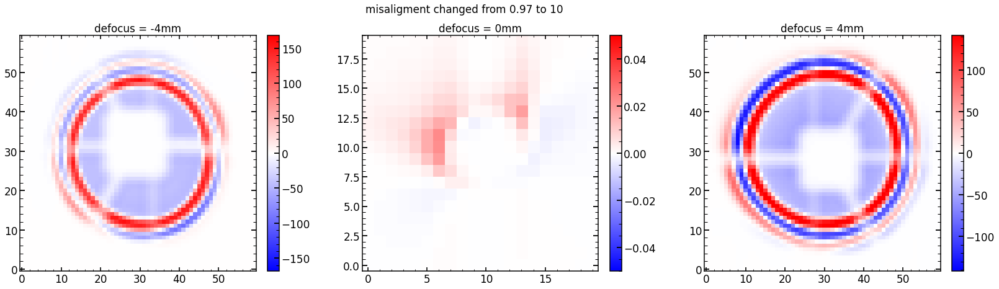

In [163]:
dif0=list_of_single_model_image_different_misaligment[0]-list_of_single_model_image[0]
dif4=(list_of_single_model_image_different_misaligment[4]-list_of_single_model_image[4])/np.abs(list_of_single_model_image[4])
dif8=list_of_single_model_image_different_misaligment[8]-list_of_single_model_image[8]

plt.figure(figsize=(28,7))
plt.subplot(131)
plt.imshow(dif0,cmap='bwr',vmin=-0.01*np.max(list_of_single_model_image[0]),vmax=0.01*np.max(list_of_single_model_image[0]))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('defocus = -4mm')

plt.subplot(132)
plt.imshow(dif4,cmap='bwr',vmin=-0.05,vmax=0.05)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('defocus = 0mm')

plt.subplot(133)
plt.imshow(dif8,cmap='bwr',vmin=-0.01*np.max(list_of_single_model_image[8]),vmax=0.01*np.max(list_of_single_model_image[8]))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('defocus = 4mm')

plt.suptitle('misaligment changed from 0.97 to 10')

In [144]:
np.max(list_of_single_model_image[4])

13829.372

# Switching fibers

In [307]:
np.flip(finalAr['fiber'].values)

array([650, 650, 650, 650, 650, 650, 650, 650, 650, 650, 650, 650, 587,
       587, 587, 587, 587, 587, 587, 587, 587, 587, 587, 587, 525, 525,
       525, 525, 525, 525, 525, 525, 525, 525, 525, 525, 464, 464, 464,
       464, 464, 464, 464, 464, 464, 464, 464, 464, 401, 401, 401, 401,
       401, 401, 401, 401, 401, 401, 401, 401, 339, 339, 339, 339, 339,
       339, 339, 339, 339, 339, 339, 339, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 192, 192, 192, 192, 192, 192, 192,
       192, 192, 192, 192, 192, 63, 63, 63, 63, 63, 63, 63, 63, 63, 63,
       63, 63, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2], dtype=object)

In [268]:
finalAr_flip=finalAr.copy(deep=True)
finalNe_flip=finalNe.copy(deep=True)
finalKr_flip=finalKr.copy(deep=True)

finalAr_flip['fiber']=np.flip(finalAr['fiber'].values)
finalNe_flip['fiber']=np.flip(finalNe['fiber'].values)
finalKr_flip['fiber']=np.flip(finalKr['fiber'].values)

In [ ]:
finalAr_flip

In [270]:
pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

with open(DATAFRAMES_FOLDER + 'finalAr_flip.pkl', 'wb') as f:
    pickle.dump(finalAr_flip,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'finalNe_flip.pkl', 'wb') as f:
    pickle.dump(finalNe_flip,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'finalKr_flip.pkl', 'wb') as f:
    pickle.dump(finalKr_flip,f, protocol=pickle.HIGHEST_PROTOCOL)

In [269]:
finalKr_flip

,fiber,xc,yc,wavelength,close,lamp,xc_effective,second_offset,second_ratio,second2_offset,second2_ratio
0,650,74,1902,785.48,0,Kr,74,8,0.01,0,0
1,650,74,2292,819,0,Kr,74,20,0.004,0,0
2,650,71,2980,877.68,0,Kr,71,-15,0.004,10,0.003
3,650,70,3161,892.87,1,Kr,70,0,0,0,0
4,587,465,1885,785.48,0,Kr,465,8,0.01,0,0
5,587,464,2274,819,0,Kr,464,20,0.004,0,0
6,587,462,2962,877.68,0,Kr,462,-15,0.004,10,0.003
7,587,462,3141,892.87,1,Kr,462,0,0,0,0
8,525,848,1873,785.48,0,Kr,848,8,0.01,0,0
9,525,848,2261,819,0,Kr,848,20,0.004,0,0


# Apr08

In [14]:
import glob

finalAr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalAr_flip.pkl",allow_pickle=True)
finalNe=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalNe_flip.pkl",allow_pickle=True)
finalKr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalKr_flip.pkl",allow_pickle=True)

def remove(string): 
    return string.replace(" ", "")

## scripts 

### first version 

In [13]:

#list_of_HgAr_to_analyze=finalHgAr_Feb2020_dataset[finalHgAr_Feb2020_dataset['close']=='1'].index
list_of_Ar_to_analyze=finalAr[finalAr['close']=='1'].index & finalAr[finalAr['xc']<3000].index
list_of_Ne_to_analyze=finalNe[finalNe['close']=='1'].index & finalNe[finalNe['xc']<3000].index
list_of_Kr_to_analyze=finalKr[finalKr['close']==1].index & finalKr[finalKr['xc']<3000].index

#print(len(list_of_HgAr_to_analyze))
print(len(list_of_Ar_to_analyze))
print(len(list_of_Ne_to_analyze))
print(len(list_of_Kr_to_analyze))

print(list_of_Ar_to_analyze)
print(list_of_Ne_to_analyze)
print(list_of_Kr_to_analyze)



64
32
8
Int64Index([ 1,  3,  5,  6,  7,  8,  9, 11, 13, 15, 17, 18, 19, 20, 21, 23, 25,
            27, 29, 30, 31, 32, 33, 35, 37, 39, 41, 42, 43, 44, 45, 47, 49, 51,
            53, 54, 55, 56, 57, 59, 61, 63, 65, 66, 67, 68, 69, 71, 73, 75, 77,
            78, 79, 80, 81, 83, 85, 87, 89, 90, 91, 92, 93, 95],
           dtype='int64')
Int64Index([ 2,  5,  6,  7, 11, 14, 15, 16, 20, 23, 24, 25, 29, 32, 33, 34, 38,
            41, 42, 43, 47, 50, 51, 52, 56, 59, 60, 61, 65, 68, 69, 70],
           dtype='int64')
Int64Index([3, 7, 11, 15, 19, 23, 27, 31], dtype='int64')


In [14]:
date='Apr1421'


for single_spot in list_of_Ar_to_analyze:
    if str(finalAr.loc[single_spot]['close'])=='0' or str(finalAr.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T_Ar_1_'+str(single_spot)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 19:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, m35, m3, p3, p35, p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -obs 34341 34347 34353 34383 34389 34395 34425 34431 34437 -spot "+str(single_spot)+\
               " -nsteps 51 -eps 6 -dataset 6 -arc Ar -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalAr.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Jan0821 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type defocus \n")
    file.close()    
  



file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/'+date+'ScriptToSubmitScriptsTiger_Ar_1_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in list_of_Ar_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/T_Ar_1_'+str(single_spot)+date+'.sh \n')

file.close()

In [15]:
for single_spot in list_of_Ne_to_analyze:
    if str(finalNe.loc[single_spot]['close'])=='0' or str(finalNe.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T_Ne_1_'+str(single_spot)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 19:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, m35, m3, m05, 0, p05, p3, p35, p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -obs 34217 34223 34229 34259 34265 34271 34301 34307 34313 -spot "+str(single_spot)+\
               " -nsteps 51 -eps 6 -dataset 6 -arc Ne -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalNe.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Jan0821 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type defocus \n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/'+date+'ScriptToSubmitScriptsTiger_Ne_1_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in list_of_Ne_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/T_Ne_1_'+str(single_spot)+date+'.sh \n')

file.close()

In [16]:
for single_spot in list_of_Kr_to_analyze:
    if str(finalKr.loc[single_spot]['close'])=='0' or str(finalKr.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T_Kr_1_'+str(single_spot)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 19:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, m35, m3, p3, p35, p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -obs 34561 34567 34573 34603 34609 34615 34645 34651 34657 -spot "+str(single_spot)+\
               " -nsteps 51 -eps 6 -dataset 6 -arc Kr -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalKr.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Jan0821 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type defocus \n")
    file.close()    
  



file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/'+date+'ScriptToSubmitScriptsTiger_Kr_1_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in list_of_Kr_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/T_Kr_1_'+str(single_spot)+date+'.sh \n')

file.close()

### second version 

In [ ]:
# sending to della

In [248]:

#list_of_HgAr_to_analyze=finalHgAr_Feb2020_dataset[finalHgAr_Feb2020_dataset['close']=='1'].index
list_of_Ar_to_analyze=finalAr[finalAr['close']=='1'].index & finalAr[finalAr['xc']>3000].index
list_of_Ne_to_analyze=finalNe[finalNe['close']=='1'].index & finalNe[finalNe['xc']>3000].index
list_of_Kr_to_analyze=finalKr[finalKr['close']==1].index & finalKr[finalKr['xc']>3000].index

#print(len(list_of_HgAr_to_analyze))
print(len(list_of_Ar_to_analyze))
print(len(list_of_Ne_to_analyze))
print(len(list_of_Kr_to_analyze))

print(list_of_Ar_to_analyze)
print(list_of_Ne_to_analyze)
print(list_of_Kr_to_analyze)


16
8
2
Int64Index([97, 99, 101, 102, 103, 104, 105, 107, 109, 111, 113, 114, 115, 116,
            117, 119],
           dtype='int64')
Int64Index([74, 77, 78, 79, 83, 86, 87, 88], dtype='int64')
Int64Index([35, 39], dtype='int64')


In [252]:
date='Apr1421'


for single_spot in list_of_Ar_to_analyze:
    if str(finalAr.loc[single_spot]['close'])=='0' or str(finalAr.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/DAr2_'+str(single_spot)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --ntasks-per-node=28 \n") 
    file.write("#SBATCH --time 23:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, m35, m3, p3, p35, p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -obs 34341 34347 34353 34383 34389 34395 34425 34431 34437 -spot "+str(single_spot)+\
               " -nsteps 41 -eps 6 -dataset 6 -arc Ar -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalAr.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Jan0821 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type defocus \n")
    file.close()    
  



file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/'+date+'ScriptToSubmitScriptsDellaAr2_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in list_of_Ar_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/DAr2_'+str(single_spot)+date+'.sh \n')

file.close()

In [253]:
for single_spot in list_of_Ne_to_analyze:
    if str(finalNe.loc[single_spot]['close'])=='0' or str(finalNe.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/DNe2_'+str(single_spot)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --ntasks-per-node=28 \n") 
    file.write("#SBATCH --time 23:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, m35, m3, m05, 0, p05, p3, p35, p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -obs 34217 34223 34229 34259 34265 34271 34301 34307 34313 -spot "+str(single_spot)+\
               " -nsteps 41 -eps 6 -dataset 6 -arc Ne -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalNe.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Jan0821 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type defocus \n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/'+date+'ScriptToSubmitScriptsDellaNe2_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in list_of_Ne_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/DNe2_'+str(single_spot)+date+'.sh \n')

file.close()

In [254]:
for single_spot in list_of_Kr_to_analyze:
    if str(finalKr.loc[single_spot]['close'])=='0' or str(finalKr.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/DKr2_'+str(single_spot)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --ntasks-per-node=28 \n") 
    file.write("#SBATCH --time 23:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, m35, m3, p3, p35, p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -obs 34561 34567 34573 34603 34609 34615 34645 34651 34657 -spot "+str(single_spot)+\
               " -nsteps 41 -eps 6 -dataset 6 -arc Kr -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalKr.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Jan0821 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type defocus \n")
    file.close()    
  



file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/'+date+'ScriptToSubmitScriptsDellaKr2_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in list_of_Kr_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/DKr2_'+str(single_spot)+date+'.sh \n')

file.close()

### third script 

In [ ]:
# send to della, with second image

In [10]:

#list_of_HgAr_to_analyze=finalHgAr_Feb2020_dataset[finalHgAr_Feb2020_dataset['close']=='1'].index
list_of_Ar_to_analyze=finalAr[finalAr['close']!='1'].index & finalAr[finalAr['xc']>3000].index
list_of_Ne_to_analyze=finalNe[finalNe['close']!='1'].index & finalNe[finalNe['xc']>3000].index
list_of_Kr_to_analyze=finalKr[finalKr['close']!=1].index & finalKr[finalKr['xc']>3000].index

#print(len(list_of_HgAr_to_analyze))
print(len(list_of_Ar_to_analyze))
print(len(list_of_Ne_to_analyze))
print(len(list_of_Kr_to_analyze))

print(list_of_Ar_to_analyze)
print(list_of_Ne_to_analyze)
print(list_of_Kr_to_analyze)


8
10
6
Int64Index([96, 98, 100, 106, 108, 110, 112, 118], dtype='int64')
Int64Index([72, 73, 75, 76, 80, 81, 82, 84, 85, 89], dtype='int64')
Int64Index([32, 33, 34, 36, 37, 38], dtype='int64')


In [11]:
date='Apr1421'


for single_spot in list_of_Ar_to_analyze:
    if str(finalAr.loc[single_spot]['close'])=='0' or str(finalAr.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/DAr3_'+str(single_spot)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --ntasks-per-node=28 \n") 
    file.write("#SBATCH --time 23:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, m35, m3, p3, p35, p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -obs 34341 34347 34353 34383 34389 34395 34425 34431 34437 -spot "+str(single_spot)+\
               " -nsteps 41 -eps 6 -dataset 6 -arc Ar -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalAr.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Jan0821 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type defocus \n")
    file.close()    
  



file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/'+date+'ScriptToSubmitScriptsDellaAr3_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in list_of_Ar_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/DAr3_'+str(single_spot)+date+'.sh \n')

file.close()

In [12]:
for single_spot in list_of_Ne_to_analyze:
    if str(finalNe.loc[single_spot]['close'])=='0' or str(finalNe.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/DNe3_'+str(single_spot)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --ntasks-per-node=28 \n") 
    file.write("#SBATCH --time 23:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, m35, m3, m05, 0, p05, p3, p35, p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -obs 34217 34223 34229 34259 34265 34271 34301 34307 34313 -spot "+str(single_spot)+\
               " -nsteps 41 -eps 6 -dataset 6 -arc Ne -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalNe.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Jan0821 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type defocus \n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/'+date+'ScriptToSubmitScriptsDellaNe3_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in list_of_Ne_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/DNe3_'+str(single_spot)+date+'.sh \n')

file.close()

In [13]:
for single_spot in list_of_Kr_to_analyze:
    if str(finalKr.loc[single_spot]['close'])=='0' or str(finalKr.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/DKr3_'+str(single_spot)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --ntasks-per-node=28 \n") 
    file.write("#SBATCH --time 23:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, m35, m3, p3, p35, p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -obs 34561 34567 34573 34603 34609 34615 34645 34651 34657 -spot "+str(single_spot)+\
               " -nsteps 41 -eps 6 -dataset 6 -arc Kr -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalKr.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Jan0821 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type defocus \n")
    file.close()    
  



file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/'+date+'ScriptToSubmitScriptsDellaKr3_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in list_of_Kr_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/DKr3_'+str(single_spot)+date+'.sh \n')

file.close()

## 4th script

In [18]:

#list_of_HgAr_to_analyze=finalHgAr_Feb2020_dataset[finalHgAr_Feb2020_dataset['close']=='1'].index
list_of_Ar_to_analyze=finalAr[finalAr['close']=='1'].index & finalAr[finalAr['xc']<3000].index
list_of_Ne_to_analyze=finalNe[finalNe['close']=='1'].index & finalNe[finalNe['xc']<3000].index
list_of_Kr_to_analyze=finalKr[finalKr['close']==1].index & finalKr[finalKr['xc']<3000].index

#print(len(list_of_HgAr_to_analyze))
print(len(list_of_Ar_to_analyze))
print(len(list_of_Ne_to_analyze))
print(len(list_of_Kr_to_analyze))

print(list_of_Ar_to_analyze)
print(list_of_Ne_to_analyze)
print(list_of_Kr_to_analyze)

NameError: name 'finalAr' is not defined

In [184]:
for single_spot in list_of_Ne_to_analyze:
    if str(finalNe.loc[single_spot]['close'])=='0' or str(finalNe.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/DNe4_'+str(single_spot)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --ntasks-per-node=28 \n") 
    file.write("#SBATCH --time 23:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, m35, m3, m05, 0, p05, p3, p35, p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -obs 34217 34223 34229 34259 34265 34271 34301 34307 34313 -spot "+str(single_spot)+\
               " -nsteps 41 -eps 6 -dataset 6 -arc Ne -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalNe.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Jan0821 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type defocus \n")
    file.close()    
    
file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/'+date+'ScriptToSubmitScriptsDellaNe4_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in list_of_Ne_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/DNe4_'+str(single_spot)+date+'.sh \n')

file.close()

In [185]:
for single_spot in list_of_Kr_to_analyze:
    if str(finalKr.loc[single_spot]['close'])=='0' or str(finalKr.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/DKr4_'+str(single_spot)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --ntasks-per-node=28 \n") 
    file.write("#SBATCH --time 23:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, m35, m3, p3, p35, p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -obs 34561 34567 34573 34603 34609 34615 34645 34651 34657 -spot "+str(single_spot)+\
               " -nsteps 41 -eps 6 -dataset 6 -arc Kr -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalKr.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Jan0821 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type defocus \n")
    file.close()    
  



file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/'+date+'ScriptToSubmitScriptsDellaKr4_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in list_of_Kr_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/DKr4_'+str(single_spot)+date+'.sh \n')

file.close()

## which are avaliable 

In [15]:
date='Apr1421'

ResultsFromTiger_FOLDER='/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/'


Emcee3_HgAr=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*HgArSwarm1.npy', recursive=True)

Emcee3_Ar=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*ArSwarm1.npy', recursive=True)
Emcee3_Ne=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*NeSwarm1.npy', recursive=True)
Emcee3_Kr=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*KrSwarm1.npy', recursive=True)


In [6]:
Emcee3_Ne

NameError: name 'Emcee3_Ne' is not defined

In [16]:
analyzed_Neon_images=[]
for i in range(len(Emcee3_Ne)):
    single_string=Emcee3_Ne[i][len(ResultsFromTiger_FOLDER)+30:len(Emcee3_Ne[i])-13]
    # only select images with a given eps
    if Emcee3_Ne[i][Emcee3_Ne[i].find('Ne')-1:Emcee3_Ne[i].find('Ne')]=='6':
        analyzed_Neon_images.append([int(single_string[:5]),int(single_string[5:]),'Ne'])
   
analyzed_Neon_images=np.array(analyzed_Neon_images)
###########
analyzed_Ar_images=[]
for i in range(len(Emcee3_Ar)):
    single_string=Emcee3_Ar[i][len(ResultsFromTiger_FOLDER)+30:len(Emcee3_Ar[i])-13]
    # only select images with a given eps
    if Emcee3_Ar[i][Emcee3_Ar[i].find('Ar')-1:Emcee3_Ar[i].find('Ar')]=='6':
        analyzed_Ar_images.append([int(single_string[:5]),int(single_string[5:]),'Ar'])
 

analyzed_Ar_images=np.array(analyzed_Ar_images)
###########
analyzed_Kr_images=[]
for i in range(len(Emcee3_Kr)):
    single_string=Emcee3_Kr[i][len(ResultsFromTiger_FOLDER)+30:len(Emcee3_Kr[i])-13]
    # only select images with a given eps
    if Emcee3_Kr[i][Emcee3_Kr[i].find('Kr')-1:Emcee3_Kr[i].find('Kr')]=='6':
        analyzed_Kr_images.append([int(single_string[:5]),int(single_string[5:]),'Kr'])
    
analyzed_Kr_images=np.array(analyzed_Kr_images)

In [17]:
Emcee3_Ar[i][Emcee3_Ar[i].find('Ar')-1:Emcee3_Ar[i].find('Ar')]

'6'

In [18]:
print(analyzed_Ar_images)
print(analyzed_Neon_images)
print(analyzed_Kr_images)

[['34437' '100' 'Ar']
 ['34437' '101' 'Ar']
 ['34437' '102' 'Ar']
 ['34437' '103' 'Ar']
 ['34437' '104' 'Ar']
 ['34437' '105' 'Ar']
 ['34437' '106' 'Ar']
 ['34437' '107' 'Ar']
 ['34437' '109' 'Ar']
 ['34437' '110' 'Ar']
 ['34437' '111' 'Ar']
 ['34437' '112' 'Ar']
 ['34437' '113' 'Ar']
 ['34437' '114' 'Ar']
 ['34437' '115' 'Ar']
 ['34437' '116' 'Ar']
 ['34437' '11' 'Ar']
 ['34437' '117' 'Ar']
 ['34437' '118' 'Ar']
 ['34437' '119' 'Ar']
 ['34437' '13' 'Ar']
 ['34437' '15' 'Ar']
 ['34437' '1' 'Ar']
 ['34437' '17' 'Ar']
 ['34437' '18' 'Ar']
 ['34437' '19' 'Ar']
 ['34437' '20' 'Ar']
 ['34437' '21' 'Ar']
 ['34437' '23' 'Ar']
 ['34437' '25' 'Ar']
 ['34437' '27' 'Ar']
 ['34437' '29' 'Ar']
 ['34437' '30' 'Ar']
 ['34437' '32' 'Ar']
 ['34437' '33' 'Ar']
 ['34437' '3' 'Ar']
 ['34437' '37' 'Ar']
 ['34437' '39' 'Ar']
 ['34437' '41' 'Ar']
 ['34437' '42' 'Ar']
 ['34437' '43' 'Ar']
 ['34437' '44' 'Ar']
 ['34437' '47' 'Ar']
 ['34437' '49' 'Ar']
 ['34437' '51' 'Ar']
 ['34437' '53' 'Ar']
 ['34437' '54' 'A

In [19]:
if len(analyzed_Ar_images)>0:
    arranged_by_defocus_Ar=analyzed_Ar_images[analyzed_Ar_images[:,0].argsort()]
    arranged_by_spot_number_Ar=analyzed_Ar_images[analyzed_Ar_images[:,1].argsort()]
else:
    arranged_by_defocus_Ar=[]
    arranged_by_spot_number_Ar=[]

if len(analyzed_Neon_images)>0:
    arranged_by_defocus_Ne=analyzed_Neon_images[analyzed_Neon_images[:,0].argsort()]
    arranged_by_spot_number_Ne=analyzed_Neon_images[analyzed_Neon_images[:,1].argsort()]
else:
    arranged_by_defocus_Ne=[]
    arranged_by_spot_number_Ne=[]

if len(analyzed_Kr_images)>0:
    arranged_by_defocus_Kr=analyzed_Kr_images[analyzed_Kr_images[:,0].argsort()]
    arranged_by_spot_number_Kr=analyzed_Kr_images[analyzed_Kr_images[:,1].argsort()]
else:
    arranged_by_defocus_Kr=[]
    arranged_by_spot_number_Kr=[]
    
print('analyzed_Ar_images:'+str(len(analyzed_Ar_images))+' / '+'analyzed_Ne_images:'+str(len(analyzed_Neon_images))+' / '+'analyzed_Kr_images:'+str(len(analyzed_Kr_images)))

analyzed_Ar_images:83 / analyzed_Ne_images:16 / analyzed_Kr_images:8


In [20]:
finalAr[finalAr['fiber']==650]

,fiber,xc,yc,wavelength,close,lamp,xc_effective,second_offset,second_ratio,second2_offset,second2_ratio
0,650,69,808,690.9346,0,HgAr,69,-19.25,0.0034,-40.7,0.006
1,650,69,875,696.7261,1,Ar,69,0,0,0,0
2,650,70,992,706.8989,0,Ar,70,-39.597,0.0143,0,0
3,650,71,1229,727.47876,1,Ar,71,0,0,0,0
4,650,72,1358,738.6248,0,Ar,72,-13.14,0.011,0,0
5,650,73,1647,763.74286,1,Ar,73,0,0,0,0
6,650,73,2009,795.0522,1,Ar,73,0,0,0,0
7,650,72,2377,826.6699,1,Ar,72,0,0,0,0
8,650,72,2679,852.4029,1,Ar,72,0,0,0,0
9,650,66,3395,912.5693,1,Ar,66,0,0,0,0


## single image analysis 

In [20]:
date='Apr1421'
#obs=34313
#obs_int=int(obs)
single_number='11'
image_index=int(single_number)
eps=6
arc='Ar'
dataset=6

if arc=='Ar':
    obs=34341+96
    finalArc=finalAr
if arc=='Ne':
    obs=34217+96 
    finalArc=finalNe
if arc=='Kr':
    obs=34561+96
    finalArc=finalKr



list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

finalArc.loc[int(single_number)]

fiber                  650
xc                      59
yc                    4044
wavelength        966.0642
close                    1
lamp                    Ar
xc_effective            59
second_offset            0
second_ratio             0
second2_offset           0
second2_ratio            0
Name: 11, dtype: object

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m05
self.single_number: 11
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34383
double_sources_positions_ratios for this spot is: [0 0]


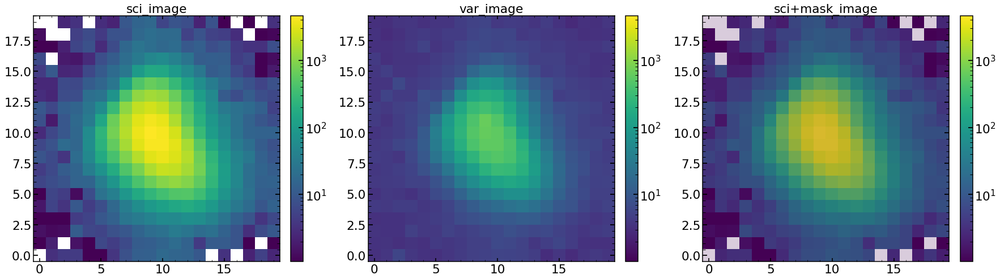

In [21]:
single_analysis=Zernike_Analysis(date=date,obs='m05',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)
single_analysis.create_basic_data_image()

In [22]:
double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
columns,columns22,columns22_analysis=single_analysis.return_columns()


chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
#chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
len_of_chains=single_analysis.len_of_chains()

minchain_parametrization,like_min=single_analysis.create_likelihood()

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437116ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437116ArSwarm1.npy
(51, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437116ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 5.060299555460612
average chi2 reduced is: -4.756823660089094


### chain analysis 

In [23]:
minchain_parametrization

array([   -8.02104088,     0.14150858,     0.49402878,    -0.86621665,
           0.22408148,    -0.49221216,    -0.00282077,    -0.35057435,
          -0.0784537 ,     0.46232263,     0.02312979,    -0.44464628,
          -0.01801556,    -0.58068307,    -0.07477986,     0.58426673,
          -0.00673073,     0.03234551,    -0.00649447,     0.22478388,
           0.02566567,    -0.05146237,     0.00271898,     0.031311  ,
           0.00804809,     0.05681622,    -0.01641635,     0.04934641,
           0.00186372,     0.03078492,    -0.00241525,    -0.03585405,
           0.00370046,    -0.03068573,     0.01103134,     0.02525885,
          -0.02298525,     0.04606385,     0.70449815,     0.10236876,
          -0.21129985,     0.2737523 ,     0.06149946,     0.10636336,
           0.12133806,     0.29022445,     0.26464617,     1.17306662,
          -0.03459426,    -0.01154226,     0.87826898,     0.02797102,
           0.75836072,     1.04555796,     0.57710921, 36531.72636471,
      

In [24]:
gbest_filename='/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/'+date+'/chain'+date+'_Single_P_'+str(obs)+str(single_number)+str(eps)+arc+'res_gbests_position.npy'
gbests_positions=np.load(gbest_filename)
print(gbest_filename)
print(gbests_positions.shape)
gbests_positions[-1]

/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437116Arres_gbests_position.npy
(51, 129)


array([   -8.01790692,     0.13435173,     0.49295461,    -0.86447127,
           0.22472511,    -0.49658517,    -0.00279995,    -0.35130692,
          -0.07810085,     0.44825527,     0.02345231,    -0.44685328,
          -0.01604908,    -0.57957688,    -0.07447405,     0.58190037,
          -0.00655899,     0.0314017 ,    -0.00606049,     0.22211951,
           0.02548186,    -0.05286202,     0.00268276,     0.03143758,
           0.00846631,     0.05620911,    -0.01632415,     0.0477425 ,
           0.00061178,     0.03014673,    -0.00222245,    -0.03609306,
           0.00382482,    -0.0308889 ,     0.01109018,     0.02338584,
          -0.02273927,     0.04366473,     0.70452236,     0.10233761,
          -0.21127854,     0.27350672,     0.06151891,     0.10630146,
           0.12128597,     0.29063396,     0.26459513,     1.17310251,
          -0.03462824,    -0.01156882,     0.87850046,     0.02796038,
           0.75842517,     1.04565483,     0.57682747, 36561.81231651,
      

Text(0, 0.5, 'par_1')

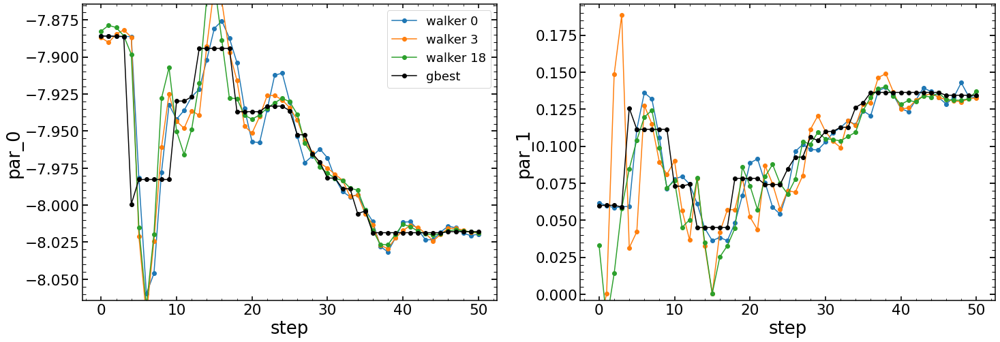

In [25]:
# wavefront paramter
plt.figure(figsize=(24,8))
i=0*2
plt.subplot(121)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('par_'+str((i)))
mean_one_walker=np.mean(chain0_swarm_1[:,18][:,i])
plt.ylim(mean_one_walker-0.1,mean_one_walker+0.1)
plt.legend()

plt.subplot(122)
#  paramter 2 (z5)

mean_one_what=np.mean(chain0_swarm_1[:,:,i+1][:,2])
plt.plot(chain0_swarm_1[:,:,i+1][:,0],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,3],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,18],marker='o')
plt.plot(gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.ylim(mean_one_what-0.1,mean_one_what+0.1)
plt.xlabel('step')
plt.ylabel('par_'+str((i+1)))

Text(0.5, 1.0, 'par_46 / wide_43')

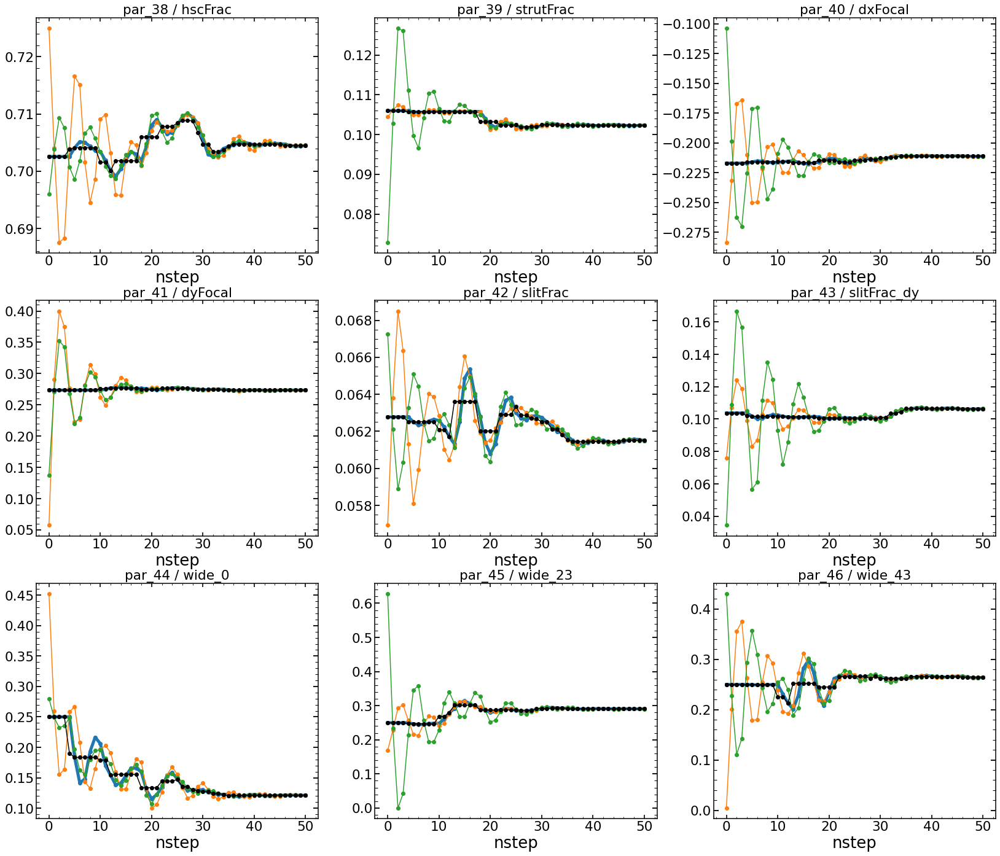

In [26]:
# pupil paramters
plt.figure(figsize=(28,24))
i=19*2
plt.subplot(331)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i))+' / '+columns22[19])

plt.subplot(332)
plt.plot(chain0_swarm_1[:,:,i+1][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+1))+' / '+columns22[20])

plt.subplot(333)
plt.plot(chain0_swarm_1[:,:,i+2][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+2][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+2][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+2],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+2))+' / '+columns22[21])



plt.subplot(334)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+3],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+3],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+3],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+3))+' / '+columns22[19+3])

plt.subplot(335)
plt.plot(chain0_swarm_1[:,:,i+4][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+4][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+4][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+4],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+4))+' / '+columns22[19+4])

plt.subplot(336)
plt.plot(chain0_swarm_1[:,:,i+5][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+5][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+5][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+5],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+5))+' / '+columns22[19+5])


plt.subplot(337)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+6],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+6],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+6],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+6],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+6))+' / '+columns22[19+6])

plt.subplot(338)
plt.plot(chain0_swarm_1[:,:,i+7][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+7][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+7][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+7],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+7))+' / '+columns22[19+7])

plt.subplot(339)
plt.plot(chain0_swarm_1[:,:,i+8][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+8][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+8][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+8],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+8))+' / '+columns22[19+8])

Text(0.5, 1.0, 'par_58 / pixel_effect')

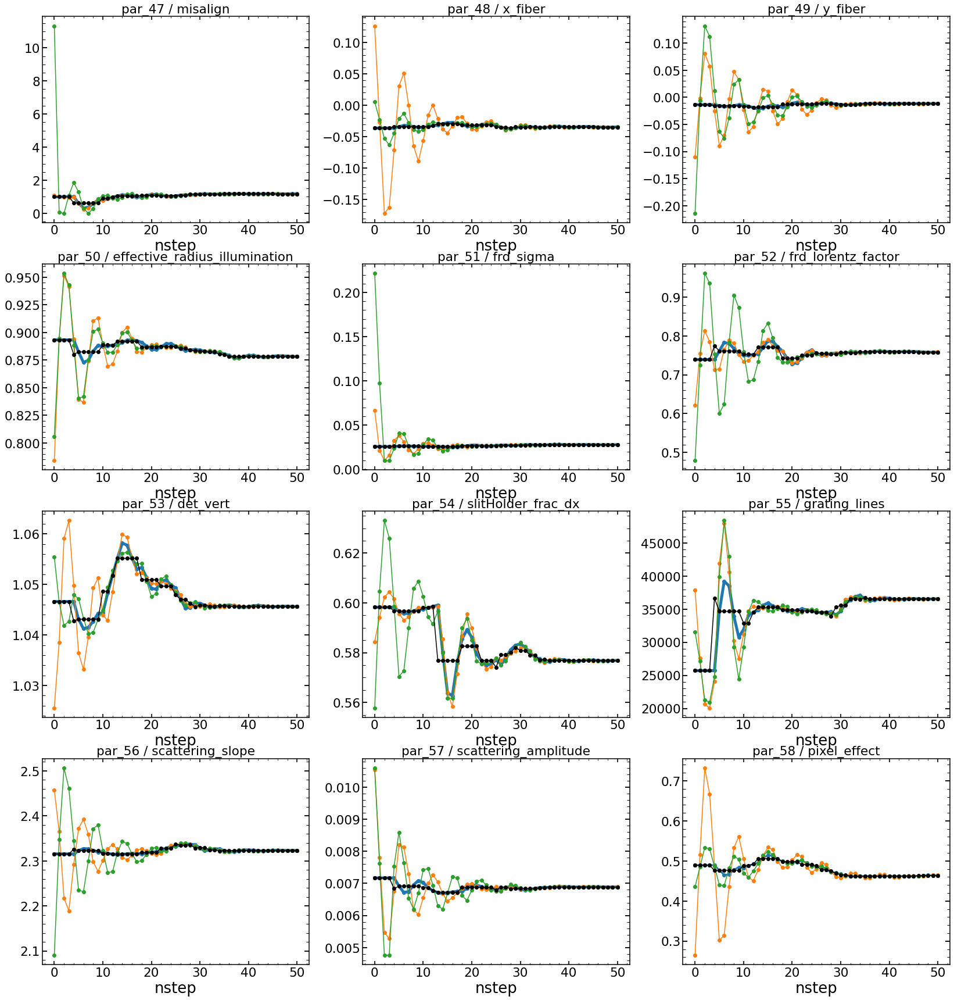

In [27]:
# pupil paramters
plt.figure(figsize=(28,30))
i=19*2
plt.subplot(431)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+9],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+9],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+9],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+9],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+9))+' / '+columns22[19+9])

plt.subplot(432)
plt.plot(chain0_swarm_1[:,:,i+10][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+10][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+10][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+10],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+10))+' / '+columns22[19+10])

plt.subplot(433)
plt.plot(chain0_swarm_1[:,:,i+11][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+11][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+11][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+11],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+11))+' / '+columns22[19+11])



plt.subplot(434)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+12],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+12],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+12],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+12],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+12))+' / '+columns22[19+12])

plt.subplot(435)
plt.plot(chain0_swarm_1[:,:,i+13][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+13][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+13][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+13],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+13))+' / '+columns22[19+13])

plt.subplot(436)
plt.plot(chain0_swarm_1[:,:,i+14][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+14][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+14][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+14],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+14))+' / '+columns22[19+14])


plt.subplot(437)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+15],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+15],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+15],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+15],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+15))+' / '+columns22[19+15])

plt.subplot(438)
plt.plot(chain0_swarm_1[:,:,i+16][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+16][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+16][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+16],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+16))+' / '+columns22[19+16])

plt.subplot(439)
plt.plot(chain0_swarm_1[:,:,i+17][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+17][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+17][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+17],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+17))+' / '+columns22[19+17])


plt.subplot(4,3,10)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+18],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+18],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+18],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+18))+' / '+columns22[19+18])

plt.subplot(4,3,11)
plt.plot(chain0_swarm_1[:,:,i+19][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+19][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+19][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+19],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+19))+' / '+columns22[19+19])

plt.subplot(4,3,12)
plt.plot(chain0_swarm_1[:,:,i+20][:,0],lw=3,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+20][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+20][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+20],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+20))+' / '+columns22[19+20])

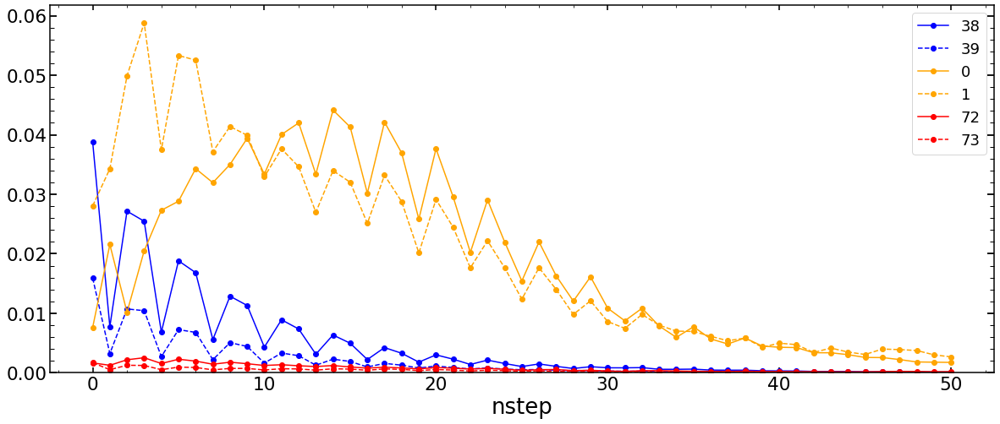

In [28]:
list_of_std_1=[]
i1=19*2+0
for j in range(len(chain0_swarm_1)):
    list_of_std_1.append(np.std(chain0_swarm_1[:,:,i1][j]))
    
list_of_std_6=[]
i6=19*2+1
for j in range(len(chain0_swarm_1)):
    list_of_std_6.append(np.std(chain0_swarm_1[:,:,i6][j]))
    
    
list_of_std_2=[]
i2=0
for j in range(len(chain0_swarm_1)):
    list_of_std_2.append(np.std(chain0_swarm_1[:,:,i2][j]))
    
list_of_std_3=[]
i3=1
for j in range(len(chain0_swarm_1)):
    list_of_std_3.append(np.std(chain0_swarm_1[:,:,i3][j]))
    
    
    
list_of_std_4=[]
i4=72
for j in range(len(chain0_swarm_1)):
    list_of_std_4.append(np.std(chain0_swarm_1[:,:,i4][j]))
    
list_of_std_5=[]
i5=73
for j in range(len(chain0_swarm_1)):
    list_of_std_5.append(np.std(chain0_swarm_1[:,:,i5][j]))


plt.figure(figsize=(20,8))
plt.plot(list_of_std_1,marker='o',label=str(i1),color='blue')
plt.plot(list_of_std_6,marker='o',label=str(i6),ls='--',color='blue')
plt.plot(list_of_std_2,marker='o',label=str(i2),color='orange')
plt.plot(list_of_std_3,marker='o',label=str(i3),ls='--',color='orange')


plt.plot(list_of_std_4,marker='o',label=str(i4),color='red')
plt.plot(list_of_std_5,marker='o',label=str(i5),ls='--',color='red')

plt.ylim(0)
plt.xlabel('nstep')


plt.legend()

In [29]:
j=0
step0_test_1=chain0_swarm_1[:,:,i1][j]
step0_test_6=chain0_swarm_1[:,:,i6][j]
j=1
step1_test_1=chain0_swarm_1[:,:,i1][j]
step1_test_6=chain0_swarm_1[:,:,i6][j]
j=2
step2_test_1=chain0_swarm_1[:,:,i1][j]
step2_test_6=chain0_swarm_1[:,:,i6][j]
j=3
step3_test_1=chain0_swarm_1[:,:,i1][j]
step3_test_6=chain0_swarm_1[:,:,i6][j]

In [30]:
step10_dif_1=step1_test_1-step0_test_1
step10_dif_6=step1_test_6-step0_test_6

step21_dif_1=step2_test_1-step1_test_1
step21_dif_6=step2_test_6-step1_test_6

step32_dif_1=step3_test_1-step2_test_1
step32_dif_6=step3_test_6-step2_test_6

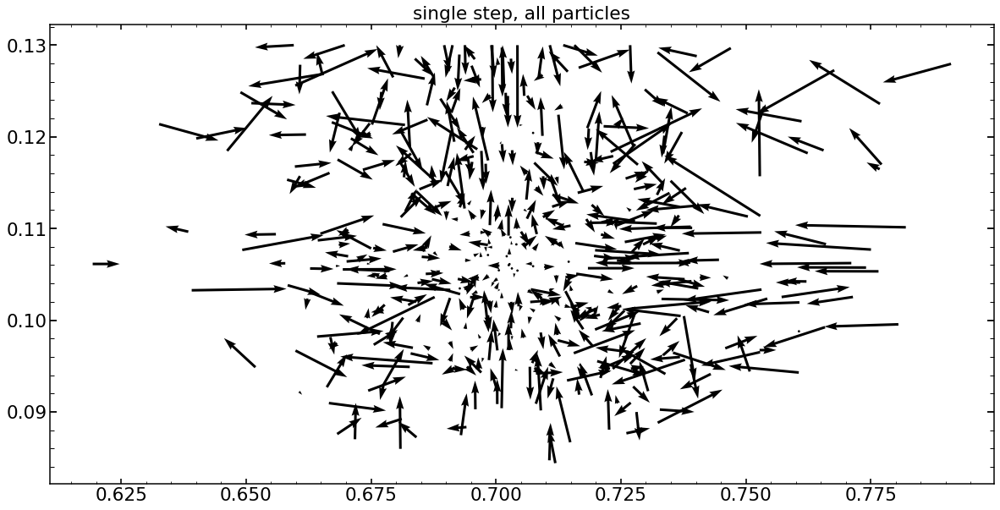

In [31]:
#X=step0_test_1
#Y=step0_test_6
#U=step10_dif_1
#V=step10_dif_6

#X=step1_test_1
#Y=step1_test_6
#U=step21_dif_1
#V=step21_dif_6

X=step2_test_1
Y=step2_test_6
U=step32_dif_1
V=step32_dif_6

plt.figure(figsize=(20,10))
plt.title('single step, all particles')
Q = plt.quiver(X, Y, U, V, units='width', angles='xy', scale_units='xy', scale=1)

In [32]:
# single particle, all steps

In [33]:
j=0
n_particle=123
list_of_single_particle_par_movements=[]
list_of_gbest_particle_movements=[]
for j in range(len(chain0_swarm_1)):
    step0_test_1=chain0_swarm_1[:,:,i1][:,n_particle][j]
    step0_test_6=chain0_swarm_1[:,:,i6][:,n_particle][j]
    
    
    list_of_single_particle_par_movements.append([step0_test_1,step0_test_6])
    list_of_gbest_particle_movements.append([gbests_positions[:,i1][j],gbests_positions[:,i6][j]])
    
array_of_single_particle_par_movements=np.array(list_of_single_particle_par_movements)   
array_of_gbest_particle_movements=np.array(list_of_gbest_particle_movements)
    
step32_dif_1=np.ediff1d(array_of_single_particle_par_movements[:,0])
step32_dif_6=np.ediff1d(array_of_single_particle_par_movements[:,1])

step32_dif_1_best=np.ediff1d(array_of_gbest_particle_movements[:,0])
step32_dif_6_best=np.ediff1d(array_of_gbest_particle_movements[:,1])

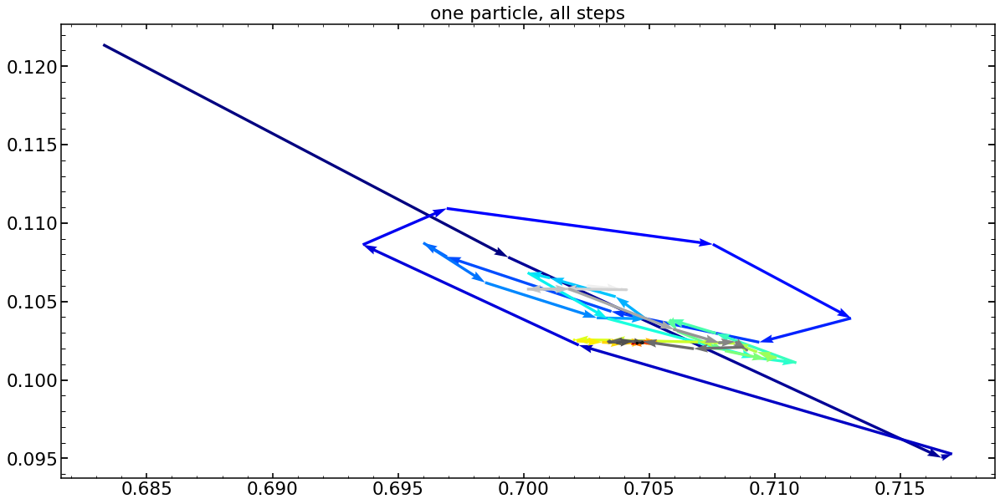

In [34]:
X=array_of_single_particle_par_movements[:,0][0:50]
Y=array_of_single_particle_par_movements[:,1][0:50]
U=step32_dif_1[0:50]
V=step32_dif_6[0:50]

X_best=array_of_gbest_particle_movements[:,0][0:50]
Y_best=array_of_gbest_particle_movements[:,1][0:50]
U_best=step32_dif_1_best[0:50]
V_best=step32_dif_6_best[0:50]

cmap = matplotlib.cm.get_cmap('jet')
list_of_colors=[]
for i in range(50):
    list_of_colors.append(cmap(i/50))

cmap = matplotlib.cm.get_cmap('binary')
list_of_colors_best=[]
for i in range(50):
    list_of_colors_best.append(cmap(i/50))

plt.figure(figsize=(20,10))
plt.title('one particle, all steps')

Q = plt.quiver(X, Y, U, V, angles='xy', scale_units='xy', scale=1,width=0.003,color=list_of_colors)
#Q = plt.quiver(X_best, Y_best, U_best, V_best, angles='xy', scale_units='xy', scale=1,width=0.003,color=list_of_colors,ls=':')
Q = plt.quiver(X_best, Y_best, U_best, V_best, angles='xy', scale_units='xy', scale=1,width=0.003,color=list_of_colors_best,ls='--')

In [92]:
plt.get_cmap('bwr')[0.2]

TypeError: 'LinearSegmentedColormap' object is not subscriptable

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437116ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 5.060299555460612
average chi2 reduced is: -4.756823660089094
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437116ArSwarm1.npy
(51, 480, 129)


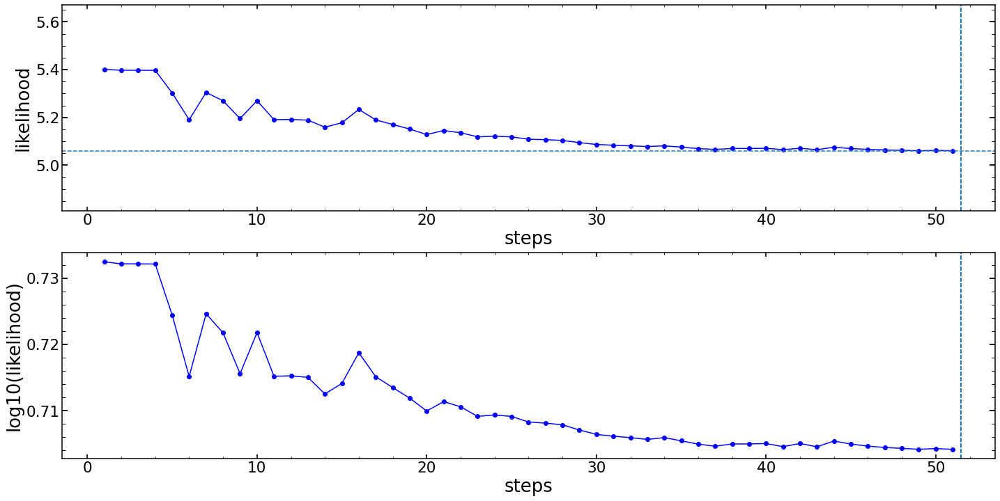

In [35]:
single_analysis.create_fitting_evolution_plot()

(array([  2.,   3.,   7.,   7.,  22.,  95., 137., 153.,  45.,   9.]),
 array([0.70224192, 0.7028483 , 0.70345467, 0.70406104, 0.70466741,
        0.70527378, 0.70588015, 0.70648652, 0.70709289, 0.70769926,
        0.70830563]),
 <a list of 10 Patch objects>)

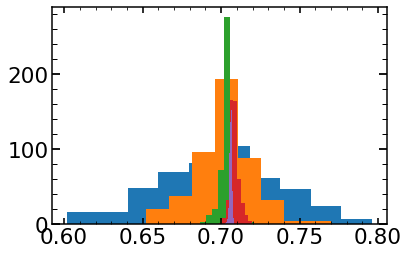

In [36]:
i=19*2+0
j=0
plt.hist(chain0_swarm_1[:,:,i][j])
j=5
plt.hist(chain0_swarm_1[:,:,i][j])
j=10
plt.hist(chain0_swarm_1[:,:,i][j])
j=20
plt.hist(chain0_swarm_1[:,:,i][j])
j=30
plt.hist(chain0_swarm_1[:,:,i][j])

### image analysis 

In [37]:
model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,dithering=1,save=1,zmax=56,verbosity=1,\
                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,test_run=False)   


#minchain_parametrization_test=np.copy(minchain_parametrization_test)
#minchain_parametrization_test[0]=minchain_parametrization_test[0]+array_of_delta_z_parametrizations_None_1_0[0]

list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
#list_of_minchain=model_multi.create_list_of_allparameters(gbests_positions[-1],list_of_defocuses=list_of_defocuses_input_long,zmax=56)



res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)


mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

#model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],dithering=1,save=1,zmax=22,verbosity=1,\
#                      double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)  

#res_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True)

################################
analyzing image 1 out of 9
 
Science image shape is: (60, 60)
Top left pixel value of the science image is: 11.366353
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 6.2264752
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.45c
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [   32.22567211    -2.84233175    -1.38853808    -0.33929127
     0.77613744    -0.53716545    -0.50862084     0.88338617
     0.05926845     0.25076177    -0.15412505     0.02043507
     0.02462387     0.11501181     0.02333005    -0.02619306
    -0.04548757    -0.01886651     0.13800486     0.70449815
     0.10236876    -0.21129985     0.2737523      0.06149946
     0.10636336     0.

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-19.29257456   9.10734118] / 1589.832
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.73007456  -7.76765882] / 323.4895
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.73007456 10.23234118] / 1512.8881
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -5.23007456 -16.76765882] / 354.2438
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-14.23007456   1.23234118] / 516.4835
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.29257456  -8.89265882] / 47.32375
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.29257458  -8.89265882] / 47.32375
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.29257456  -8.89265883] / 47.32375
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.29257456  -8.89265882] / 47.32375
chi2 within shgo optimization routine (chi_2_al

We are fitting for only one source
One source fitting result is [-10.09672476  -9.26174538]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.6470751762390137
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9993663759344933
Finished with lnlike_Neven
chi_almost/d.o.f is 5.885942; chi_almost_max_dof is 83.02857 log(improvment) is -1.1494116
The likelihood reported is: -5.885941982269287
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4559406528
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4559406528 is: 

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.52701066 -2.05228304] / 43.126186
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.24322759 -2.05228304] / 42.11564
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.17228182 -1.92401535] / 41.861286
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.74660721 -2.18055073] / 42.326435
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.81755298 -1.79574766] / 41.854614
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.67566144 -1.53921228] / 42.639893
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.24322759 -1.53921228] / 42.523796
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.8707623  -2.02021612] / 41.83083
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.51603346 -1.89194843] / 42.67053
chi2 within shgo optimization routine (chi_2_almost_multi_

Time for postprocessing pupil after _get_Pupil 0.2965099811553955
Time for pupil and illumination calculation is 0.3025338649749756

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, 24.204631224414186, -2.348302975024128, -1.16445659796079, -0.3421120352756932, 0.6976837384653696, -0.5140356563610871, -0.5266363954547357, 0.8086063124385523, 0.05253771262639141, 0.2442672957389156, -0.12845937876374602, 0.023154048798161974, 0.03267195843696895, 0.09859546137791098, 0.025193767350306838, -0.028608308483431294, -0.04178711054766407, -0.007835168237398264, 0.11501960449365567, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, -2.348302975024128, -1.16445659796079, -0.3421120352756932, 0.6976837384653696, -0.5140356563610871, -0.5266363954547357, 0, 0.05253771262639141, 0.244267295738915

chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.12608299 -12.49217966] / 39.251698
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.12793081 -12.49188821] / 39.25168
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.12731487 -12.49198536] / 39.25168
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.12830185 -12.49242493] / 39.25168
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.12706997 -12.49261922] / 39.25168
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.12799388 -12.4924735 ] / 39.251675
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.12873595 -12.49354693] / 39.251698
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.12767014 -12.49237575] / 39.251675
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.12838068 -12.49315654] / 39.251686
chi2 within shgo optimization routine (ch

Time to apodize the pupil: 0.1342449188232422
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.3037550449371338
Time for pupil and illumination calculation is 0.30980682373046875

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, 4.1520290228135455, -1.1132310336858593, -0.6042529025116049, -0.34916396071577593, 0.5015494780838169, -0.45621117448152954, -0.5716752933171165, 0.6216566611474323, 0.03571087602952167, 0.2280311182969073, -0.06429520330343544, 0.029951507671618912, 0.0527921750030153, 0.05755458764444777, 0.029853063907624516, -0.03464642621048696, -0.03253596194823671, 0.019743184179645802, 0.05755647313333366, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, -1.1132310336858593, -0.6042529025116049, -0.34916396071577

We are fitting for only one source
One source fitting result is [ 1.04322823 -3.00002302]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.3011910915374756
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.98
Finished with lnlike_Neven
chi_almost/d.o.f is 5.469013; chi_almost_max_dof is 40.33284 log(improvment) is -0.86774987
The likelihood reported is: -5.469013214111328
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4559406528
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4559406528 is: 7.0978631973266

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.57384197 -4.7443845 ] / 10.988189
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.58607188 -4.74198868] / 10.9876585
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.58791796 -4.74718017] / 10.987819
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.58278364 -4.7419387 ] / 10.987666
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.58593724 -4.73854435] / 10.987715
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.58367302 -4.74367336] / 10.987653
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.58696126 -4.74372334] / 10.987688
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.58382805 -4.74238486] / 10.98765
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-3.58142919 -4.74406954] / 10.987699
chi2 within shgo optimization routine (chi_2_almost_mul

Time to apodize the pupil: 0.1307058334350586
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.2840240001678467
Time for pupil and illumination calculation is 0.2892322540283203

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, -3.8690118578267114, -0.6192022571505517, -0.3801714243319309, -0.35198473089180904, 0.4230957739311958, -0.4330813817297065, -0.5896908524620688, 0.5468768006309843, 0.028980141390773772, 0.22153664732010397, -0.0386295331193112, 0.032670491221001685, 0.06084026162943384, 0.04113823815106248, 0.03171678253055159, -0.03706167330130924, -0.028835502508465765, 0.03077452514646343, 0.03457122058920485, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, -0.6192022571505517, -0.3801714243319309, -0.35198473089180

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-0.03964635  3.23391492] / 31.902763
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-0.03744377  3.3147628 ] / 31.977106
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-0.03964635  3.07221918] / 31.89962
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-0.03854506  2.9913713 ] / 31.962719
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-0.03744377  3.23391492] / 31.895258
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-0.0352412  3.3147628] / 31.969673
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-0.03744377  3.07221918] / 31.892036
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-0.03634249  2.9913713 ] / 31.955128
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-0.0352412   3.23391492] / 31.887793
chi2 within shgo optimization routine (chi_2_almost_multi_

chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.04625407 3.07221918] / 31.595697
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.04735536 2.9913713 ] / 31.657637
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.04845665 3.23391492] / 31.593203
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.05065922 3.3147628 ] / 31.668373
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.04845665 3.07221918] / 31.587864
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.04955794 2.9913713 ] / 31.6498
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.05065922 3.23391492] / 31.58543
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.0528618 3.3147628] / 31.66067
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.05065922 3.07221918] / 31.58005
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.05176051 2

chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.14704769 3.12653884] / 31.254814
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.15401678 3.07853542] / 31.253471
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.16647939 3.0437961 ] / 31.24482
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.17746646 3.07032431] / 31.196915
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.19816937 3.05548114] / 31.156488
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.21760107 2.9727384 ] / 31.165112
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.24929105 2.98442344] / 31.098494
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.29069688 2.95473711] / 31.026772
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.27126518 3.03747986] / 31.019375
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.2980

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.98
Finished with lnlike_Neven
chi_almost/d.o.f is 5.715577; chi_almost_max_dof is 36.858166 log(improvment) is -0.80947363
The likelihood reported is: -5.715577125549316
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4559406528
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4559406528 is: 6.309091806411743 seconds
 
################################
analyzing image 7 out of 9
 
Science image shape is: (50, 50)
Top left pixel value of the science image is: 5.400126
Variance image shape is: (50, 50)
Top left pixel value of the variance image is: 4.6791987
Mask image shape

chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 3.90793478 -4.49219378] / 30.30895
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 3.72184265 -4.71680347] / 31.469412
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 3.90793478 -4.26758409] / 29.361643
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 4.00098085 -4.0429744 ] / 29.113571
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 3.81488871 -4.0429744 ] / 28.662025
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 3.76836568 -3.81836471] / 28.46065
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 4.04750388 -3.36914533] / 30.26092
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 3.80325795 -4.21143167] / 28.99705
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 3.57064279 -3.98682198] / 28.44384
chi2 within shgo optimization routine (chi_2_almost_multi_va

Time for postprocessing pupil after _get_Pupil 0.26630091667175293
Time for pupil and illumination calculation is 0.27472710609436035

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, -27.932134499747484, 0.862884072455371, 0.29207301020709114, -0.3604470414199083, 0.18773466147333262, -0.3636920034742375, -0.6437375298969257, 0.32253721908164046, 0.008787937474530078, 0.20205323438969405, 0.038367477433061487, 0.040827441869150015, 0.08498452150868946, -0.008110810329093367, 0.0373079383993328, -0.044307414573776044, -0.017734124189152933, 0.0638685480469163, -0.03438453704318156, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, 0.862884072455371, 0.29207301020709114, -0.3604470414199083, 0.18773466147333262, -0.3636920034742375, -0.6437375298969257, 0, 0.008787937474530078, 0.20205

chi2 within shgo optimization routine (chi_2_almost_multi_values): [7.70361562 3.64746412] / 30.610666
chi2 within shgo optimization routine (chi_2_almost_multi_values): [7.71674793 3.62118074] / 30.624176
chi2 within shgo optimization routine (chi_2_almost_multi_values): [7.72332464 3.60801792] / 30.633156
chi2 within shgo optimization routine (chi_2_almost_multi_values): [7.72332466 3.60801792] / 30.633156
chi2 within shgo optimization routine (chi_2_almost_multi_values): [7.72332464 3.60801794] / 30.633156
chi2 within shgo optimization routine (chi_2_almost_multi_values): [7.72332464 3.60801792] / 30.633156
chi2 within shgo optimization routine (chi_2_almost_multi_values): [8.10949087 3.60801792] / 30.718657
chi2 within shgo optimization routine (chi_2_almost_multi_values): [7.72332464 3.78841882] / 30.51816
chi2 within shgo optimization routine (chi_2_almost_multi_values): [7.33715841 3.78841882] / 31.431484
chi2 within shgo optimization routine (chi_2_almost_multi_values): [7.9164

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9840328941644578
Finished with lnlike_Neven
chi_almost/d.o.f is 5.0424805; chi_almost_max_dof is 70.456055 log(improvment) is -1.145274
The likelihood reported is: -5.04248046875
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4559406528
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4559406528 is: 8.691534996032715 seconds
 
################################
analyzing image 9 out of 9
 
Science image shape is: (60, 60)
Top left pixel value of the science image is: 6.0081577
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 5.331963
Mask im

chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 3.12955314 -7.13870278] / 45.12839
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 3.29113332 -7.15898319] / 45.322968
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 3.04451093 -6.8547771 ] / 45.155903
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 3.03600671 -6.95617913] / 45.065304
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 3.240108   -7.11842238] / 45.205086
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 3.00411588 -7.01195025] / 45.06404
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 2.91056946 -6.8294266 ] / 45.279026
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 3.07480722 -7.06138374] / 45.058266
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 3.04291639 -7.11715485] / 45.098423
chi2 within shgo optimization routine (chi_2_almost_multi

We are fitting for only one source
One source fitting result is [ 3.0687198  -7.01159793]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.9093029499053955
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9837205924653184
Finished with lnlike_Neven
chi_almost/d.o.f is 6.168508; chi_almost_max_dof is 82.12506 log(improvment) is -1.1242956
The likelihood reported is: -6.168508052825928
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4559406528
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4559406528 is: 7.

In [38]:
#test -> 32.22567211
#list_of_single_model_image_original=np.copy(list_of_single_model_image)

In [39]:
#test -> 32.21567211
#list_of_single_model_image_test=np.copy(list_of_single_model_image)

In [40]:
list_of_var_images_via_model=[]
for index_of_single_image in range(len(list_of_sci_images)):
    single_var_image_via_model=create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])
    
    list_of_var_images_via_model.append(single_var_image_via_model)

In [41]:
use_only_chi=True


array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result
quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)




list_of_var_sums=[]
for i in range(9):
    var_image_masked=list_of_var_images[i]
    sci_image=list_of_sci_images[i]
    

    mean_value_of_background=np.mean([np.median(var_image_masked[0]),np.median(var_image_masked[-1]),\
                          np.median(var_image_masked[:,0]),np.median(var_image_masked[:,-1])])*3
    #print(mean_value_of_background)
 
    #flux_mask=sci_image>(mean_value_of_background)
    #var_image_masked=var_image[flux_mask]
    
    var_image_masked_without_nan = var_image_masked.ravel()[var_image_masked.ravel()>quantile_08_focus]
    #print('number of pixels considering in image '+str(i)+': '+str(var_image_masked_without_nan.shape[0]))
    var_sum=-(1/2)*(np.sum(np.log(2*np.pi*var_image_masked_without_nan)))
    
    if use_only_chi==True:
        var_sum=-(1)*(np.mean(np.abs(var_image_masked_without_nan)))
    list_of_var_sums.append(var_sum)
    
array_of_var_sum=np.array(list_of_var_sums)
max_of_array_of_var_sum=np.max(array_of_var_sum)
print('array_of_var_sum '+str(array_of_var_sum))
renormalization_of_var_sum=array_of_var_sum/max_of_array_of_var_sum

renormalization_of_var_sum

array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result

quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)
'model pixels with a flux larger than (quantile_08_focus): '+str(quantile_08_focus)

array_of_var_sum [-215.87121582 -209.41952515 -205.4322052  -158.58338928 -127.20812225
 -119.05495453 -218.79428101 -229.09568787 -242.25369263]


'model pixels with a flux larger than (quantile_08_focus): 16.822856903076207'

mean reported value:-5.366268952687581
array_of_single_res: [-5.88594198 -5.56672668 -5.44397259 -5.46901321 -4.25022745 -5.71557713
 -4.75397301 -5.04248047 -6.16850805]
renormalization factors: [1 1 1 1 1 1 1 1 1]
array_of_single_res renormalized: [-5.88594198 -5.56672668 -5.44397259 -5.46901321 -4.25022745 -5.71557713
 -4.75397301 -5.04248047 -6.16850805]


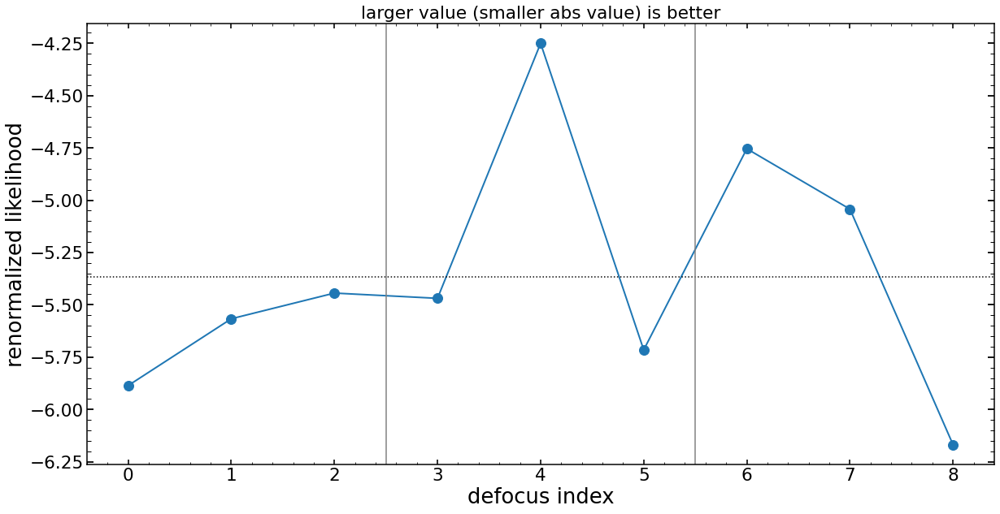

In [42]:
# shows the reported likelihood for each image, after division by the renormalization factor
# smaller absolute values is better
# dotted lien shows the mean reported value

plt.figure(figsize=(20,10))
array_of_single_res=np.array(list_of_single_res)


renormalization_of_var_sum=np.array([1,1,1,1,1,1,1,1,1])


mean_res_of_multi_same_spot=np.mean(array_of_single_res/renormalization_of_var_sum)
print('mean reported value:'+str(mean_res_of_multi_same_spot))
print('array_of_single_res: '+str(array_of_single_res))
print('renormalization factors: '+str(renormalization_of_var_sum))
print('array_of_single_res renormalized: '+str(array_of_single_res/renormalization_of_var_sum))
plt.plot(array_of_single_res/renormalization_of_var_sum,marker='o',lw=2,ms=12)
plt.xlabel('defocus index')
plt.ylabel('renormalized likelihood')
plt.axhline(mean_res_of_multi_same_spot,color='black',ls=":")
plt.axvline(2.5,color='gray')
plt.title('larger value (smaller abs value) is better')
plt.axvline(5.5,color='gray')

In [43]:
minchain=list_of_minchain[4]

print('minchain.shape '+str(minchain.shape))

    
dfz11 = pd.DataFrame(np.array([np.array([minchain])[0][0:8]]),columns=columns22[0:8])
print(dfz11)
print('##############################################')
dfz22 = pd.DataFrame(np.array([np.array([minchain])[0][8:19]]),columns=columns22[8:19])
print(dfz22)

print('')
#dfglobal = pd.DataFrame(np.array([np.array([minchain])[0][19:len(columns)]]),columns=columns[19:])
print('##############################################')
dfglobal1 = pd.DataFrame(np.array([np.array([minchain])[0][19:19+6]]),columns=columns22[19:19+6])
print(dfglobal1)
print('##############################################')
dfglobal2 = pd.DataFrame(np.array([np.array([minchain])[0][25:25+4]]),columns=columns22[25:25+4])
print(dfglobal2)
print('##############################################')
dfglobal3 = pd.DataFrame(np.array([np.array([minchain])[0][29:29+5]]),columns=columns22[29:29+5])
print(dfglobal3)
print('##############################################')
dfglobal4 = pd.DataFrame(np.array([np.array([minchain])[0][34:41]]),columns=columns22[34:41])
print(dfglobal4)

minchain.shape (76,)
         z4        z5        z6        z7        z8        z9       z10  \
0  0.141509 -0.866217 -0.492212 -0.350574  0.462323 -0.444646 -0.580683   

        z11  
0  0.584267  
##############################################
        z12       z13       z14       z15       z16       z17       z18  \
0  0.032346  0.224784 -0.051462  0.031311  0.056816  0.049346  0.030785   

        z19       z20       z21       z22  
0 -0.035854 -0.030686  0.025259  0.046064  

##############################################
    hscFrac  strutFrac  dxFocal   dyFocal  slitFrac  slitFrac_dy
0  0.704498   0.102369  -0.2113  0.273752  0.061499     0.106363
##############################################
     wide_0   wide_23   wide_43  misalign
0  0.121338  0.290224  0.264646  1.173067
##############################################
    x_fiber   y_fiber  effective_radius_illumination  frd_sigma  \
0 -0.034594 -0.011542                       0.878269   0.027971   

   frd_lorentz_factor  

(-1.8, -0.8)

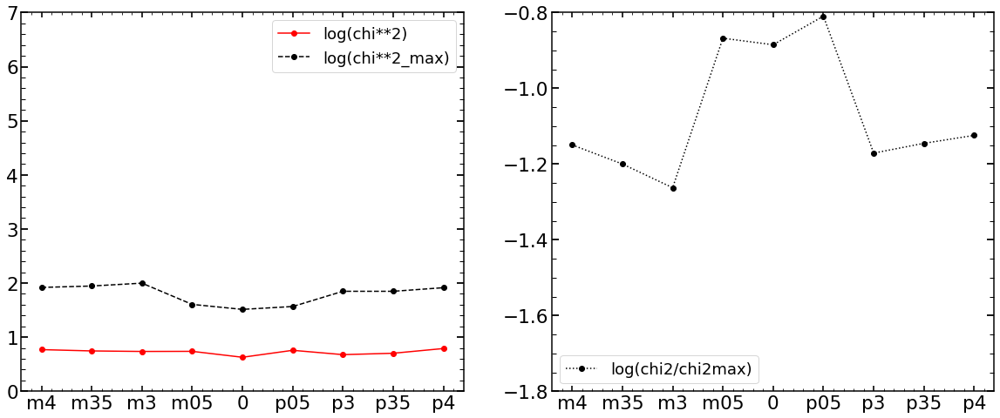

In [44]:
chi_results_array=np.array(res_multi[4])

plt.figure(figsize=(20,8))

plt.subplot(121)

plt.plot(np.log10(chi_results_array[:,2]),color='red',label='log(chi**2)',marker='o')
#plt.plot(np.log10(chi_results_array[:,3])-2.3,color='black',label='log(chi**2_max)-2.3',marker='o')
plt.plot(np.log10(chi_results_array[:,3]),color='black',label='log(chi**2_max)',marker='o',ls='--')
plt.ylim(0,7)
plt.xticks(np.arange(0,len(list_of_defocuses_input_long),1),list_of_defocuses_input_long)
plt.legend()
plt.subplot(122)

plt.plot(np.log10(chi_results_array[:,2]/chi_results_array[:,3]),color='black',label='log(chi2/chi2max)',marker='o',ls=':')
plt.legend()
plt.xticks(np.arange(0,len(list_of_defocuses_input_long),1),list_of_defocuses_input_long)
#plt.ylim(-2.8,-1.5)
plt.ylim(-1.8,-0.8)

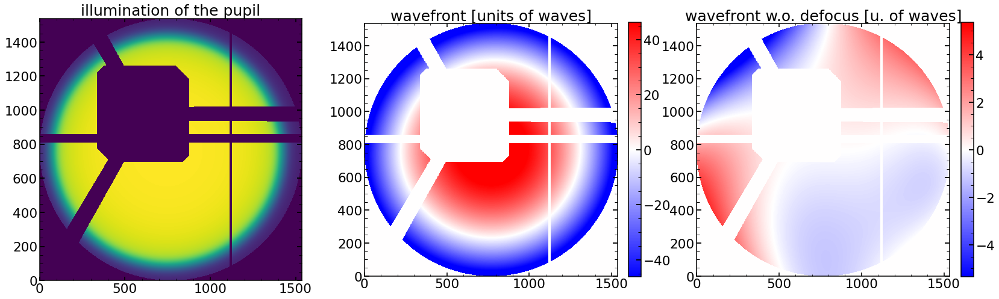

In [45]:
single_analysis.illumination_wavefront_plot()

Science image shape is: (60, 60)
Top left pixel value of the science image is: 11.366353
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 6.2264752
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.45c
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 45.24108123779297
---------------------
chi**2 max reduced is: 6628.077
chi**2 reduced is: 46.616253 for log improvment: -2.1528502
chi max reduced is: 60.443584
chi reduced is: 4.5897455 for log improvment: -1.1195616
---------------------
chi**2 reduced within custom mask area is: 46.616253
---------------------
chi**2 max reduced within flux mask area is: 9466.453
chi**2 reduced within flux mask area is: 65.08699 for log imp

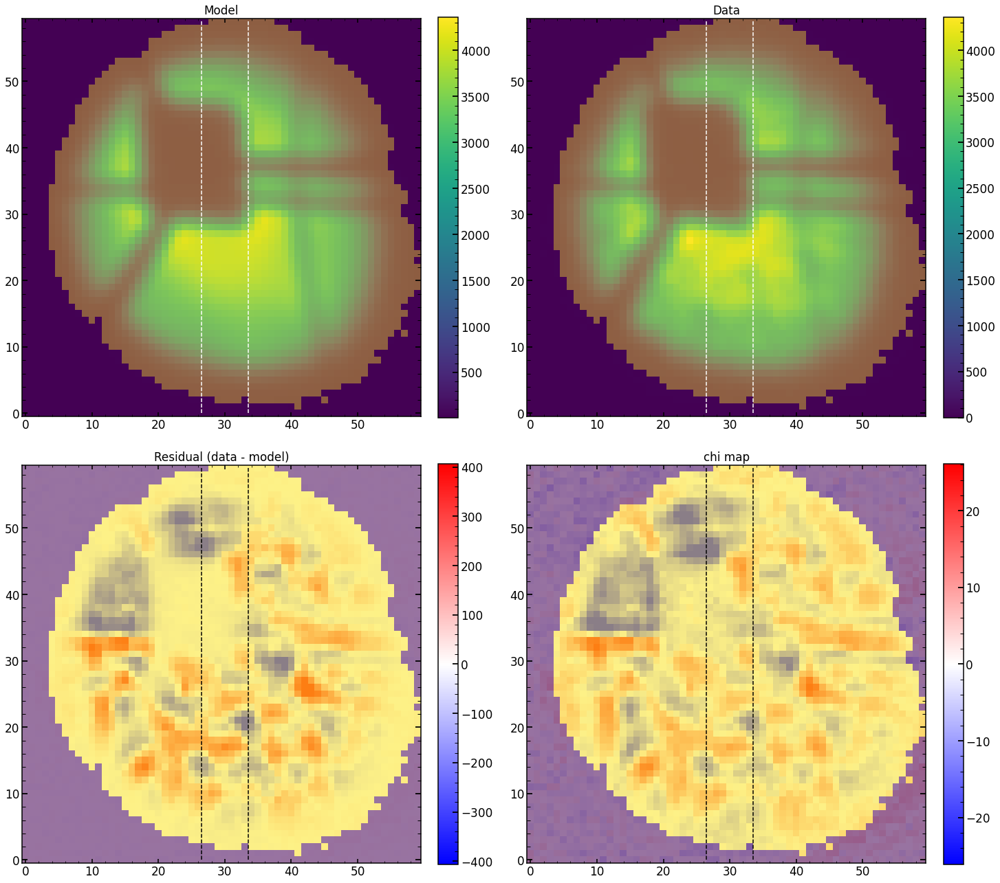

In [46]:
index_of_single_image=0

#
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=True,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=False)

# I can move to use custom_var within the analysis
#single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
#                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=custom_var,\
#                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=False)

array_of_sci_image=np.array(list_of_sci_images)
array_of_single_model_image=np.array(list_of_single_model_image)
array_of_var_images=np.array(list_of_var_images)
array_of_mask_images=np.array(list_of_mask_images)

np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_sci_image'+'_'+str(single_number),array_of_sci_image)
np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_single_model_image'+'_'+str(single_number),array_of_single_model_image)
np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_var_images'+'_'+str(single_number),array_of_var_images)
np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_mask_images'+'_'+str(single_number),array_of_mask_images)

Science image shape is: (60, 60)
Top left pixel value of the science image is: 11.366353
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 6.2264752
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.45c
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 45.24108123779297
fraction of chi2 due to 1% of pixels: 0.14400062
---------------------
chi**2 max reduced is: 6628.077
chi**2 reduced is: 46.616253 for log improvment: -2.1528502
chi max reduced is: 60.443584
chi reduced is: 4.5897455 for log improvment: -1.1195616
---------------------
chi**2 reduced within custom mask area is: 46.616253
---------------------
chi**2 max reduced within flux mask area is: 9466.453
chi**2 reduc

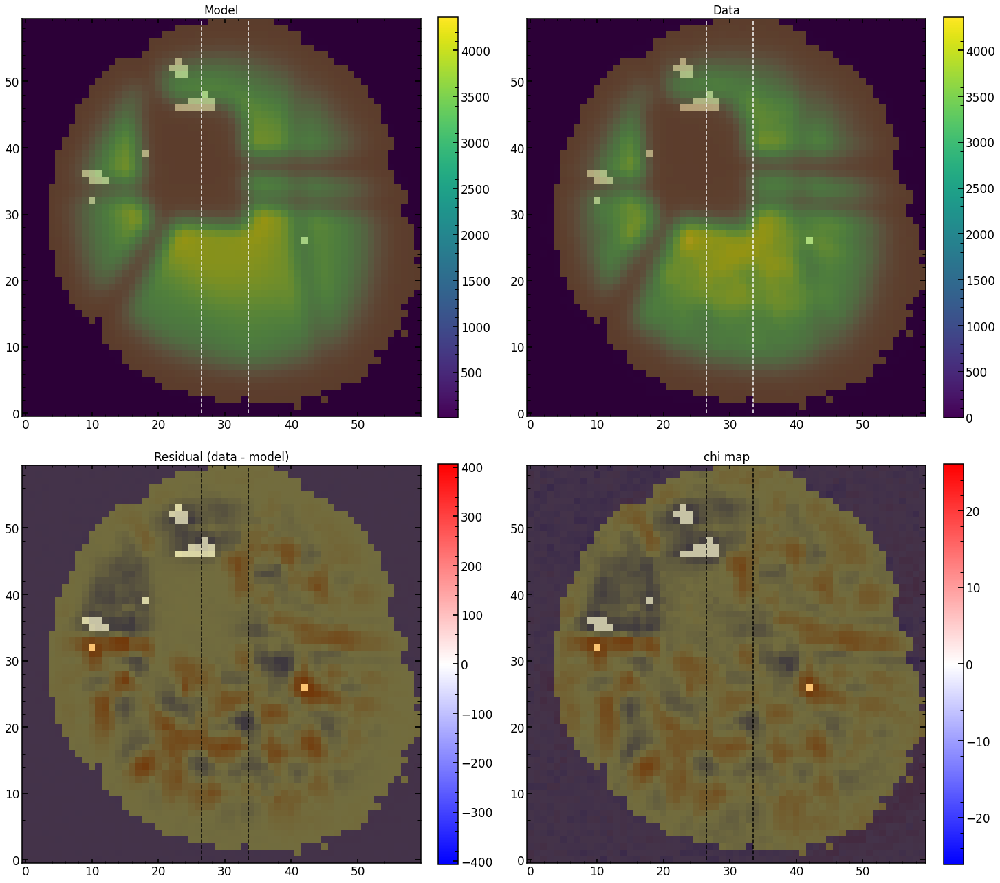

In [47]:

model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=True,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

Science image shape is: (60, 60)
Top left pixel value of the science image is: 11.366353
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 6.2264752
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.45c
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
3x mean_value_of_background via sci is estimated to be: 45.24108123779297
---------------------
chi**2 max reduced is: 6628.077
chi**2 reduced is: 46.616253 for log improvment: -2.1528502
chi max reduced is: 60.443584
chi reduced is: 4.5897455 for log improvment: -1.1195616
---------------------
chi**2 reduced within custom mask area is: 46.616253
---------------------
chi**2 max reduced within flux mask area is: 9466.453
chi**2 reduced within flux mask area is: 65.08699 for log imp

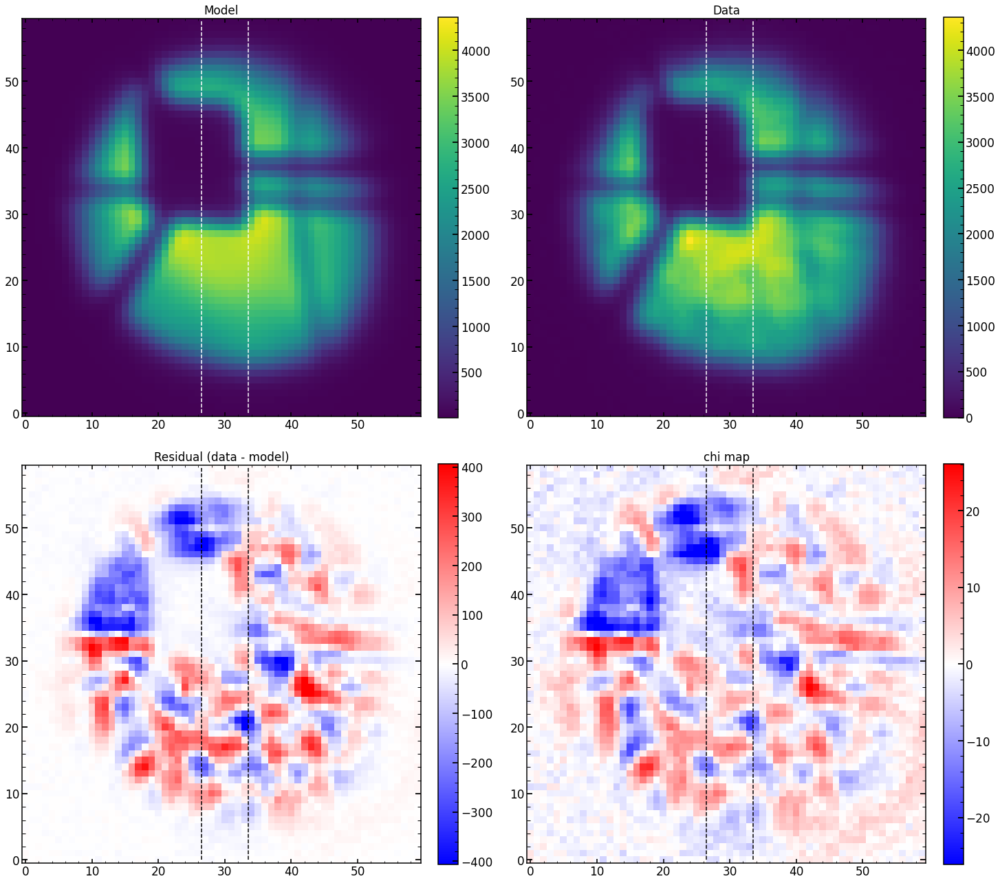

In [48]:
#
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=False)

chi**2 max reduced is: 6628.077
chi**2 reduced is: 46.616253
Abs of residual divided by total flux is: 0.061249495
Abs of residual divided by largest value of a flux in the image is: 0.13244484


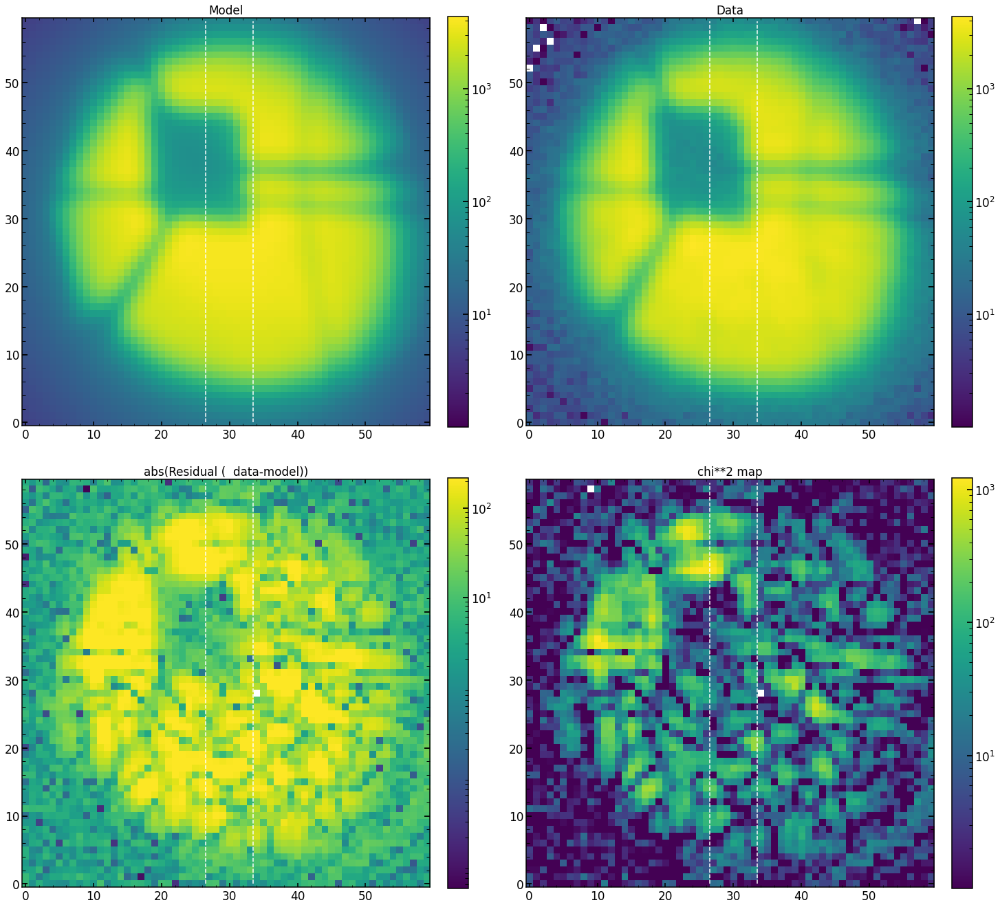

In [49]:
single_analysis.create_basic_comparison_plot_log(custom_model_image=list_of_single_model_image[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                                show_flux_mask=False)

46.616253
chi**2 reduced is: 46.616253
Abs of residual divided by total flux is: 0.061249495
Abs of residual divided by largest value of a flux in the image is: 0.13244484


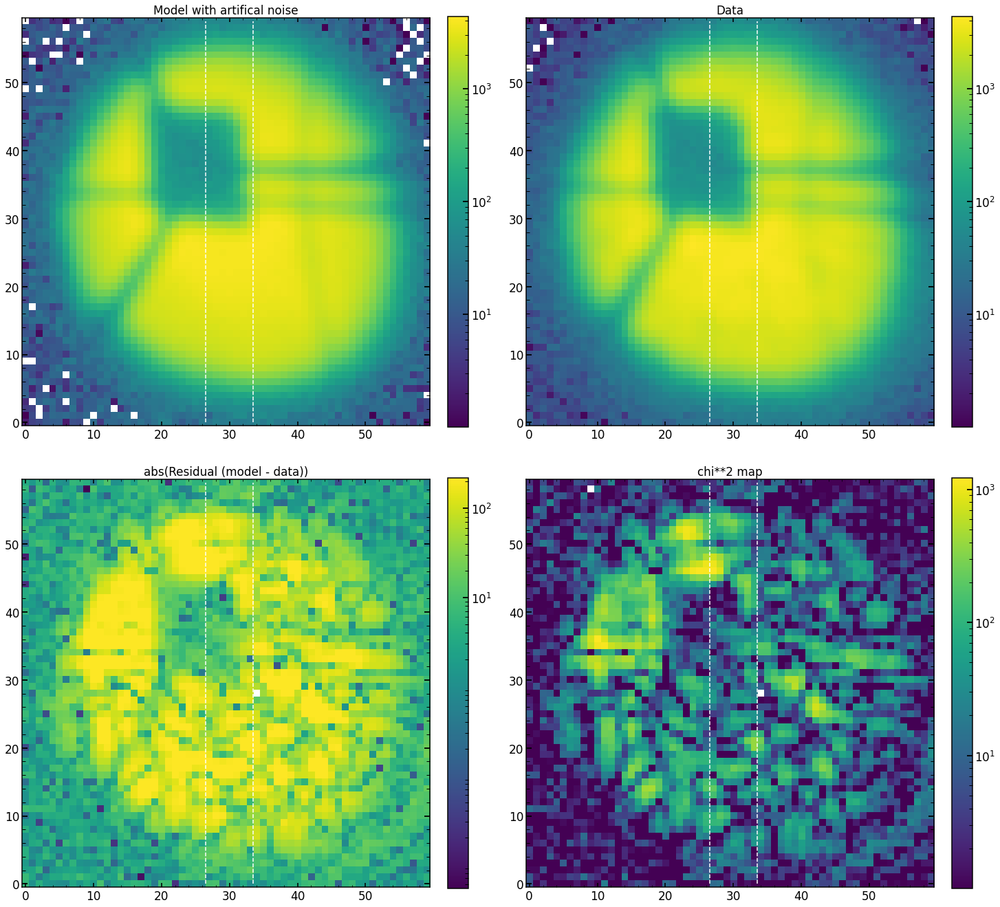

In [50]:
single_analysis.create_basic_comparison_plot_log_artifical(custom_model_image=list_of_single_model_image[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],\
                                                           custom_var_image=list_of_var_images[index_of_single_image])

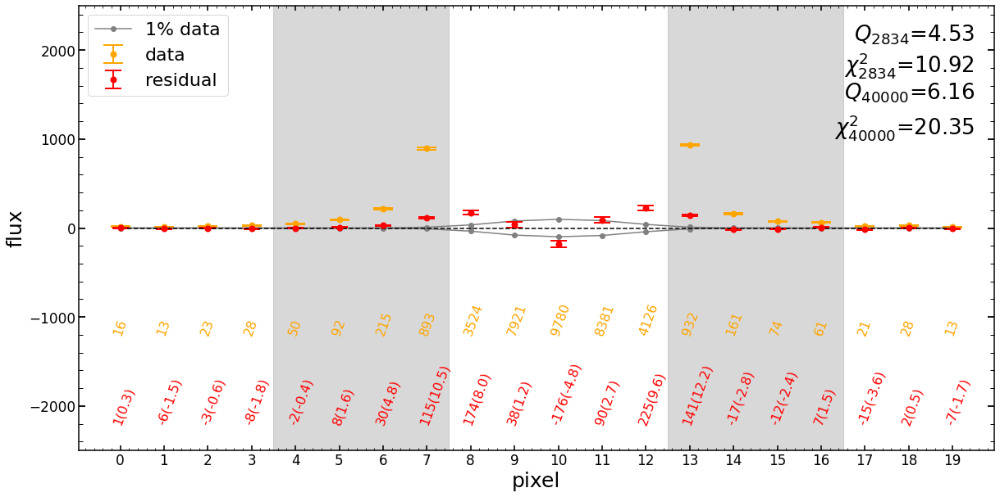

In [51]:
index_of_single_image=4
plot_1D_residual(sci_image=list_of_sci_images[index_of_single_image],var_image=list_of_var_images[index_of_single_image],model_image=list_of_single_model_image[index_of_single_image])

## chi image result analysis 

In [108]:
index_of_single_image=0
list_of_mean_value_of_background=[]
list_residual_flux_mask=[]
list_of_len_residual_flux_mask=[]
for index_of_single_image in range(9):
    custom_model_image=list_of_single_model_image[index_of_single_image]
    custom_sci_image=list_of_sci_images[index_of_single_image]
    custom_var_image=list_of_var_images[index_of_single_image]


    mean_value_of_background=np.mean([np.median(custom_var_image[0]),np.median(custom_var_image[-1]),\
                          np.median(custom_var_image[:,0]),np.median(custom_var_image[:,-1])])*3
    list_of_mean_value_of_background.append(mean_value_of_background)
    flux_mask=custom_sci_image>(mean_value_of_background)


    residual=np.abs(custom_sci_image-custom_model_image)/np.sqrt(custom_var_image)
    residual_flux_mask=residual[flux_mask]
    residual_flux_mask=residual_flux_mask/len(residual_flux_mask)
    list_of_len_residual_flux_mask.append(len(residual_flux_mask))
    list_residual_flux_mask=[*list_residual_flux_mask, *residual_flux_mask]
    
array_of_residual_flux_mask=np.array(list_residual_flux_mask)
array_of_len_residual_flux_max=np.array(list_of_len_residual_flux_mask)
print(array_of_len_residual_flux_max)
array_of_len_residual_flux_max=np.cumsum(array_of_len_residual_flux_max)
np.set_printoptions(formatter={'float': lambda x: "{0:0.3f}".format(x)})
print('mean_value_of_background per image '+str(np.array(list_of_mean_value_of_background)))

[2938 2167 1459  225  105  162 1725 2190 2582]
mean_value_of_background per image [20.426 22.973 31.549 11.659 10.440 10.653 14.512 15.467 17.946]


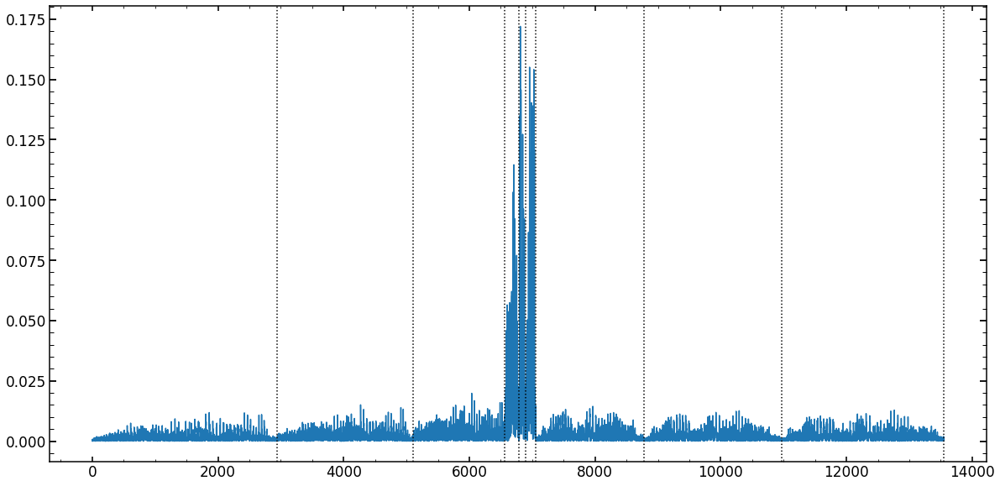

In [105]:
plt.figure(figsize=(20,10))
plt.plot(array_of_residual_flux_mask)
for i in range(len(array_of_len_residual_flux_max)):
    plt.axvline(array_of_len_residual_flux_max[i],ls=':',color='black')

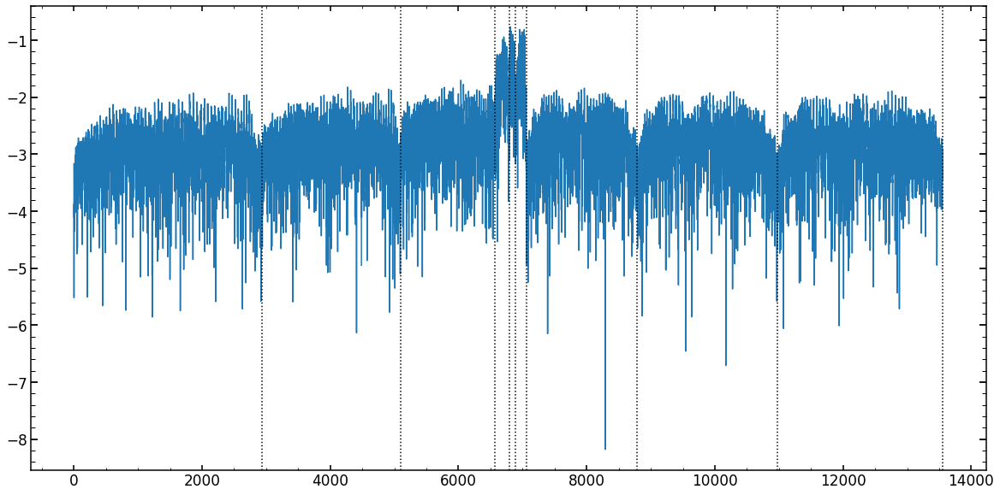

In [106]:
plt.figure(figsize=(20,10))
plt.plot(np.log10(array_of_residual_flux_mask))
for i in range(len(array_of_len_residual_flux_max)):
    plt.axvline(array_of_len_residual_flux_max[i],ls=':',color='black')

## results everywhere 

In [52]:
list_of_high_Zernike=[]
for i in range(22+1,56+1):
    list_of_high_Zernike.append('z'+str(i))
    
columns56_analysis=columns22_analysis[0:42]+list_of_high_Zernike+columns22_analysis[42:]

# this is multi analysis, so we do not select per number of images
unique_numbers_Ar=np.unique(arranged_by_spot_number_Ar[:,1])

unique_numbers_Ne=np.unique(arranged_by_spot_number_Ne[:,1])

if len(arranged_by_spot_number_Kr)>0:
    unique_numbers_Kr=np.unique(arranged_by_spot_number_Kr[:,1])
else:
    unique_numbers_Kr=np.array([])


In [53]:
results_of_fit_many_single_defocus_Ar=pd.DataFrame(np.zeros((len(finalAr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                     index=finalAr.index,columns=columns56_analysis)
err_results_of_fit_many_single_defocus_Ar=pd.DataFrame(np.zeros((len(finalAr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                         index=finalAr.index,columns=columns56_analysis)

results_of_fit_many_single_defocus_Ar_pd=pd.DataFrame(results_of_fit_many_single_defocus_Ar)
err_results_of_fit_many_single_defocus_Ar_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Ar)

results_of_fit_many_Ar = {'m4': results_of_fit_many_single_defocus_Ar_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Ar_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Ar_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Ar_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']



for single_number in unique_numbers_Ar:
    # result from the defocused analysis
    # arguments are date,single_number,arc,zmax,dataset,verbosity=None):
    result_analysis=Zernike_result_analysis(date=date,single_number=single_number,arc='Ar',zmax=56,dataset=6,verbosity=None)  

    
    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Ar',dataset=6,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)

    minchain_parametrization,like_min=single_analysis.create_likelihood()
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        
        
        defocus_value=[-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0,0.5,1,1.5,2,2.5,3,3.5,4]

        parameterization_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization)
        single_parametrization=model_multi.create_allparameters_single(defocus_value[i],parameterization_2d,56)
        # this can be done to really show the ratio between input chi2 and final chi 2 in focus
        results_of_fit_many_Ar[label[i]].at[single_number]=np.concatenate((single_parametrization[0:len(columns56_analysis)-2],np.array([like_min[-1],like_min[0]])))  

            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_Ar[label[i]]=results_of_fit_many_Ar[label[i]][np.abs(results_of_fit_many_Ar[label[i]]['z4'])>0]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 1
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_3443716ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 4.094444539811876
average chi2 reduced is: -4.920152789451469
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 100
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 343

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_344371106ArSwarm1.npy
(41, 480, 129)
minimal likelihood is: 3.693922334247165
average chi2 reduced is: -4.357342145457078
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 111
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_344371116ArSwarm1.npy
(41, 480, 129)
minimal likelihood is: 2.983438399102953
average chi2 reduced is: -4.24168144507713

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437156ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 2.536522242758009
average chi2 reduced is: -4.279645450707022
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 17
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437176ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 7.367576016320123
average chi2 reduced is: -5.8094592868864

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437326ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 3.6817000177171497
average chi2 reduced is: -4.791638097859155
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 33
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437336ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 8.980410099029541
average chi2 reduced is: -5.827763615698998


Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437536ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 7.33445390065511
average chi2 reduced is: -5.925123472663943
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 54
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437546ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 4.424384315808614
average chi2 reduced is: -5.138979756293481
ST

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437686ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 4.5664942264556885
average chi2 reduced is: -5.029101207029163
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 69
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437696ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 11.947154257032606
average chi2 reduced is: -6.16655277310669


Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437836ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 5.047606839074029
average chi2 reduced is: -4.705050958621503
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 85
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437856ArSwarm1.npy
(51, 480, 129)
minimal likelihood is: 3.9400566021601358
average chi2 reduced is: -4.631412080450333


Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34437996ArSwarm1.npy
(41, 480, 129)
minimal likelihood is: 2.6525279415978327
average chi2 reduced is: -4.245889663626783


In [54]:
results_of_fit_many_single_defocus_Ne=pd.DataFrame(np.zeros((len(finalNe),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                     index=finalNe.index,columns=columns56_analysis)
err_results_of_fit_many_single_defocus_Ne=pd.DataFrame(np.zeros((len(finalNe),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                         index=finalNe.index,columns=columns56_analysis)

results_of_fit_many_single_defocus_Ne_pd=pd.DataFrame(results_of_fit_many_single_defocus_Ne)
err_results_of_fit_many_single_defocus_Ne_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Ne)

results_of_fit_many_Ne = {'m4': results_of_fit_many_single_defocus_Ne_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Ne_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Ne_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Ne_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']



for single_number in unique_numbers_Ne:
    # result from the defocused analysis
    # arguments are date,single_number,arc,zmax,dataset,verbosity=None):
    result_analysis=Zernike_result_analysis(date=date,single_number=single_number,arc='Ne',zmax=56,dataset=6,verbosity=None)  

    
    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Ne',dataset=6,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)

    minchain_parametrization,like_min=single_analysis.create_likelihood()
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        
        
        defocus_value=[-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0,0.5,1,1.5,2,2.5,3,3.5,4]

        parameterization_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization)
        single_parametrization=model_multi.create_allparameters_single(defocus_value[i],parameterization_2d,56)
        # this can be done to really show the ratio between input chi2 and final chi 2 in focus
        results_of_fit_many_Ne[label[i]].at[single_number]=np.concatenate((single_parametrization[0:len(columns56_analysis)-2],np.array([like_min[-1],like_min[0]])))  

            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_Ne[label[i]]=results_of_fit_many_Ne[label[i]][np.abs(results_of_fit_many_Ne[label[i]]['z4'])>0]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 11
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34217, 34223, 34229, 34259, 34265, 34271, 34301, 34307, 34313]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34217
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34313116NeSwarm1.npy
(41, 480, 129)
minimal likelihood is: 9.613839361402723
average chi2 reduced is: -5.678869910697893
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 14
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34217, 34223, 34229, 34259, 34265, 34

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34313846NeSwarm1.npy
(41, 480, 129)
minimal likelihood is: 18.03351550632053
average chi2 reduced is: -6.187357322708284
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 85
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34217, 34223, 34229, 34259, 34265, 34271, 34301, 34307, 34313]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34217
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34313856NeSwarm1.npy
(41, 480, 129)
minimal likelihood is: 93.2547603448232
average chi2 reduced is: -5.499923483012164
ST

In [55]:
results_of_fit_many_single_defocus_Kr=pd.DataFrame(np.zeros((len(finalKr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                     index=finalKr.index,columns=columns56_analysis)
err_results_of_fit_many_single_defocus_Kr=pd.DataFrame(np.zeros((len(finalKr),len(columns56_analysis))).reshape(-1,len(columns56_analysis)),\
                                                         index=finalKr.index,columns=columns56_analysis)

results_of_fit_many_single_defocus_Kr_pd=pd.DataFrame(results_of_fit_many_single_defocus_Kr)
err_results_of_fit_many_single_defocus_Kr_pd=pd.DataFrame(err_results_of_fit_many_single_defocus_Kr)

results_of_fit_many_Kr = {'m4': results_of_fit_many_single_defocus_Kr_pd.copy(), 
                       'm35' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm3' :  results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm25' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm2' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm15' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm1' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'm05' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       '0' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       '0d' :  results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p05' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p1' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p15': results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p2' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p25' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p3' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                       'p35' : results_of_fit_many_single_defocus_Kr_pd.copy(),
                        'p4' :results_of_fit_many_single_defocus_Kr_pd.copy(),
                      '0p' :results_of_fit_many_single_defocus_Kr_pd.copy()}

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','0d','p05','p1','p15','p2','p25','p3','p35','p4','0p']



for single_number in unique_numbers_Kr:
    # result from the defocused analysis
    # arguments are date,single_number,arc,zmax,dataset,verbosity=None):
    result_analysis=Zernike_result_analysis(date=date,single_number=single_number,arc='Kr',zmax=56,dataset=6,verbosity=None)  

    
    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc='Kr',dataset=6,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)

    minchain_parametrization,like_min=single_analysis.create_likelihood()
    
    for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:
        
        
        defocus_value=[-4,-3.5,-3,-2.5,-2,-1.5,-1,-0.5,0,0,0.5,1,1.5,2,2.5,3,3.5,4]

        parameterization_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization)
        single_parametrization=model_multi.create_allparameters_single(defocus_value[i],parameterization_2d,56)
        # this can be done to really show the ratio between input chi2 and final chi 2 in focus
        results_of_fit_many_Kr[label[i]].at[single_number]=np.concatenate((single_parametrization[0:len(columns56_analysis)-2],np.array([like_min[-1],like_min[0]])))  

            
for i in [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]:        
    results_of_fit_many_Kr[label[i]]=results_of_fit_many_Kr[label[i]][np.abs(results_of_fit_many_Kr[label[i]]['z4'])>0]


STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 32
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34561, 34567, 34573, 34603, 34609, 34615, 34645, 34651, 34657]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34561
double_sources_positions_ratios for this spot is: [8 0.01]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_34657326KrSwarm1.npy
(41, 480, 129)
minimal likelihood is: 5.48525791698032
average chi2 reduced is: -4.790230025580565
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 33
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34561, 34567, 34573, 34603, 34609, 

In [57]:
pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/Apr1421/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_Apr1421.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ar,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Apr1421.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ne,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Apr1421.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Kr,f, protocol=pickle.HIGHEST_PROTOCOL)

In [74]:
labels_with_data_Ar=[]
for i in range(len(label[:])):
    if len(results_of_fit_many_Ar[label[i]])>5:
        labels_with_data_Ar.append(i)
        
labels_with_data_Ne=[]
for i in range(len(label[:])):
    if len(results_of_fit_many_Ne[label[i]])>5:
        labels_with_data_Ne.append(i)
   
labels_with_data_Kr=[]
for i in range(len(label[:])):
    if len(results_of_fit_many_Kr[label[i]])>5:
        labels_with_data_Kr.append(i)

labels_with_data=np.unique(labels_with_data_Ar+labels_with_data_Ne+labels_with_data_Kr)

 79%|████████████████████████████████████████████████████████████████████▋                  | 15/19 [11:19<03:01, 45.28s/it]


KeyboardInterrupt: 

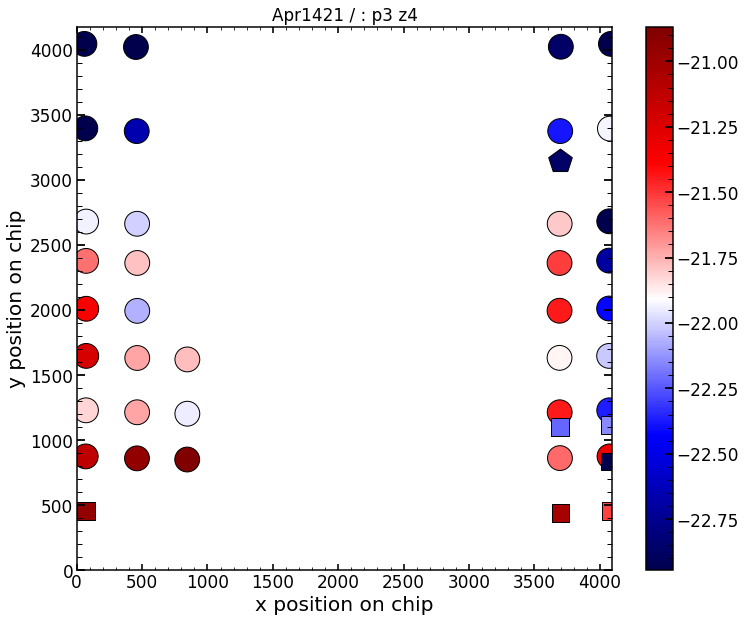

In [75]:
# plot the results of the interpolation
zMax=22
from pylab import rcParams
rcParams['figure.figsize'] = 12, 10
date='Apr1421'
descriptions=results_of_fit_many_Ar[label[0]].columns
# j runs throught the amount of defocu that we have analyzed

for j in tqdm(labels_with_data):
    # i runs through all the parameters
    for i in range(0,len(descriptions)):

        # take values for HgAr
        x_Ar=finalAr.loc[results_of_fit_many_Ar[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        y_Ar=finalAr.loc[results_of_fit_many_Ar[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        values_Ar=np.array(results_of_fit_many_Ar[label[j]][descriptions[i]])
        
        # take values for Neon        
        x_Ne=finalNe.loc[results_of_fit_many_Ne[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        y_Ne=finalNe.loc[results_of_fit_many_Ne[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        values_Ne=np.array(results_of_fit_many_Ne[label[j]][descriptions[i]])
        
        # take values for Krypton        
        x_Kr=finalKr.loc[results_of_fit_many_Kr[label[j]][descriptions[i]].index.astype(int).ravel()]['xc_effective'].values
        y_Kr=finalKr.loc[results_of_fit_many_Kr[label[j]][descriptions[i]].index.astype(int).ravel()]['yc'].values
        values_Kr=np.array(results_of_fit_many_Kr[label[j]][descriptions[i]])        
        #x=x_HgAr
        #y=y_HgAr  
        #colors=values_HgAr
        
        # join these values
        x=np.concatenate((x_Ar,x_Ne,x_Kr))
        y=np.concatenate((y_Ar,y_Ne,y_Kr))    
        colors= np.concatenate((values_Ar,values_Ne,values_Kr))
        

        
        if zMax==11:

            # limits of color for z5-z11
            if np.in1d([i],[1,2,3,4,5,6,7])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=1
                    min_colors=-1 

            # limits for all other parameters    
            if np.in1d([i],[0,10,11,16,17,8,9,12,13,14,15,18,19,20,21,22,23,24,25,26,27,28,29,30])[0] == True:
                median_color=np.median(colors)
                up_limit=np.abs(max(colors)-median_color)
                low_limit=np.abs(min(colors)-median_color)
                max_dif=np.max([low_limit,up_limit])
                min_dif=np.min([low_limit,up_limit])
                max_colors=median_color+(min_dif+max_dif)/2
                min_colors=median_color-(min_dif+max_dif)/2

            #'chi2, chi2max'
            if np.in1d([i],[31,32])[0] == True:   
                max_colors=10
                min_colors=1

        else:
            # limits of color for z5-z11
            if np.in1d([i],[1,2,3,4,5,6,7])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=1
                    min_colors=-1 
                    
            # limits of color for z12-z22
            if np.in1d([i],[8,9,10,11,12,13,14,15,16,17,18])[0] == True:
                    abs_max_colors=max(np.abs(colors))
                    max_colors=0.25
                    min_colors=-0.25

            # limits for all other parameters    
            if np.in1d([i],[0,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40])[0] == True:
                median_color=np.median(colors)
                up_limit=np.abs(np.quantile(colors,0.9)-median_color)
                low_limit=np.abs(np.quantile(colors,0.1)-median_color)
                max_dif=np.max([low_limit,up_limit])
                min_dif=np.min([low_limit,up_limit])
                max_colors=median_color+(min_dif+max_dif)/2
                min_colors=median_color-(min_dif+max_dif)/2

            #'chi2, chi2max'
            if np.in1d([i],[41,42])[0] == True:   
                max_colors=10
                min_colors=1  
            
            # Zernike above z22
            if i >42:
                max_colors=0.5/(i-20)
                min_colors=-0.5/(i-20)  

        plt.scatter(x_Ar, y_Ar, s=np.pi * (14 * 1)**2, c=values_Ar, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black',marker='o')
        plt.scatter(x_Ne, y_Ne, s=np.pi * (10 * 1)**2, c=values_Ne, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black',marker='s')
        plt.scatter(x_Kr, y_Kr, s=np.pi * (14 * 1)**2, c=values_Kr, cmap='seismic', alpha=1,vmin=min_colors, vmax=max_colors,edgecolor='black',marker='p')
        plt.ylim(0,4176)
        plt.xlim(0,4096)
        plt.xlabel('x position on chip')
        plt.ylabel('y position on chip')
        plt.title(str(date)+' / '+': '+str(label[j])+" "+str(descriptions[i]))

        plt.colorbar()
        #plt.show()

        IMAGES_FOLDER1='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/Plane/'+str(label[j])+'/'
        IMAGES_FOLDER2='/Users/nevencaplar/Documents/PFS/Images/'+str(date)+'/Plane/'+str(descriptions[i])+'/'
        if not os.path.exists(IMAGES_FOLDER1):
            os.makedirs(IMAGES_FOLDER1)
            print('Images are in folder: '+str(IMAGES_FOLDER1))
            
        if not os.path.exists(IMAGES_FOLDER2):
            os.makedirs(IMAGES_FOLDER2)
            print('Images are in folder: '+str(IMAGES_FOLDER2))
            
        plt.savefig(IMAGES_FOLDER1+str(label[j])+" "+str(descriptions[i]))
        plt.savefig(IMAGES_FOLDER2+str(label[j])+" "+str(descriptions[i]))
        plt.clf()

In [59]:
np.array(columns56_analysis)[42:]

array(['z23', 'z24', 'z25', 'z26', 'z27', 'z28', 'z29', 'z30', 'z31',
       'z32', 'z33', 'z34', 'z35', 'z36', 'z37', 'z38', 'z39', 'z40',
       'z41', 'z42', 'z43', 'z44', 'z45', 'z46', 'z47', 'z48', 'z49',
       'z50', 'z51', 'z52', 'z53', 'z54', 'z55', 'z56', 'chi2', 'chi2max'],
      dtype='<U29')

## adding proper chi2 values 

In [ ]:
import pickle
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/Apr1421/'

results_of_fit_many_Ar=np.load(DATAFRAMES_FOLDER+"results_of_fit_many_direct_Ar_from_Apr1421.pkl",allow_pickle=True)
results_of_fit_many_Ne=np.load(DATAFRAMES_FOLDER+"results_of_fit_many_direct_Ne_from_Apr1421.pkl",allow_pickle=True)
results_of_fit_many_Kr=np.load(DATAFRAMES_FOLDER+"results_of_fit_many_direct_Kr_from_Apr1421.pkl",allow_pickle=True)

In [ ]:
date='Apr1421'
obs_int=int(obs)
#single_number='55'
#image_index=int(single_number)
eps=6
arc='Ar'
dataset=6

list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

Ar_index=results_of_fit_many_Ar['0'].index.values
for single_number in tqdm(Ar_index):
    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=str(single_number),eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                     list_of_defocuses=list_of_defocuses_input_long)
    #single_analysis.create_basic_data_image()

    double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
    list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
    index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
    columns,columns22,columns22_analysis=single_analysis.return_columns()

    chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
    #chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
    len_of_chains=single_analysis.len_of_chains()

    minchain_parametrization,like_min=single_analysis.create_likelihood()


    model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,dithering=1,save=0,zmax=56,verbosity=0,\
                          double_sources=False,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,test_run=False)   

    #list_of_minchain=model_multi.create_list_of_allparameters(t1,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
    list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
    #list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=['m4','p4'],zmax=56)

    res_multi=model_multi(list_of_minchain,return_Images=True)
    np.save('/Users/nevencaplar/Documents/PFS/Images/Apr1421/Res_multi/res_multi_'+str(single_number)+'_Ar',res_multi)

    mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                    list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

    chi_results_array=np.array(res_multi[4])
    final_values=chi_results_array[:,2]
    starting_values=chi_results_array[:,3]

    if len(final_values)==9:
        for i in range(len(list_of_defocuses_input_long)):
            results_of_fit_many_Ar[list_of_defocuses_input_long[i]]['chi2'].at[single_number]=final_values[i]
            results_of_fit_many_Ar[list_of_defocuses_input_long[i]]['chi2max'].at[single_number]=starting_values[i]

In [ ]:
arc='Ne'
dataset=6

list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

Ne_index=results_of_fit_many_Ne['0'].index.values
for single_number in tqdm(Ne_index):
    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=str(single_number),eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                     list_of_defocuses=list_of_defocuses_input_long)
    #single_analysis.create_basic_data_image()

    double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
    list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
    index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
    columns,columns22,columns22_analysis=single_analysis.return_columns()

    chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
    #chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
    len_of_chains=single_analysis.len_of_chains()

    minchain_parametrization,like_min=single_analysis.create_likelihood()


    model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,dithering=1,save=0,zmax=56,verbosity=0,\
                          double_sources=False,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,test_run=False)   

    #list_of_minchain=model_multi.create_list_of_allparameters(t1,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
    list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
    #list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=['m4','p4'],zmax=56)

    res_multi=model_multi(list_of_minchain,return_Images=True)
    np.save('/Users/nevencaplar/Documents/PFS/Images/Apr1421/Res_multi/res_multi_'+str(single_number)+'_Ne',res_multi)

    mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                    list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

    chi_results_array=np.array(res_multi[4])
    final_values=chi_results_array[:,2]
    starting_values=chi_results_array[:,3]

    if len(final_values)==9:
        for i in range(len(list_of_defocuses_input_long)):
            results_of_fit_many_Ne[list_of_defocuses_input_long[i]]['chi2'].at[single_number]=final_values[i]
            results_of_fit_many_Ne[list_of_defocuses_input_long[i]]['chi2max'].at[single_number]=starting_values[i]

In [ ]:
arc='Kr'
dataset=6

list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

Kr_index=results_of_fit_many_Kr['0'].index.values
for single_number in tqdm(Kr_index):
    single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=str(single_number),eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                     list_of_defocuses=list_of_defocuses_input_long)
    #single_analysis.create_basic_data_image()

    double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
    list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
    index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
    columns,columns22,columns22_analysis=single_analysis.return_columns()

    chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
    #chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
    len_of_chains=single_analysis.len_of_chains()

    minchain_parametrization,like_min=single_analysis.create_likelihood()


    model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,dithering=1,save=0,zmax=56,verbosity=0,\
                          double_sources=False,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,test_run=False)   

    #list_of_minchain=model_multi.create_list_of_allparameters(t1,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
    list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
    #list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=['m4','p4'],zmax=56)

    res_multi=model_multi(list_of_minchain,return_Images=True)
    np.save('/Users/nevencaplar/Documents/PFS/Images/Apr1421/Res_multi/res_multi_'+str(single_number)+'_Kr',res_multi)

    mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                    list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

    chi_results_array=np.array(res_multi[4])
    final_values=chi_results_array[:,2]
    starting_values=chi_results_array[:,3]

    if len(final_values)==9:
        for i in range(len(list_of_defocuses_input_long)):
            results_of_fit_many_Kr[list_of_defocuses_input_long[i]]['chi2'].at[single_number]=final_values[i]
            results_of_fit_many_Kr[list_of_defocuses_input_long[i]]['chi2max'].at[single_number]=starting_values[i]

In [ ]:
pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/Apr1421/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_Apr1421.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ar,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Apr1421.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ne,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Apr1421.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Kr,f, protocol=pickle.HIGHEST_PROTOCOL)

# Modifying slit_frac_dx 

## doing for Jan08

In [185]:
finalAr_flip=finalAr.copy(deep=True)
finalNe_flip=finalNe.copy(deep=True)
finalKr_flip=finalKr.copy(deep=True)

finalAr_flip['fiber']=np.flip(finalAr['fiber'].values)
finalNe_flip['fiber']=np.flip(finalNe['fiber'].values)
finalKr_flip['fiber']=np.flip(finalKr['fiber'].values)

In [186]:
import pickle
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/Jan0821_v3/'

results_of_fit_many_Ar=np.load(DATAFRAMES_FOLDER+"results_of_fit_many_direct_Ar_from_Jan0821.pkl",allow_pickle=True)
results_of_fit_many_Ne=np.load(DATAFRAMES_FOLDER+"results_of_fit_many_direct_Ne_from_Jan0821.pkl",allow_pickle=True)
results_of_fit_many_Kr=np.load(DATAFRAMES_FOLDER+"results_of_fit_many_direct_Kr_from_Jan0821.pkl",allow_pickle=True)

In [187]:

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','p05','p1','p15','p2','p25','p3','p35','p4']
for l in label:
    results_of_fit_many_Ar[l]['slitHolder_frac_dx'][finalAr_flip['fiber']==63]=[-0.53,-0.53,-0.53,-0.53,-0.53,-0.53,-0.53,-0.53,-0.53,-0.53]
    results_of_fit_many_Ar[l]['slitHolder_frac_dx'][finalAr_flip['fiber']==2]=[-0.626,-0.626,-0.626,-0.626,-0.626,-0.626,-0.626,-0.626,-0.626]
    
    results_of_fit_many_Ne[l]['slitHolder_frac_dx'][finalNe_flip['fiber']==63]=[-0.53,-0.53]
    results_of_fit_many_Ne[l]['slitHolder_frac_dx'][finalNe_flip['fiber']==2]=[-0.626,-0.626,-0.626]
    
    results_of_fit_many_Kr[l]['slitHolder_frac_dx'][finalKr_flip['fiber']==63]=[-0.53,-0.53,-0.53,-0.53]
    results_of_fit_many_Kr[l]['slitHolder_frac_dx'][finalKr_flip['fiber']==2]=[-0.626,-0.626,-0.626,-0.626]

In [188]:
pd.reset_option("display.max_rows")
import pickle
# correction to slitHolder_frac_dx
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/Jan0921/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_Jan0921.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ar,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Jan0921.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ne,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Jan0921.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Kr,f, protocol=pickle.HIGHEST_PROTOCOL)

In [241]:
pd.reset_option("display.max_rows")
import pickle
# correction to slitHolder_frac_dx
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/Jan0821_v4/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_Jan0821.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ar,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Jan0821.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ne,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Jan0821.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Kr,f, protocol=pickle.HIGHEST_PROTOCOL)

In [147]:
results_of_fit_many_Ar['m4']['slitHolder_frac_dx']

1      0.662078
2      0.693582
3      0.614260
4      0.673923
5      0.628283
         ...   
114   -0.214882
115   -0.208374
117   -0.232769
118   -0.567323
119   -0.084308
Name: slitHolder_frac_dx, Length: 96, dtype: float64

In [154]:
np.unique(finalAr_flip['fiber'])

array([2, 63, 192, 255, 339, 401, 464, 525, 587, 650], dtype=object)

In [152]:
results_of_fit_many_Ar['m4']['slitHolder_frac_dx'][finalAr_flip['fiber']==2]

109   -0.232225
110   -0.204876
111   -0.232523
112   -0.264916
114   -0.214882
115   -0.208374
117   -0.232769
118   -0.567323
119   -0.084308
Name: slitHolder_frac_dx, dtype: float64

In [189]:
results_of_fit_many_Ar['m4']

,z4,z5,z6,z7,z8,z9,z10,z11,z12,z13,...,z49,z50,z51,z52,z53,z54,z55,z56,chi2,chi2max
1,30.466353,-0.691543,-0.122218,0.453893,0.457335,0.080050,-0.421279,-0.125096,-0.113706,-0.073035,...,-0.000505,-0.003525,0.004592,0.003891,0.002887,0.007674,0.000573,-0.003846,81.172768,10944.198242
2,31.323591,-0.829891,-0.144116,0.541517,0.573043,0.078274,-0.334998,0.006567,-0.133824,-0.151235,...,-0.003286,-0.002867,0.006200,0.008527,0.006466,0.006699,0.008658,-0.006303,36.703064,4585.317383
3,31.915878,-0.687367,-0.112430,0.671766,0.597744,0.081343,-0.277135,0.210399,-0.179233,-0.117237,...,-0.007204,-0.000868,0.008562,0.011825,0.000934,0.014887,0.007905,-0.022165,27.441671,3334.519287
4,29.442710,-0.928657,0.086012,0.314241,0.441212,0.006228,-0.273723,-0.157860,-0.117714,-0.030994,...,-0.016058,0.002355,0.000928,0.008923,0.001196,0.007393,0.004750,-0.006823,89.939102,10509.958008
5,30.706374,-1.028650,-0.113781,0.305829,0.419976,0.018960,-0.201148,-0.124856,-0.188374,-0.007046,...,-0.005462,0.001685,0.003722,0.007916,0.001439,0.007539,0.004441,-0.007118,424.666046,75485.921875
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114,30.752480,0.964160,-0.456303,0.277425,-0.990926,-0.020174,-0.574280,0.125937,-0.124887,-0.002392,...,0.002319,-0.013404,-0.000498,-0.004668,-0.003627,-0.002136,0.001511,0.003148,189.783615,20152.550781
115,31.162313,1.317125,-0.474590,0.159716,-1.181982,-0.057009,-0.617247,0.349278,-0.125915,-0.086984,...,0.001408,-0.014003,0.004605,-0.010633,0.000571,-0.004110,-0.002416,-0.000991,276.807892,27518.275391
117,28.855638,2.549502,-1.877622,0.277392,-0.600399,-0.341886,-0.529638,0.331052,-0.113313,0.038439,...,-0.004077,-0.009699,-0.000423,-0.006486,-0.006313,-0.008679,-0.008170,-0.004730,1150.104614,101972.906250
118,34.293419,2.052327,-1.639447,-0.140247,-1.146651,-0.349510,-0.639195,0.766058,-0.092235,-0.269953,...,0.014160,0.001018,0.000967,-0.000761,0.009530,-0.031978,0.016194,0.021562,172.369431,17417.583984


In [183]:
results_of_fit_many_Kr['m4']['slitHolder_frac_dx'][finalKr_flip['fiber']==63]

32   -0.275136
33   -0.290053
34   -0.238823
35   -0.154446
Name: slitHolder_frac_dx, dtype: float64

In [184]:
results_of_fit_many_Kr['m4']['slitHolder_frac_dx'][finalKr_flip['fiber']==2]

36   -0.238656
37   -0.268691
38   -0.214872
39   -0.218266
Name: slitHolder_frac_dx, dtype: float64

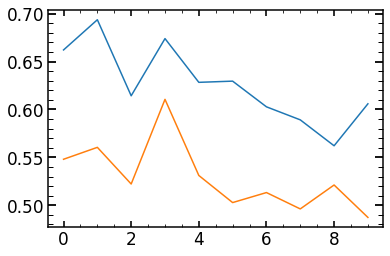

In [161]:
plt.plot(results_of_fit_many_Ar['m4']['slitHolder_frac_dx'][finalAr_flip['fiber']==650].values)
plt.plot(results_of_fit_many_Ar['m4']['slitHolder_frac_dx'][finalAr_flip['fiber']==587].values)


In [164]:
np.mean(results_of_fit_many_Ar['m4']['slitHolder_frac_dx'][finalAr_flip['fiber']==587])

0.529327356313279

In [165]:
np.mean(results_of_fit_many_Ar['m4']['slitHolder_frac_dx'][finalAr_flip['fiber']==650])

0.6261513852866839

## doing that for Jan29 

In [229]:
import pickle
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/Jan2921/'

results_of_fit_many_Ar=np.load(DATAFRAMES_FOLDER+"results_of_fit_many_direct_Ar_from_Jan2921.pkl",allow_pickle=True)
results_of_fit_many_Ne=np.load(DATAFRAMES_FOLDER+"results_of_fit_many_direct_Ne_from_Jan2921.pkl",allow_pickle=True)
results_of_fit_many_Kr=np.load(DATAFRAMES_FOLDER+"results_of_fit_many_direct_Kr_from_Jan2921.pkl",allow_pickle=True)

for labelInput in ['m4','m35','m3','m25','m2','m15','m1','m05','0','p05','p1','p15','p2','p25','p3','p35','p4']:
    results_of_fit_many_Ar[labelInput].index=results_of_fit_many_Ar[labelInput].index.astype(int)
    results_of_fit_many_Ne[labelInput].index=results_of_fit_many_Ne[labelInput].index.astype(int)
    results_of_fit_many_Kr[labelInput].index=results_of_fit_many_Kr[labelInput].index.astype(int)

In [236]:
results_of_fit_many_Kr[l]['slitHolder_frac_dx'][finalKr_flip['fiber']==2]

36   -0.238920
37   -0.269659
38   -0.215557
Name: slitHolder_frac_dx, dtype: float64

In [237]:

label=['m4','m35','m3','m25','m2','m15','m1','m05','0','p05','p1','p15','p2','p25','p3','p35','p4']
for l in label:
    results_of_fit_many_Ar[l]['slitHolder_frac_dx'][finalAr_flip['fiber']==63]=[-0.53,-0.53,-0.53,-0.53,-0.53,-0.53]
    results_of_fit_many_Ar[l]['slitHolder_frac_dx'][finalAr_flip['fiber']==2]=[-0.626,-0.626,-0.626,-0.626,-0.626,-0.626,-0.626]
    
    results_of_fit_many_Ne[l]['slitHolder_frac_dx'][finalNe_flip['fiber']==63]=[-0.53,-0.53,-0.53]
    results_of_fit_many_Ne[l]['slitHolder_frac_dx'][finalNe_flip['fiber']==2]=[-0.626,-0.626,-0.626,-0.626,-0.626]
    
    results_of_fit_many_Kr[l]['slitHolder_frac_dx'][finalKr_flip['fiber']==63]=[-0.53,-0.53,-0.53,-0.53]
    results_of_fit_many_Kr[l]['slitHolder_frac_dx'][finalKr_flip['fiber']==2]=[-0.626,-0.626,-0.626]

In [239]:
pd.reset_option("display.max_rows")
import pickle
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/Jan2921_v2/'
if not os.path.exists(DATAFRAMES_FOLDER):
    os.makedirs(DATAFRAMES_FOLDER )

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_Jan2921.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ar,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Jan2921.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Ne,f, protocol=pickle.HIGHEST_PROTOCOL)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Jan2921.pkl', 'wb') as f:
    pickle.dump(results_of_fit_many_Kr,f, protocol=pickle.HIGHEST_PROTOCOL)

# PIPE2D-793 (update to work in SuNNs)

In [190]:
96+37+36

169

In [199]:
np.unique(finalAr_flip['wavelength'])

array(['690.9346', '696.7261', '706.8989', '727.47876', '738.6248',
       '763.74286', '795.0522', '826.6699', '852.4029', '912.5693',
       '922.7301', '966.0642'], dtype=object)

In [200]:
np.unique(finalNe_flip['wavelength'])

array(['650.84186', '653.4774', '660.0668', '668.01764', '671.9268',
       '693.13116', '717.59015', '724.72437', '744.1276'], dtype=object)

In [201]:
np.unique(finalKr_flip['wavelength'])

array([785.48, 819.0, 877.68, 892.87], dtype=object)

In [203]:
Ar_wavelengths=[690.937,696.7352,706.9167,727.4940,738.6014,763.7208,795.0362,826.6794,852.3783,912.5471,922.7030,966.0435]
Ne_wavelengths=[650.83255,653.46872,660.07754,668.01205,671.88974,693.13787,717.59154,724.71631,744.09469]
Kr_wavelengths=[785.69844,819.23082,877.91607,893.11447]

In [205]:
Ar_wavelengths_multiple=Ar_wavelengths *10
Ne_wavelengths_multiple=Ne_wavelengths *10
Kr_wavelengths_multiple=Kr_wavelengths *10

In [206]:
finalAr_flip['wavelength']=Ar_wavelengths_multiple
finalNe_flip['wavelength']=Ne_wavelengths_multiple
finalKr_flip['wavelength']=Kr_wavelengths_multiple

In [204]:
Ar_wavelengths *10

[690.937,
 696.7352,
 706.9167,
 727.494,
 738.6014,
 763.7208,
 795.0362,
 826.6794,
 852.3783,
 912.5471,
 922.703,
 966.0435,
 690.937,
 696.7352,
 706.9167,
 727.494,
 738.6014,
 763.7208,
 795.0362,
 826.6794,
 852.3783,
 912.5471,
 922.703,
 966.0435,
 690.937,
 696.7352,
 706.9167,
 727.494,
 738.6014,
 763.7208,
 795.0362,
 826.6794,
 852.3783,
 912.5471,
 922.703,
 966.0435,
 690.937,
 696.7352,
 706.9167,
 727.494,
 738.6014,
 763.7208,
 795.0362,
 826.6794,
 852.3783,
 912.5471,
 922.703,
 966.0435,
 690.937,
 696.7352,
 706.9167,
 727.494,
 738.6014,
 763.7208,
 795.0362,
 826.6794,
 852.3783,
 912.5471,
 922.703,
 966.0435,
 690.937,
 696.7352,
 706.9167,
 727.494,
 738.6014,
 763.7208,
 795.0362,
 826.6794,
 852.3783,
 912.5471,
 922.703,
 966.0435,
 690.937,
 696.7352,
 706.9167,
 727.494,
 738.6014,
 763.7208,
 795.0362,
 826.6794,
 852.3783,
 912.5471,
 922.703,
 966.0435,
 690.937,
 696.7352,
 706.9167,
 727.494,
 738.6014,
 763.7208,
 795.0362,
 826.6794,
 852.3783,


In [208]:
positions_of_simulation_00_Ar=finalAr_flip.loc[results_of_fit_many_Ar['0'].index.values][['fiber','xc','yc','wavelength']]
positions_of_simulation_00_Ne=finalNe_flip.loc[results_of_fit_many_Ne['0'].index.values][['fiber','xc','yc','wavelength']]
positions_of_simulation_00_Kr=finalKr_flip.loc[results_of_fit_many_Kr['0'].index.values][['fiber','xc','yc','wavelength']]
positions_of_simulation_00_Ar

,fiber,xc,yc,wavelength
1,650,69,875,696.7352
2,650,70,992,706.9167
3,650,71,1229,727.4940
4,650,72,1358,738.6014
5,650,73,1647,763.7208
...,...,...,...,...
114,2,4002,2011,795.0362
115,2,4002,2379,826.6794
117,2,4008,3393,912.5471
118,2,4009,3515,922.7030


In [209]:
positions_of_simulation_00_Ar_single=[]
for i in tqdm(range(len(results_of_fit_many_Ar['0'].index.values))):
    positions_of_simulation_00_Ar_single.append(positions_of_simulation_00_Ar.iloc[i][:4].values)
    
positions_of_simulation_00_Ne_single=[]
for i in tqdm(range(len(results_of_fit_many_Ne['0'].index.values))):
    positions_of_simulation_00_Ne_single.append(positions_of_simulation_00_Ne.iloc[i][:4].values)
    
positions_of_simulation_00_Kr_single=[]
for i in tqdm(range(len(results_of_fit_many_Kr['0'].index.values))):
    positions_of_simulation_00_Kr_single.append(positions_of_simulation_00_Kr.iloc[i][:4].values)

100%|█████████████████████████████████████████████████████████████████████████████████████| 36/36 [00:00<00:00, 2312.01it/s]


In [211]:
positions_of_simulation_00=np.array(positions_of_simulation_00_Ar_single+positions_of_simulation_00_Ne_single+positions_of_simulation_00_Kr_single)
positions_of_simulation_00[:,0]=positions_of_simulation_00[:,0].astype(int)
positions_of_simulation_00[:,1]=positions_of_simulation_00[:,1].astype(int)
positions_of_simulation_00[:,2]=positions_of_simulation_00[:,2].astype(int)
positions_of_simulation_00[:,3]=positions_of_simulation_00[:,3].astype(float)

In [214]:
date='Jan0821'
FIT_RESULT_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/'+str(date)+'/'

if not os.path.exists(FIT_RESULT_FOLDER):
    os.makedirs(FIT_RESULT_FOLDER)
    
#np.save(FIT_RESULT_FOLDER+'array_of_simulation_00_from_'+str(date)+'_v2',array_of_simulation_00)
np.save(FIT_RESULT_FOLDER+'positions_of_simulation_00_from_'+str(date)+'_v3',positions_of_simulation_00)

In [216]:
positions_of_simulation_00_from_Jan0821_v2=np.load('/Users/nevencaplar/Documents/PFS/Fit_Results/Jan0821/positions_of_simulation_00_from_Jan0821_v2.npy',allow_pickle=True)
positions_of_simulation_00_from_Jan0821_v3=np.load('/Users/nevencaplar/Documents/PFS/Fit_Results/Jan0821/positions_of_simulation_00_from_Jan0821_v3.npy',allow_pickle=True)

# MPI

In [ ]:
    file.write("mpirun python /home/ncaplar/Code/Zernike_parameter_estimation.py -obs 21556 21562 21568 21598 21604 21610 21640 21646 21652 -spot "+str(single_spot)+\
               " -nsteps 50 -eps 8 -dataset 4 -arc Ne -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalNe_Feb2020_dataset.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 22 -date_of_input Mar06 -direct_or_interpolation direct -date_of_output Jul20 -analysis_type defocus \n")

In [ ]:
"python /home/ncaplar/Code/Zernike_parameter_estimation.py -obs 34217 34223 34229 34259 34265 34271 34301 34307 34313 -spot 38 -nsteps 51 -eps 6 -dataset 6 -arc Ne\
-double_sources False -double_sources_positions_ratios [0,0] -twentytwo_or_extra 56 -date_of_input Jan0821 -direct_or_interpolation direct\
-date_of_output Apr1421 -analysis_type defocus" 


In [ ]:
mpirun -n 36 python /home/ncaplar/Code/Zernike_parameter_estimation.py -obs 34217 34223 34229 34259 34265 34271 34301 34307 34313 -spot 38 -nsteps 51 -eps 6 -dataset 6 -arc Ne -double_sources False -double_sources_positions_ratios [0,0] -twentytwo_or_extra 56 -date_of_input Jan0821 -direct_or_interpolation direct -date_of_output Apr1421 -analysis_type defocus

# Tokovinin

In [114]:
list_of_single_model_image_p[2]

array([[8.502, 9.495, 10.689, ..., 15.761, 13.743, 12.153],
       [9.276, 10.411, 11.795, ..., 18.330, 15.598, 13.604],
       [10.111, 11.408, 13.016, ..., 22.519, 18.097, 15.371],
       ...,
       [11.382, 13.164, 15.665, ..., 16.281, 13.350, 11.494],
       [10.209, 11.649, 13.560, ..., 13.759, 11.791, 10.346],
       [9.167, 10.363, 11.896, ..., 11.992, 10.487, 9.306]], dtype=float32)

In [49]:
list_of_single_model_image_p=list_of_single_model_image[:3]
list_of_sci_images_p=list_of_sci_images[:3]
list_of_var_images_p=list_of_var_images[:3]
list_of_mask_images_p=list_of_mask_images[:3]
len(list_of_single_model_image_p)

3

In [50]:
Tokovinin_multi(list_of_sci_images=list_of_sci_images_p,list_of_var_images=list_of_var_images_p,list_of_mask_images=list_of_mask_images_p,\
                dithering=1,save=None,verbosity=True,
             pupil_parameters=None,use_pupil_parameters=None,use_optPSF=None,list_of_wf_grid=None,
             zmax=56,extraZernike=None,pupilExplicit=None,simulation_00=None,
             double_sources=None,double_sources_positions_ratios=None,npix=1536,
             list_of_defocuses=None,fit_for_flux=True,test_run=False,list_of_psf_positions=None,
             num_iter=None,move_allparameters=None,pool=None)

In [51]:
from schwimmbad import MPIPool
from schwimmbad import MultiPool

from multiprocessing import Pool
pool=Pool()

In [79]:
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']
from datetime import datetime

In [163]:
Tokovinin_multi_instance_with_pool=Tokovinin_multi(list_of_sci_images=list_of_sci_images_p,list_of_var_images=list_of_var_images_p,list_of_mask_images=list_of_mask_images_p,\
                                        dithering=1,save=0,verbosity=0,npix=1536,zmax=22,\
                                        list_of_defocuses=['m4','m35','m3'],double_sources=None,\
                                        double_sources_positions_ratios=None,fit_for_flux=True,test_run=False, \
                                        num_iter=None,move_allparameters=None,pool=pool)

array_of_polyfit_1_parameterizations_proposal_shape_2d=model_multi.move_parametrizations_from_1d_to_2d(minchain_parametrization)

In [166]:
now = datetime.now()
print('Starting work on the initial best result at '+str(now))
time_start_initial=time.time()
best_result=Tokovinin_multi_instance_with_pool(array_of_polyfit_1_parameterizations_proposal_shape_2d,\
                                               return_Images=True,num_iter=None,previous_best_result=None,\
                                                   use_only_chi=True)    
time_end_initial=time.time()
print('time for the initial evaluation is '+str(time_end_initial-time_start_initial))
        

Starting work on the initial best result at 2021-04-20 17:01:55.330261
time for the initial evaluation is 81.36184501647949


In [180]:
uber_images_normalized=best_result[7][0]
uber_M0=best_result[7][1]

uber_M0

array([ 32.24479 ,  50.36848 ,  53.339256, ..., 331.47556 , 250.68857 ,
       175.76938 ], dtype=float32)

In [182]:
array_of_polyfit_1_parameterizations_proposal_shape_2d

array([[   -8.02104088,     0.14150858],
       [    0.49402878,    -0.86621665],
       [    0.22408148,    -0.49221216],
       [   -0.00282077,    -0.35057435],
       [   -0.0784537 ,     0.46232263],
       [    0.02312979,    -0.44464628],
       [   -0.01801556,    -0.58068307],
       [   -0.07477986,     0.58426673],
       [   -0.00673073,     0.03234551],
       [   -0.00649447,     0.22478388],
       [    0.02566567,    -0.05146237],
       [    0.00271898,     0.031311  ],
       [    0.00804809,     0.05681622],
       [   -0.01641635,     0.04934641],
       [    0.00186372,     0.03078492],
       [   -0.00241525,    -0.03585405],
       [    0.00370046,    -0.03068573],
       [    0.01103134,     0.02525885],
       [   -0.02298525,     0.04606385],
       [    0.        ,     0.70449815],
       [    0.        ,     0.10236876],
       [    0.        ,    -0.21129985],
       [    0.        ,     0.2737523 ],
       [    0.        ,     0.06149946],
       [    0.  

In [181]:
best_result[3]

array([   -8.18795036,    -0.46243239,     0.60515582,    -0.49920263,
           0.23297354,    -0.53424366,    -0.03290911,    -0.45544896,
          -0.07818879,     0.40458865,     0.00475866,    -0.53490848,
          -0.02394789,    -0.5824114 ,    -0.01546383,     0.7367005 ,
          -0.02010456,    -0.01163816,    -0.047777  ,     0.07267057,
           0.03341232,    -0.00528274,     0.01261639,     0.09169973,
           0.0061342 ,     0.03178569,    -0.01951619,     0.01150507,
           0.01845318,     0.07488912,     0.01051969,     0.00424608,
          -0.00615194,    -0.07561592,     0.00480568,    -0.00496228,
          -0.02015686,     0.03618114,     0.70449815,     0.10236876,
          -0.21129985,     0.2737523 ,     0.06149946,     0.10636336,
           0.12133806,     0.29022445,     0.26464617,     1.17306662,
          -0.03459426,    -0.01154226,     0.87826898,     0.02797102,
           0.75836072,     1.04555796,     0.57710921, 36531.72636471,
      

In [128]:
    array_of_polyfit_1_parameterizations_proposal_shape_2d=np.array([[   -7.26051272,     0.69807266],
       [    0.23066123,     0.16741276],
       [    0.0618131 ,     0.00773434],
       [   -0.02487276,     0.35311773],
       [    0.06465199,     0.52162136],
       [    0.00562712,     0.11197505],
       [    0.01934347,    -0.24217056],
       [    0.01283784,    -0.06110508],
       [   -0.00078921,    -0.13188456],
       [    0.00479373,    -0.10044155],
       [    0.02467383,    -0.01154937],
       [    0.00379758,     0.03052984],
       [   -0.00053136,    -0.01654971],
       [   -0.01616147,     0.03260598],
       [   -0.00216007,     0.02161721],
       [   -0.00854412,     0.02131408],
       [    0.00023284,    -0.02109201],
       [    0.00437892,     0.01079139],
       [   -0.02521649,     0.02915645],
       [    0.        ,     0.68034106],
       [    0.        ,     0.09909094],
       [    0.        ,    -0.20649468],
       [    0.        ,    -0.01763408],
       [    0.        ,     0.05362782],
       [    0.        ,     0.0568914 ],
       [    0.        ,     0.0000314 ],
       [    0.        ,     0.0000314 ],
       [    0.        ,     0.9767313 ],
       [    0.        ,     0.94836248],
       [    0.        ,     0.05393805],
       [    0.        ,    -0.07711173],
       [    0.        ,     0.98541067],
       [    0.        ,     0.04504055],
       [    0.        ,     0.47515132],
       [    0.        ,     1.01242392],
       [    0.        ,     0.65687713],
       [    0.        , 50892.06684106],
       [    0.        ,     2.34159973],
       [    0.        ,     0.00241179],
       [    0.        ,     0.3847749 ],
       [    0.        ,     1.79539309],
       [    0.        ,     0.99639989],
       [   -0.00151877,    -0.00186343],
       [   -0.00351846,     0.01006906],
       [    0.00043316,     0.00448335],
       [    0.00037921,    -0.00089173],
       [    0.00070346,    -0.00234826],
       [   -0.00039535,     0.00196623],
       [    0.00151173,    -0.0029649 ],
       [    0.00032089,    -0.0020236 ],
       [   -0.00132646,    -0.00689623],
       [    0.00294364,     0.00869508],
       [    0.00238834,     0.00406697],
       [   -0.00277659,     0.00488814],
       [   -0.00056052,    -0.00385096],
       [    0.00123593,    -0.0077173 ],
       [   -0.00041795,     0.0013092 ],
       [   -0.00034322,     0.00064159],
       [    0.00006269,     0.00082814],
       [   -0.00011402,    -0.00039645],
       [   -0.00076829,     0.0013193 ],
       [   -0.00152938,    -0.00319124],
       [   -0.00001484,     0.00019586],
       [    0.00068152,    -0.00369635],
       [    0.00297307,    -0.00839939],
       [    0.0020726 ,    -0.00752959],
       [   -0.00096906,     0.00071716],
       [   -0.00004757,     0.00237883],
       [    0.00049466,    -0.00075045],
       [    0.00024551,    -0.00367132],
       [   -0.00046376,     0.00752054],
       [   -0.00058294,     0.0040566 ],
       [   -0.00029741,    -0.00084313],
       [   -0.00110778,     0.00221074],
       [    0.00023515,     0.00484092],
       [    0.00141415,    -0.00094155]])
    
array_of_polyfit_1_parameterizations_proposal_shape_2d.shape

(76, 2)

In [149]:
model_multi=LN_PFS_multi_same_spot(list_of_sci_images[:3],list_of_var_images[:3],list_of_mask_images=list_of_mask_images[:3],dithering=1,save=1,zmax=56,verbosity=1,\
                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,test_run=False)   


list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=['m4','m35','m3'],zmax=56)
#list_of_minchain=model_multi.create_list_of_allparameters(gbests_positions[-1],list_of_defocuses=list_of_defocuses_input_long,zmax=56)



res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)


[autoreload of Zernike_Module failed: Traceback (most recent call last):
  File "/Users/nevencaplar/anaconda2/envs/idp2_pyfftw/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "/Users/nevencaplar/anaconda2/envs/idp2_pyfftw/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 410, in superreload
    update_generic(old_obj, new_obj)
  File "/Users/nevencaplar/anaconda2/envs/idp2_pyfftw/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 347, in update_generic
    update(a, b)
  File "/Users/nevencaplar/anaconda2/envs/idp2_pyfftw/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 317, in update_class
    update_instances(old, new)
  File "/Users/nevencaplar/anaconda2/envs/idp2_pyfftw/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 276, in update_instances
    refs = gc.get_referrers(old)
KeyboardInterrupt
]


allparameters_parametrizations.type: <class 'numpy.ndarray'>
allparameters_parametrizations.len: 129
-8.021040880640257
allparameters_parametrizations.shape: (129,)
checkpoint 1
self.verbosity: 1
################################
analyzing image 1 out of 3
 
3
checkpoint 2
Science image shape is: (60, 60)
Top left pixel value of the science image is: 11.366353
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 6.2264752
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.44c
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [   32.22567211    -2.84233175    -1.38853808    -0.33929127
     0.77613744    -0.53716545    -0.50862084     0.88338617
     0.05926845     0.25076177    -0.15412505     0.020

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.29257456  -8.89265883] / 47.32375
x passed to create_complete_realization is: [-10.29257456  -8.89265882]
return_full_result False
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.29257456  -8.89265882] / 47.32375
x passed to create_complete_realization is: [-10.80720329  -8.89265882]
return_full_result False
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.80720329  -8.89265882] / 48.97523
x passed to create_complete_realization is: [-10.29257456  -9.33729176]
return_full_result False
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.29257456  -9.33729176] / 46.82823
x passed to create_complete_realization is: [-9.77794584 -9.33729176]
return_full_result False
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.77794584 -9.33729176] / 47.061813
x passed to create_complete_realization is: [-9.77794584 -9.7819247 ]
return_full_res

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.09667962  -9.26145264] / 46.67367
x passed to create_complete_realization is: [-10.09591576  -9.26133327]
return_full_result False
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.09591576  -9.26133327] / 46.673683
x passed to create_complete_realization is: [-10.09680896  -9.26168712]
return_full_result False
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.09680896  -9.26168712] / 46.67368
x passed to create_complete_realization is: [-10.09651122  -9.26156917]
return_full_result False
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.09651122  -9.26156917] / 46.673683
x passed to create_complete_realization is: [-10.09672476  -9.26174538]
return_full_result False
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.09672476  -9.26174538] / 46.673668
x passed to create_complete_realization is: [-10.09655636  -9.2618619 ]
return_

Time for postprocessing pupil after _get_Pupil 0.2949700355529785
Time for pupil and illumination calculation is 0.3052940368652344

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, 28.215151664734314, -2.595317363291782, -1.276497337050627, -0.3407016501876767, 0.7369105905416801, -0.5256005527369985, -0.5176286158822596, 0.8459962426967762, 0.05590307994576536, 0.24751453122731723, -0.14129221385580812, 0.021794557023470586, 0.028647915123759672, 0.10680363612460361, 0.024261908038843302, -0.027400684938020156, -0.04363734026754954, -0.013350838720807078, 0.12651223076572007, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, -2.595317363291782, -1.276497337050627, -0.3407016501876767, 0.7369105905416801, -0.5256005527369985, -0.5176286158822596, 0, 0.05590307994576536, 0.24751453122

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.10133605 -2.30881842] / 42.529217
x passed to create_complete_realization is: [-6.38511912 -2.30881842]
return_full_result False
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.38511912 -2.30881842] / 43.183514
x passed to create_complete_realization is: [-6.52701066 -2.05228304]
return_full_result False
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.52701066 -2.05228304] / 43.126186
x passed to create_complete_realization is: [-6.24322759 -2.05228304]
return_full_result False
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.24322759 -2.05228304] / 42.11564
x passed to create_complete_realization is: [-6.17228182 -1.92401535]
return_full_result False
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.17228182 -1.92401535] / 41.861286
x passed to create_complete_realization is: [-5.74660721 -2.18055073]
return_full_result False
c

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.98702423 -1.88624992] / 41.69269
x passed to create_complete_realization is: [-5.98706278 -1.88610958]
return_full_result False
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.98706278 -1.88610958] / 41.692688
x passed to create_complete_realization is: [-5.98692902 -1.88614626]
return_full_result False
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.98692902 -1.88614626] / 41.692688
x passed to create_complete_realization is: [-5.98695282 -1.88617218]
return_full_result False
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.98695282 -1.88617218] / 41.692684
x passed to create_complete_realization is: [-5.98678051 -1.88634919]
return_full_result False
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.98678051 -1.88634919] / 41.69269
x passed to create_complete_realization is: [-5.98699221 -1.88616948]
return_full_result False
ch

Time for postprocessing pupil after _get_Pupil 0.296720027923584
Time for pupil and illumination calculation is 0.30379629135131836

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, 24.204631224414186, -2.348302975024128, -1.16445659796079, -0.3421120352756932, 0.6976837384653696, -0.5140356563610871, -0.5266363954547357, 0.8086063124385523, 0.05253771262639141, 0.2442672957389156, -0.12845937876374602, 0.023154048798161974, 0.03267195843696895, 0.09859546137791098, 0.025193767350306838, -0.028608308483431294, -0.04178711054766407, -0.007835168237398264, 0.11501960449365567, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, -2.348302975024128, -1.16445659796079, -0.3421120352756932, 0.6976837384653696, -0.5140356563610871, -0.5266363954547357, 0, 0.05253771262639141, 0.244267295738915

chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.12873595 -12.49354693] / 39.251698
x passed to create_complete_realization is: [ -2.12767014 -12.49237575]
return_full_result False
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.12767014 -12.49237575] / 39.251675
x passed to create_complete_realization is: [ -2.12838068 -12.49315654]
return_full_result False
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.12838068 -12.49315654] / 39.251686
x passed to create_complete_realization is: [ -2.12784777 -12.49257095]
return_full_result False
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.12784777 -12.49257095] / 39.251675
x passed to create_complete_realization is: [ -2.12802541 -12.49276614]
return_full_result False
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.12802541 -12.49276614] / 39.25168
x passed to create_complete_realization is: [ -2.12786354 -12.49271727]
return

In [153]:
list_of_sci_images[:3][0]

array([[11.366353  ,  6.748536  , 10.412211  , ...,  6.033021  ,
         7.366355  , 11.033021  ],
       [12.272237  ,  2.8671875 ,  5.835368  , ..., 10.367188  ,
         5.5338545 ,  3.0338545 ],
       [ 3.3835907 ,  8.868001  , 12.783589  , ...,  9.368001  ,
        11.201335  ,  9.368003  ],
       ...,
       [ 8.588258  ,  4.5014563 , 10.754924  , ...,  6.062459  ,
         4.088257  ,  0.08825684],
       [11.256001  ,  5.4226694 , -1.7439976 , ...,  5.5893354 ,
         2.0357265 ,  4.5893354 ],
       [ 1.2570801 ,  3.590414  ,  0.59041405, ..., -0.40958595,
         0.59041405,  4.757081  ]], dtype=float32)

In [187]:
test_list=[]
if len(test_list)==0:
    print('here')

here


In [189]:
out_images_1_0=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/out_images_1_0.npy',allow_pickle=True)

In [192]:
out_images_1_0.shape

(106, 3)

In [238]:
pre_images_1=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/pre_images_1.npy',allow_pickle=True)
pre_input_parameters_1=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/pre_input_parameters_1.npy',allow_pickle=True)


out_images_1_0=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/out_images_1_0.npy',allow_pickle=True)

out_parameters_1_0=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/out_parameters_1_0.npy',allow_pickle=True)

out_parameters_1_0[0][0]-pre_input_parameters_1[0]

array([-0.01      ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.00041285,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.  

In [235]:
array_of_delta_z_parametrizations_None_1_0

array([0.0025    , 0.02236068, 0.00204124, 0.01889822, 0.00176777,
       0.01666667, 0.00158114, 0.01507557, 0.00144338, 0.0138675 ,
       0.00133631, 0.01290994, 0.00125   , 0.01212678, 0.00117851,
       0.01147079, 0.00111803, 0.01091089, 0.001066  , 0.01042572,
       0.00102062, 0.01      , 0.00098058, 0.0096225 , 0.00094491,
       0.00928477, 0.00091287, 0.00898027, 0.00088388, 0.00870388,
       0.00085749, 0.00845154, 0.00083333, 0.00821995, 0.00081111,
       0.00800641, 0.00079057, 0.00780869, 0.00077152, 0.00762493,
       0.00075378, 0.00745356, 0.00073721, 0.00729325, 0.00072169,
       0.00714286, 0.00070711, 0.0070014 , 0.00069338, 0.00686803,
       0.00068041, 0.006742  , 0.00066815, 0.00662266, 0.00065653,
       0.00650945, 0.0006455 , 0.00640184, 0.000635  , 0.00629941,
       0.000625  , 0.00620174, 0.00061546, 0.00610847, 0.00060634,
       0.00601929, 0.00059761, 0.00593391, 0.00058926, 0.00585206,
       0.00058124, 0.0057735 , 0.00057354, 0.00569803, 0.00056

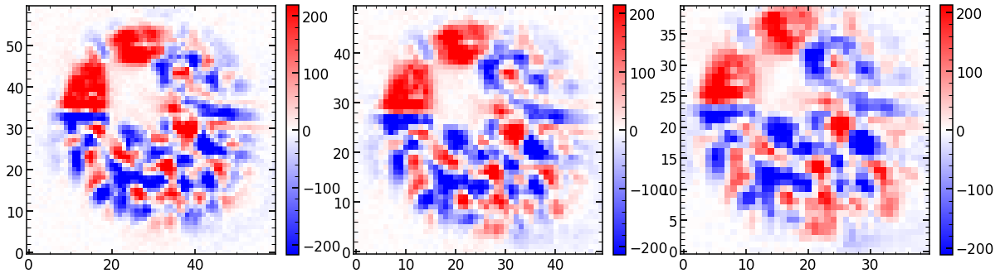

In [221]:
j=0


plt.figure(figsize=(20,10))

plt.subplot(131)
i=0
sci_image=list_of_sci_images_p[i]
plt.imshow(out_images_1_0[j][i]-sci_image,cmap='bwr',vmin=-np.max(np.abs(sci_image))/20,vmax=np.max(np.abs(sci_image))/20)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(132)
i=1
sci_image=list_of_sci_images_p[i]
plt.imshow(out_images_1_0[j][i]-sci_image,cmap='bwr',vmin=-np.max(np.abs(sci_image))/20,vmax=np.max(np.abs(sci_image))/20)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(133)
i=2
sci_image=list_of_sci_images_p[i]
plt.imshow(out_images_1_0[j][i]-sci_image,cmap='bwr',vmin=-np.max(np.abs(sci_image))/20,vmax=np.max(np.abs(sci_image))/20)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

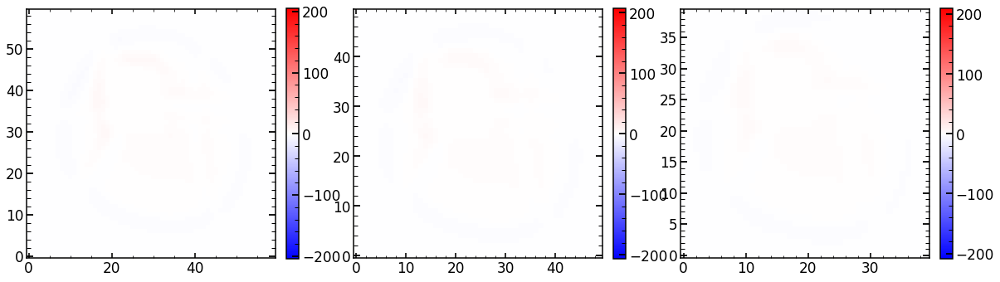

In [216]:
plt.figure(figsize=(20,10))

plt.subplot(131)
i=0
sci_image=list_of_sci_images_p[i]
plt.imshow(out_images_1_0[j][i]-pre_images_1[i],cmap='bwr',vmin=-np.max(np.abs(pre_images_1[i]))/20,vmax=np.max(np.abs(pre_images_1[i]))/20)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(132)
i=1
sci_image=list_of_sci_images_p[i]
plt.imshow(out_images_1_0[j][i]-pre_images_1[i],cmap='bwr',vmin=-np.max(np.abs(pre_images_1[i]))/20,vmax=np.max(np.abs(pre_images_1[i]))/20)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(133)
i=2
sci_image=list_of_sci_images_p[i]
plt.imshow(out_images_1_0[j][i]-pre_images_1[i],cmap='bwr',vmin=-np.max(np.abs(pre_images_1[i]))/20,vmax=np.max(np.abs(pre_images_1[i]))/20)
cbar=plt.colorbar(fraction=0.046, pad=0.04)

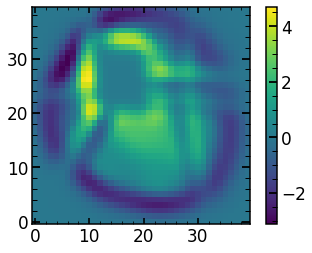

In [217]:
plt.imshow(out_images_1_0[j][i]-pre_images_1[i])
plt.colorbar()

In [ ]:
list_of_single_model_image[index_of_single_image]

In [308]:
# test if it correct
model_image_0_test=list_of_single_model_image[0]
model_image_0=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_single_model_image'+'_'+str(single_number)+'.npy',allow_pickle=True)[0]

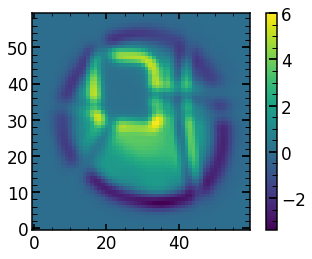

In [317]:
plt.imshow(list_of_single_model_image_test[0]-list_of_single_model_image_original[0])
plt.colorbar()


In [792]:
uber_images_normalized=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/uber_images_normalized_1_0.npy',allow_pickle=True)
uber_M0=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/uber_M0_1_0.npy',allow_pickle=True)
uber_I=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/uber_I_1.npy')
array_of_delta_z_parametrizations_None_1_0=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/array_of_delta_z_parametrizations_1_0.npy',allow_pickle=True)
array_of_delta_z_parametrizations_None_1_0=np.transpose(np.array([array_of_delta_z_parametrizations_None_1_0]))

list_of_mask_images=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/list_of_mask_images_1.npy',allow_pickle=True)
list_of_flux_images=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/list_of_flux_mask_1.npy',allow_pickle=True)

list_of_sci_images=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/list_of_sci_images_1.npy',allow_pickle=True)
list_of_var_images=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/list_of_var_images_1.npy',allow_pickle=True)

list_of_model_images=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/list_of_image_0_1_0.npy',allow_pickle=True)

first_proposal_Tokovnin=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/first_proposal_Tokovnin1_0.npy',allow_pickle=True)

out_images=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/out_images_1_0.npy',allow_pickle=True)
list_of_image=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/list_of_image_0_1_0.npy',allow_pickle=True)
list_of_image_0=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/list_of_image_0_1_0.npy',allow_pickle=True)
list_of_flux_mask=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/list_of_flux_mask_1.npy',allow_pickle=True)

dif_images=(uber_images_normalized-uber_M0)


multi_factor=first_proposal_Tokovnin/(np.array(array_of_delta_z_parametrizations_None_1_0).ravel())

multi_factor

array([ 5.95191866, -2.21984312, -1.40946282,  0.03425725, -5.04180148,
       -1.29070053,  5.03746117,  2.4061327 ,  3.45182074, -2.91475525,
       -1.83889037,  0.21549269, -7.17600827,  0.85953064,  9.22559415,
        0.8480009 , -1.04596883, -0.89365461,  8.19674475,  0.43329013,
        1.75775358, -1.69860108,  0.        ,  0.28167272, -0.01892548,
       -2.36353463,  5.79733511,  1.95670563, -9.7570084 ,  0.        ,
       -1.20865746,  0.51355906,  5.52756274, -0.69680546, -0.1882047 ,
       -0.49525894,  0.67990938, -1.58883844, -3.69569493,  0.259163  ,
        1.45416508,  0.25233587, -1.42619694,  0.22825276,  1.52529804,
       -0.5755905 , -2.2172515 ,  0.33000222, -2.44612076,  0.99331706,
        0.82319199,  0.27403969,  0.58573717, -0.10979773,  6.22482024,
        1.4989566 ,  2.93215709,  6.43491905, -1.30758437, -0.45038053,
       -0.77743109,  0.71067185,  1.44422842, -0.51883071,  2.994857  ,
       -1.3391243 ,  0.99039098, -0.78277657, -1.38512264,  0.02

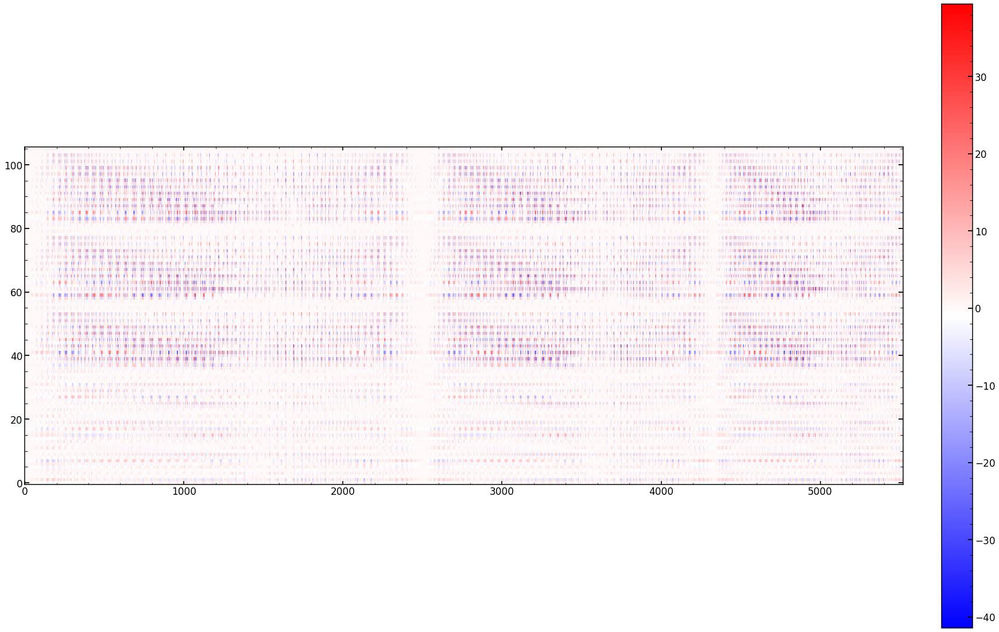

In [475]:
import matplotlib.pyplot as plt
fig,ax=plt.subplots(figsize=(30,20))

im=ax.imshow(dif_images,cmap='bwr')
ax.set_aspect(20)
cbar = plt.colorbar(im,fraction=0.046, pad=0.04)

In [514]:
multi_dif_images=np.matmul(multi_factor,dif_images)
#uber_M1m=uber_M0-multi_dif_images
uber_M1p=uber_M0+multi_dif_images

In [523]:
print(np.sum(np.abs(uber_I-uber_M0)))
#print(np.sum(np.abs(uber_I-uber_M1m)))
print(np.sum(np.abs(uber_I-uber_M1p)))

431433.8
423115.42139224045


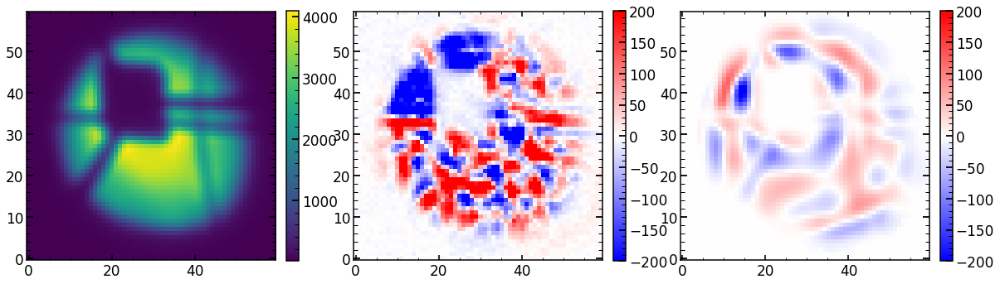

In [585]:
model_image_original_0=list_of_single_model_image_original[0]
flux_images_0=list_of_flux_images[0]

multi_dif_images_first_im=multi_dif_images[:np.sum(flux_images_0)]
uber_M1p_flux0=uber_M1p[:np.sum(flux_images_0)]

test=np.zeros((60,60))
test[flux_images_0]=multi_dif_images_first_im

dif_sci_model=list_of_sci_images[0]-list_of_model_images[0]


plt.figure(figsize=(20,10))

plt.subplot(131)
plt.imshow(model_image_original_0)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(132)
plt.imshow(dif_sci_model,cmap='bwr',vmax=200,vmin=-200)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(133)
plt.imshow(test,cmap='bwr',vmax=200,vmin=-200)
plt.colorbar(fraction=0.046, pad=0.04)


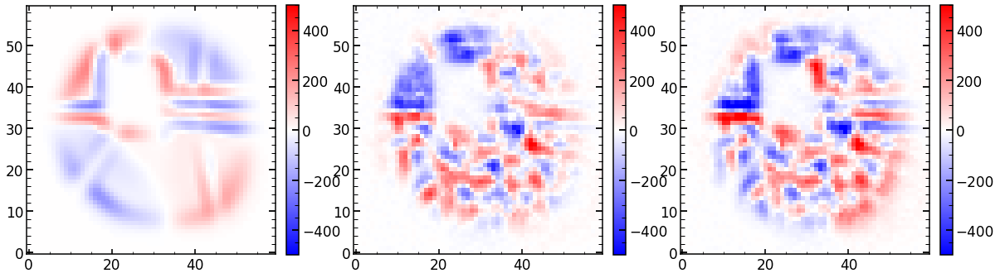

In [623]:
i=2

plt.figure(figsize=(20,10))

plt.subplot(131)
test=np.zeros((60,60))
test[flux_images_0]=dif_images[i][:2514]*100
plt.imshow(test,cmap='bwr',vmax=500,vmin=-500)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(132)

plt.imshow(dif_sci_model,cmap='bwr',vmax=500,vmin=-500)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(133)
dif_sci_model
plt.imshow(dif_sci_model+test,cmap='bwr',vmax=500,vmin=-500)
plt.colorbar(fraction=0.046, pad=0.04)

In [ ]:
plt.subplot(132)
plt.imshow(dif_sci_model-test*100,cmap='bwr',vmax=200,vmin=-200)
plt.colorbar(fraction=0.046, pad=0.04)

In [621]:
np.sum(np.abs(dif_sci_model))

205083.12

In [625]:
np.sum(np.abs(dif_sci_model))

205083.12

In [624]:
np.sum(np.abs(dif_sci_model+test))

246966.51893901825

In [563]:
x = np.ma.array(np.arange(9).reshape(3, 3), mask=[[True, False, False],
                                                  [True, False, False],
                                                  [False, False, False]])
x.filled()


x.filled(fill_value=np.array([13,16,17]))


array([[13,  1,  2],
       [13,  4,  5],
       [ 6,  7,  8]])

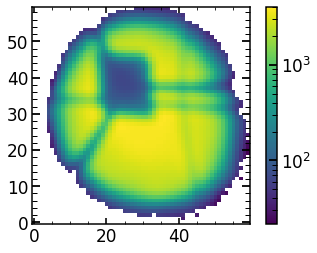

In [569]:
plt.imshow(test,norm=LogNorm())
plt.colorbar()

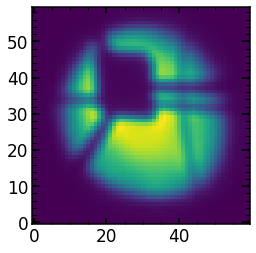

In [349]:
model_image_original_0=list_of_single_model_image_original[0]
plt.imshow(model_image_original_0)

In [401]:
list_of_flux_cut_images=[]


for i in range(3):

    sci_image=list_of_sci_images[i]
    var_image=list_of_var_images[i]

    model_image_original_0=list_of_single_model_image_original[i]

    mean_value_of_background_via_var=np.mean([np.median(var_image[0]),np.median(var_image[-1]),\
                                          np.median(var_image[:,0]),np.median(var_image[:,-1])])*3

    mean_value_of_background_via_sci=np.mean([np.median(sci_image[0]),np.median(sci_image[-1]),\
                                          np.median(sci_image[:,0]),np.median(sci_image[:,-1])])*3

    mean_value_of_background=np.max([mean_value_of_background_via_var,mean_value_of_background_via_sci])

    model_image_original_0_flux_cut=model_image_original_0[sci_image>mean_value_of_background]
    
    print(mean_value_of_background)
    list_of_flux_cut_images.append(model_image_original_0_flux_cut)

45.24108123779297
68.57638549804688
140.66696548461914


In [638]:
list_of_sci_images=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/list_of_sci_images_1.npy',allow_pickle=True)
sci_image=list_of_sci_images[0]
var_image=list_of_var_images[0]

mean_value_of_background_via_var=np.mean([np.median(var_image[0]),np.median(var_image[-1]),\
                                      np.median(var_image[:,0]),np.median(var_image[:,-1])])*100

mean_value_of_background_via_sci=np.mean([np.median(sci_image[0]),np.median(sci_image[-1]),\
                                      np.median(sci_image[:,0]),np.median(sci_image[:,-1])])*100

mean_value_of_background=np.max([mean_value_of_background_via_var,mean_value_of_background_via_sci])



print(mean_value_of_background)


flux_mask=sci_image>(mean_value_of_background)

1508.0360412597656


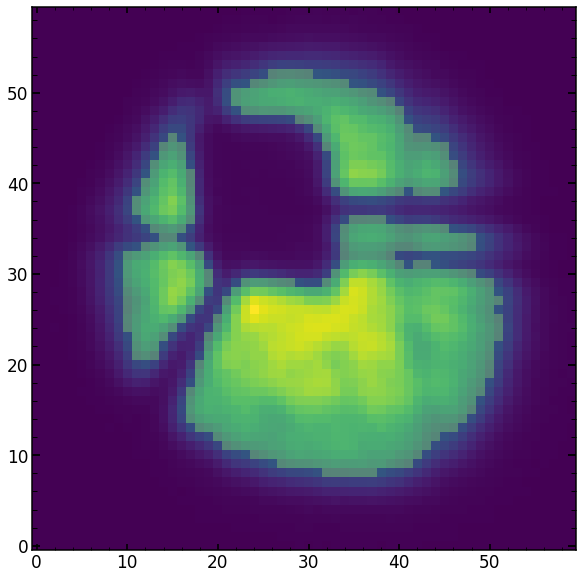

In [639]:
plt.figure(figsize=(20,10))
plt.imshow(sci_image)
plt.imshow(flux_mask,alpha=0.2)

In [402]:
[len(list_of_flux_cut_images[0]),len(list_of_flux_cut_images[1]),len(list_of_flux_cut_images[2])]

[2514, 1829, 1178]

In [397]:
np.min(list_of_flux_cut_images[0])

45.249973

In [375]:
[list_of_flux_cut_images[0][0],list_of_flux_cut_images[1][0],list_of_flux_cut_images[2][0]]

[45.38016, 70.33366, 143.84898]

In [398]:
np.min(list_of_sci_images[0][list_of_flux_images[0]])

45.47056

In [376]:
2499+2316+1972

6787

In [391]:
plt.imshow(list_of_flux_mask[0].astype(int)-list_of_flux_images[0].astype(int))

ValueError: operands could not be broadcast together with shapes (2499,) (60,60) 

In [389]:
np.sum(list_of_flux_mask[0].astype(int))

2514

In [390]:
np.sum(list_of_flux_images[0].astype(int))

2514

In [367]:
list_of_sci_images[0][list_of_flux_images[0]].shape

(2514,)

In [378]:
len(uber_images_normalized[0])

5521

In [381]:
list_of_flux_mask=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/list_of_flux_mask_1.npy',allow_pickle=True)

In [392]:
[np.sum(list_of_flux_mask[0]),np.sum(list_of_flux_mask[1]),np.sum(list_of_flux_mask[2])]

[2514, 1829, 1178]

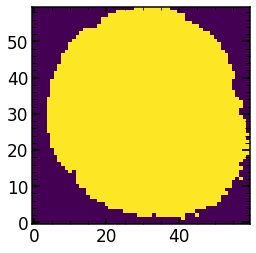

In [385]:
plt.imshow(list_of_flux_mask[0])

In [403]:
list_of_flux_cut_images[:2514]

[array([34.524864, 53.247833, 55.927223, ..., 43.258106, 40.11044 ,
        36.747086], dtype=float32),
 array([73.15303, 75.53072, 76.70875, ..., 72.07236, 70.07141, 66.79245],
       dtype=float32),
 array([158.68718, 180.70374, 202.83533, ..., 346.98044, 271.44736,
        195.4823 ], dtype=float32)]

In [433]:
69300*34.6/(10+5.4)*2

311400.0

In [428]:
 69300*35/(10+5)*2

323400.0

In [407]:
number_of_extra_zernike=56-22

list_of_delta_z_parametrizations=[]
for z_par in range(0,19*2+2*number_of_extra_zernike):
    z_par_i=z_par+4
    # if this is the parameter that change
    if np.mod(z_par_i,2)==0:
        list_of_delta_z_parametrizations.append(0.1*0.05/np.sqrt(z_par_i))
    if np.mod(z_par_i,2)==1:
        list_of_delta_z_parametrizations.append(0.05/np.sqrt(z_par_i))

In [408]:
list_of_delta_z_parametrizations

[0.0025000000000000005,
 0.022360679774997897,
 0.0020412414523193157,
 0.01889822365046136,
 0.001767766952966369,
 0.016666666666666666,
 0.00158113883008419,
 0.015075567228888182,
 0.0014433756729740647,
 0.01386750490563073,
 0.0013363062095621222,
 0.012909944487358056,
 0.0012500000000000002,
 0.012126781251816649,
 0.0011785113019775796,
 0.011470786693528088,
 0.001118033988749895,
 0.010910894511799621,
 0.0010660035817780524,
 0.01042572070285374,
 0.0010206207261596579,
 0.01,
 0.0009805806756909203,
 0.009622504486493762,
 0.0009449111825230682,
 0.009284766908852594,
 0.0009128709291752771,
 0.008980265101338746,
 0.0008838834764831845,
 0.008703882797784893,
 0.0008574929257125443,
 0.008451542547285166,
 0.0008333333333333335,
 0.008219949365267865,
 0.0008111071056538129,
 0.008006407690254357,
 0.000790569415042095,
 0.007808688094430304,
 0.0007715167498104597,
 0.007624928516630234,
 0.0007537783614444092,
 0.007453559924999299,
 0.0007372097807744858,
 0.0072932495

In [646]:
uber_images_normalized.shape

(106, 5521)

In [677]:
out_images=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/out_images_1_0.npy',allow_pickle=True)
list_of_image=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/list_of_image_0_1_0.npy',allow_pickle=True)
list_of_image_0=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/list_of_image_0_1_0.npy',allow_pickle=True)
list_of_flux_mask=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/list_of_flux_mask_1.npy',allow_pickle=True)
print(out_images.shape)
print(len(list_of_image))
print(len(list_of_flux_mask))

(106, 3)
3
3


In [678]:
list_of_flux_mask=[]

m_factor=30

for i in range(3):

    sci_image=list_of_sci_images[i]
    var_image=list_of_var_images[i]

    model_image_original_0=list_of_single_model_image_original[i]

    mean_value_of_background_via_var=np.mean([np.median(var_image[0]),np.median(var_image[-1]),\
                                          np.median(var_image[:,0]),np.median(var_image[:,-1])])*m_factor

    mean_value_of_background_via_sci=np.mean([np.median(sci_image[0]),np.median(sci_image[-1]),\
                                          np.median(sci_image[:,0]),np.median(sci_image[:,-1])])*m_factor

    mean_value_of_background=np.max([mean_value_of_background_via_var,mean_value_of_background_via_sci])

    model_image_original_0_flux_cut=sci_image>mean_value_of_background
    
    print(mean_value_of_background)
    list_of_flux_mask.append(model_image_original_0_flux_cut)

452.4108123779297
685.7638549804688
1406.6696548461914


In [679]:
list_of_images_normalized_uber=[]
list_of_images_normalized_std_uber=[]
# go over (zmax-3)*2 images
for j in range(len(out_images)):
    # two steps for what could have been achived in one, but to ease up transition from previous code 
    out_images_single_parameter_change=out_images[j]
    optpsf_list=out_images_single_parameter_change
    ### breaking here
    # flux image has to correct per image
    #  mask images that have been created in the fitting procedure
    images_normalized=[]
    for i in range(len(optpsf_list)):

        flux_mask=list_of_flux_mask[i]
        images_normalized.append((optpsf_list[i][flux_mask]).ravel())                
        # old double-normalizing code
        #images_normalized.append((optpsf_list[i][flux_mask]/np.sum(optpsf_list[i][flux_mask])).ravel())

    images_normalized_flat=[item for sublist in images_normalized for item in sublist]  
    images_normalized_flat=np.array(images_normalized_flat)
    #images_normalized_flat=np.array(images_normalized_flat)/len(optpsf_list)        

    # list of (zmax-3)*2 raveled images
    list_of_images_normalized_uber.append(images_normalized_flat)

    # same but divided by STD
    images_normalized_std=[]
    for i in range(len(optpsf_list)):   
        # seems that I am a bit more verbose here with my definitions
        optpsf_list_i=optpsf_list[i]


        #images_normalized_std.append((optpsf_list_i_STD[flux_mask]/np.sum(optpsf_list_i_STD[flux_mask])).ravel())

    # join all images together
    #images_normalized_std_flat=[item for sublist in images_normalized_std for item in sublist]  
    # normalize so that the sum is still one
    #images_normalized_std_flat=np.array(images_normalized_std_flat)/len(optpsf_list)

    #list_of_images_normalized_std_uber.append(images_normalized_std_flat)

# create uber images_normalized,images_normalized_std    
# images that have zmax*2 rows and very large number of columns (number of non-masked pixels from all N images)
uber_images_normalized=np.array(list_of_images_normalized_uber) 

In [681]:
list_of_M0=[]

for i in range(len(list_of_image_0)):

    image_0=list_of_image_0[i]

    flux_mask=list_of_flux_mask[i]
    # what is list_of_mask_images?

    M0=image_0[flux_mask].ravel()            
    #M0=((image_0[flux_mask])/np.sum(image_0[flux_mask])).ravel()

    #M0_std=((image_0_std[flux_mask])/np.sum(image_0_std[flux_mask])).ravel()

    list_of_M0.append(M0)


# join all M0,M0_std from invidiual images into one uber M0,M0_std
uber_M0=[item for sublist in list_of_M0 for item in sublist]


uber_M0=np.array(uber_M0)


In [683]:
list_of_I=[]
list_of_I_std=[]    
list_of_std_image=[]
for i in range(len(list_of_sci_images)):

    sci_image=list_of_sci_images[i]

    flux_mask=list_of_flux_mask[i]


    I=sci_image[flux_mask].ravel()        
    #I=((sci_image[flux_mask])/np.sum(sci_image[flux_mask])).ravel()

    #I_std=((sci_image_std[flux_mask])/np.sum(sci_image_std[flux_mask])).ravel()

    list_of_I.append(I)


# join all I,I_std from all individual images into one uber I,I_std  
uber_I=[item for sublist in list_of_I for item in sublist]

In [684]:
H=np.transpose(np.array((uber_images_normalized-uber_M0))/array_of_delta_z_parametrizations_None_1_0) 
singlular_parameters=np.arange(H.shape[1])[np.abs((np.mean(H,axis=0)))<0.01]
non_singlular_parameters=np.arange(H.shape[1])[np.abs((np.mean(H,axis=0)))>0.01]
H=H[:,non_singlular_parameters]
HHt=np.matmul(np.transpose(H),H)
invHHt=np.linalg.inv(HHt)        
invHHtHt=np.matmul(invHHt,np.transpose(H))
first_proposal_Tokovnin=np.matmul(invHHtHt,uber_I-uber_M0)

In [685]:
first_proposal_Tokovnin

array([-0.19035298, -0.80057834,  0.0584672 ,  0.19412064,  0.03181859,
        0.12662785, -0.00581161, -0.00358946,  0.04343371,  0.084969  ,
        0.03516305,  0.15510459,  0.02195311,  0.12805259,  0.02048947,
        0.03176784, -0.01385704, -0.06022595, -0.03630493, -0.16477458,
       -0.02067602, -0.12950784, -0.07015181, -0.31967863,  0.01125419,
        0.014077  , -0.0066468 , -0.02311516,  0.01921285,  0.09313277,
        0.01961807,  0.0750792 , -0.02848723, -0.13143157, -0.01441755,
       -0.06123049, -0.00112569, -0.02263625,  0.00670995,  0.04196814,
        0.00086214,  0.00090112,  0.00899665,  0.04232643, -0.0009863 ,
       -0.01063237,  0.00644305,  0.0353007 ,  0.00173126,  0.0211963 ,
       -0.01958249, -0.07544209,  0.01906287,  0.06940198, -0.12511717,
       -0.49885484,  0.07855186,  0.38828351,  0.00238042,  0.00620828,
       -0.00378462, -0.0050256 , -0.00678534, -0.03457263, -0.00503475,
       -0.03648897,  0.0014898 , -0.00194924, -0.0026306 , -0.00

In [687]:
np.arange(3,120,3)

array([  3,   6,   9,  12,  15,  18,  21,  24,  27,  30,  33,  36,  39,
        42,  45,  48,  51,  54,  57,  60,  63,  66,  69,  72,  75,  78,
        81,  84,  87,  90,  93,  96,  99, 102, 105, 108, 111, 114, 117])

In [725]:

array_of_first_proposal_Tokovnin=np.zeros((39,106))
list_of_first_proposal_Tokovnin=[]

for m in range(len(np.arange(3,120,3))):

    m_factor=np.arange(3,120,3)[m]
    list_of_flux_mask=[]
    for i in range(3):

        sci_image=list_of_sci_images[i]
        var_image=list_of_var_images[i]

        model_image_original_0=list_of_single_model_image_original[i]

        mean_value_of_background_via_var=np.mean([np.median(var_image[0]),np.median(var_image[-1]),\
                                              np.median(var_image[:,0]),np.median(var_image[:,-1])])*m_factor

        mean_value_of_background_via_sci=np.mean([np.median(sci_image[0]),np.median(sci_image[-1]),\
                                              np.median(sci_image[:,0]),np.median(sci_image[:,-1])])*m_factor

        mean_value_of_background=np.max([mean_value_of_background_via_var,mean_value_of_background_via_sci])

        model_image_original_0_flux_cut=sci_image>mean_value_of_background

        #print(mean_value_of_background)
        list_of_flux_mask.append(model_image_original_0_flux_cut)


    list_of_images_normalized_uber=[]
    list_of_images_normalized_std_uber=[]
    # go over (zmax-3)*2 images
    for j in range(len(out_images)):
        # two steps for what could have been achived in one, but to ease up transition from previous code 
        out_images_single_parameter_change=out_images[j]
        optpsf_list=out_images_single_parameter_change
        ### breaking here
        # flux image has to correct per image
        #  mask images that have been created in the fitting procedure
        images_normalized=[]
        for i in range(len(optpsf_list)):

            flux_mask=list_of_flux_mask[i]
            images_normalized.append((optpsf_list[i][flux_mask]).ravel())                
            # old double-normalizing code
            #images_normalized.append((optpsf_list[i][flux_mask]/np.sum(optpsf_list[i][flux_mask])).ravel())

        images_normalized_flat=[item for sublist in images_normalized for item in sublist]  
        images_normalized_flat=np.array(images_normalized_flat)
        #images_normalized_flat=np.array(images_normalized_flat)/len(optpsf_list)        

        # list of (zmax-3)*2 raveled images
        list_of_images_normalized_uber.append(images_normalized_flat)

        # same but divided by STD
        images_normalized_std=[]
        for i in range(len(optpsf_list)):   
            # seems that I am a bit more verbose here with my definitions
            optpsf_list_i=optpsf_list[i]


            #images_normalized_std.append((optpsf_list_i_STD[flux_mask]/np.sum(optpsf_list_i_STD[flux_mask])).ravel())

        # join all images together
        #images_normalized_std_flat=[item for sublist in images_normalized_std for item in sublist]  
        # normalize so that the sum is still one
        #images_normalized_std_flat=np.array(images_normalized_std_flat)/len(optpsf_list)

        #list_of_images_normalized_std_uber.append(images_normalized_std_flat)

    # create uber images_normalized,images_normalized_std    
    # images that have zmax*2 rows and very large number of columns (number of non-masked pixels from all N images)
    uber_images_normalized=np.array(list_of_images_normalized_uber) 


    list_of_M0=[]

    for i in range(len(list_of_image_0)):

        image_0=list_of_image_0[i]

        flux_mask=list_of_flux_mask[i]
        # what is list_of_mask_images?

        M0=image_0[flux_mask].ravel()            
        #M0=((image_0[flux_mask])/np.sum(image_0[flux_mask])).ravel()

        #M0_std=((image_0_std[flux_mask])/np.sum(image_0_std[flux_mask])).ravel()

        list_of_M0.append(M0)


    # join all M0,M0_std from invidiual images into one uber M0,M0_std
    uber_M0=[item for sublist in list_of_M0 for item in sublist]


    uber_M0=np.array(uber_M0)

    list_of_I=[]
    list_of_I_std=[]    
    list_of_std_image=[]
    for i in range(len(list_of_sci_images)):

        sci_image=list_of_sci_images[i]

        flux_mask=list_of_flux_mask[i]


        I=sci_image[flux_mask].ravel()        
        #I=((sci_image[flux_mask])/np.sum(sci_image[flux_mask])).ravel()

        #I_std=((sci_image_std[flux_mask])/np.sum(sci_image_std[flux_mask])).ravel()

        list_of_I.append(I)


    print('m_factor: '+str(m_factor)+str(invHHtHt.shape))    
    
    # join all I,I_std from all individual images into one uber I,I_std  
    uber_I=[item for sublist in list_of_I for item in sublist]

    H=np.transpose(np.array((uber_images_normalized-uber_M0))/array_of_delta_z_parametrizations_None_1_0) 
    singlular_parameters=np.arange(H.shape[1])[np.abs((np.mean(H,axis=0)))<0.01]
    non_singlular_parameters=np.arange(H.shape[1])[np.abs((np.mean(H,axis=0)))>0.01]
    H=H[:,non_singlular_parameters]
    HHt=np.matmul(np.transpose(H),H)
    invHHt=np.linalg.inv(HHt)        
    invHHtHt=np.matmul(invHHt,np.transpose(H))
    first_proposal_Tokovnin=np.matmul(invHHtHt,uber_I-uber_M0)
    
    # if you have removed certain parameters because of the singularity, return them here, with no change
    if len(singlular_parameters)>0:
        for i in range(len(singlular_parameters)):
            first_proposal_Tokovnin=np.insert(first_proposal_Tokovnin,singlular_parameters[i],0)


    print(len(first_proposal_Tokovnin))
    
    array_of_first_proposal_Tokovnin[m]=first_proposal_Tokovnin
    
    


m_factor: 3(106, 1233)
106
m_factor: 6(105, 5521)
106
m_factor: 9(106, 4749)
106
m_factor: 12(106, 4393)
106
m_factor: 15(106, 4142)
106
m_factor: 18(106, 3949)
106
m_factor: 21(106, 3783)
106
m_factor: 24(106, 3641)
106
m_factor: 27(106, 3512)
106
m_factor: 30(106, 3398)
106
m_factor: 33(106, 3284)
106
m_factor: 36(105, 3187)
106
m_factor: 39(106, 3071)
106
m_factor: 42(106, 2966)
106
m_factor: 45(106, 2852)
106
m_factor: 48(106, 2762)
106
m_factor: 51(106, 2665)
106
m_factor: 54(106, 2576)
106
m_factor: 57(106, 2487)
106
m_factor: 60(106, 2399)
106
m_factor: 63(106, 2312)
106
m_factor: 66(106, 2238)
106
m_factor: 69(106, 2148)
106
m_factor: 72(106, 2078)
106
m_factor: 75(106, 2022)
106
m_factor: 78(106, 1957)
106
m_factor: 81(106, 1904)
106
m_factor: 84(106, 1837)
106
m_factor: 87(106, 1785)
106
m_factor: 90(106, 1721)
106
m_factor: 93(106, 1661)
106
m_factor: 96(106, 1614)
106
m_factor: 99(106, 1564)
106
m_factor: 102(106, 1525)
106
m_factor: 105(106, 1469)
106
m_factor: 108(106, 14

In [731]:
np.max(array_of_first_proposal_Tokovnin[0])

0.4365396383501784

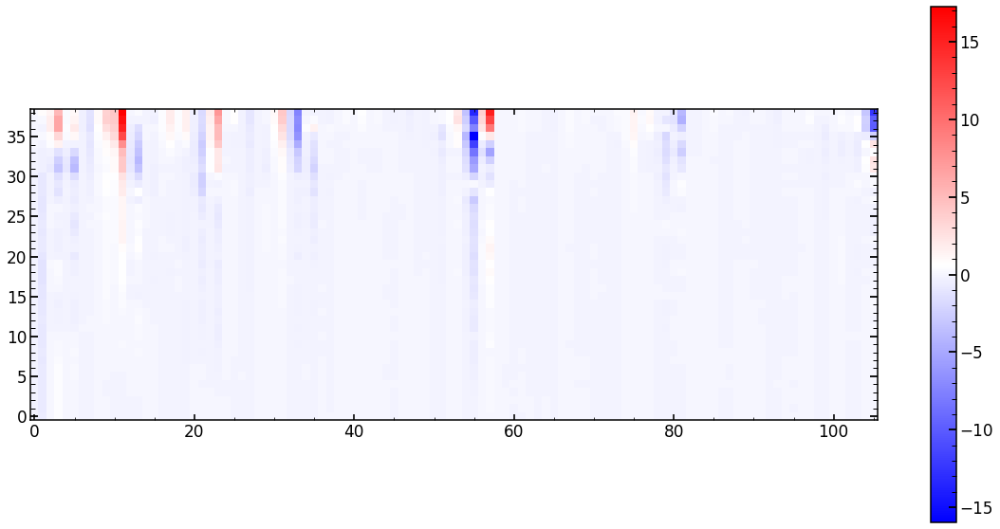

In [732]:
plt.figure(figsize=(20,10))
plt.imshow(array_of_first_proposal_Tokovnin,cmap='bwr')
plt.colorbar()

In [514]:
multi_dif_images=np.matmul(multi_factor,dif_images)
#uber_M1m=uber_M0-multi_dif_images
uber_M1p=uber_M0+multi_dif_images

In [523]:
print(np.sum(np.abs(uber_I-uber_M0)))
#print(np.sum(np.abs(uber_I-uber_M1m)))
print(np.sum(np.abs(uber_I-uber_M1p)))

431433.8
423115.42139224045


In [ ]:

model_image_original_0=list_of_single_model_image_original[0]
flux_images_0=list_of_flux_mask[0]

# take difference images, only the parts covered by flux
multi_dif_images_first_im=multi_dif_images[:np.sum(flux_images_0)]
uber_M1p_flux0=uber_M1p[:np.sum(flux_images_0)]

test=np.zeros((60,60))
test[flux_images_0]=multi_dif_images_first_im

# difference between science image and the input model image
dif_sci_model=list_of_sci_images[0]-list_of_model_images[0]


plt.figure(figsize=(20,10))

vmax_v=np.max(model_image_original_0)/10

In [ ]:
dif_images=(uber_images_normalized-uber_M0)


multi_factor=first_proposal_Tokovnin/(np.array(array_of_delta_z_parametrizations_None_1_0).ravel())


In [34]:

m=22

m_factor=np.arange(3,120,3)[m]

print('m_factor: '+str(m_factor))

list_of_flux_mask=[]
for i in range(9):
    sci_image=list_of_sci_images[i]
    var_image=list_of_var_images[i]

    model_image_original_0=list_of_single_model_image_original[i]

    mean_value_of_background_via_var=np.mean([np.median(var_image[0]),np.median(var_image[-1]),\
                                          np.median(var_image[:,0]),np.median(var_image[:,-1])])*m_factor

    mean_value_of_background_via_sci=np.mean([np.median(sci_image[0]),np.median(sci_image[-1]),\
                                          np.median(sci_image[:,0]),np.median(sci_image[:,-1])])*m_factor

    mean_value_of_background=np.max([mean_value_of_background_via_var,mean_value_of_background_via_sci])

    model_image_original_0_flux_cut=sci_image>mean_value_of_background

    #print(mean_value_of_background)
    list_of_flux_mask.append(model_image_original_0_flux_cut)

dif_images=(uber_images_normalized-uber_M0)
first_proposal_Tokovnin=array_of_first_proposal_Tokovnin[m]
multi_factor=first_proposal_Tokovnin/(np.array(array_of_delta_z_parametrizations_None_1_0).ravel())

multi_dif_images=np.matmul(multi_factor,dif_images)

model_image_original_0=list_of_single_model_image_original[0]
flux_images_0=list_of_flux_mask[0]

# take difference images, only the parts covered by flux
multi_dif_images_first_im=multi_dif_images[:np.sum(flux_images_0)]
uber_M1p_flux0=uber_M1p[:np.sum(flux_images_0)]

test=np.zeros((60,60))
test[flux_images_0]=multi_dif_images_first_im

# difference between science image and the input model image
dif_sci_model=list_of_sci_images[0]-list_of_model_images[0]


plt.figure(figsize=(20,10))

plt.subplot(131)
plt.imshow(model_image_original_0)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(132)
plt.imshow(dif_sci_model,cmap='bwr',vmax=200,vmin=-200)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(133)
plt.imshow(test,cmap='bwr',vmax=200,vmin=-200)
plt.colorbar(fraction=0.046, pad=0.04)


m_factor: 69


NameError: name 'list_of_single_model_image_original' is not defined

In [64]:
    m=38
    m_factor=np.arange(3,120,3)[m]
    list_of_flux_mask=[]
    for i in range(9):

        sci_image=list_of_sci_images[i]
        var_image=list_of_var_images[i]

        model_image_original_0=list_of_single_model_image_original[i]

        mean_value_of_background_via_var=np.mean([np.median(var_image[0]),np.median(var_image[-1]),\
                                              np.median(var_image[:,0]),np.median(var_image[:,-1])])*m_factor

        mean_value_of_background_via_sci=np.mean([np.median(sci_image[0]),np.median(sci_image[-1]),\
                                              np.median(sci_image[:,0]),np.median(sci_image[:,-1])])*m_factor

        mean_value_of_background=np.max([mean_value_of_background_via_var,mean_value_of_background_via_sci])

        model_image_original_0_flux_cut=sci_image>mean_value_of_background

        #print(mean_value_of_background)
        list_of_flux_mask.append(model_image_original_0_flux_cut)


    list_of_images_normalized_uber=[]
    list_of_images_normalized_std_uber=[]
    # go over (zmax-3)*2 images
    for j in range(len(out_images)):
        # two steps for what could have been achived in one, but to ease up transition from previous code 
        out_images_single_parameter_change=out_images[j]
        optpsf_list=out_images_single_parameter_change
        ### breaking here
        # flux image has to correct per image
        #  mask images that have been created in the fitting procedure
        images_normalized=[]
        for i in range(len(optpsf_list)):

            flux_mask=list_of_flux_mask[i]
            images_normalized.append((optpsf_list[i][flux_mask]).ravel())                
            # old double-normalizing code
            #images_normalized.append((optpsf_list[i][flux_mask]/np.sum(optpsf_list[i][flux_mask])).ravel())

        images_normalized_flat=[item for sublist in images_normalized for item in sublist]  
        images_normalized_flat=np.array(images_normalized_flat)
        #images_normalized_flat=np.array(images_normalized_flat)/len(optpsf_list)        

        # list of (zmax-3)*2 raveled images
        list_of_images_normalized_uber.append(images_normalized_flat)

        # same but divided by STD
        images_normalized_std=[]
        for i in range(len(optpsf_list)):   
            # seems that I am a bit more verbose here with my definitions
            optpsf_list_i=optpsf_list[i]


            #images_normalized_std.append((optpsf_list_i_STD[flux_mask]/np.sum(optpsf_list_i_STD[flux_mask])).ravel())

        # join all images together
        #images_normalized_std_flat=[item for sublist in images_normalized_std for item in sublist]  
        # normalize so that the sum is still one
        #images_normalized_std_flat=np.array(images_normalized_std_flat)/len(optpsf_list)

        #list_of_images_normalized_std_uber.append(images_normalized_std_flat)

    # create uber images_normalized,images_normalized_std    
    # images that have zmax*2 rows and very large number of columns (number of non-masked pixels from all N images)
    uber_images_normalized=np.array(list_of_images_normalized_uber) 


    list_of_M0=[]

    for i in range(len(list_of_image_0)):

        image_0=list_of_image_0[i]

        flux_mask=list_of_flux_mask[i]
        # what is list_of_mask_images?

        M0=image_0[flux_mask].ravel()            
        #M0=((image_0[flux_mask])/np.sum(image_0[flux_mask])).ravel()

        #M0_std=((image_0_std[flux_mask])/np.sum(image_0_std[flux_mask])).ravel()

        list_of_M0.append(M0)


    # join all M0,M0_std from invidiual images into one uber M0,M0_std
    uber_M0=[item for sublist in list_of_M0 for item in sublist]


    uber_M0=np.array(uber_M0)

    list_of_I=[]
    list_of_I_std=[]    
    list_of_std_image=[]
    for i in range(len(list_of_sci_images)):

        sci_image=list_of_sci_images[i]

        flux_mask=list_of_flux_mask[i]


        I=sci_image[flux_mask].ravel()        
        #I=((sci_image[flux_mask])/np.sum(sci_image[flux_mask])).ravel()

        #I_std=((sci_image_std[flux_mask])/np.sum(sci_image_std[flux_mask])).ravel()

        list_of_I.append(I)


    print('m_factor: '+str(m_factor)+' '+str(invHHtHt.shape))    
    
    # join all I,I_std from all individual images into one uber I,I_std  
    uber_I=[item for sublist in list_of_I for item in sublist]

    H=np.transpose(np.array((uber_images_normalized-uber_M0))/array_of_delta_z_parametrizations_None_1_0) 
    singlular_parameters=np.arange(H.shape[1])[np.abs((np.mean(H,axis=0)))<0.01]
    non_singlular_parameters=np.arange(H.shape[1])[np.abs((np.mean(H,axis=0)))>0.01]
    H=H[:,non_singlular_parameters]
    HHt=np.matmul(np.transpose(H),H)
    invHHt=np.linalg.inv(HHt)        
    invHHtHt=np.matmul(invHHt,np.transpose(H))
    first_proposal_Tokovnin=np.matmul(invHHtHt,uber_I-uber_M0)
    
    # if you have removed certain parameters because of the singularity, return them here, with no change
    if len(singlular_parameters)>0:
        for i in range(len(singlular_parameters)):
            first_proposal_Tokovnin=np.insert(first_proposal_Tokovnin,singlular_parameters[i],0)


    print(len(first_proposal_Tokovnin))
    
    array_of_first_proposal_Tokovnin[m]=first_proposal_Tokovnin

NameError: name 'list_of_single_model_image_original' is not defined

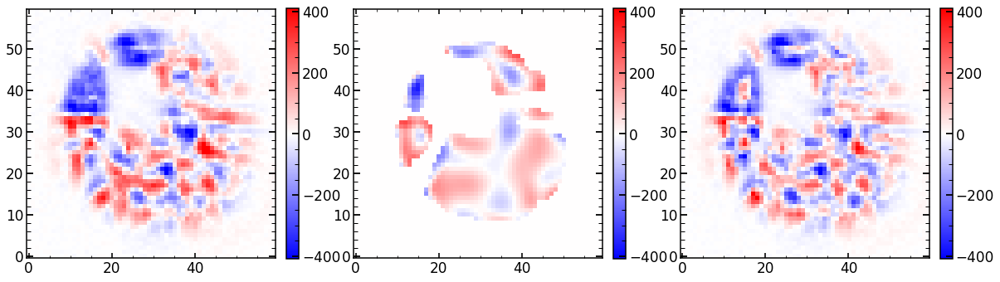

In [803]:
dif_images=(uber_images_normalized-uber_M0)
first_proposal_Tokovnin=array_of_first_proposal_Tokovnin[m]
multi_factor=first_proposal_Tokovnin/(np.array(array_of_delta_z_parametrizations_None_1_0).ravel())

multi_dif_images=np.matmul(multi_factor,dif_images)

model_image_original_0=list_of_single_model_image_original[0]
flux_images_0=list_of_flux_mask[0]

# take difference images, only the parts covered by flux
multi_dif_images_first_im=multi_dif_images[:np.sum(flux_images_0)]
uber_M1p_flux0=uber_M1p[:np.sum(flux_images_0)]

test=np.zeros((60,60))
test[flux_images_0]=multi_dif_images_first_im

# difference between science image and the input model image
dif_sci_model=list_of_sci_images[0]-list_of_model_images[0]


plt.figure(figsize=(20,10))

vmax_v=np.max(model_image_original_0)/10

plt.subplot(131)
plt.imshow(dif_sci_model,cmap='bwr',vmax=vmax_v,vmin=-vmax_v)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(132)
plt.imshow(test,cmap='bwr',vmax=vmax_v,vmin=-vmax_v)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(133)
plt.imshow(dif_sci_model-test,cmap='bwr',vmax=vmax_v,vmin=-vmax_v)
plt.colorbar(fraction=0.046, pad=0.04)


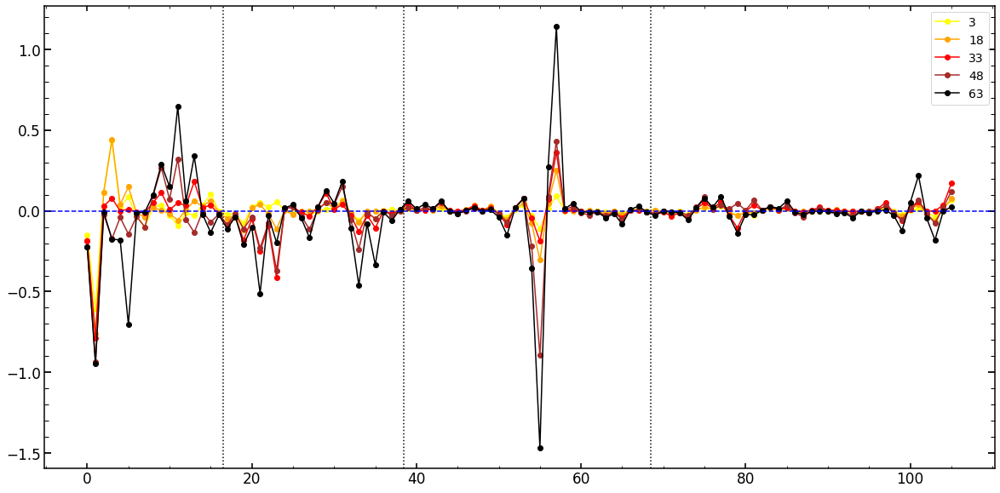

In [795]:
plt.figure(figsize=(20,10))

color=['yellow','orange','red','brown','black']
for m in [0,1,2,3,4]:
    
    Tokovinin_m=[0,5,10,15,20]
    
    m_factor=np.arange(3,120,3)[Tokovinin_m[m]]
    
    first_proposal_Tokovnin=array_of_first_proposal_Tokovnin[Tokovinin_m[m]]
    plt.plot(first_proposal_Tokovnin,marker='o',color=color[m],label=str(m_factor))
plt.axvline(16.5,color='black',ls=':')
plt.axvline(38.5,color='black',ls=':')
plt.axvline(68.5,color='black',ls=':')
plt.legend()

plt.axhline(0,color='blue',ls='--')

In [183]:
best_result=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Test/best_result.npy',allow_pickle=True)

In [185]:
len(best_result[2])

9

In [190]:
len(best_result)

8

In [84]:
uber_images_normalized_1=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/uber_images_normalized_1_0.npy',allow_pickle=True)
uber_M0_1=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/uber_M0_1_0.npy',allow_pickle=True)
first_proposal_Tokovnin_1=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/first_proposal_Tokovnin1_0.npy',allow_pickle=True)
best_result_1=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/best_result_1.npy',allow_pickle=True)


uber_I=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/uber_I_1.npy')
array_of_delta_z_parametrizations_None_1_0=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/array_of_delta_z_parametrizations_1_0.npy',allow_pickle=True)
array_of_delta_z_parametrizations_None_1_0=np.transpose(np.array([array_of_delta_z_parametrizations_None_1_0]))

list_of_mask_images=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/list_of_mask_images_1.npy',allow_pickle=True)
list_of_flux_images=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/list_of_flux_mask_1.npy',allow_pickle=True)
list_of_flux_images_2=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/list_of_flux_mask_2.npy',allow_pickle=True)

H_1=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/H_1_0.npy',allow_pickle=True)
H_2=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/H_2_0.npy',allow_pickle=True)


list_of_sci_images=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/list_of_sci_images_1.npy',allow_pickle=True)
list_of_var_images=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/list_of_var_images_1.npy',allow_pickle=True)

list_of_model_images=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/list_of_image_0_1_0.npy',allow_pickle=True)

first_proposal_Tokovnin=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/first_proposal_Tokovnin1_0.npy',allow_pickle=True)

out_images=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/out_images_1_0.npy',allow_pickle=True)
list_of_image=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/list_of_image_0_1_0.npy',allow_pickle=True)
list_of_image_0=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/list_of_image_0_1_0.npy',allow_pickle=True)
list_of_flux_mask=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/list_of_flux_mask_1.npy',allow_pickle=True)

global_change_2=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/global_change_2_0.npy',allow_pickle=True)
global_change_proposed_2=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/global_change_proposed_2_0.npy',allow_pickle=True)

array_of_wavefront_changes_2=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/array_of_wavefront_changes_2_0.npy',allow_pickle=True)

dif_images=(uber_images_normalized-uber_M0)


multi_factor=first_proposal_Tokovnin/(np.array(array_of_delta_z_parametrizations_None_1_0).ravel())


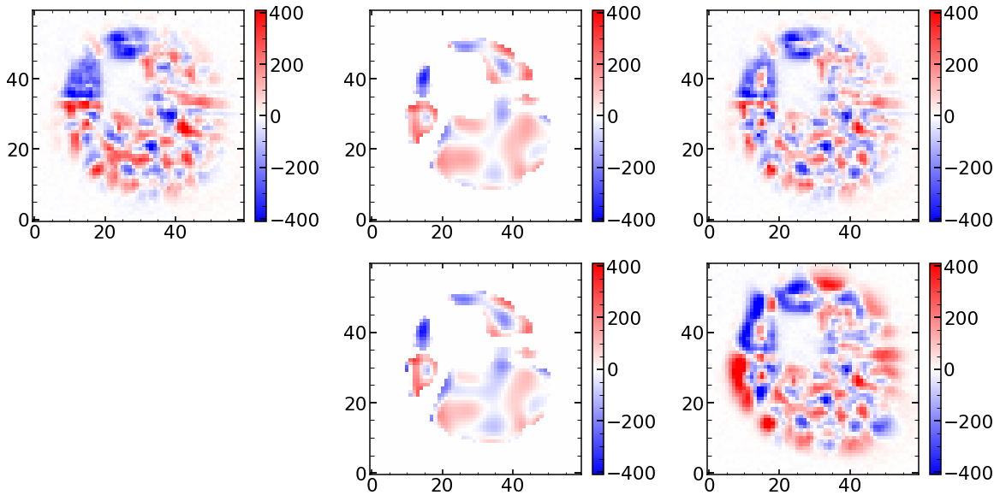

In [99]:
m_factor=120
list_of_flux_mask=[]
for i in range(9):
    sci_image=list_of_sci_images[i]
    var_image=list_of_var_images[i]



    mean_value_of_background_via_var=np.mean([np.median(var_image[0]),np.median(var_image[-1]),\
                                          np.median(var_image[:,0]),np.median(var_image[:,-1])])*m_factor

    mean_value_of_background_via_sci=np.mean([np.median(sci_image[0]),np.median(sci_image[-1]),\
                                          np.median(sci_image[:,0]),np.median(sci_image[:,-1])])*m_factor

    mean_value_of_background=np.max([mean_value_of_background_via_var,mean_value_of_background_via_sci])

    model_image_original_0_flux_cut=sci_image>mean_value_of_background

    #print(mean_value_of_background)
    list_of_flux_mask.append(model_image_original_0_flux_cut)



dif_images=(uber_images_normalized_1-uber_M0_1)
multi_factor=first_proposal_Tokovnin_1/(np.array(array_of_delta_z_parametrizations_None_1_0).ravel())
multi_dif_images=np.matmul(multi_factor,dif_images)

pre_images=best_result_1[5]
final_images=best_result_1[6]

dif_sci_model=list_of_sci_images[0]-pre_images[0]
dif_sci_model_final=list_of_sci_images[0]-final_images[0]

flux_images_0=list_of_flux_mask[0]

# take difference images, only the parts covered by flux
multi_dif_images_first_im=multi_dif_images[:np.sum(flux_images_0)]
uber_M1p_flux0=uber_M0_1[:np.sum(flux_images_0)]

test=np.zeros((60,60))
test[flux_images_0]=multi_dif_images_first_im

actual_change=np.zeros((60,60))
actual_change[flux_images_0]=dif_sci_model[flux_images_0]-dif_sci_model_final[flux_images_0]


vmax_v=np.max(pre_images[0])/10
plt.figure(figsize=(20,10))



plt.subplot(231)
plt.title('')
plt.imshow(dif_sci_model,cmap='bwr',vmax=vmax_v,vmin=-vmax_v)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(232)

plt.imshow(test,cmap='bwr',vmax=vmax_v,vmin=-vmax_v)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(233)
plt.imshow(dif_sci_model-test,cmap='bwr',vmax=vmax_v,vmin=-vmax_v)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(235)
plt.imshow(actual_change,cmap='bwr',vmax=vmax_v,vmin=-vmax_v)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(236)
plt.imshow(dif_sci_model_final,cmap='bwr',vmax=vmax_v,vmin=-vmax_v)
plt.colorbar(fraction=0.046, pad=0.04)

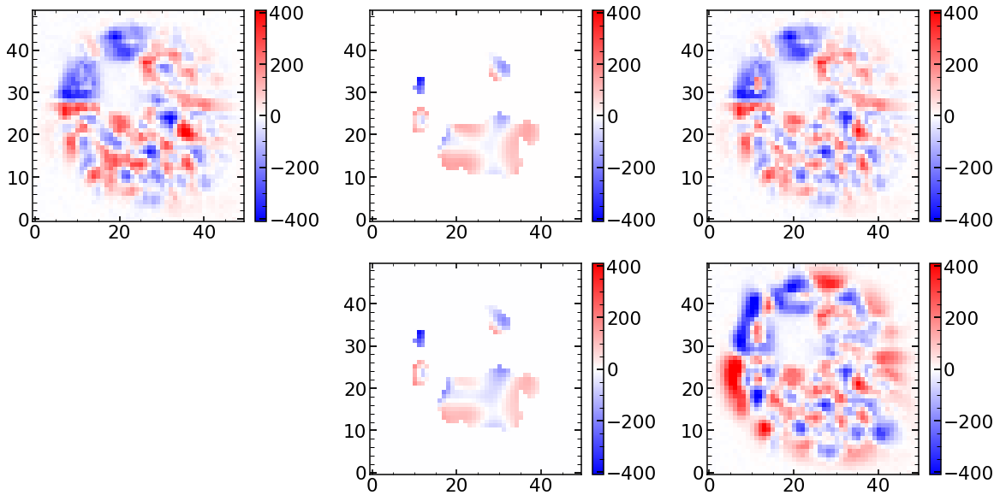

In [118]:
m_factor=120
list_of_flux_mask=[]
for i in range(9):
    sci_image=list_of_sci_images[i]
    var_image=list_of_var_images[i]



    mean_value_of_background_via_var=np.mean([np.median(var_image[0]),np.median(var_image[-1]),\
                                          np.median(var_image[:,0]),np.median(var_image[:,-1])])*m_factor

    mean_value_of_background_via_sci=np.mean([np.median(sci_image[0]),np.median(sci_image[-1]),\
                                          np.median(sci_image[:,0]),np.median(sci_image[:,-1])])*m_factor

    mean_value_of_background=np.max([mean_value_of_background_via_var,mean_value_of_background_via_sci])

    model_image_original_0_flux_cut=sci_image>mean_value_of_background

    #print(mean_value_of_background)
    list_of_flux_mask.append(model_image_original_0_flux_cut)



dif_images=(uber_images_normalized_1-uber_M0_1)
multi_factor=first_proposal_Tokovnin_1/(np.array(array_of_delta_z_parametrizations_None_1_0).ravel())
multi_dif_images=np.matmul(multi_factor,dif_images)

pre_images=best_result_1[5]
final_images=best_result_1[6]

dif_sci_model=list_of_sci_images[1]-pre_images[1]
dif_sci_model_final=list_of_sci_images[1]-final_images[1]

flux_images_0=list_of_flux_mask[0]
flux_images_1=list_of_flux_mask[1]

# take difference images, only the parts covered by flux
multi_dif_images_first_im=multi_dif_images[np.sum(flux_images_0):np.sum(flux_images_0)+np.sum(flux_images_1)]
uber_M1p_flux0=uber_M0_1[np.sum(flux_images_0):np.sum(flux_images_0)+np.sum(flux_images_1)]

test=np.zeros((50,50))
test[flux_images_1]=multi_dif_images_first_im

actual_change=np.zeros((50,50))
actual_change[flux_images_1]=dif_sci_model[flux_images_1]-dif_sci_model_final[flux_images_1]


vmax_v=np.max(pre_images[0])/10
plt.figure(figsize=(20,10))



plt.subplot(231)
plt.title('')
plt.imshow(dif_sci_model,cmap='bwr',vmax=vmax_v,vmin=-vmax_v)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(232)

plt.imshow(test,cmap='bwr',vmax=vmax_v,vmin=-vmax_v)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(233)
plt.imshow(dif_sci_model-test,cmap='bwr',vmax=vmax_v,vmin=-vmax_v)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(235)
plt.imshow(actual_change,cmap='bwr',vmax=vmax_v,vmin=-vmax_v)
plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(236)
plt.imshow(dif_sci_model_final,cmap='bwr',vmax=vmax_v,vmin=-vmax_v)
plt.colorbar(fraction=0.046, pad=0.04)

In [ ]:
model.create_chi_2_almost()

In [127]:
nsteps=21
-(120-3)/(nsteps-1)

-5.85

In [131]:
array_of_multi_background_factors=np.concatenate((np.arange(80,3,-(80-3)/(nsteps+1)),np.array([3])) )
array_of_multi_background_factors

array([80. , 76.5, 73. , 69.5, 66. , 62.5, 59. , 55.5, 52. , 48.5, 45. ,
       41.5, 38. , 34.5, 31. , 27.5, 24. , 20.5, 17. , 13.5, 10. ,  6.5,
        3. ])

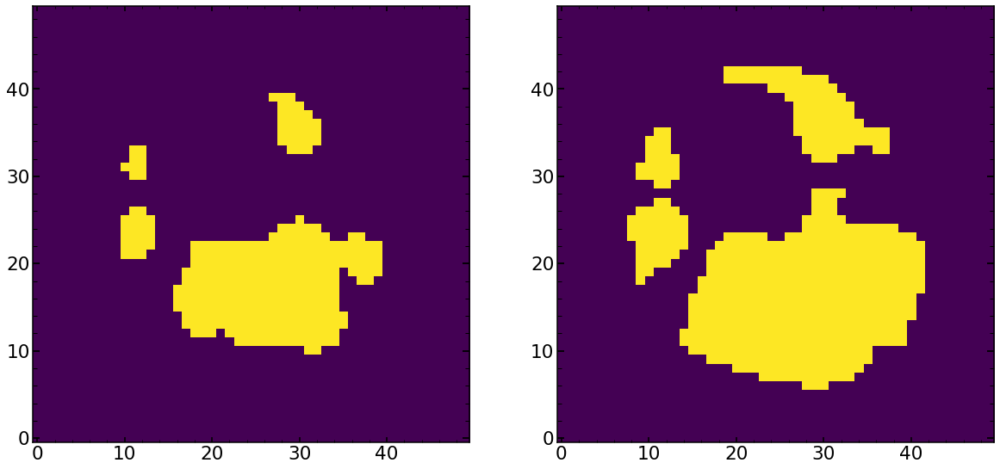

In [38]:
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.imshow(list_of_flux_images[1])
plt.subplot(122)
plt.imshow(list_of_flux_images_2[1])

In [53]:
global_change_2

array([ 19.010498, -17.738403, -45.690063, ..., -38.282104, -15.227783,
        12.868408], dtype=float32)

In [54]:
global_change_proposed_2

array([[  7604.19921875,  -7095.36132812, -18276.02539062, ...,
        -15312.84179687,  -6091.11328125,   5147.36328125],
       [   850.17531838,   -793.28551273,  -2043.3217566 , ...,
         -1712.02775933,   -681.00716778,    575.49271009],
       [  9313.2039942 ,  -8690.00739729, -22383.46836659, ...,
        -18754.32445715,  -7460.05975228,   6304.2067799 ],
       ...,
       [  3932.92241728,  -3669.74941389,  -9452.43383162, ...,
         -7919.86336007,  -3150.34828532,   2662.2369899 ],
       [ 39512.57819325, -36868.57895512, -94965.01361094, ...,
        -79567.86000136, -31650.35303335,  26746.48418442],
       [  3969.50852993,  -3703.88735285,  -9540.36534214, ...,
         -7993.53809409,  -3179.65448184,   2687.00251845]])

In [63]:
best_result_1

array([-5.46463866, -6.38387028])

In [783]:
finalAr

,fiber,xc,yc,wavelength,close,lamp,xc_effective,second_offset,second_ratio,second2_offset,second2_ratio
0,650,69,808,690.9346,0,HgAr,69,-19.25,0.0034,-40.7,0.006
1,650,69,875,696.7261,1,Ar,69,0,0,0,0
2,650,70,992,706.8989,0,Ar,70,-39.597,0.0143,0,0
3,650,71,1229,727.47876,1,Ar,71,0,0,0,0
4,650,72,1358,738.6248,0,Ar,72,-13.14,0.011,0,0
...,...,...,...,...,...,...,...,...,...,...,...
115,2,4002,2379,826.6699,1,Ar,4071,0,0,0,0
116,2,4003,2681,852.4029,1,Ar,4072,0,0,0,0
117,2,4008,3393,912.5693,1,Ar,4077,0,0,0,0
118,2,4009,3515,922.7301,0,Ar,4078,-35.264,0.0124,0,0


In [791]:
print('Ar: '+str(finalAr[finalAr['fiber']==650]['wavelength'].values[1:]))
print('Ne: '+str(finalNe[finalNe['fiber']==650]['wavelength'].values[0:]))
print('Kr: '+str(finalKr[finalKr['fiber']==650]['wavelength'].values[0:]))

Ar: ['696.7261' '706.8989' '727.47876' '738.6248' '763.74286' '795.0522'
 '826.6699' '852.4029' '912.5693' '922.7301' '966.0642']
Ne: ['650.84186' '653.4774' '660.0668' '668.01764' '671.9268' '693.13116'
 '717.59015' '724.72437' '744.1276']
Kr: [785.48 819.0 877.68 892.87]


In [ ]:
np.sum(np.abs(I-M0)) before iteration 1_0: 775113.5
np.sum(np.abs(I_std-M0_std)) before iteration 1_0: 48524.547

In [56]:
array_of_wavefront_changes_2

array([[  -1904.19921875,     185.27264409,   -1213.44229421, ...,
          -1857.91907559,   -6045.85527738,      52.60935702],
       [ -16824.12109375,   -1487.05617399,  -19411.6081916 , ...,
          -8652.40911474,  -84240.59140609,   -7588.74681561],
       [ -28173.97460937,   -2760.42482639,  -33218.51354669, ...,
         -13375.07782913, -143172.01325055,  -13546.27220628],
       ...,
       [ -10958.44726562,   -1468.5223586 ,  -11678.79153706, ...,
          -2309.38666811,  -47300.21014943,   -4679.19958004],
       [  -2219.921875  ,    -493.93300407,   -1110.94167363, ...,
           1854.93909148,     700.7701656 ,     517.12143177],
       [   8458.17871094,     706.64606733,   11804.58503496, ...,
           6515.97516842,   57398.83596998,    6432.37326692]])

In [73]:
    m_factor=90
    list_of_flux_mask=[]
    for i in range(9):

        sci_image=list_of_sci_images[i]
        var_image=list_of_var_images[i]

        #model_image_original_0=list_of_single_model_image_original[i]

        mean_value_of_background_via_var=np.mean([np.median(var_image[0]),np.median(var_image[-1]),\
                                              np.median(var_image[:,0]),np.median(var_image[:,-1])])*m_factor

        mean_value_of_background_via_sci=np.mean([np.median(sci_image[0]),np.median(sci_image[-1]),\
                                              np.median(sci_image[:,0]),np.median(sci_image[:,-1])])*m_factor

        mean_value_of_background=np.max([mean_value_of_background_via_var,mean_value_of_background_via_sci])

        model_image_original_0_flux_cut=sci_image>mean_value_of_background
        print((mean_value_of_background))
        print(np.sum(model_image_original_0_flux_cut))
        list_of_flux_mask.append(model_image_original_0_flux_cut)


1357.232437133789
1076
2057.2915649414062
581
4220.008964538574
4
379.49352264404297
59
315.3617763519287
24
315.5838632583618
54
576.5549468994141
751
521.7863416671753
1028
845.5454063415527
1184


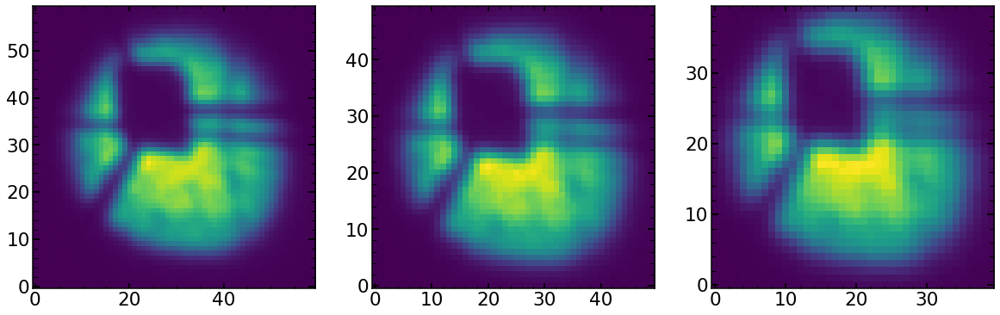

In [72]:
plt.figure(figsize=(20,10))

plt.subplot(131)
plt.imshow(list_of_sci_images[0])
plt.subplot(132)
plt.imshow(list_of_sci_images[1])
plt.subplot(133)
plt.imshow(list_of_sci_images[2])

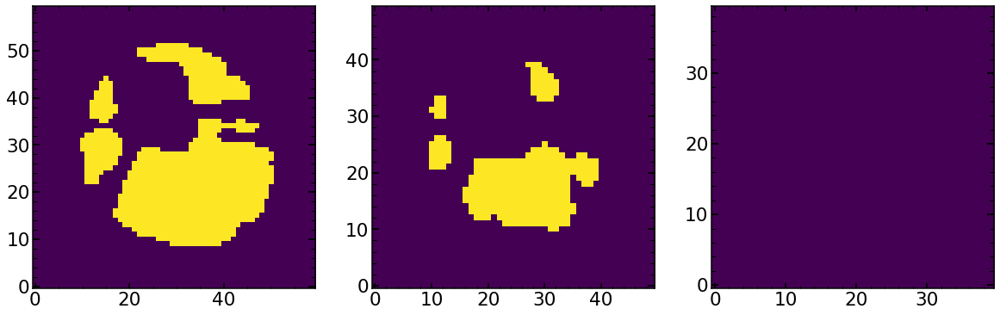

In [70]:
plt.figure(figsize=(20,10))

plt.subplot(131)
plt.imshow(list_of_flux_images[0])
plt.subplot(132)
plt.imshow(list_of_flux_images[1])
plt.subplot(133)
plt.imshow(list_of_flux_images[2])

In [71]:
list_of_flux_images[2]

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

# Fibers 

In [7]:
from astropy.io import fits

In [36]:
pfsConfig=fits.open('/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/pfsConfig-0x00000000deadbeef-046854.fits')

pfsConfig_43709 = fits.open('/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/pfsConfig-0x0000010001001010-043709.fits')

In [40]:
list_of_fibers_SuNNs=[]
for i in range(254):
    list_of_fibers_SuNNs.append(pfsConfig[1].data[i][0])
    
array_of_fibers_SuNNs=np.array(list_of_fibers_SuNNs)

list_of_fibers_DcB_10=[]
for i in range(10):
    list_of_fibers_DcB_10.append(pfsConfig_43709[1].data[i][0])
    
array_of_fibers_DcB_10=np.array(list_of_fibers_DcB_10)




array([ 63, 255, 401, 464, 525, 587], dtype=int32)

In [31]:
np.intersect1d(array_of_fibers_DcB_10,array_of_fibers_SuNNs)

array([  3,   6,   9,  12,  15,  18,  21,  24,  27,  30,  32,  35,  38,
        41,  46,  49,  52,  55,  58,  61,  63,  66,  69,  72,  75,  78,
        81,  84,  87,  90,  95,  98, 101, 104, 107, 110, 113, 116, 119,
       122, 124, 127, 130, 133, 138, 141, 144, 147, 150, 153, 155, 156,
       157, 158, 159, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170,
       171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 187,
       189, 191, 193, 195, 197, 199, 201, 203, 205, 208, 210, 212, 215,
       217, 219, 221, 223, 225, 227, 231, 233, 235, 238, 240, 242, 245,
       247, 249, 251, 253, 255, 257, 259, 261, 263, 266, 268, 270, 275,
       278, 281, 284, 287, 290, 293, 296, 299, 302, 304, 306, 308, 311,
       313, 315, 338, 341, 344, 347, 349, 351, 354, 357, 360, 363, 366,
       369, 372, 375, 378, 381, 385, 387, 389, 391, 393, 395, 397, 399,
       401, 403, 406, 408, 410, 413, 415, 417, 419, 421, 423, 425, 429,
       431, 433, 436, 438, 440, 443, 445, 447, 449, 451, 453, 45

In [35]:
from astropy.io import fits
detector_map_fits = fits.open('/Users/nevencaplar/Documents/PFS/Tickets/PIPE2D-547 (Negative values in LSF)/pfsDetectorMap-000000-r1.fits')

detector_map_fits_43709 = fits.open('/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/pfsConfig-0x0000010001001010-043709.fits')

    
blue_fibers=[]
for i in [32, 111, 223, 289, 418, 518, 620]:
    vi=list(detector_map_fits[1].data).index(i)
    y_pixel_339=detector_map_fits[4].data[detector_map_fits[4].data['index']==vi]['knot']
    x_pixel_339=detector_map_fits[3].data[detector_map_fits[3].data['index']==vi]['value']
    blue_fibers.append([x_pixel_339,y_pixel_339])
    
green_fibers=[]
for i in [63, 192, 255, 401, 464, 525, 587]:
    vi=list(detector_map_fits[1].data).index(i)
    y_pixel_339=detector_map_fits[4].data[detector_map_fits[4].data['index']==vi]['knot']
    x_pixel_339=detector_map_fits[3].data[detector_map_fits[3].data['index']==vi]['value']
    green_fibers.append([x_pixel_339,y_pixel_339[0:len(x_pixel_339)]])
    
orange_fibers=[]
for i in [12, 60, 110, 161, 210, 259, 341]:
    vi=list(detector_map_fits[1].data).index(i)
    y_pixel_339=detector_map_fits[4].data[detector_map_fits[4].data['index']==vi]['knot']
    x_pixel_339=detector_map_fits[3].data[detector_map_fits[3].data['index']==vi]['value']
    orange_fibers.append([x_pixel_339,y_pixel_339])
    
yellow_fibers=[]
for i in [347, 400, 449, 466, 545, 593, 641]:
    vi=list(detector_map_fits[1].data).index(i)
    y_pixel_339=detector_map_fits[4].data[detector_map_fits[4].data['index']==vi]['knot']
    x_pixel_339=detector_map_fits[3].data[detector_map_fits[3].data['index']==vi]['value']
    yellow_fibers.append([x_pixel_339,y_pixel_339])
    
red_fibers=[]
for i in [2, 3, 308, 339, 340, 342, 649,650]:
    vi=list(detector_map_fits[1].data).index(i)
    y_pixel_339=detector_map_fits[4].data[detector_map_fits[4].data['index']==vi]['knot']
    x_pixel_339=detector_map_fits[3].data[detector_map_fits[3].data['index']==vi]['value']
    red_fibers.append([x_pixel_339,y_pixel_339[0:len(x_pixel_339)]])

Text(0.5, 1.0, 'Avaliable dummy cable fibers')

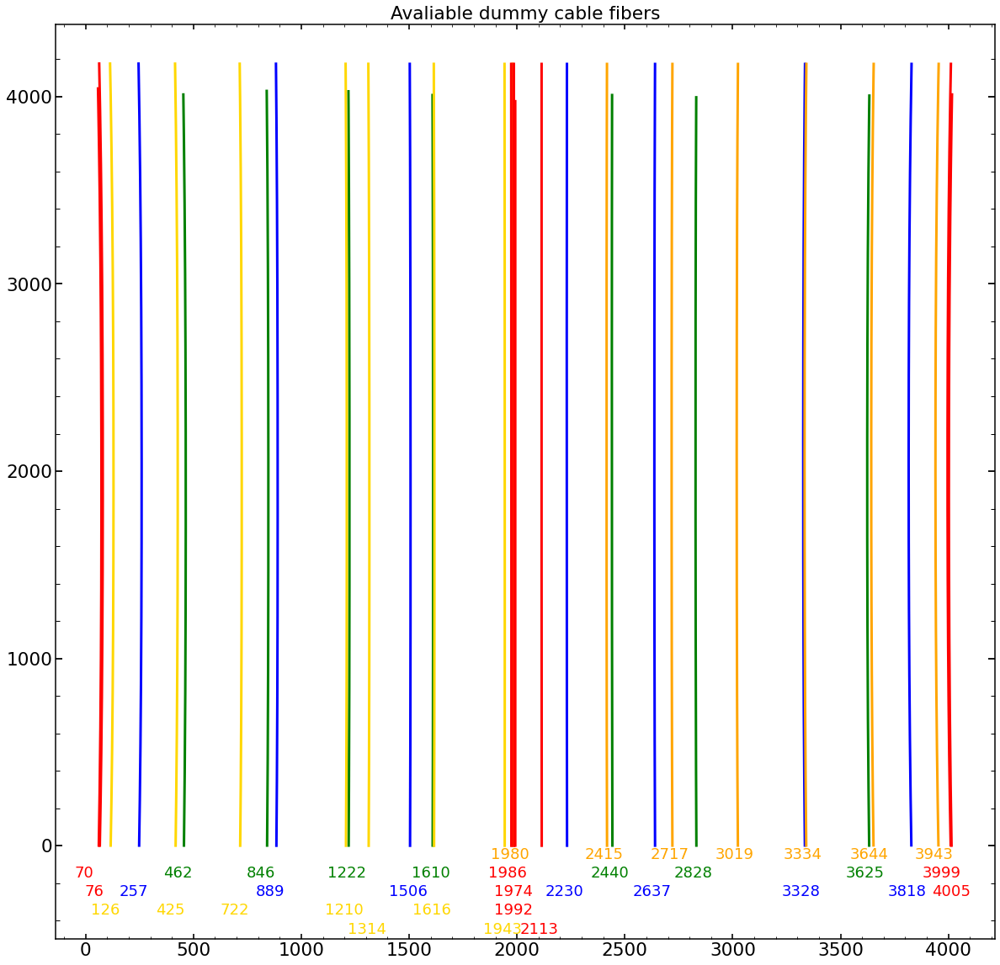

In [34]:
plt.figure(figsize=(20,20))
for i in range(len(blue_fibers)):
    plt.plot(blue_fibers[i][0],blue_fibers[i][1],color='blue',lw='3')
    plt.text(x=np.median(blue_fibers[i][0])-100,y=-270,s=np.int(np.median(blue_fibers[i][0])),color='blue')   
    
for i in range(len(green_fibers)):
    plt.plot(green_fibers[i][0],green_fibers[i][1],color='green',lw='3')
    plt.text(x=np.median(green_fibers[i][0])-100,y=-170,s=np.int(np.median(green_fibers[i][0])),color='green')   
    
for i in range(len(orange_fibers)):
    plt.plot(orange_fibers[i][0],orange_fibers[i][1],color='orange',lw='3')
    plt.text(x=np.median(orange_fibers[i][0])-100,y=-70,s=np.int(np.median(orange_fibers[i][0])),color='orange')
    
for i in [1,3,4,5,6]:
    plt.plot(yellow_fibers[i][0],yellow_fibers[i][1],color='gold',lw='3')
    plt.text(x=np.median(yellow_fibers[i][0])-100,y=-370,s=np.int(np.median(yellow_fibers[i][0])),color='gold',rotation='0')

for i in [0,2]:
    plt.plot(yellow_fibers[i][0],yellow_fibers[i][1],color='gold',lw='3')
    plt.text(x=np.median(yellow_fibers[i][0])-100,y=-470,s=np.int(np.median(yellow_fibers[i][0])),color='gold',rotation='0')

for i in [1,4,7]:
    plt.plot(red_fibers[i][0],red_fibers[i][1],color='red',lw='3')
    plt.text(x=np.median(red_fibers[i][0])-120,y=-170,s=np.int(np.median(red_fibers[i][0])),color='red',rotation='0')
 
for i in [0,5,6]:
    plt.plot(red_fibers[i][0],red_fibers[i][1],color='red',lw='3')
    plt.text(x=np.median(red_fibers[i][0])-80,y=-270,s=np.int(np.median(red_fibers[i][0])),color='red',rotation='0')
    
for i in [3]:
    plt.plot(red_fibers[i][0],red_fibers[i][1],color='red',lw='3')
    plt.text(x=np.median(red_fibers[i][0])-100,y=-370,s=np.int(np.median(red_fibers[i][0])),color='red',rotation='0')

for i in [2]:
    plt.plot(red_fibers[i][0],red_fibers[i][1],color='red',lw='3')
    plt.text(x=np.median(red_fibers[i][0])-100,y=-470,s=np.int(np.median(red_fibers[i][0])),color='red',rotation='0')
    
plt.ylim(-500)
plt.title('Avaliable dummy cable fibers')

In [ ]:
# intersect 10 dcb and SuNNs
np.intersect1d(array_of_fibers_DcB_10,array_of_fibers_SuNNs)

In [14]:
arc='Kr'


if str(arc)=="Ar":
    single_number_focus=34341+48
elif str(arc)=="Ne":
    single_number_focus=34217+48
elif str(arc)=="Kr":
    single_number_focus=34561+48
else:
    print('Arc line specified is '+str(arc))
    print("Not recognized arc-line")  

In [111]:
swarm1=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Apr1421/chainApr1421_Single_P_3431326NeSwarm1.npy')

In [112]:
swarm1.shape

(41, 480, 129)

In [114]:
swarm1[0][0]

array([   -7.2703918 ,     1.28383317,     0.19852321,     0.41319299,
          -0.00584789,    -0.30183799,     0.00449939,     0.48439376,
           0.02524583,     0.59744307,     0.02827298,     0.22249764,
           0.01715044,    -0.41951029,     0.03460542,     0.06038738,
           0.00556242,    -0.08258233,    -0.00595916,    -0.12317385,
           0.02829935,    -0.01732985,     0.00840158,     0.02168167,
          -0.0075256 ,     0.04113563,    -0.01519345,     0.05135553,
           0.00336808,    -0.01497725,    -0.01065364,     0.02982957,
          -0.00267729,    -0.02089847,    -0.00241667,    -0.00755018,
          -0.02590374,     0.03732016,     0.68128881,     0.09965864,
          -0.18494782,    -0.08569265,     0.05212377,     0.07006405,
           0.25      ,     0.25      ,     0.25      ,     1.        ,
           0.03429729,    -0.11328862,     0.97774526,     0.03774878,
           0.63524902,     1.01695081,     0.69447008, 54008.94207197,
      

In [117]:
swarm1[0][0]

array([   -7.2703918 ,     1.28383317,     0.19852321,     0.41319299,
          -0.00584789,    -0.30183799,     0.00449939,     0.48439376,
           0.02524583,     0.59744307,     0.02827298,     0.22249764,
           0.01715044,    -0.41951029,     0.03460542,     0.06038738,
           0.00556242,    -0.08258233,    -0.00595916,    -0.12317385,
           0.02829935,    -0.01732985,     0.00840158,     0.02168167,
          -0.0075256 ,     0.04113563,    -0.01519345,     0.05135553,
           0.00336808,    -0.01497725,    -0.01065364,     0.02982957,
          -0.00267729,    -0.02089847,    -0.00241667,    -0.00755018,
          -0.02590374,     0.03732016,     0.68128881,     0.09965864,
          -0.18494782,    -0.08569265,     0.05212377,     0.07006405,
           0.25      ,     0.25      ,     0.25      ,     1.        ,
           0.03429729,    -0.11328862,     0.97774526,     0.03774878,
           0.63524902,     1.01695081,     0.69447008, 54008.94207197,
      

In [124]:
/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci3438315Ar_Stacked.npy

34389

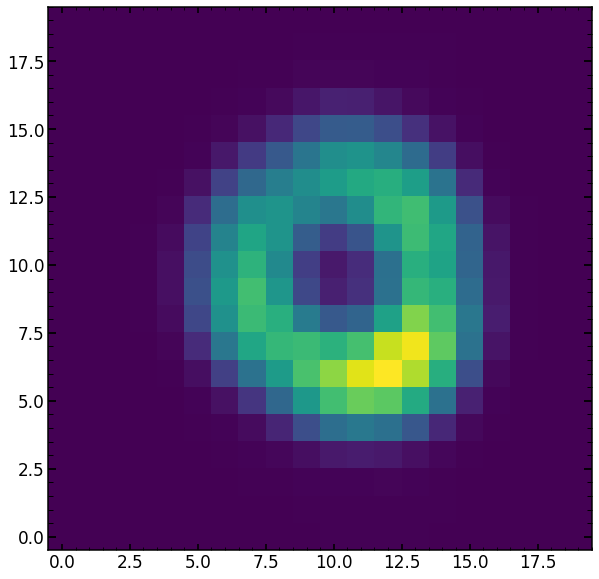

In [134]:
sci_0=np.load('/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci3438955Ar_Stacked.npy')

sci_m05=np.load('/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci3438355Ar_Stacked.npy')
sci_p05=np.load('/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci3439555Ar_Stacked.npy')

sci_m1=np.load('/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci3437755Ar_Stacked.npy')
sci_p1=np.load('/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci3440155Ar_Stacked.npy')

plt.figure(figsize=(20,10))
plt.imshow(sci_m1)

In [135]:
list_of_swarm[i]

NameError: name 'list_of_swarm' is not defined

In [142]:
34444,34445,34446,34447,34448,34449

In [ ]:
/projects/HSC/PFS/Subaru/raw/2020-11-14/sps/PFSA03444412.fits

In [11]:
finalAr[finalAr['fiber']==339]

,fiber,xc,yc,wavelength,close,lamp,xc_effective,second_offset,second_ratio,second2_offset,second2_ratio
60,339,1992,771,690.9346,0,HgAr,1992,-19.25,0.0034,-40.7,0.006
61,339,1992,836,696.7261,1,Ar,1992,0,0,0,0
62,339,1992,952,706.8989,0,Ar,1992,-39.597,0.0143,0,0
63,339,1992,1187,727.47876,1,Ar,1992,0,0,0,0
64,339,1992,1314,738.6248,0,Ar,1992,-13.14,0.011,0,0
65,339,1992,1603,763.74286,1,Ar,1992,0,0,0,0
66,339,1992,1965,795.0522,1,Ar,1992,0,0,0,0
67,339,1992,2332,826.6699,1,Ar,1992,0,0,0,0
68,339,1992,2631,852.4029,1,Ar,1992,0,0,0,0
69,339,1992,3340,912.5693,1,Ar,1992,0,0,0,0


In [39]:
out2=np.load('/Volumes/Saturn_USA/PFS/TigerAnalysis/Tokovinin/out2.npy',allow_pickle=True)
for i in range(160):
    print(i)
    # old version - 0, new version, after 0.45 - 0
    likelihood_single_particle=out2[i][0]
    print(likelihood_single_particle)
    # old version - 3/4, new version, after 0.45 - 8
    position_single_particle=out2[i][8]
    print(position_single_particle[0])
    print('#####')

0
-6.064726087782118
-7.8739567487534385
#####
1
-25.615413771735298


IndexError: tuple index out of range

In [37]:
len(out2[12])

15

In [41]:
len(out2[1])

7

In [42]:
out2[1]

(-25.615413771735298,
 [-37.293968200683594,
  -42.46435546875,
  -39.72976303100586,
  -10.779948234558105,
  -5.884214401245117,
  -9.293787002563477,
  -24.015832901000977,
  -26.821361541748047,
  -34.2554931640625],
 [array([[1.3813158, 1.4916842, 1.6092093, ..., 2.771121 , 2.5700014,
          2.386519 ],
         [1.468745 , 1.5885726, 1.7166556, ..., 3.01544  , 2.7869802,
          2.5793357],
         [1.5616666, 1.691802 , 1.831352 , ..., 3.2865574, 3.025881 ,
          2.7903032],
         ...,
         [1.4827805, 1.6453143, 1.8356569, ..., 2.5888412, 2.3794477,
          2.1945422],
         [1.397361 , 1.5378103, 1.68559  , ..., 2.3995163, 2.2106671,
          2.0432448],
         [1.3062449, 1.4228389, 1.5376579, ..., 2.2200294, 2.049672 ,
          1.8982122]], dtype=float32),
  array([[1.9260523, 2.116016 , 2.3234575, ..., 4.2296033, 3.8336723,
          3.4809306],
         [2.0755363, 2.285836 , 2.5166461, ..., 4.758437 , 4.285761 ,
          3.8693762],
         [2.

# Others 

In [ ]:
# from Sep 2017 to April 2018
503.75

In [ ]:
# from April 2018 to Aug 2018
503.75+270.83

In [143]:
# from Aug 2018 to June 2019
519.25+279.17

798.4200000000001

In [ ]:
#July 2019
537.08+288.75

In [ ]:
#Jan  2020
537.08+317.63

In [166]:
# 2017
print('###')
print((1/0.093)*503.75*12)
print(503.75*4)
# 2018
print(503.75*3+(503.75+270.83)*5+(519.25+279.17)*4)
# 2019
print('###')
print((1/0.093)*519.25*12)
print((519.25+279.17)*5+(537.08+288.75)*7)
#2020
print((537.08+317.63)*12)
#2020
print('###')
print((1/0.093)*537.075*12)
print((537.08+317.63)*3+(537.08+1300))

###
64999.99999999999
2015.0
8577.83
###
67000.0
9772.91
10256.52
###
69300.0
4401.21


In [150]:
#IRA
2015+8577+9773+10256+4401

35022

In [151]:
# IRA + Roth + Taxable
35022+23500+1700

60222

In [ ]:
9000

In [169]:
f=0.25
(65000*(12))*f/12+(67000*(9))*f/12+(69300*(36+8-21))*f/12

62018.75

In [177]:
f=0.25
(65000*(12))*f/12+(67000*(9))*f/12+(69300*(36+8-21))*f/12

62018.75

In [175]:
f=0.25
(65000*(12))*f/12+(67000*(9))*f/12+(69300*(36+8-21+4))*f/12

67793.75

In [174]:
(537.08+1300)*4

7348.32

In [153]:
3049200*0.2

609840.0

In [170]:
69300/12*0.25

1443.75

In [171]:
69300/12*0.093

537.075

In [172]:
1443.75-537.075

906.675

In [178]:
38951.03246283531/3600

10.819731239676475

In [179]:
135548.1275780201/3600

37.65225766056114

In [180]:
19714.565858840942/3600

5.476268294122484

In [812]:
69300*(34.5)/(15.5)*1.5

231372.58064516127

In [855]:
list_of_values=[]
for i in np.arange(34.5,40,0.1):
    list_of_values.append([i,71300*(34.5)/(10+40-i)*1.5])
    
array_of_values=np.array(list_of_values) 

list_of_values=[]
for i in np.arange(34.5,40,0.1):
    list_of_values.append([i,71300*(34.5)/(10+40-i)*2])
    
array_of_values_2=np.array(list_of_values) 

list_of_2ndvalues=[]
for i in np.arange(34.5,40,0.1):
    list_of_2ndvalues.append([i,230000*(1.1**(i-34.5))+0*12000*(i-34.5)])
    
array_of_2ndvalues_0=np.array(list_of_2ndvalues)

list_of_2ndvalues=[]
for i in np.arange(34.5,40,0.1):
    list_of_2ndvalues.append([i,230000*(1.1**(i-34.5))+69300*0.093*(i-34.5)*(1.1**(i-34.5))])
    
array_of_2ndvalues_93=np.array(list_of_2ndvalues)


list_of_2ndvalues=[]
for i in np.arange(34.5,40,0.1):
    list_of_2ndvalues.append([i,230000*(1.1**(i-34.5))+(69300*0.093*(i-34.5)+12000*(i-34.5))*(1.1**(i-34.5))])
    
array_of_2ndvalues_93p=np.array(list_of_2ndvalues)



list_of_2ndvalues=[]
for i in np.arange(34.5,40,0.1):
    list_of_2ndvalues.append([i,270000*(1.1**(i-34.5))+(69300*0.093*(i-34.5)+12000*(i-34.5))*(1.1**(i-34.5))])
    
array_of_2ndvalues_93b=np.array(list_of_2ndvalues)

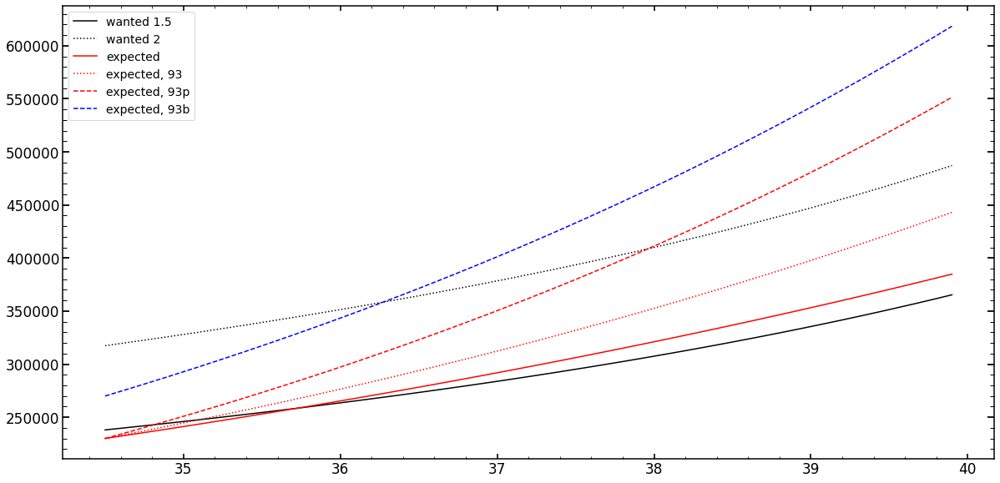

In [856]:
plt.figure(figsize=(20,10))
plt.plot(array_of_values[:,0],array_of_values[:,1],color='black',label='wanted 1.5')
plt.plot(array_of_values[:,0],array_of_values_2[:,1],color='black',label='wanted 2',ls=':')
plt.plot(array_of_2ndvalues[:,0],array_of_2ndvalues[:,1],color='red',label='expected')
plt.plot(array_of_2ndvalues[:,0],array_of_2ndvalues_93[:,1],color='red',label='expected, 93',ls=':')
plt.plot(array_of_2ndvalues[:,0],array_of_2ndvalues_93p[:,1],color='red',label='expected, 93p',ls='--')
plt.plot(array_of_2ndvalues[:,0],array_of_2ndvalues_93b[:,1],color='blue',label='expected, 93b',ls='--')

plt.legend()

In [831]:
230000*(1.1**(40-34.5))

388496.94175529765

In [830]:
(40-34.5)

5.5